In [1]:
import io
import itertools
import json
import os
import re
import time  # Added for performance comparison
import urllib.parse
import warnings
from collections import defaultdict

import matplotlib
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import requests
import seaborn as sns
from adjustText import adjust_text
from goatools.anno.gaf_reader import GafReader
from goatools.anno.genetogo_reader import Gene2GoReader
from goatools.go_enrichment import GOEnrichmentStudy
from goatools.obo_parser import GODag
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.path import Path
from matplotlib.ticker import LogLocator, NullFormatter, ScalarFormatter
from pyvis.network import Network
from scipy import stats
from scipy.sparse import issparse
from scipy.stats import fisher_exact, kstest
from sklearn.metrics import silhouette_score
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests
from supervenn import supervenn
from tqdm import tqdm

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams.update({"font.size": 10})

In [29]:
1

1

# Palettes and general variables

In [2]:
cell_line_p = {
    "Caco-2": "saddlebrown",
    "SJCRH30": "darkgreen",
    "BE2C": "grey",
    "SJSA1": "teal",
    "HAP-1": "royalblue",
    "HL-60": "cyan",
    "MG63": "lime",
    "VCaP": "gold",
    "C4-2B": "orangered",
    "RWPE2": "orange",
    "22Rv1": "lightcoral",
    "RWPE1": "deeppink",
}
modification_p = {
    "CTCF": "#e5d8bd",
    "H3K4me1": "#fdcdac",
    "H3K9me3": "#b3cde3",
    "H3K36me3": "#e6f5c9",
    "H3K27me3": "#decbe4",
    "H3K4me3": "#b3e2cd",
    "H3K27ac": "#fff2ae",
}

modification_p_richer = {
    "CTCF": "#d3c09b",
    "H3K4me1": "#fabd88",
    "H3K9me3": "#9ab7d3",
    "H3K36me3": "#d7f0a8",
    "H3K27me3": "#c7aed6",
    "H3K4me3": "#9ad1b5",
    "H3K27ac": "#ffe98c",
}

class_names_p = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
    "SVA": "#765297",
    "Helitron": "#238023",
    "TE_top": "green",
    "TE_bottom": "red",
}
class_names_p_short = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
}

class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

functional_metagroups = {
    "Metabolism": [
        "Carbohydrates metabolism",
        "Metals metabolism",
        "Lipids metabolism",
        "Mitochondrion",
        "Xenobiotic metabolism",
        "Central metabolism",
        "Aminoacids metabolism",
        "Sulfur metabolism",
        "Other metabolism",
    ],
    "Proteins biogenesis": [
        "Protein ubiquitination and degradation",
        "Ribosome biogenesis and translation itself",
        "Protein folding",
    ],
    "Cellular processes": [
        "Cell cycle/cell division",
        "Cell adhesion",
        "Cell migration",
        "Cytoskeleton",
        "Cell death",
        "Exosomes and vesicles",
        "Extracellular matrix",
    ],
    "RNA biogenesis": [
        "Transcription and its regulation",
        "RNA splicing and processing",
    ],
    "DNA biogenesis": [
        "Chromatin structure",
        "DNA repair",
        "DNA recombination",
        "DNA replication",
    ],
    "Organismal processes": [
        "Embryogenesis",
        "Nervous system",
        "Sensory system",
        "Fertilization",
        "Other immune processes",
    ],
    "Signaling pathways": ["Signaling pathways"],
    "other": ["Too general", "Other"],
}

metagroup_palette = {
    "Metabolism": (0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
    "Proteins biogenesis": (1.0, 1.0, 0.7019607843137254),
    "Cellular processes": (0.7450980392156863, 0.7294117647058823, 0.8549019607843137),
    "RNA biogenesis": (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
    "DNA biogenesis": (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
    "Organismal processes": (
        0.9921568627450981,
        0.7058823529411765,
        0.3843137254901961,
    ),
    "Signaling pathways": (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
    "other": (0.9882352941176471, 0.803921568627451, 0.8980392156862745),
}

l1_subgroup_palette = {
    "L1M": "#abb9cf",  # Muted Blue-Grey
    "L1PA": "#e3c5ab",  # Pale Peach
    "L1P": "#b1ccb2",  # Soft Sage Green
    "L1PB": "#d7aaa9",  # Dusty Rose
    "L1HS": "#c1bfd8",  # Light Lavender
    "other": "lightgrey",
}


def fisher_exact_test(N_Genome, N_TSS, K, k, alternative):
    """
    Helper function to compute Fisher's exact test for one set of parameters.
    """
    table = [
        [k, N_TSS - k],
        [K - k, (N_Genome - N_TSS) - (K - k)],
    ]
    # Handle cases where k is outside bounds (due to data anomalies)
    if k is None or N_TSS - k < 0 or K - k < 0:
        return np.nan, np.nan

    odds_ratio, p_value = fisher_exact(table, alternative=alternative)
    return odds_ratio, p_value

## GO enrichment functions

In [3]:
def run_goatools_enrichment(
    gene_list,
    background_list,
    obo_path="go-basic.obo",
    gaf_path="goa_human.gaf",
    fdr_threshold=0.1,
):
    # 1. Load the Ontology DAG
    print("Loading GO DAG...")
    godag = GODag(obo_path)

    # 2. Load Human Annotations and Map Symbols manually
    print("Loading Human Annotations and mapping symbols...")
    ogaf = GafReader(gaf_path)

    # Extract associations: Symbol -> Set of GO IDs
    full_assoc = {}
    for ntf in ogaf.associations:
        symbol = ntf.DB_Symbol
        if symbol not in full_assoc:
            full_assoc[symbol] = set()
        full_assoc[symbol].add(ntf.GO_ID)

    # 3. Initialize Enrichment Study
    print("Initializing Enrichment Study...")
    goeaobj = GOEnrichmentStudy(
        background_list,
        full_assoc,
        godag,
        propagate_counts=False,
        alpha=fdr_threshold,
        methods=["fdr_bh"],
    )

    # 4. Run Study
    print(f"Running Analysis on {len(gene_list)} genes...")
    results_all = goeaobj.run_study(gene_list)

    # Filter for significant results (FDR )
    results_sig = [r for r in results_all if r.p_fdr_bh < fdr_threshold]

    # Use the precomputed population total from the study object keys you provided
    pop_total = goeaobj.pop_n

    parsed_results = []
    for res in results_sig:
        # Use the precomputed counts from the record keys you provided
        pop_count = res.pop_count
        study_count = res.study_count

        fold_enrichment = (study_count / res.study_n) / (pop_count / res.pop_n)

        parsed_results.append(
            {
                "Term ID": res.GO,
                "Term Name": res.name,
                "Term Database": res.NS,
                "P-value": res.p_uncorrected,
                "FDR": res.p_fdr_bh,  # FDR correctly distinct from P-value
                "Fold Enrichment": fold_enrichment,
                "Overlap Count": study_count,
                "Total Term Genes (Human)": pop_count,
                # Use precomputed lists from the record keys you provided
                "Overlapping Genes": sorted(res.study_items),
                "Full Term Gene List": sorted(res.pop_items),
            }
        )

    df = pd.DataFrame(parsed_results)
    if not df.empty:
        # Sort by adjusted p-value as requested
        return df.sort_values("FDR")
    else:
        print("No significant terms passed the filters.")
        return pd.DataFrame()


def run_goatools_ordered_enrichment(
    ordered_gene_list,
    obo_path="go-basic.obo",
    gaf_path="goa_human.gaf",
    fdr_threshold=0.1,
):
    """
    Performs enrichment on a sorted gene list (ranked list) using goatools.
    ordered_gene_list: List of gene symbols sorted by importance (e.g., Fold Change).
    """
    # 1. Load the Ontology DAG
    print("Loading GO DAG...")
    godag = GODag(obo_path)

    # 2. Load Human Annotations and Map Symbols manually
    print("Loading Human Annotations...")
    ogaf = GafReader(gaf_path)

    full_assoc = {}
    for ntf in ogaf.associations:
        symbol = ntf.DB_Symbol
        if symbol not in full_assoc:
            full_assoc[symbol] = set()
        full_assoc[symbol].add(ntf.GO_ID)

    # 3. Initialize Enrichment Study
    # For an ordered list, the background is the list itself (the 'population')
    print("Initializing Ordered Study...")
    goeaobj = GOEnrichmentStudy(
        ordered_gene_list,  # Background is the full ranked set
        full_assoc,
        godag,
        propagate_counts=False,
        alpha=fdr_threshold,
        methods=["fdr_bh"],
    )

    # 4. Run Study for Ordered List
    # The 'run_study' method in goatools can be called iteratively or
    # as an ordered analysis by testing the top N genes
    print(f"Running Analysis on ordered list of {len(ordered_gene_list)} genes...")
    results_all = goeaobj.run_study(ordered_gene_list)

    # Filter for significant results
    results_sig = [r for r in results_all if r.p_fdr_bh < fdr_threshold]

    parsed_results = []
    for res in results_sig:
        # Filtering based on precomputed counts confirmed by your __dict__ keys
        pop_count = res.pop_count
        study_count = res.study_count

        # Precomputed ratios and totals from your version's attributes
        fold_enrichment = (study_count / res.study_n) / (pop_count / res.pop_n)

        parsed_results.append(
            {
                "Term ID": res.GO,
                "Term Name": res.name,
                "P-value": res.p_uncorrected,
                "FDR": res.p_fdr_bh,
                "Fold Enrichment": fold_enrichment,
                "Overlap Count": study_count,
                "Total Term Genes (Human)": pop_count,
                # Using precomputed items from your version
                "Overlapping Genes": ", ".join(sorted(res.study_items)),
                "Full Term Gene List": ", ".join(sorted(res.pop_items)),
            }
        )

    df = pd.DataFrame(parsed_results)
    if not df.empty:
        return df.sort_values("FDR")
    else:
        print("No significant terms found for the ordered list.")
        return pd.DataFrame()


def save_go_network_svg(
    df,
    output_file="plots/GO_network_by_classes.svg",
    jaccard_threshold=0.1,
    top_n=5,
    font_size=10,
    palette=class_names_p,
):
    """
    Generates a static SVG network plot where ALL text elements use the provided font_size.
    - Transparent canvas.
    - Node sizes proportional to log10(Total Term Genes).
    - Node colors mapped to -log10(FDR) using 'coolwarm'.
    - Full term names with normal font weight.
    """
    # 1. Ensure output directory exists
    os.makedirs(os.path.dirname(output_file), exist_ok=True)

    # 2. Filtering and Preprocessing
    if top_n is not None:
        df_filtered = (
            df.sort_values(["class_name", "FDR"])
            .groupby("class_name")
            .head(top_n)
            .copy()
        )
    else:
        df_filtered = df.copy()

    def parse_gene_list(x):
        if isinstance(x, str):
            try:
                return ast.literal_eval(x)
            except:
                return [g.strip() for g in x.split(",")]
        return x

    df_filtered["Overlapping Genes"] = df_filtered["Overlapping Genes"].apply(
        parse_gene_list
    )

    # Calculate color and size metrics
    df_filtered["-log10FDR"] = -np.log10(df_filtered["FDR"].replace(0, 1e-15))
    df_filtered["log_pop_size"] = np.log10(
        df_filtered["Total Term Genes (Human)"].replace(0, 1)
    )

    # 3. Build Graph
    G = nx.Graph()

    # Map colors to specific classes as established
    try:
        class_color_map = dict(palette)
    except NameError:
        unique_classes = df_filtered["class_name"].unique()
        palette = list(mcolors.TABLEAU_COLORS.values())
        class_color_map = {
            cls: palette[i % len(palette)] for i, cls in enumerate(unique_classes)
        }

    class_color_map["TE_bottom"] = "red"
    class_color_map["TE_top"] = "green"

    for _, row in df_filtered.iterrows():
        cls = row["class_name"]
        term_id = row["Term ID"]

        if not G.has_node(cls):
            G.add_node(cls, label=cls, type="class", color=class_color_map[cls])

        size_val = row["log_pop_size"] * 150
        G.add_node(
            term_id,
            label=row["Term Name"],
            type="go",
            neg_log_fdr=row["-log10FDR"],
            size=size_val,
            raw_pop=row["Total Term Genes (Human)"],
        )

        G.add_edge(
            cls, term_id, weight=row["Fold Enrichment"], color=class_color_map[cls]
        )

    # 4. Inter-term Edges (Jaccard)
    unique_terms = df_filtered.drop_duplicates(subset=["Term ID"])
    term_ids = unique_terms["Term ID"].tolist()
    term_genes = unique_terms["Overlapping Genes"].tolist()

    for i in range(len(term_ids)):
        for j in range(i + 1, len(term_ids)):
            set1, set2 = set(term_genes[i]), set(term_genes[j])
            union_len = len(set1.union(set2))
            if union_len == 0:
                continue
            jaccard = len(set1.intersection(set2)) / union_len
            if jaccard >= jaccard_threshold:
                G.add_edge(
                    term_ids[i],
                    term_ids[j],
                    weight=jaccard * 5,
                    color="#E0E0E0",
                    alpha=0.3,
                )

    # 5. Plotting with Matplotlib
    fig, ax = plt.subplots(figsize=(16, 14))
    pos = nx.spring_layout(G, k=0.6, iterations=50, seed=42)

    # Draw Nodes and Edges
    class_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "class"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=class_nodes,
        node_shape="d",
        node_size=1200,
        node_color=[G.nodes[n]["color"] for n in class_nodes],
        ax=ax,
    )

    go_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "go"]
    go_colors = [G.nodes[n]["neg_log_fdr"] for n in go_nodes]
    go_sizes = [G.nodes[n]["size"] for n in go_nodes]

    norm = mcolors.Normalize(vmin=min(go_colors), vmax=max(go_colors))
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=go_nodes,
        node_shape="o",
        node_size=go_sizes,
        node_color=go_colors,
        cmap="coolwarm",
        alpha=0.8,
        ax=ax,
    )

    edges = G.edges(data=True)
    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=edges,
        width=[d["weight"] / 2 for u, v, d in edges],
        edge_color=[d.get("color", "#E0E0E0") for u, v, d in edges],
        alpha=0.4,
        ax=ax,
    )

    # 6. Legends with Unified Font Size
    # Colorbar Label
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.5, pad=0.05)
    cbar.set_label("-log10(FDR Adjusted P-value)", fontsize=font_size)
    cbar.ax.tick_params(labelsize=font_size)  # Update colorbar tick font size

    # Size Legend
    size_legend_counts = [10, 100, 1000]
    for count in size_legend_counts:
        ax.scatter(
            [], [], c="gray", alpha=0.5, s=np.log10(count) * 150, label=f"{count} genes"
        )

    # Apply font_size to legend items and legend title
    ax.legend(
        scatterpoints=1,
        labelspacing=1.2,
        title="Total Genes in Term",
        loc="lower left",
        frameon=True,
        fontsize=font_size,
        title_fontsize=font_size,
    )

    # 7. Labels with Unified Font Size
    texts = []
    for node, (x, y) in pos.items():
        label = G.nodes[node]["label"]
        texts.append(ax.text(x, y, label, fontsize=font_size, fontweight="normal"))

    # Prevent label overlaps
    adjust_text(texts, arrowprops=dict(arrowstyle="->", color="gray", lw=0.5))

    # Unified Title font size
    ax.set_title(f"GO Term Network (Top {top_n} terms per Class)", fontsize=font_size)
    ax.axis("off")
    plt.tight_layout()

    # Save with transparent background
    plt.savefig(output_file, format="svg", bbox_inches="tight", transparent=True)
    plt.close()
    print(f"SVG saved to {output_file} (All text font size: {font_size})")

## Read and prepare the main table of TEs on genes

In [4]:
TEs_on_genes = pd.read_csv(
    "../epigenomic_files/22Rv1.CTCF.chm13v2.0.mapped_on_TSS_with_TEs.bed",
    sep="\t",
    header=None,
)
TEs_on_genes.columns = [
    "Chromosome",
    "Start",
    "End",
    "Gene_name",
    "Signal",
    "Divergence_scores",
    "TE_subfamilies",
    "TE_families",
    "TE_classes",
    "Signals",
]
# TEs_on_genes = TEs_on_genes.set_index("Gene_name")


TEs_on_genes["Average_Divergence_Score"] = (
    TEs_on_genes["Divergence_scores"]
    .apply(
        lambda scores_str: (
            scores_str.split(",") if scores_str and pd.notna(scores_str) else []
        )
    )
    .apply(
        lambda scores_list: (
            pd.to_numeric(scores_list, errors="coerce") if scores_list else np.nan
        )
    )
    .apply(
        lambda numeric_scores: (
            np.nanmean(numeric_scores) if len(numeric_scores) > 0 else np.nan
        )
    )
)


for class_name in class_names:
    TEs_on_genes[f"{class_name}_number"] = TEs_on_genes["TE_classes"].apply(
        lambda str_concat: (
            len(
                [name for name in str_concat.split(",") if name == class_name]
                if str_concat and pd.notna(str_concat)
                else []
            )
        )
    )

TEs_on_genes["TE_number"] = TEs_on_genes[
    [f"{class_name}_number" for class_name in class_names]
].sum(axis=1)

TE_CLASSES_OF_INTEREST = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]


def calculate_class_averages(row):
    """
    Calculates the average divergence score for each TE class within a single gene row.
    """
    scores_str = row["Divergence_scores"]
    classes_str = row["TE_classes"]

    # Initialize a dictionary to hold scores for each class
    class_scores = defaultdict(list)

    # Handle NaNs or empty strings
    if pd.isna(scores_str) or not scores_str:
        return {f"Divergence_Avg_{cls}": np.nan for cls in TE_CLASSES_OF_INTEREST}

    try:
        # 1. Split and convert data
        scores_list = [int(s.strip()) for s in scores_str.split(",") if s.strip()]
        classes_list = [c.strip() for c in classes_str.split(",") if c.strip()]

        # Check for length mismatch
        if len(scores_list) != len(classes_list):
            # If lengths don't match, return NaNs for safety
            return {f"Divergence_Avg_{cls}": np.nan for cls in TE_CLASSES_OF_INTEREST}

        # 2. Group scores by class
        for score, cls in zip(scores_list, classes_list):
            if cls in TE_CLASSES_OF_INTEREST:
                class_scores[cls].append(score)

        # 3. Calculate mean for each class
        results = {}
        for cls in TE_CLASSES_OF_INTEREST:
            scores = class_scores[cls]
            # Use np.mean for easy calculation, returns NaN if list is empty
            results[f"Divergence_Avg_{cls}"] = np.mean(scores) if scores else np.nan

        return results

    except Exception:
        # Catch any other parsing errors (e.g., non-integer scores)
        return {f"Divergence_Avg_{cls}": np.nan for cls in TE_CLASSES_OF_INTEREST}


# --- Core Calculation ---

# 1. Apply the function to the DataFrame row-wise
class_averages_series = TEs_on_genes.apply(calculate_class_averages, axis=1)

# 2. Expand the resulting Series of dictionaries into new columns
# We reset the index to align the new DataFrame with the original
df_averages = pd.DataFrame(class_averages_series.tolist(), index=TEs_on_genes.index)

# 3. Join the new columns back to the original DataFrame
TEs_on_genes = pd.concat([TEs_on_genes, df_averages], axis=1)

TEs_on_genes

/tmp/ipykernel_141/662122781.py:35: RuntimeWarning: Mean of empty slice
  np.nanmean(numeric_scores) if len(numeric_scores) > 0 else np.nan


,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
0,chr1,8582,18582,LOC127239154,0.2922687913,"106,325,223,236,164,87,166,217,153,337,183,195...","MER4A1,MLT1I,L1M5,MLT1H2,L1MA4,AluY,MER4D1,MER...","ERV1,ERVL-MaLR,L1,ERVL-MaLR,L1,Alu,ERV1,ERV1,E...","LTR,LTR,LINE,LTR,LINE,SINE,LTR,LTR,LTR,SINE,LT...","0.2202762429,0.8299625,0.572213,.,0.5469095429...",...,0,0,0,15,193.500000,198.000000,170.166667,NaN,NaN,NaN
1,chr1,49612,59612,LOC101928626,0.4283229986,"254,194,206,281,218,126,247,133,74,89,303,395,...","L1ME4a,L2a,L2c,MIRb,LTR37B,AluSq,MLT1O,MSTA,Al...","L1,L2,L2,MIR,ERV1,Alu,ERVL-MaLR,ERVL-MaLR,Alu,...","LINE,LINE,LINE,SINE,LTR,SINE,LTR,LTR,SINE,SINE...","0.177422835,0.4724386174,0.5349553862,0.534999...",...,1,0,0,23,226.428571,201.200000,180.800000,395.0,NaN,NaN
2,chr1,107877,117877,OR4F16,-0.1430819362,"163,78,229,184,161,300,350,130,340,234","L1MA7,L1PA7,L1M4,L1MA4,L1MA4,MIR3,MIRc,L2c,MIR...","L1,L1,L1,L1,L1,MIR,MIR,L2,MIR,MIR","LINE,LINE,LINE,LINE,LINE,SINE,SINE,LINE,SINE,SINE","0.391722927,1.167674433,-0.931795,-0.111012058...",...,0,0,0,10,157.500000,NaN,306.000000,NaN,NaN,NaN
3,chr1,132287,142287,LOC127239154,-0.4371188212,"333,282,270,243,325,274,135,228,118,3,126,248,...","L1M5,L2a,L1ME3D,L2,LTR33B,MER65D,L1MA5,MLT1D,T...","L1,L2,L1,L2,ERVL,ERV1,L1,ERVL-MaLR,ERVL-MaLR,A...","LINE,LINE,LINE,LINE,LTR,LTR,LINE,LTR,LTR,SINE,...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,17,246.500000,236.250000,79.000000,NaN,NaN,NaN
4,chr1,133480,143480,LOC127239154,-0.4101818372,"333,282,270,243,135,228,118,3,126,248,347,61,2...","L1M5,L2a,L1ME3D,L2,L1MA5,MLT1D,THE1D,AluYa5,L1...","L1,L2,L1,L2,L1,ERVL-MaLR,ERVL-MaLR,Alu,L1,L2,L...","LINE,LINE,LINE,LINE,LINE,LTR,LTR,SINE,LINE,LIN...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,15,246.500000,173.000000,79.000000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,chrY,62185165,62195165,SPRY3,0.204364463,"104,94,313,226,204,196,218,269,169,234,242,225...","L1PA16,L1PA16,L2c,L2a,L2a,L2c,MIRc,L2c,MLT1A0,...","L1,L1,L2,L2,L2,L2,MIR,L2,ERVL-MaLR,MIR,MIR,MIR...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,LINE,LTR,SI...","0.17978186,0.5729008,.,.,.,.,.,0.9911925778,.,...",...,2,0,0,17,200.857143,169.000000,257.857143,295.5,NaN,NaN
38700,chrY,62301324,62311324,VAMP7,0.2318653989,"153,71,340,114,114,308,271,71,74,293,320,109,2...","L1PA17,L1PA10,L2a,L1PA17,FRAM,L2,MIRc,MER41A,M...","L1,L1,L2,L1,Alu,L2,MIR,ERV1,ERVL-MaLR,MIR,L2,A...","LINE,LINE,LINE,LINE,SINE,LINE,SINE,LTR,LTR,SIN...","-0.4256057778,0.1826155477,0.1826155477,-0.576...",...,2,0,0,23,252.090909,107.000000,169.428571,279.5,NaN,NaN
38701,chrY,62417686,62427686,IL9R,0.1765993647,"143,112,141,208,245,159,168,119,153,202,75,143...","L1MA7,L1MB3,L1M4c,L1MEb,L1ME3G,L1M4,AluJb,AluS...","L1,L1,L1,L1,L1,L1,Alu,Alu,Alu,hAT-Charlie,MIR,...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,SINE,SINE,D...","-0.1042256162,-0.06625528413,-0.3867034074,-0....",...,1,0,0,23,187.285714,NaN,159.200000,202.0,NaN,NaN
38702,chrY,62436822,62446822,WASIR1,0.8498523286,"201,228,119,149,234,150,117,103,79,120,104,116...","MLT1C2,LTR35B,AluSq2,MER66A,L1MC,AluSx,AluSx,F...","ERVL-MaLR,ERV1,Alu,ERV1,L1,Alu,Alu,Alu,Alu,Alu...","LTR,LTR,SINE,LTR,LINE,SINE,SINE,SINE,SINE,SINE...",".,.,.,.,0.8498523286,.,-0.1954545,.,.,1.807282...",...,0,0,0,16,215.000000,192.666667,124.111111,NaN,NaN,NaN


# Simple GO analysis

In [6]:
background_list = list(TEs_on_genes["Gene_name"].unique())
for gene in TEs_on_genes["Gene_name"].unique():
    print(gene)

LOC127239154
LOC101928626
OR4F16
LOC100288069
FAM87B
LINC00115
LINC01128
FAM41C
LINC02593
SAMD11
LOC107985728
NOC2L
KLHL17
PLEKHN1
PERM1
HES4
ISG15
AGRN
LOC100288175
LOC105378948
RNF223
C1orf159
LINC01342
MIR200B
MIR200A
MIR429
TTLL10
TTLL10-AS1
TNFRSF18
TNFRSF4
SDF4
B3GALT6
C1QTNF12
UBE2J2
SCNN1D
MIR6726
SNORD167
ACAP3
PUSL1
MIR6727
INTS11
CPTP
TAS1R3
MIR6808
DVL1
MXRA8
AURKAIP1
CCNL2
MRPL20-AS1
MRPL20
MRPL20-DT
ANKRD65
TMEM88B
LINC01770
VWA1
ATAD3C
ATAD3B
ATAD3A
TMEM240
SSU72
LOC105378586
FNDC10
MIB2
MMP23B
CDK11B
SLC35E2B
MMP23A
CDK11A
SLC35E2A
NADK
GNB1
GNB1-DT
CALML6
TMEM52
CFAP74
GABRD
PRKCZ-DT
PRKCZ
PRKCZ-AS1
LOC112268219
FAAP20
SKI
LOC100129534
MORN1
RER1
PEX10
PLCH2
PANK4
HES5
TNFRSF14
TNFRSF14-AS1
LOC100996583
PRXL2B
MMEL1-AS1
MMEL1
TTC34
ACTRT2
PRDM16-DT
PRDM16
MIR4251
ARHGEF16
MEGF6
MIR551A
TPRG1L
WRAP73
TP73
TP73-AS1
CCDC27
SMIM1
LRRC47
CEP104
DFFB
C1orf174
LINC01134
LINC01346
LINC01345
LINC01777
LINC01646
AJAP1
LINC02782
MIR4689
NPHP4
KCNAB2
CHD5
RPL22
RNF207-AS1
RNF207
I

In [80]:
gene_list = list(
    TEs_on_genes[~TEs_on_genes["Divergence_Avg_Retroposon"].isna()][
        "Gene_name"
    ].unique()
)

gene_list = list(TEs_on_genes[TEs_on_genes["TE_number"] == 30]["Gene_name"].unique())
gene_list

['TMEM274P',
 'UQCRHL',
 'SRARP',
 'PADI4',
 'CNR2',
 'LINC02574',
 'MIR5585',
 'THRAP3',
 'CITED4',
 'AKR1A1',
 'STIL',
 'C1orf185',
 'ECHDC2',
 'CYB5RL',
 'MRPL37',
 'MIR320B2',
 'SLC25A16',
 'NODAL',
 'LINC01514',
 'LINC01150',
 'INTS5',
 'PAAF1',
 'PAK1',
 'MIR708',
 'NEMP1',
 'GNPTAB',
 'MIR6761',
 'PTPN11',
 'DDX54',
 'FBXW8',
 'SIRT4',
 'ANAPC5',
 'MORN3',
 'TMEM120B',
 'MIR3908',
 'PSMB5',
 'SRP54-AS1',
 'SRP54',
 'COQ6',
 'RAD51-AS1',
 'RAD51',
 'LEO1',
 'ANKDD1A',
 'COMMD4',
 'HYKK',
 'FAM234A',
 'E4F1',
 'LINC02185',
 'LINC02186',
 'TMC7',
 'COG7',
 'LINC01567',
 'MIR548W',
 'LINC02129',
 'QPRT',
 'MIR762HG',
 'STX4',
 'NQO1',
 'AARS1',
 'DDX19B',
 'WFDC1',
 'ZC3H18-AS1',
 'SMYD4',
 'SHMT1',
 'LOC646030',
 'FLJ40194',
 'NME1',
 'NME1-NME2',
 'SNRPD1',
 'TMPRSS9',
 'KANK3',
 'PIN1-DT',
 'MIR1238',
 'AP1M2',
 'SMARCA4',
 'BRME1',
 'CC2D1A',
 'HSH2D',
 'FAM32A',
 'UPK1A',
 'YIF1B',
 'RYR1',
 'ACP7',
 'GMFG',
 'PVR',
 'CEACAM19',
 'TRAPPC6A',
 'BLOC1S3',
 'C5AR2',
 'ZNF541',
 'E

In [81]:
len(gene_list)

163

In [82]:
results = run_goatools_enrichment(gene_list, background_list=background_list)

Loading GO DAG...
go-basic.obo: fmt(1.2) rel(2025-10-10) 42,666 Terms
Loading Human Annotations and mapping symbols...
HMS:0:00:16.972750 972,437 annotations READ: goa_human.gaf 
Initializing Enrichment Study...

Load  Ontology Enrichment Analysis ...
 66% 18,930 of 28,738 population items found in association
Running Analysis on 163 genes...

Runing  Ontology Analysis: current study set of 163 IDs.
 73%    119 of    163 study items found in association
100%    163 of    163 study items found in population(28738)
Calculating 18,746 uncorrected p-values using fisher_scipy_stats
  18,746 terms are associated with 18,930 of 28,738 population items
   1,380 terms are associated with    119 of    163 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.1=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)


In [83]:
results

,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
1040,GO:0003723,RNA binding,MF,0.000018,0.346503,2.653832,23,1528,"[AARS1, DDX19B, DDX54, ECHDC2, EIF3L, FAM32A, ...","[A1CF, AARS1, AARS2, AATF, ABCF1, ABT1, ACAA2,..."
0,GO:1990918,double-strand break repair involved in meiotic...,BP,0.000038,0.355766,44.076687,3,12,"[BRME1, FANCD2, RAD51]","[BRIP1, BRME1, DMC1, FANCD2, HSF2BP, MAJIN, MC..."
1,GO:0072719,cellular response to cisplatin,BP,0.000190,0.987845,88.153374,2,4,"[HMOX1, RAD51]","[DDX11, HMOX1, RAD51, TIMELESS]"
2,GO:0033299,secretion of lysosomal enzymes,BP,0.000316,0.987845,70.522699,2,5,"[BLOC1S3, GNPTAB]","[BLOC1S3, BLOC1S6, GNPTAB, M6PR, NAGPA]"
1041,GO:0070182,DNA polymerase binding,MF,0.000221,0.987845,25.186678,3,21,"[FANCD2, RAD51, SMARCA4]","[ACD, CDK2AP1, CDT1, FANCD2, FANCI, HMGB1, HNR..."
...,...,...,...,...,...,...,...,...,...,...
18742,GO:0004040,amidase activity,MF,1.000000,1.000000,0.000000,0,2,[],"[ACR, FAAH]"
18743,GO:0016407,acetyltransferase activity,MF,1.000000,1.000000,0.000000,0,20,[],"[ATAT1, CREBBP, DLAT, ELP3, EP300, ESCO1, ESCO..."
18744,GO:0071713,para-aminobenzoyl-glutamate hydrolase activity,MF,1.000000,1.000000,0.000000,0,1,[],[PM20D2]
18745,GO:0050648,"5(S)-hydroxyperoxy-6E,8Z,11Z,14Z-icosatetraeno...",MF,1.000000,1.000000,0.000000,0,1,[],[OXER1]


In [43]:
results["Overlapping Genes"].apply(len)

2    278
4    526
1     33
0      6
5     32
3    165
Name: Overlapping Genes, dtype: int64

In [37]:
results_sig[0].__dict__

{'GO': 'GO:0006369',
 'name': 'termination of RNA polymerase II transcription',
 'NS': 'BP',
 'depth': 9,
 'method_flds': [NtMethodInfo(source='statsmodels', method='fdr_bh', fieldname='fdr_bh')],
 'kws': {'p_uncorrected': np.float64(3.303622412564169e-06),
  'study_items': {'POLR2A',
   'SSU72L1',
   'SSU72L2',
   'SSU72L3',
   'SSU72L4',
   'SSU72L5'},
  'pop_items': {'MAZ',
   'PCF11',
   'POLR2A',
   'SCAF8',
   'SETX',
   'SSU72',
   'SSU72L1',
   'SSU72L2',
   'SSU72L3',
   'SSU72L4',
   'SSU72L5',
   'SSU72L6',
   'TTF2',
   'XRN2'},
  'ratio_in_study': (6, 962),
  'ratio_in_pop': (14, 28738)},
 'p_uncorrected': np.float64(3.303622412564169e-06),
 'study_items': {'POLR2A',
  'SSU72L1',
  'SSU72L2',
  'SSU72L3',
  'SSU72L4',
  'SSU72L5'},
 'pop_items': {'MAZ',
  'PCF11',
  'POLR2A',
  'SCAF8',
  'SETX',
  'SSU72',
  'SSU72L1',
  'SSU72L2',
  'SSU72L3',
  'SSU72L4',
  'SSU72L5',
  'SSU72L6',
  'TTF2',
  'XRN2'},
 'ratio_in_study': (6, 962),
 'ratio_in_pop': (14, 28738),
 'study_co

# Analysis by number of all TEs and different classes in a gene TSS neighborhood

In [76]:
len(TEs_on_genes["Gene_name"].drop_duplicates()) * 0.05

1436.9

In [103]:
# gather top 5% genes by four major classes (LTR, LINE, SINE, DNA)
# add 962 genes with SVAs
# add 130 Helitrons

background_list = list(TEs_on_genes["Gene_name"].unique())

significant_terms_dfs = []
for class_name in class_names[:4]:
    print(
        f"""
    {class_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes.sort_values(f"{class_name}_number", ascending=False)[
            ["Gene_name"]
        ].drop_duplicates()["Gene_name"]
    )[:1436]
    results = run_goatools_enrichment(
        genes_by_TE_number, background_list=background_list
    )
    results["class_name"] = class_name
    significant_terms_dfs.append(results)

print(
    """
    SVA
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["Retroposon_number"] != 0]["Gene_name"].unique()
)
results = run_goatools_enrichment(genes_by_TE_number, background_list=background_list)
results["class_name"] = "SVA"
significant_terms_dfs.append(results)

print(
    """
    Helitron
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["RC_number"] != 0]["Gene_name"].unique()
)
results = run_goatools_enrichment(genes_by_TE_number, background_list=background_list)
results["class_name"] = "Helitron"
significant_terms_dfs.append(results)

print(
    """
    TE all top
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=False)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]
results = run_goatools_enrichment(genes_by_TE_number, background_list=background_list)
results["class_name"] = "TE_top"
significant_terms_dfs.append(results)

print(
    """
    TE all bottom 
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=True)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]
results = run_goatools_enrichment(genes_by_TE_number, background_list=background_list)
results["class_name"] = "TE_bottom"
significant_terms_dfs.append(results)


top_5_perc_genes_by_class_number = pd.concat(significant_terms_dfs, axis=0)
top_5_perc_genes_by_class_number[[]]


    LINE
    
    
Loading GO DAG...
go-basic.obo: fmt(1.2) rel(2025-10-10) 42,666 Terms
Loading Human Annotations and mapping symbols...
HMS:0:00:17.525544 972,437 annotations READ: goa_human.gaf 
Initializing Enrichment Study...

Load  Ontology Enrichment Analysis ...
 66% 18,930 of 28,738 population items found in association
Running Analysis on 1436 genes...

Runing  Ontology Analysis: current study set of 1436 IDs.
 68%    971 of  1,436 study items found in association
100%  1,436 of  1,436 study items found in population(28738)
Calculating 18,746 uncorrected p-values using fisher_scipy_stats
  18,746 terms are associated with 18,930 of 28,738 population items
   4,863 terms are associated with    971 of  1,436 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.1=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      93 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

    LTR
 

,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name
0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.373663e-14,6.911334e-10,2.966682,59.0,398.0,"[OR10A2, OR10A4, OR10C1, OR10H4, OR10W1, OR10X...","[CNGB1, GPR148, OR10A2, OR10A3, OR10A4, OR10A5...",LINE
5,GO:0004984,olfactory receptor activity,MF,5.893288e-14,6.911334e-10,2.981666,59.0,396.0,"[OR10A2, OR10A4, OR10C1, OR10H4, OR10W1, OR10X...","[GPR148, OR10A2, OR10A3, OR10A4, OR10A5, OR10A...",LINE
1,GO:0007608,sensory perception of smell,BP,4.899592e-13,3.061592e-09,2.812066,60.0,427.0,"[CNGA2, OR10A2, OR10A4, OR10C1, OR10H4, OR10W1...","[ADCY3, ANO9, B2M, BBS1, BBS4, BEST2, CFAP69, ...",LINE
2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,2.119053e-07,9.930941e-04,12.735249,7.0,11.0,"[NCOR1, SLC22A13, UGT1A10, UGT1A6, UGT1A7, UGT...","[INS, NCOR1, SLC22A13, UGT1A1, UGT1A10, UGT1A3...",LINE
6,GO:0004930,G protein-coupled receptor activity,MF,3.863390e-07,1.448462e-03,1.848848,74.0,801.0,"[ADGRE3, CCR3, GPR150, GPR176, GPR34, GRM4, HR...","[ACKR1, ACKR2, ACKR3, ACKR4, ADCYAP1R1, ADGRA1...",LINE
...,...,...,...,...,...,...,...,...,...,...,...
302,GO:0021915,neural tube development,BP,1.573975e-03,7.585022e-02,3.557784,8.0,45.0,"[DVL1, MARCKS, NOG, NOTCH1, PLXNA2, PROX1, SFR...","[ALDH1A2, AMBRA1, C2CD3, CECR2, DACT1, DCHS1, ...",TE_bottom
303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,1.741350e-03,8.370089e-02,2.060114,21.0,204.0,"[ADAM8, C1QTNF12, CPNE1, EFNA5, ERBB4, ERFE, G...","[ADAM8, ADRA2A, ADRA2B, ADRA2C, ADTRP, AGT, AK...",TE_bottom
321,GO:0090575,RNA polymerase II transcription regulator complex,CC,1.758681e-03,8.431772e-02,2.283309,17.0,149.0,"[ADNP, CBX3, CTNNB1, HOXB9, HYAL2, LEF1, LMO4,...","[ADNP, ANXA2, ARNT, ASCL1, ASCL2, ASCL3, ASCL4...",TE_bottom
322,GO:0043204,perikaryon,CC,1.915434e-03,9.159880e-02,2.253067,17.0,151.0,"[ADCYAP1, CDK5, CDK5R1, CNTNAP2, CPLX1, CTNND2...","[ADAM11, ADCYAP1, AMIGO1, APP, ASS1, ASTN1, AS...",TE_bottom


In [6]:


gene_lists = {}
significant_terms_dfs = []
for class_name in class_names[:4]:
    print(
        f"""
    {class_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes.sort_values(f"{class_name}_number", ascending=False)[
            ["Gene_name"]
        ].drop_duplicates()["Gene_name"]
    )[:1436]
    gene_lists.update({class_name: genes_by_TE_number})

print(
    """
    SVA
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["Retroposon_number"] != 0]["Gene_name"].unique()
)
gene_lists.update({'SVA': genes_by_TE_number})

print(
    """
    Helitron
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["RC_number"] != 0]["Gene_name"].unique()
)
gene_lists.update({'Helitron': genes_by_TE_number})

print(
    """
    TE all top
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=False)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]
gene_lists.update({'TE_top': genes_by_TE_number})

print(
    """
    TE all bottom 
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=True)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]
gene_lists.update({'TE_bottom': genes_by_TE_number})

gene_lists


    LINE

    

    LTR

    

    SINE

    

    DNA

    

    SVA

    

    Helitron

    

    TE all top

    

    TE all bottom 

    


{'LINE': ['LINC00342',
  'LOC100506076',
  'OR2D2',
  'TCHHL1',
  'LINC02658',
  'CIB3',
  'OR4X2',
  'MIR708',
  'CCDC105',
  'CUL4B',
  'DTNB',
  'SNPH',
  'LOC90246',
  'SLC1A6',
  'SAYSD1',
  'VGLL1',
  'KIFAP3',
  'ABCB7',
  'SNX12',
  'ATRN',
  'RAD54B',
  'ZDHHC13',
  'PAK1',
  'ZNF362',
  'PLAC1',
  'MIR548A1HG',
  'OR4C46',
  'ARHGEF12',
  'OR1L8',
  'UPRT',
  'RAB39B',
  'PRR20B',
  'MPRIP',
  'FAAH2',
  'SNAR-C3',
  'SNAR-C5',
  'CLCN5',
  'SNAR-A13',
  'SNAR-C4',
  'SNAR-C2',
  'LOC100289473',
  'MIR1208',
  'SNAR-A2',
  'SNAR-A3',
  'LINC02580',
  'SNAR-A1',
  'CFAP100-DT',
  'PDE6A',
  'EIF2AK4',
  'ALPL',
  'CFAP100',
  'CASP8',
  'MIR3121',
  'SNAR-A11',
  'LOC101927847',
  'MIR1277',
  'ITIH6',
  'TCEAL7',
  'SNAR-A5',
  'OR9I1',
  'OR1R1P',
  'C18orf21',
  'PRICKLE2-AS3',
  'OR3A2',
  'GBP6',
  'LOC728660',
  'TTLL11',
  'DEFB123',
  'MIR6130',
  'ATXN10',
  'OR5D13',
  'LINC01675',
  'CHRDL2',
  'DNPEP',
  'ZCCHC3',
  'MIR8061',
  'FBXL17',
  'RTL8C',
  'MS4A4E',
  '

In [16]:
for gene in gene_lists['TE_bottom']:
    print(gene)

IGF2
POU3F3
ARPP21
SIM1
HOXA7
HOXA9
HOXA10-AS
CBX4
MIR196B
HOXA3
PNKY
HOXA10
PHF23
MIR6511B1
HOXA10-HOXA9
TTTY7B
TTTY21
HOXA11
IGF2-AS
HOXA6
USP17L28
MIR483
MIR338
LINC01102
TBX3
PANTR1
TTTY21B
MIR657
TTTY7
HOXA-AS3
HOXA5
TBX5
LINC00279
MIR3065
TTTY19
HOXA11-AS
HOXA13
HOTTIP
MIR9718
SIX1
LOC145845
MIR3666
FOXP2
MIR6511A4
SNORD115-41
SNORD115-40
PROX1
SNORD115-39
SNORD115-37
LINC01414
SNORD115-35
SNORD115-34
MIR937
SCRIB
PLEC
MIR6511A3
SNORD115-38
MIR137HG
SOX2
TFAP2A-AS1
TFAP2A
USP17L27
USP17L5
EPHA7
POU4F2
ADGRL2
SATB2
DMBX1
OTX2
OTX2-AS1
MAB21L2
HOXA4
SNORD115-33
FOXC1
SHOX2
BMI1
NR2F2-AS1
NR2F2
MIR1469
ZFHX4
PRDM8-AS1
ZIC3
PRDM8
GATA3-AS1
LINC00461
GATA3
LOC101927377
MIR124-2HG
GATA2
ZNF521
MIR124-2
UNCX
NBEA
SHH
NR2F1
NR2F1-AS1
CRNDE
IRX5
PCDH7
GATA2-AS1
ZFHX3
MEF2C-AS2
SP8
LINC01833
PAX3
CCDC140
SIGIRR
SFTA3
DUX5
OTP
PAX9
SIX3-AS1
SIX3
ZIC1
TSHZ1
PTGR3
ZNF516-AS1
LINC01551
FOXG1
FOXG1-AS1
MAF
MIR9-2
FGF5
NKX6-1
NFIA
USP17L9P
USP17L29
LEF1
LEF1-AS1
FOXB1
EBF3
ZIC4
CCND1
NKX6-2
TWIS

In [8]:
gene_lists.keys()

dict_keys(['LINE', 'LTR', 'SINE', 'DNA', 'SVA', 'Helitron', 'TE_top', 'TE_bottom'])

In [77]:
TEs_on_genes.sort_values("TE_number", ascending=True)[:1436]

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
27581,chr4,83522912,83532912,PRDM8,0.2294003145,.,.,.,.,.,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
12012,chr15,34686987,34696987,LOC145845,0.2337362905,.,.,.,.,.,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
35599,chr9,16733656,16743656,BNC2-AS1,-0.002572545423,.,.,.,.,.,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
38607,chrY,10024999,10034999,TTTY21,-1.171302667,.,.,.,.,.,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
38606,chrY,10018965,10028965,TTTY7B,-0.1406244727,.,.,.,.,.,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34,chr1,603277,613277,TTLL10,0.6453698522,"81,329,88,91","AluSg,MIR,AluY,AluSp","Alu,MIR,Alu,Alu","SINE,SINE,SINE,SINE","-0.4487601714,1.123792,0.85083675,0.7530512857",...,0,0,0,4,NaN,NaN,147.250000,NaN,NaN,NaN
35315,chr8,143586906,143596906,ADGRB1,1.549899946,"269,333,273,310","MIR3,MIR3,L2,L3b","MIR,MIR,L2,CR1","SINE,SINE,LINE,LINE","0.66877078,2.169354,0.2831106735,0.5642521148",...,0,0,0,4,291.5,NaN,301.000000,NaN,NaN,NaN
13890,chr16,32700936,32710936,LOC390705,0.2706010812,"191,295,375,100","L1MEc,MIR,MIRb,AluY","L1,MIR,MIR,Alu","LINE,SINE,SINE,SINE","0.1356517288,-0.4908241667,.,.",...,0,0,0,4,191.0,NaN,256.666667,NaN,NaN,NaN
13892,chr16,33394528,33404528,SLC6A10P,0.5988578122,"326,289,238,240","L1MCb,L1M3de,MIR,L1MB3","L1,L1,MIR,L1","LINE,LINE,SINE,LINE","-0.07461228949,0.2646457192,-0.970553,0.459641...",...,0,0,0,4,285.0,NaN,238.000000,NaN,NaN,NaN


In [9]:
top_5_perc_genes_by_class_number = pd.read_csv(
    "GO_top_5_perc_genes_by_class_number_with_all.csv"
)
top_5_perc_genes_by_class_number

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name
0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.373663e-14,6.911334e-10,2.966682,59.0,398.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE
1,5,GO:0004984,olfactory receptor activity,MF,5.893288e-14,6.911334e-10,2.981666,59.0,396.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE
2,1,GO:0007608,sensory perception of smell,BP,4.899592e-13,3.061592e-09,2.812066,60.0,427.0,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE
3,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,2.119053e-07,9.930941e-04,12.735249,7.0,11.0,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE
4,6,GO:0004930,G protein-coupled receptor activity,MF,3.863390e-07,1.448462e-03,1.848848,74.0,801.0,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE
...,...,...,...,...,...,...,...,...,...,...,...,...
499,302,GO:0021915,neural tube development,BP,1.573975e-03,7.585022e-02,3.557784,8.0,45.0,"['DVL1', 'MARCKS', 'NOG', 'NOTCH1', 'PLXNA2', ...","['ALDH1A2', 'AMBRA1', 'C2CD3', 'CECR2', 'DACT1...",TE_bottom
500,303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,1.741350e-03,8.370089e-02,2.060114,21.0,204.0,"['ADAM8', 'C1QTNF12', 'CPNE1', 'EFNA5', 'ERBB4...","['ADAM8', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADTRP...",TE_bottom
501,321,GO:0090575,RNA polymerase II transcription regulator complex,CC,1.758681e-03,8.431772e-02,2.283309,17.0,149.0,"['ADNP', 'CBX3', 'CTNNB1', 'HOXB9', 'HYAL2', '...","['ADNP', 'ANXA2', 'ARNT', 'ASCL1', 'ASCL2', 'A...",TE_bottom
502,322,GO:0043204,perikaryon,CC,1.915434e-03,9.159880e-02,2.253067,17.0,151.0,"['ADCYAP1', 'CDK5', 'CDK5R1', 'CNTNAP2', 'CPLX...","['ADAM11', 'ADCYAP1', 'AMIGO1', 'APP', 'ASS1',...",TE_bottom


In [105]:
top_5_perc_genes_by_class_number.to_csv(
    "GO_top_5_perc_genes_by_class_number_with_all.csv"
)

In [10]:
top_5_perc_genes_by_class_number["class_name"].value_counts()

class_name
TE_bottom    393
SINE          48
TE_top        25
LTR           25
LINE           7
SVA            6
Name: count, dtype: int64

In [112]:
1

1

In [107]:
top_5_perc_genes_by_class_number[
    top_5_perc_genes_by_class_number["Term Database"] == "BP"
]["class_name"].value_counts()

class_name
TE_bottom    318
SINE          18
TE_top        12
LTR            7
LINE           5
SVA            2
Name: count, dtype: int64

### Analyze intersections between the selected gene sets by supervenn

In [5]:
class_names

['LINE', 'LTR', 'SINE', 'DNA', 'Retroposon', 'RC']


    LINE
    
    

    LTR
    
    

    SINE
    
    

    DNA
    
    

    SVA
    
    

    Helitron
    
    

    TE all top
    
    

    TE all bottom 
    
    


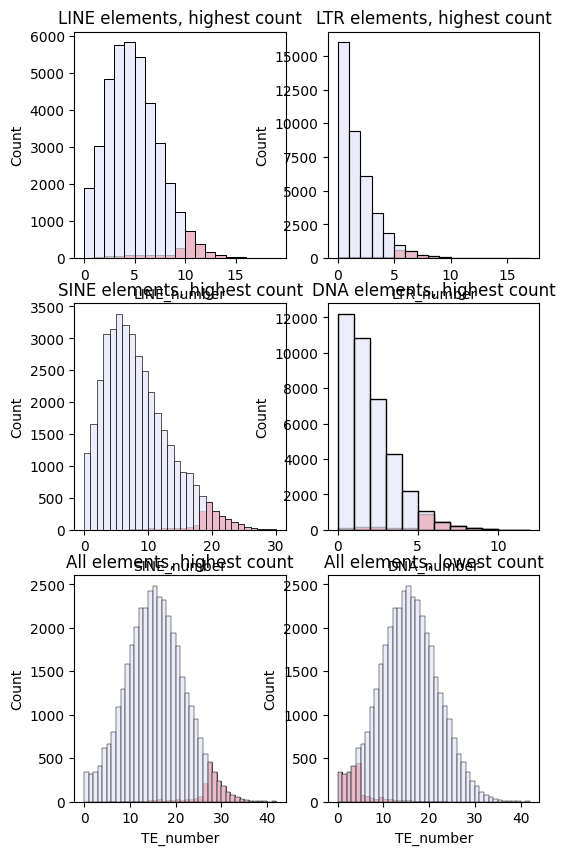

In [73]:
# gather top 5% genes by four major classes (LTR, LINE, SINE, DNA)
# add 962 genes with SVAs
# add 130 genes with Helitrons

figure, axs = plt.subplots(
    nrows=3,
    ncols=2,
    sharex=False,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(6, 10),
)
af = iter(axs.flatten())


sets_genes = []
labels_genes = []

for class_name in class_names[:4]:
    print(
        f"""
    {class_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes.sort_values(f"{class_name}_number", ascending=False)[
            ["Gene_name"]
        ].drop_duplicates()["Gene_name"]
    )[:1436]

    count_of_selected_genes = TEs_on_genes[
        TEs_on_genes["Gene_name"].isin(genes_by_TE_number)
    ][f"{class_name}_number"]
    ax = next(af)
    sns.histplot(count_of_selected_genes, binwidth=1, ax=ax, color="red")
    sns.histplot(
        TEs_on_genes[f"{class_name}_number"], binwidth=1, ax=ax, color="lavender"
    )
    ax.set_title(f"{class_name} elements, highest count")

    sets_genes.append(set(genes_by_TE_number))
    labels_genes.append(class_name)

print(
    """
    SVA
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["Retroposon_number"] != 0]["Gene_name"].unique()
)
sets_genes.append(set(genes_by_TE_number))
labels_genes.append("SVA")

print(
    """
    Helitron
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes[TEs_on_genes["RC_number"] != 0]["Gene_name"].unique()
)
sets_genes.append(set(genes_by_TE_number))
labels_genes.append("Helitron")

print(
    """
    TE all top
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=False)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]
sets_genes.append(set(genes_by_TE_number))
labels_genes.append("TE_top")

count_of_selected_genes = TEs_on_genes[
    TEs_on_genes["Gene_name"].isin(genes_by_TE_number)
]["TE_number"]
ax = next(af)
sns.histplot(count_of_selected_genes, binwidth=1, ax=ax, color="red")
sns.histplot(TEs_on_genes[f"TE_number"], binwidth=1, ax=ax, color="lavender")
ax.set_title(f"All elements, highest count")

print(
    """
    TE all bottom 
    
    """
)

genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=True)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)[:1436]

count_of_selected_genes = TEs_on_genes[
    TEs_on_genes["Gene_name"].isin(genes_by_TE_number)
]["TE_number"]
ax = next(af)
sns.histplot(count_of_selected_genes, binwidth=1, ax=ax, color="red")
sns.histplot(TEs_on_genes[f"TE_number"], binwidth=1, ax=ax, color="lavender")
ax.set_title(f"All elements, lowest count")

sets_genes.append(set(genes_by_TE_number))
labels_genes.append("TE_bottom")

plt.savefig("plots/TE_count_distribution_by_class_top_all.svg", transparent=True)

In [15]:
??supervenn

Signature:
supervenn(
    sets,
    set_annotations=None,
    figsize=None,
    side_plots=True,
    chunks_ordering='minimize gaps',
    sets_ordering=None,
    reverse_chunks_order=True,
    reverse_sets_order=True,
    max_bruteforce_size=8,
    seeds=10000,
    noise_prob=0.0075,
    side_plot_width=1,
    min_width_for_annotation=1,
    widths_minmax_ratio=None,
    side_plot_color='gray',
    dpi=None,
    ax=None,
    **kw,
)
Source:   
def supervenn(sets, set_annotations=None, figsize=None, side_plots=True,
              chunks_ordering='minimize gaps', sets_ordering=None,
              reverse_chunks_order=True, reverse_sets_order=True,
              max_bruteforce_size=DEFAULT_MAX_BRUTEFORCE_SIZE, seeds=DEFAULT_SEEDS, noise_prob=DEFAULT_NOISE_PROB,
              side_plot_width=1, min_width_for_annotation=1, widths_minmax_ratio=None, side_plot_color='gray',
              dpi=None, ax=None, **kw):
    """
    Plot a diagram visualizing relationship of multiple sets.
    :param

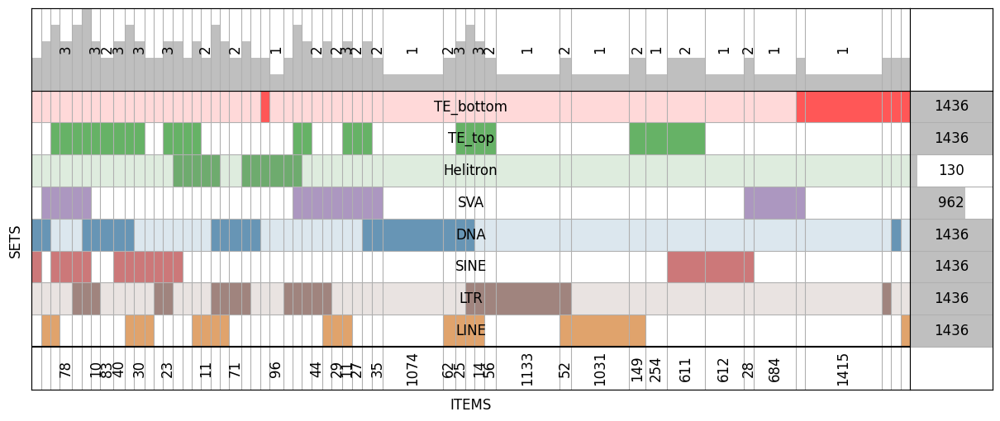

Success: SuperVenn plot with manually applied custom colors saved to plots/TE_top_5perc_genes_supervenn.svg


In [38]:
sets_colors = [class_names_p[label] for label in labels_genes]
label_to_color = {label: class_names_p[label] for label in labels_genes}


# --- 2. Plotting ---

# Figure size set to (20, 6) to give more vertical headroom
fig = plt.figure(figsize=(15, 6))

# Generate the supervenn plot
# Removed set_colors/sets_colors to avoid TypeError
sv = supervenn(
    sets_genes,
    labels_genes,
    sets_ordering=None,
    rotate_col_annotations=True,
    min_width_for_annotation=10,
    widths_minmax_ratio=0.12,
    side_plot_width=1,
    col_annotations_area_height=1,
)

# --- 3. FIX: Post-hoc Manual Coloring ---
# We access the main axis patches and update colors manually to bypass the library bug
# The main axis is typically the first one created or found via sv.axes['main']
try:
    # If the return object 'sv' has axes dictionary (version 0.4+)
    main_ax = sv.axes["main"]
except (AttributeError, TypeError):
    # Fallback for older versions: main axis is usually the first one
    main_ax = plt.gcf().axes[0]

# Update the colors of the grid rectangles
for patch in main_ax.patches:
    if isinstance(patch, plt.Rectangle):
        # The y-coordinate corresponds to the set index (0 to N-1)
        y_pos = int(round(patch.get_y()))
        if 0 <= y_pos < len(sets_colors):
            patch.set_facecolor(sets_colors[y_pos])
            patch.set_edgecolor("white")  # Subtle separator
            patch.set_linewidth(0.5)

# Also update side plot bars if they exist
try:
    side_ax = sv.axes["side"]
    for i, patch in enumerate(side_ax.patches):
        if i < len(sets_colors):
            patch.set_facecolor(sets_colors[i])
except:
    pass

# Add a title
plt.title(
    "SuperVenn Diagram of TE Gene Set Overlaps (Manual Class-Coded Colors)",
    fontsize=14,
    pad=20,
)

# --- 4. Saving ---

# Ensure the plots subdirectory exists
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_top_5perc_genes_supervenn.svg"

# Save with transparent background
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: SuperVenn plot with manually applied custom colors saved to {save_path}"
)

## Visualize network

In [5]:
def visualize_go_class_network(
    df, output_file="go_network.html", jaccard_threshold=0.1, top_n=5
):
    """
    Builds an interactive GO network with customizable term limits per class.

    Parameters:
    - csv_path: Path to your GO enrichment CSV file.
    - output_file: Name of the output HTML file.
    - jaccard_threshold: Similarity threshold (0-1) for connecting GO terms.
    - top_n: Number of top significant terms to show per class. Set to None for all.
    """

    if top_n is not None:
        # Sort by FDR and take the top N records for each class_name group
        df_filtered = (
            df.sort_values(["class_name", "FDR"]).groupby("class_name").head(top_n)
        )
    else:
        df_filtered = df.copy()

    def parse_gene_list(x):
        if isinstance(x, str):
            try:
                # Handle stringified lists often found in CSV outputs
                return ast.literal_eval(x)
            except:
                return [g.strip() for g in x.split(",")]
        return x

    df_filtered["Overlapping Genes"] = df_filtered["Overlapping Genes"].apply(
        parse_gene_list
    )

    # 2. Setup Graph and Colors
    G = nx.Graph()
    classes = df_filtered["class_name"].unique()
    color_palette = list(mcolors.TABLEAU_COLORS.values())
    class_color_map = {
        cls: color_palette[i % len(color_palette)] for i, cls in enumerate(classes)
    }

    # 3. Add Nodes and Class-to-Term Edges
    for _, row in df_filtered.iterrows():
        cls = row["class_name"]
        term_id = row["Term ID"]
        term_name = row["Term Name"]

        # Add central Group node as a Diamond
        if not G.has_node(cls):
            G.add_node(
                cls,
                label=cls,
                color=class_color_map[cls],
                size=40,
                title=f"Group: {cls}",
                shape="diamond",
                borderWidth=2,
            )

        # Log-scaling for GO node sizes based on significance
        fdr = row["FDR"] if row["FDR"] > 0 else 1e-15
        node_size = min(50, -6 * np.log10(fdr))

        # Add GO Term node
        G.add_node(
            term_id,
            label=term_name[:30] + "..",
            color="#97c2fc",
            size=node_size,
            title=f"Full Term: {term_name}<br>ID: {term_id}<br>FDR: {row['FDR']:.2e}",
            shape="dot",
        )

        # Edge width represents Fold Enrichment strength
        G.add_edge(
            cls,
            term_id,
            width=max(1, row["Fold Enrichment"] / 3),
            color=class_color_map[cls],
            alpha=0.5,
        )

    # 4. Cross-connect GO Terms (Jaccard Similarity)
    unique_terms = df_filtered.drop_duplicates(subset=["Term ID"])
    term_ids = unique_terms["Term ID"].tolist()
    term_genes = unique_terms["Overlapping Genes"].tolist()

    for i in range(len(term_ids)):
        for j in range(i + 1, len(term_ids)):
            set1, set2 = set(term_genes[i]), set(term_genes[j])
            union_len = len(set1.union(set2))
            if union_len == 0:
                continue

            jaccard = len(set1.intersection(set2)) / union_len
            if jaccard >= jaccard_threshold:
                # Gray edges represent shared genetic membership
                G.add_edge(
                    term_ids[i],
                    term_ids[j],
                    width=jaccard * 15,
                    color="#e0e0e0",
                    title=f"Shared similarity: {jaccard:.2f}",
                )

    # 5. Physics and Layout Engine
    net = Network(height="850px", width="100%", bgcolor="#ffffff", font_color="black")
    net.from_nx(G)

    # Advanced settings to ensure readability and non-overlapping labels
    net.set_options(
        f"""
    var options = {{
      "physics": {{
        "barnesHut": {{
          "gravitationalConstant": -50000,
          "centralGravity": 0.2,
          "springLength": 220,
          "springConstant": 0.04,
          "damping": 0.09,
          "avoidOverlap": 1
        }},
        "minVelocity": 0.75
      }},
      "nodes": {{
        "font": {{ "size": 16, "face": "arial" }}
      }}
    }}
    """
    )

    net.save_graph(output_file)
    print(
        f"Interactive network for top {top_n if top_n else 'all'} terms saved to {output_file}"
    )

In [47]:
dict(class_names_p)

{'LINE': '#cc660b',
 'LTR': '#70453c',
 'SINE': '#ab1f20',
 'DNA': '#195f90',
 'Retroposon': '#765297',
 'RC': '#238023'}

In [11]:
save_go_network_svg(
    top_5_perc_genes_by_class_number[
        (top_5_perc_genes_by_class_number["Total Term Genes (Human)"] < 1000)
    ],
    jaccard_threshold=0.0,
    top_n=30,
)

SVG saved to plots/GO_network_by_classes.svg (All text font size: 10)


In [32]:
df_filtered = pd.concat(
    [
        top_5_perc_genes_by_class_number[
            (top_5_perc_genes_by_class_number["Term Database"] == "BP")
            & (top_5_perc_genes_by_class_number["Total Term Genes (Human)"] < 1000)
            & (top_5_perc_genes_by_class_number["class_name"] != "TE_bottom")
        ],
        top_5_perc_genes_by_class_number[
            (top_5_perc_genes_by_class_number["Term Database"] == "BP")
            & (top_5_perc_genes_by_class_number["Total Term Genes (Human)"] < 1000)
            & (top_5_perc_genes_by_class_number["class_name"] == "TE_bottom")
        ][:30],
    ]
)

df_filtered

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name
0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.373663e-14,6.911334e-10,2.966682,59.0,398.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE
2,1,GO:0007608,sensory perception of smell,BP,4.899592e-13,3.061592e-09,2.812066,60.0,427.0,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE
3,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,2.119053e-07,9.930941e-04,12.735249,7.0,11.0,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE
5,3,GO:0007186,G protein-coupled receptor signaling pathway,BP,1.213150e-06,3.790286e-03,1.714784,85.0,992.0,"['ADGRE3', 'ARHGEF12', 'CCR3', 'CXCL8', 'GNG5B...","['ABCA1', 'ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', ...",LINE
6,4,GO:0051552,flavone metabolic process,BP,3.292184e-05,8.816469e-02,11.118075,5.0,9.0,"['UGT1A10', 'UGT1A6', 'UGT1A7', 'UGT1A8', 'UGT...","['UGT1A1', 'UGT1A10', 'UGT1A3', 'UGT1A4', 'UGT...",LINE
...,...,...,...,...,...,...,...,...,...,...,...,...
157,30,GO:0060021,roof of mouth development,BP,9.137598e-11,3.644541e-08,5.800735,20.0,69.0,"['ALX1', 'BCOR', 'BNC2', 'COL11A2', 'DLX5', 'D...","['ACVR2B', 'ALX1', 'ALX4', 'ANP32B', 'ARID5B',...",TE_bottom
158,31,GO:0021772,olfactory bulb development,BP,1.193942e-10,4.662842e-08,9.635665,13.0,27.0,"['ARX', 'EFNA2', 'EOMES', 'FEZF1', 'GSX2', 'ID...","['AGTPBP1', 'ARX', 'CHD7', 'CRTAC1', 'CSF1R', ...",TE_bottom
159,32,GO:0035116,embryonic hindlimb morphogenesis,BP,2.126494e-10,8.135358e-08,9.291534,13.0,28.0,"['CTNNB1', 'FGF8', 'NOTCH1', 'OSR1', 'OSR2', '...","['AFF3', 'ALX3', 'ALX4', 'BMP4', 'CHD7', 'CTNN...",TE_bottom
160,33,GO:0048468,cell development,BP,3.321824e-10,1.245418e-07,6.960882,16.0,46.0,"['BMP5', 'FASN', 'ID2', 'INHBA', 'IRX1', 'IRX2...","['ARID5B', 'AXIN1', 'AXIN2', 'BMP5', 'BMP6', '...",TE_bottom


In [70]:
top_5_perc_genes_by_class_number[
    top_5_perc_genes_by_class_number["Term Name"]
    == "sequence-specific double-stranded DNA binding"
]

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name
28,23,GO:1990837,sequence-specific double-stranded DNA binding,MF,4.962906e-05,4.228847e-02,0.356210,11.0,618.0,"['ZNF248', 'ZNF250', 'ZNF266', 'ZNF345', 'ZNF4...","['ABL1', 'AHR', 'ALX1', 'ALX3', 'ALX4', 'AR', ...",LTR
113,324,GO:1990837,sequence-specific double-stranded DNA binding,MF,4.280711e-85,2.674874e-81,5.731745,177.0,618.0,"['ALX1', 'ARX', 'BARHL1', 'BARHL2', 'BCL11B', ...","['ABL1', 'AHR', 'ALX1', 'ALX3', 'ALX4', 'AR', ...",TE_bottom


In [69]:
visualize_go_class_network(
    top_5_perc_genes_by_class_number[
        top_5_perc_genes_by_class_number["Total Term Genes (Human)"] < 1000
    ],
    jaccard_threshold=0.0,
    top_n=30,
)

Interactive network for top 30 terms saved to go_network.html


In [68]:
1

1

In [102]:
len(TEs_on_genes[TEs_on_genes["RC_number"] != 0]["Gene_name"].unique())

130

In [95]:
### Add top 5% by all TEs
# Bottom by all TEs
# All by SVAs
# all by Helitrons

In [89]:
len(genes_by_TE_number) * 0.05

1436.9

In [90]:
class_name

'DNA'

In [92]:
TEs_on_genes.sort_values(f"{class_name}_number", ascending=False)

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
20026,chr2,34110299,34120299,LINC01318,-0.1803771081,"354,397,143,141,72,165,128,186,310,166,353,186...","L2,L2d2,Tigger1,Tigger1,MER4E1,L1MA8,AluSg,MER...","L2,L2,TcMar-Tigger,TcMar-Tigger,ERV1,L1,Alu,hA...","LINE,LINE,DNA,DNA,LTR,LINE,SINE,DNA,DNA,SINE,S...","-0.599656058,-0.5517172686,-0.3643285086,-0.25...",...,12,0,0,22,305.333333,197.333333,192.500000,186.833333,NaN,NaN
1867,chr1,113863298,113873298,AP4B1-AS1,-0.04441421826,"280,132,149,266,100,108,112,102,76,103,168,135...","L1ME4a,L1PA16,MER5A,Charlie19a,AluSp,Charlie5,...","L1,L1,hAT-Charlie,hAT-Charlie,Alu,hAT-Charlie,...","LINE,LINE,DNA,DNA,SINE,DNA,SINE,SINE,SINE,DNA,...","-0.1596831089,-0.1107181073,0.69314732,0.38035...",...,11,0,0,25,211.333333,NaN,120.909091,204.000000,NaN,NaN
31987,chr6,152061889,152071889,MTHFD1L,0.5532773209,"89,341,59,223,86,79,130,143,83,132,166,140,111...","HERVK-int,L2a,L1MB3,SVA_F,LTR5B,AluSp,AluSx,Al...","ERVK,L2,L1,SVA,ERVK,Alu,Alu,Alu,TcMar-Tigger,T...","LTR,LINE,LINE,Retroposon,LTR,SINE,SINE,SINE,DN...","0.01466843224,0.5739688985,0.40550806,-0.21172...",...,11,1,0,30,153.333333,87.500000,145.307692,158.000000,223.0,NaN
31988,chr6,152062003,152072003,MTHFD1L,0.5640468841,"89,341,59,223,86,79,130,143,83,132,166,140,111...","HERVK-int,L2a,L1MB3,SVA_F,LTR5B,AluSp,AluSx,Al...","ERVK,L2,L1,SVA,ERVK,Alu,Alu,Alu,TcMar-Tigger,T...","LTR,LINE,LINE,Retroposon,LTR,SINE,SINE,SINE,DN...","0.01466843224,0.5739688985,0.40550806,-0.21172...",...,11,1,0,30,153.333333,87.500000,145.307692,158.000000,223.0,NaN
31989,chr6,152062042,152072042,MTHFD1L,0.5640468841,"341,59,223,86,79,130,143,83,132,166,140,111,24...","L2a,L1MB3,SVA_F,LTR5B,AluSp,AluSx,AluJb,MER2,M...","L2,L1,SVA,ERVK,Alu,Alu,Alu,TcMar-Tigger,TcMar-...","LINE,LINE,Retroposon,LTR,SINE,SINE,SINE,DNA,DN...","0.5739688985,0.40550806,-0.2117208293,0.143861...",...,11,1,0,29,153.333333,86.000000,145.307692,158.000000,223.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,chr1,350363,360363,SAMD11,1.148500357,"234,345,175,73","L1MEc,L2c,MIR,AluY","L1,L2,MIR,Alu","LINE,LINE,SINE,SINE","1.072562362,1.772264855,1.08907485,1.061777375",...,0,0,0,4,289.500000,NaN,124.000000,NaN,NaN,NaN
15,chr1,383041,393041,NOC2L,0.08555914433,"103,189,342,82,111","L2b,AluJb,L2a,AluSx4,AluSx","L2,Alu,L2,Alu,Alu","LINE,SINE,LINE,SINE,SINE","-0.02164143188,0.1613075714,-0.4132605749,0.05...",...,0,0,0,5,222.500000,NaN,127.333333,NaN,NaN,NaN
38672,chrY,23767149,23777149,TTTY4,-0.184367727,"186,248,178,342,241,250,177,100,127,7,32","AluSx,FLAM_C,AluSx,L1M3,LTR32,AluSx,LTR22,LTR1...","Alu,Alu,Alu,L1,ERVL,Alu,ERVK,ERV1,ERV1,Alu,L1","SINE,SINE,SINE,LINE,LTR,SINE,LTR,LTR,LTR,SINE,...",".,.,.,-0.3070270833,.,-0.4504424,0.01406026102...",...,0,0,0,11,187.000000,161.250000,173.800000,NaN,NaN,NaN
38673,chrY,23814938,23824938,BPY2,.,"147,103","AluSx,AluYk2","Alu,Alu","SINE,SINE",".,.",...,0,0,0,2,NaN,NaN,125.000000,NaN,NaN,NaN


In [78]:
genes_by_TE_number = list(
    TEs_on_genes.sort_values("TE_number", ascending=True)[
        ["Gene_name"]
    ].drop_duplicates()["Gene_name"]
)
genes_by_TE_number

['PRDM8',
 'LOC145845',
 'BNC2-AS1',
 'TTTY21',
 'TTTY7B',
 'DLX6-AS1',
 'DLX6',
 'SOX1',
 'NFIB',
 'RUNX1',
 'EBF3',
 'GATA3-AS1',
 'PRDM8-AS1',
 'OTX2-AS1',
 'OTX2',
 'PTHLH',
 'MAF',
 'FGF5',
 'TFAP2A-AS1',
 'NKX6-1',
 'NFIA',
 'ZFHX3',
 'EPHA7',
 'ARPP21',
 'BMI1',
 'SNORD115-41',
 'PAX1',
 'NKX2-2',
 'MIR124-2',
 'TTTY19',
 'LINC00279',
 'TTTY7',
 'TTTY21B',
 'TFAP2A',
 'SHOX2',
 'PAX3',
 'CCDC140',
 'DMBX1',
 'ELAVL2',
 'PHF23',
 'DUX5',
 'GATA3',
 'LINC00461',
 'HOXC-AS2',
 'MIR196A2',
 'HOXC-AS3',
 'HOXC10',
 'MIR3065',
 'MIR657',
 'HOXC8',
 'HOXC9',
 'ZFHX4',
 'LHX9',
 'MEF2C-AS2',
 'HOXC-AS1',
 'MIR9-2',
 'TWIST1',
 'NXPH4',
 'SIX3-AS1',
 'SIX3',
 'SP8',
 'LINC01833',
 'PCDH17',
 'NDUFA4L2',
 'SCX',
 'LEF1',
 'ZIC5',
 'NKX6-2',
 'ZIC2',
 'MIR6821',
 'PIM3',
 'UNCX',
 'IRX5',
 'CRNDE',
 'PROX1',
 'MYT1L',
 'FOXC1',
 'LEF1-AS1',
 'CBX4',
 'SATB2',
 'HOXC12',
 'SIGIRR',
 'SIX1',
 'MIR9718',
 'MIR338',
 'HOXC4',
 'ADGRL2',
 'LHX1-DT',
 'HOXB3',
 'HOXBLINC',
 'LINC01667',
 'MIR453

In [58]:
1

1

In [79]:
results = run_goatools_ordered_enrichment(genes_by_TE_number)

Loading GO DAG...
go-basic.obo: fmt(1.2) rel(2025-10-10) 42,666 Terms
Loading Human Annotations...
HMS:0:00:21.994483 972,437 annotations READ: goa_human.gaf 
Initializing Ordered Study...

Load  Ontology Enrichment Analysis ...
 66% 18,930 of 28,738 population items found in association
Running Analysis on ordered list of 28738 genes...

Runing  Ontology Analysis: current study set of 28738 IDs.
 66% 18,930 of 28,738 study items found in association
100% 28,738 of 28,738 study items found in population(28738)
Calculating 18,746 uncorrected p-values using fisher_scipy_stats
  18,746 terms are associated with 18,930 of 28,738 population items
  18,746 terms are associated with 18,930 of 28,738 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.1=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
No significant terms found for the 

## Classification by functional categories

In [38]:
top_5_perc_genes_by_class_number = pd.read_csv(
    "GO_top_5_perc_genes_by_class_number_with_all.csv"
)

top_5_perc_genes_classified = pd.read_csv(
    "GO_Classified_Table_Ordered_Gemini.tsv", sep="\t"
)[["Term ID", "Term Name", "Functional group"]]
top_5_perc_genes_classified.columns = [
    "Term ID Gemini",
    "Term Name",
    "Functional group Gemini",
]

top_5_perc_genes_by_class_number = top_5_perc_genes_by_class_number.merge(
    top_5_perc_genes_classified.drop_duplicates(),
    how="left",
    left_on="Term Name",
    right_on="Term Name",
).dropna()

top_5_perc_genes_by_class_number.to_csv(
    "GO_top_5_perc_genes_by_class_number_with_all_Gemini_classified.csv"
)
top_5_perc_genes_by_class_number

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional group Gemini
0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.373663e-14,6.911334e-10,2.966682,59.0,398.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,GO:0050911,Sensory system
1,5,GO:0004984,olfactory receptor activity,MF,5.893288e-14,6.911334e-10,2.981666,59.0,396.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,GO:0004984,Sensory system
2,1,GO:0007608,sensory perception of smell,BP,4.899592e-13,3.061592e-09,2.812066,60.0,427.0,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,GO:0007608,Sensory system
3,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,2.119053e-07,9.930941e-04,12.735249,7.0,11.0,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE,GO:0045922,Lipids metabolism
4,6,GO:0004930,G protein-coupled receptor activity,MF,3.863390e-07,1.448462e-03,1.848848,74.0,801.0,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE,GO:0004930,Signaling pathways
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,302,GO:0021915,neural tube development,BP,1.573975e-03,7.585022e-02,3.557784,8.0,45.0,"['DVL1', 'MARCKS', 'NOG', 'NOTCH1', 'PLXNA2', ...","['ALDH1A2', 'AMBRA1', 'C2CD3', 'CECR2', 'DACT1...",TE_bottom,GO:0021915,Embryogenesis
500,303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,1.741350e-03,8.370089e-02,2.060114,21.0,204.0,"['ADAM8', 'C1QTNF12', 'CPNE1', 'EFNA5', 'ERBB4...","['ADAM8', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADTRP...",TE_bottom,GO:0043552,Signaling pathways
501,321,GO:0090575,RNA polymerase II transcription regulator complex,CC,1.758681e-03,8.431772e-02,2.283309,17.0,149.0,"['ADNP', 'CBX3', 'CTNNB1', 'HOXB9', 'HYAL2', '...","['ADNP', 'ANXA2', 'ARNT', 'ASCL1', 'ASCL2', 'A...",TE_bottom,GO:0001228,Transcription and its regulation
502,322,GO:0043204,perikaryon,CC,1.915434e-03,9.159880e-02,2.253067,17.0,151.0,"['ADCYAP1', 'CDK5', 'CDK5R1', 'CNTNAP2', 'CPLX...","['ADAM11', 'ADCYAP1', 'AMIGO1', 'APP', 'ASS1',...",TE_bottom,GO:0043204,Too general


In [37]:
top_5_perc_genes_by_class_number[
    top_5_perc_genes_by_class_number["Term ID"]
    != top_5_perc_genes_by_class_number["Term ID Gemini"]
]

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional group Gemini
286,131,GO:0007498,mesoderm development,BP,0.000025,0.002725,4.881106,10.0,41.0,"['FOXC2', 'FOXF1', 'IKZF1', 'IRX3', 'LHX2', 'N...","['ACVR1', 'ACVR2A', 'ACVR2B', 'BMP4', 'BMX', '...",TE_bottom,GO:0001707,Embryogenesis
287,312,GO:0098839,postsynaptic density membrane,CC,0.000026,0.002725,3.027106,18.0,119.0,"['ADGRB3', 'DLG4', 'EFNB2', 'EPHA7', 'ERBB4', ...","['ABHD17A', 'ABHD17B', 'ABHD17C', 'ADAM22', 'A...",TE_bottom,GO:0045211,Nervous system
288,133,GO:0035050,embryonic heart tube development,BP,0.000027,0.002779,6.157703,8.0,26.0,"['CTNNB1', 'EDN1', 'FGF8', 'FOXC1', 'FOXC2', '...","['APELA', 'CDC42', 'CTNNB1', 'ECE1', 'EDN1', '...",TE_bottom,GO:0007510,Embryogenesis
290,134,GO:0007501,mesodermal cell fate specification,BP,0.000030,0.003087,16.010028,4.0,5.0,"['EYA1', 'HOXA11', 'PAX2', 'SIX2']","['EYA1', 'EYA2', 'HOXA11', 'PAX2', 'SIX2']",TE_bottom,GO:0001710,Embryogenesis
291,135,GO:0072178,nephric duct morphogenesis,BP,0.000030,0.003087,16.010028,4.0,5.0,"['EFNB2', 'EPHA7', 'GATA3', 'LHX1']","['EFNB2', 'EPHA4', 'EPHA7', 'GATA3', 'LHX1']",TE_bottom,GO:0001825,Embryogenesis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
496,298,GO:2000177,regulation of neural precursor cell proliferation,BP,0.001544,0.074580,7.277285,4.0,11.0,"['FOXG1', 'FOXO3', 'ID2', 'SIX3']","['FOXG1', 'FOXO1', 'FOXO3', 'ID2', 'NF2', 'NTR...",TE_bottom,GO:0048659,Nervous system
497,299,GO:0045603,positive regulation of endothelial cell differ...,BP,0.001544,0.074580,7.277285,4.0,11.0,"['CTNNB1', 'NOTCH1', 'TMEM100', 'VEZF1']","['ACVRL1', 'ATOH8', 'BMP4', 'BMP6', 'BTG1', 'C...",TE_bottom,GO:0045681,Embryogenesis
500,303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,0.001741,0.083701,2.060114,21.0,204.0,"['ADAM8', 'C1QTNF12', 'CPNE1', 'EFNA5', 'ERBB4...","['ADAM8', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADTRP...",TE_bottom,GO:0043552,Signaling pathways
501,321,GO:0090575,RNA polymerase II transcription regulator complex,CC,0.001759,0.084318,2.283309,17.0,149.0,"['ADNP', 'CBX3', 'CTNNB1', 'HOXB9', 'HYAL2', '...","['ADNP', 'ANXA2', 'ARNT', 'ASCL1', 'ASCL2', 'A...",TE_bottom,GO:0001228,Transcription and its regulation


In [29]:
top_5_perc_genes_classified.drop_duplicates()

,Term ID,Term Name Gemini,Functional group Gemini
0,GO:0050911,detection of chemical stimulus involved in sen...,Sensory system
1,GO:0004984,olfactory receptor activity,Sensory system
2,GO:0007608,sensory perception of smell,Sensory system
3,GO:0045922,negative regulation of fatty acid metabolic pr...,Lipids metabolism
4,GO:0004930,G protein-coupled receptor activity,Signaling pathways
...,...,...,...
473,GO:0021915,neural tube development,Embryogenesis
474,GO:0043552,positive regulation of phosphatidylinositol 3-...,Signaling pathways
475,GO:0001228,RNA polymerase II transcription regulator complex,Transcription and its regulation
476,GO:0043204,perikaryon,Too general


In [32]:
top_5_perc_genes_classified[["Term ID"]].drop_duplicates()

,Term ID
0,GO:0050911
1,GO:0004984
2,GO:0007608
3,GO:0045922
4,GO:0004930
...,...
472,GO:0090190
473,GO:0021915
474,GO:0043552
476,GO:0043204


In [22]:
top_5_perc_genes_classified.columns

Index(['Term ID', 'Term Name', 'Functional group', 'class_name', 'FDR',
       'Fold Enrichment', 'Overlap Count'],
      dtype='object')

In [21]:
top_5_perc_genes_classified

,Term ID,Term Name,Functional group,class_name,FDR,Fold Enrichment,Overlap Count
0,GO:0050911,detection of chemical stimulus involved in sen...,Sensory system,LINE,6.91e-10,2.97,59.0
1,GO:0004984,olfactory receptor activity,Sensory system,LINE,6.91e-10,2.98,59.0
2,GO:0007608,sensory perception of smell,Sensory system,LINE,3.06e-09,2.81,60.0
3,GO:0045922,negative regulation of fatty acid metabolic pr...,Lipids metabolism,LINE,0.00099,12.74,7.0
4,GO:0004930,G protein-coupled receptor activity,Signaling pathways,LINE,0.00145,1.85,74.0
...,...,...,...,...,...,...,...
473,GO:0021915,neural tube development,Embryogenesis,DNA,0.00253,1.82,29.0
474,GO:0043552,positive regulation of phosphatidylinositol 3-...,Signaling pathways,DNA,0.00253,2.46,16.0
475,GO:0001228,RNA polymerase II transcription regulator complex,Transcription and its regulation,DNA,0.00253,2.03,23.0
476,GO:0043204,perikaryon,Too general,DNA,0.00267,1.96,24.0


In [13]:
def classify_go_terms(df, categories=None):
    """
    Classifies GO terms into functional groups based on predefined categories.
    Handles specific user categories, 'Too general', 'Other', and 'Potential new group'.
    """
    if categories is None:
        categories = [
            "Cell adhesion",
            "Cell migration",
            "Cell cycle/cell division",
            "Cell death",
            "Cytoskeleton",
            "Signaling pathways",
            "Nervous system",
            "Sensory system",
            "Lipids metabolism",
            "Carbohydrates metabolism",
            "Xenobiotics metabolism",
            "Nucleic base metabolism",
            "DNA replication",
            "DNA repair",
            "DNA recombination",
            "Glycosaminoglycans metabolism",
            "Polyamines metabolism",
            "Metals metabolism",
            "cAMP metabolism",
            "Electron transfer chain",
            "Chromatin structure",
            "Transcription and its regulation",
            "RNA splicing and processing",
            "Posttranscriptional silencing by small RNAs",
            "Ribosome biogenesis and translation itself",
            "Protein maturation",
            "Protein ubiquitination and degradation",
            "Intracellular antiviral response",
            "T and NK cell response",
            "Viruses infection",
            "B cell response",
            "Other immune processes",
            "Embryogenesis",
        ]

    # --- Step 1: Rule-based keyword mapping ---
    # This logic identifies the core theme of the term name
    keyword_map = {
        r"smell|olfactory|sensory|ear|hearing|taste|sound|visual": "Sensory system",
        r"neuron|synapse|axon|brain|nervous|glial|neuro|spinal cord": "Nervous system",
        r"embryonic|embryo|in utero|limb|morphogenesis|somitogenesis|pattern specification|fate|commitment": "Embryogenesis",
        r"transcription|rna polymerase|promoter|cis-regulatory|dna-templated": "Transcription and its regulation",
        r"splicing|spliceosome|snrnp|mrna processing": "RNA splicing and processing",
        r"translation|ribosome": "Ribosome biogenesis and translation itself",
        r"dna repair|mismatch repair|dna damage": "DNA repair",
        r"recombination": "DNA recombination",
        r"replication|telomere maintenance|helicase": "DNA replication",
        r"signaling|signal transduction|receptor activity|wnt|notch|erbb|bmp|interleukin|kinase": "Signaling pathways",
        r"apoptosis|cell death": "Cell death",
        r"cell cycle|cell division|mitotic|meiotic|spindle|centrosome": "Cell cycle/cell division",
        r"adhesion": "Cell adhesion",
        r"migration|chemotaxis": "Cell migration",
        r"cytoskeleton|microtubule|actin|cytoplasmic": "Cytoskeleton",
        r"lipid|fatty acid|lipase": "Lipids metabolism",
        r"carbohydrate|glucose|glycolysis": "Carbohydrates metabolism",
        r"chromatin|histone|epigenetic|methylation": "Chromatin structure",
        r"ubiquitin|proteasome": "Protein ubiquitination and degradation",
        r"macrophage|immune|b cell|t cell|antiviral|leukocyte": "Other immune processes",
    }

    # --- Step 2: "Too General" and "Potential New" logic ---
    general_terms = [
        "biological_process",
        "metabolic process",
        "cellular process",
        "primary metabolic process",
        "protein binding",
        "cytoplasm",
        "membrane",
        "nucleus",
        "organelle",
        "nucleoplasm",
        "cytosol",
    ]

    # Potential new group candidates (specialized but not in original list)
    potential_new_map = {
        r"ion transport|transmembrane transport|ion channel": "Ion and Transmembrane Transport",
        r"mitochondrion|mitochondrial|energy|atp": "Mitochondrion and Energy Metabolism",
        r"transferase|enzyme binding|catalytic": "Enzyme Activity and Regulation",
        r"vesicle|exosome|golgi|endoplasmic reticulum": "Intracellular Trafficking and Organelles",
    }

    def assign_group(name):
        name_lower = name.lower()

        # Check for general terms
        if any(gen in name_lower for gen in general_terms):
            return "Too general"

        # Match against main categories
        for pattern, group in keyword_map.items():
            if re.search(pattern, name_lower):
                return group

        # Match against potential new groups
        for pattern, group in potential_new_map.items():
            if re.search(pattern, name_lower):
                return f"Potential new group: {group}"

        return "Other"

    # Apply classification
    df_classified = df.copy()
    df_classified["Functional group"] = df_classified["Term Name"].apply(assign_group)

    return df_classified

In [16]:
classified_top_5_perc_go = classify_go_terms(top_5_perc_genes_by_class_number)
classified_top_5_perc_go[["Term Name", "Functional group"]].to_csv(
    "GO_classified_results.csv", index=False
)

In [ ]:
top_5_perc_genes_by_class_number

In [ ]:
# classified with Gemini

,Column1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional group Gemini
0,0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,"7,37366E-14","6,91133E-10","2,966682297",59,398,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,GO:0050911,Sensory system
1,1,5,GO:0004984,olfactory receptor activity,MF,"5,89329E-14","6,91133E-10","2,981665541",59,396,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,GO:0004984,Sensory system
2,2,1,GO:0007608,sensory perception of smell,BP,"4,89959E-13","3,06159E-09","2,812065783",60,427,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,GO:0007608,Sensory system
3,3,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,"2,11905E-07","0,000993094","12,73524943",7,11,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE,GO:0045922,Lipids metabolism
4,4,6,GO:0004930,G protein-coupled receptor activity,MF,"3,86339E-07","0,001448462","1,84884841",74,801,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE,GO:0004930,Signaling pathways
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,499,302,GO:0021915,neural tube development,BP,"0,001573975","0,075850219","3,557783968",8,45,"['DVL1', 'MARCKS', 'NOG', 'NOTCH1', 'PLXNA2', ...","['ALDH1A2', 'AMBRA1', 'C2CD3', 'CECR2', 'DACT1...",TE_bottom,GO:0021915,Embryogenesis
500,500,303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,"0,00174135","0,083700886","2,060113878",21,204,"['ADAM8', 'C1QTNF12', 'CPNE1', 'EFNA5', 'ERBB4...","['ADAM8', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADTRP...",TE_bottom,GO:0043552,Signaling pathways
501,501,321,GO:0090575,RNA polymerase II transcription regulator complex,CC,"0,001758681","0,084317721","2,283309342",17,149,"['ADNP', 'CBX3', 'CTNNB1', 'HOXB9', 'HYAL2', '...","['ADNP', 'ANXA2', 'ARNT', 'ASCL1', 'ASCL2', 'A...",TE_bottom,GO:0001228,Transcription and its regulation
502,502,322,GO:0043204,perikaryon,CC,"0,001915434","0,091598796","2,253066834",17,151,"['ADCYAP1', 'CDK5', 'CDK5R1', 'CNTNAP2', 'CPLX...","['ADAM11', 'ADCYAP1', 'AMIGO1', 'APP', 'ASS1',...",TE_bottom,GO:0043204,Too general


### Process Gemini and manual classification by classes

In [39]:
top_5_perc_genes_manual = pd.read_csv(
    "GO_top_5_perc_genes_by_class_gemini_manual.csv", sep=";"
)
counts_by_group = (
    top_5_perc_genes_manual[["class_name", "Functional group Gemini"]]
    .value_counts()
    .reset_index()
)

top_5_perc_genes_manual

,Column1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional group Gemini
0,0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,"7,37366E-14","6,91133E-10","2,966682297",59,398,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,GO:0050911,Sensory system
1,1,5,GO:0004984,olfactory receptor activity,MF,"5,89329E-14","6,91133E-10","2,981665541",59,396,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,GO:0004984,Sensory system
2,2,1,GO:0007608,sensory perception of smell,BP,"4,89959E-13","3,06159E-09","2,812065783",60,427,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,GO:0007608,Sensory system
3,3,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,"2,11905E-07","0,000993094","12,73524943",7,11,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE,GO:0045922,Lipids metabolism
4,4,6,GO:0004930,G protein-coupled receptor activity,MF,"3,86339E-07","0,001448462","1,84884841",74,801,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE,GO:0004930,Signaling pathways
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,499,302,GO:0021915,neural tube development,BP,"0,001573975","0,075850219","3,557783968",8,45,"['DVL1', 'MARCKS', 'NOG', 'NOTCH1', 'PLXNA2', ...","['ALDH1A2', 'AMBRA1', 'C2CD3', 'CECR2', 'DACT1...",TE_bottom,GO:0021915,Embryogenesis
500,500,303,GO:0051897,positive regulation of phosphatidylinositol 3-...,BP,"0,00174135","0,083700886","2,060113878",21,204,"['ADAM8', 'C1QTNF12', 'CPNE1', 'EFNA5', 'ERBB4...","['ADAM8', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADTRP...",TE_bottom,GO:0043552,Signaling pathways
501,501,321,GO:0090575,RNA polymerase II transcription regulator complex,CC,"0,001758681","0,084317721","2,283309342",17,149,"['ADNP', 'CBX3', 'CTNNB1', 'HOXB9', 'HYAL2', '...","['ADNP', 'ANXA2', 'ARNT', 'ASCL1', 'ASCL2', 'A...",TE_bottom,GO:0001228,Transcription and its regulation
502,502,322,GO:0043204,perikaryon,CC,"0,001915434","0,091598796","2,253066834",17,151,"['ADCYAP1', 'CDK5', 'CDK5R1', 'CNTNAP2', 'CPLX...","['ADAM11', 'ADCYAP1', 'AMIGO1', 'APP', 'ASS1',...",TE_bottom,GO:0043204,Too general


In [41]:
len(
    top_5_perc_genes_manual[top_5_perc_genes_manual["class_name"] == "LTR"][
        "Term Name"
    ].unique()
)

25

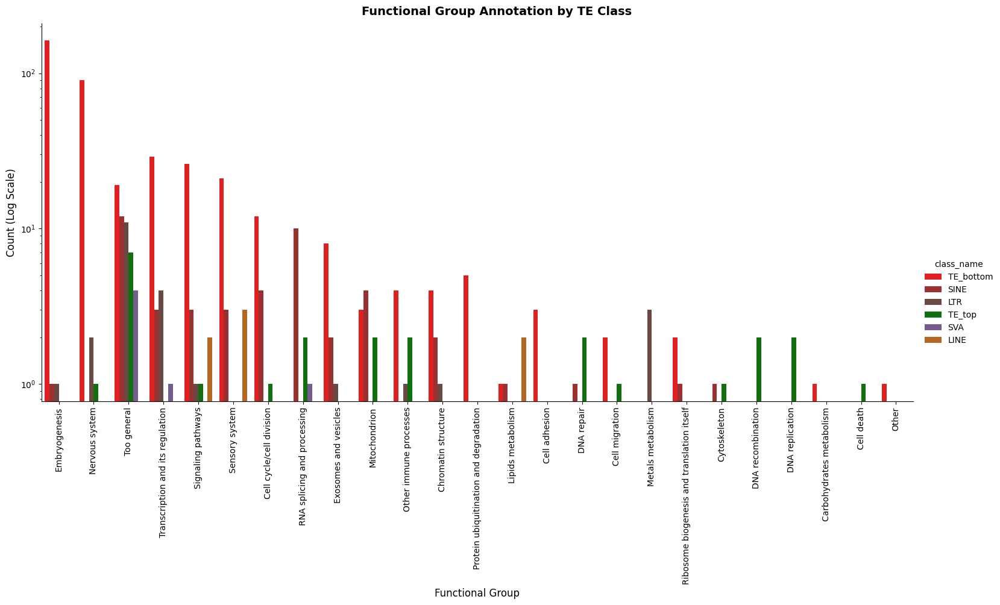

Success: Categorical plot with adjacent bars saved to plots/functional_groups_distribution.svg


In [25]:
group_order = (
    counts_by_group.groupby("Functional group Gemini")["count"]
    .sum()
    .sort_values(ascending=False)
    .index
)

# Initialize the catplot
# height and aspect together control the final fig size
g = sns.catplot(
    data=counts_by_group,
    x="Functional group Gemini",
    y="count",
    hue="class_name",
    kind="bar",
    palette=class_names_p,
    order=group_order,
    height=7,
    aspect=2.2,
    legend_out=True,
    # gap=0 makes bars within a group touch.
    # width=0.8 ensures there is space between groups.
    gap=0,
    width=0.8,
    # MODIFIED: Removing outlines to eliminate visual gaps between bars
    edgecolor="none",
    linewidth=0,
)

# --- 3. Customizations ---

# Rotate x tick labels by 90 degrees
g.set_xticklabels(rotation=90, fontsize=10)

# Change the y-axis scale to Logarithmic
g.ax.set_yscale("log")

# Set clean titles and labels
g.set_axis_labels("Functional Group", "Count (Log Scale)", fontsize=12)
g.fig.suptitle(
    "Functional Group Annotation by TE Class", y=1.02, fontsize=14, weight="bold"
)

# --- 4. Saving ---

# Ensure the plots subdirectory exists
os.makedirs("plots", exist_ok=True)
save_path = "plots/functional_groups_distribution.svg"

# Save with transparent background
g.fig.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(f"Success: Categorical plot with adjacent bars saved to {save_path}")

In [30]:
counts_by_group["Functional group Gemini"].unique()

array(['Embryogenesis', 'Nervous system',
       'Transcription and its regulation', 'Signaling pathways',
       'Sensory system', 'Too general', 'Cell cycle/cell division',
       'RNA splicing and processing', 'Exosomes and vesicles',
       'Protein ubiquitination and degradation', 'Mitochondrion',
       'Chromatin structure', 'Other immune processes', 'Cell adhesion',
       'Metals metabolism', 'DNA repair', 'DNA recombination',
       'DNA replication', 'Cell migration',
       'Ribosome biogenesis and translation itself', 'Lipids metabolism',
       'Cytoskeleton', 'Carbohydrates metabolism', 'Other', 'Cell death'],
      dtype=object)

In [29]:
functional_metagroups = {
    "Metabolism": [
        "Carbohydrates metabolism",
        "Metals metabolism",
        "Lipids metabolism",
        "Mitochondrion",
    ],
    "Proteins biogenesis": [
        "Protein ubiquitination and degradation",
        "Ribosome biogenesis and translation itself",
    ],
    "Cellular processes": [
        "Cell cycle/cell division",
        "Cell adhesion",
        "Cell migration",
        "Cytoskeleton",
        "Cell death",
        "Exosomes and vesicles",
        "Extracellular matrix",
    ],
    "RNA biogenesis": [
        "Transcription and its regulation",
        "RNA splicing and processing",
    ],
    "DNA biogenesis": [
        "Chromatin structure",
        "DNA repair",
        "DNA recombination",
        "DNA replication",
    ],
    "Organismal processes": [
        "Embryogenesis",
        "Nervous system",
        "Sensory system",
        "Other immune processes",
    ],
    "Signaling pathways": ["Signaling pathways"],
    "other": ["Too general", "Other"],
}

In [37]:
meta_palette

{'Metabolism': (0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
 'Proteins biogenesis': (1.0, 1.0, 0.7019607843137254),
 'Cellular processes': (0.7450980392156863,
  0.7294117647058823,
  0.8549019607843137),
 'RNA biogenesis': (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
 'DNA biogenesis': (0.5019607843137255,
  0.6941176470588235,
  0.8274509803921568),
 'Organismal processes': (0.9921568627450981,
  0.7058823529411765,
  0.3843137254901961),
 'Signaling pathways': (0.7019607843137254,
  0.8705882352941177,
  0.4117647058823529),
 'other': (0.9882352941176471, 0.803921568627451, 0.8980392156862745)}

/tmp/ipykernel_131/4092935309.py:48: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


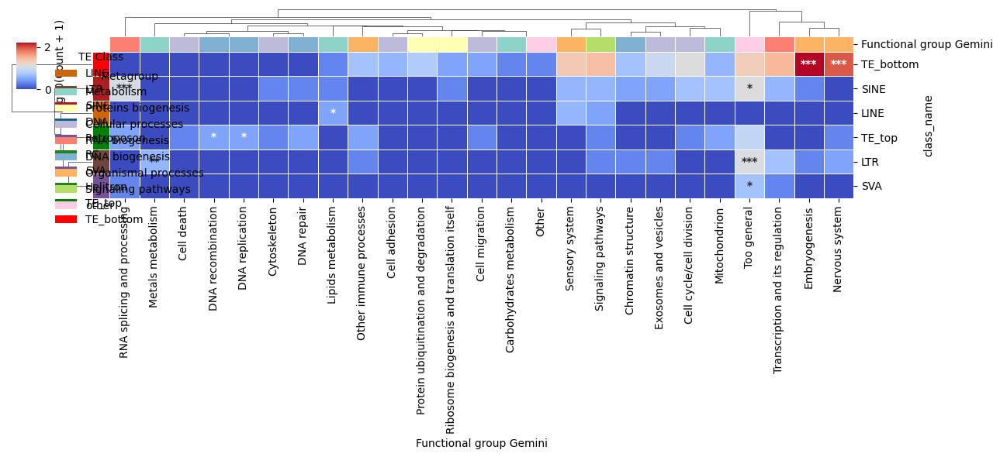

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_top5_perc_by_TE_count.svg


In [52]:
# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="class_name", columns="Functional group Gemini", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(13, 6),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.08),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_top5_perc_by_TE_count.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

In [ ]:
1

In [13]:
# pd.crosstab(top_5_perc_genes_manual['class_name'], top_5_perc_genes_manual['Functional group Gemini'])

top_5_perc_genes_manual[
    ["class_name", "Functional group Gemini"]
].value_counts().reset_index()

,class_name,Functional group Gemini,count
0,TE_bottom,Embryogenesis,162
1,TE_bottom,Nervous system,90
2,TE_bottom,Transcription and its regulation,29
3,TE_bottom,Signaling pathways,26
4,TE_bottom,Sensory system,21
5,TE_bottom,Too general,19
6,SINE,Too general,12
7,TE_bottom,Cell cycle/cell division,12
8,LTR,Too general,11
9,SINE,RNA splicing and processing,10


# Analysis by cumulative length of all TEs and different classes in a gene TSS neighborhood

# Analysis by average divergence of all TEs and different classes in a gene TSS neighborhood

In [58]:
TEs_on_genes.columns

Index(['Chromosome', 'Start', 'End', 'Gene_name', 'Signal',
       'Divergence_scores', 'TE_subfamilies', 'TE_families', 'TE_classes',
       'Signals', 'Average_Divergence_Score', 'LINE_number', 'LTR_number',
       'SINE_number', 'DNA_number', 'Retroposon_number', 'RC_number',
       'TE_number', 'Divergence_Avg_LINE', 'Divergence_Avg_LTR',
       'Divergence_Avg_SINE', 'Divergence_Avg_DNA',
       'Divergence_Avg_Retroposon', 'Divergence_Avg_RC'],
      dtype='object')

In [55]:
TEs_on_genes

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
0,chr1,8582,18582,LOC127239154,0.2922687913,"106,325,223,236,164,87,166,217,153,337,183,195...","MER4A1,MLT1I,L1M5,MLT1H2,L1MA4,AluY,MER4D1,MER...","ERV1,ERVL-MaLR,L1,ERVL-MaLR,L1,Alu,ERV1,ERV1,E...","LTR,LTR,LINE,LTR,LINE,SINE,LTR,LTR,LTR,SINE,LT...","0.2202762429,0.8299625,0.572213,.,0.5469095429...",...,0,0,0,15,193.500000,198.000000,170.166667,NaN,NaN,NaN
1,chr1,49612,59612,LOC101928626,0.4283229986,"254,194,206,281,218,126,247,133,74,89,303,395,...","L1ME4a,L2a,L2c,MIRb,LTR37B,AluSq,MLT1O,MSTA,Al...","L1,L2,L2,MIR,ERV1,Alu,ERVL-MaLR,ERVL-MaLR,Alu,...","LINE,LINE,LINE,SINE,LTR,SINE,LTR,LTR,SINE,SINE...","0.177422835,0.4724386174,0.5349553862,0.534999...",...,1,0,0,23,226.428571,201.200000,180.800000,395.0,NaN,NaN
2,chr1,107877,117877,OR4F16,-0.1430819362,"163,78,229,184,161,300,350,130,340,234","L1MA7,L1PA7,L1M4,L1MA4,L1MA4,MIR3,MIRc,L2c,MIR...","L1,L1,L1,L1,L1,MIR,MIR,L2,MIR,MIR","LINE,LINE,LINE,LINE,LINE,SINE,SINE,LINE,SINE,SINE","0.391722927,1.167674433,-0.931795,-0.111012058...",...,0,0,0,10,157.500000,NaN,306.000000,NaN,NaN,NaN
3,chr1,132287,142287,LOC127239154,-0.4371188212,"333,282,270,243,325,274,135,228,118,3,126,248,...","L1M5,L2a,L1ME3D,L2,LTR33B,MER65D,L1MA5,MLT1D,T...","L1,L2,L1,L2,ERVL,ERV1,L1,ERVL-MaLR,ERVL-MaLR,A...","LINE,LINE,LINE,LINE,LTR,LTR,LINE,LTR,LTR,SINE,...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,17,246.500000,236.250000,79.000000,NaN,NaN,NaN
4,chr1,133480,143480,LOC127239154,-0.4101818372,"333,282,270,243,135,228,118,3,126,248,347,61,2...","L1M5,L2a,L1ME3D,L2,L1MA5,MLT1D,THE1D,AluYa5,L1...","L1,L2,L1,L2,L1,ERVL-MaLR,ERVL-MaLR,Alu,L1,L2,L...","LINE,LINE,LINE,LINE,LINE,LTR,LTR,SINE,LINE,LIN...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,15,246.500000,173.000000,79.000000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,chrY,62185165,62195165,SPRY3,0.204364463,"104,94,313,226,204,196,218,269,169,234,242,225...","L1PA16,L1PA16,L2c,L2a,L2a,L2c,MIRc,L2c,MLT1A0,...","L1,L1,L2,L2,L2,L2,MIR,L2,ERVL-MaLR,MIR,MIR,MIR...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,LINE,LTR,SI...","0.17978186,0.5729008,.,.,.,.,.,0.9911925778,.,...",...,2,0,0,17,200.857143,169.000000,257.857143,295.5,NaN,NaN
38700,chrY,62301324,62311324,VAMP7,0.2318653989,"153,71,340,114,114,308,271,71,74,293,320,109,2...","L1PA17,L1PA10,L2a,L1PA17,FRAM,L2,MIRc,MER41A,M...","L1,L1,L2,L1,Alu,L2,MIR,ERV1,ERVL-MaLR,MIR,L2,A...","LINE,LINE,LINE,LINE,SINE,LINE,SINE,LTR,LTR,SIN...","-0.4256057778,0.1826155477,0.1826155477,-0.576...",...,2,0,0,23,252.090909,107.000000,169.428571,279.5,NaN,NaN
38701,chrY,62417686,62427686,IL9R,0.1765993647,"143,112,141,208,245,159,168,119,153,202,75,143...","L1MA7,L1MB3,L1M4c,L1MEb,L1ME3G,L1M4,AluJb,AluS...","L1,L1,L1,L1,L1,L1,Alu,Alu,Alu,hAT-Charlie,MIR,...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,SINE,SINE,D...","-0.1042256162,-0.06625528413,-0.3867034074,-0....",...,1,0,0,23,187.285714,NaN,159.200000,202.0,NaN,NaN
38702,chrY,62436822,62446822,WASIR1,0.8498523286,"201,228,119,149,234,150,117,103,79,120,104,116...","MLT1C2,LTR35B,AluSq2,MER66A,L1MC,AluSx,AluSx,F...","ERVL-MaLR,ERV1,Alu,ERV1,L1,Alu,Alu,Alu,Alu,Alu...","LTR,LTR,SINE,LTR,LINE,SINE,SINE,SINE,SINE,SINE...",".,.,.,.,0.8498523286,.,-0.1954545,.,.,1.807282...",...,0,0,0,16,215.000000,192.666667,124.111111,NaN,NaN,NaN


In [59]:
major_classes = ["LINE", "LTR", "SINE", "DNA"]
for class_name in major_classes:
    print(class_name, TEs_on_genes[f"Divergence_Avg_{class_name}"].isna().sum())
print("all", TEs_on_genes[f"Average_Divergence_Score"].isna().sum())

LINE 1893
LTR 15999
SINE 1197
DNA 12181
all 343


In [39]:
class_name

'DNA'

In [46]:
TEs_on_genes.sort_values(f"Divergence_Avg_{class_name}", ascending=False).dropna(
    subset=f"Divergence_Avg_{class_name}"
)

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
22260,chr20,715058,725058,SCRT2,0.497765093,"316,264,295,170,96,232,289,265,445,86,182,244","MIR3,MIR3,L2c,AluJb,AluSx3,MIR,L2a,L2b,MamTip2...","MIR,MIR,L2,Alu,Alu,MIR,L2,L2,hAT-Tip100,Alu,L2...","SINE,SINE,LINE,SINE,SINE,SINE,LINE,LINE,DNA,SI...","-0.11991724,3.341246,0.06148895942,-0.45458275...",...,1,0,0,12,257.750000,NaN,201.142857,445.0,NaN,NaN
34512,chr8,38422956,38432956,STAR,0.3218543511,"102,168,308,230,117,113,184,331,251,207,410,92...","AluSx,AluJb,MIR3,MIR3,AluSx4,AluSx,AluJb,L2d2,...","Alu,Alu,MIR,MIR,Alu,Alu,Alu,L2,MIR,L1,hAT-Char...","SINE,SINE,SINE,SINE,SINE,SINE,SINE,LINE,SINE,L...","0.3809857429,0.2289986757,-0.6264696,0.5732527...",...,1,0,0,20,269.000000,NaN,156.000000,410.0,NaN,NaN
26294,chr3,151611045,151621045,CPA3,0.1436695905,"202,322,290,345,335,77,27,266,402,264,123,127,...","L1ME4a,L2b,L1ME3Cz,MIRb,L2c,AluSq,L1PA6,MIRb,M...","L1,L2,L1,MIR,L2,Alu,L1,MIR,hAT-Tip100,MIR,Alu,...","LINE,LINE,LINE,SINE,LINE,SINE,LINE,SINE,DNA,SI...","0.4411261187,0.4740032263,0.3702633341,-0.0387...",...,1,0,0,14,235.200000,NaN,202.625000,402.0,NaN,NaN
15870,chr17,48506212,48516212,KPNB1-DT,0.02700877144,"314,324,159,113,162,262,137,139,400,122,132,14...","L2,L2c,AluJb,FRAM,AluYa8,MIR,AluJb,AluSx,Tigge...","L2,L2,Alu,Alu,Alu,MIR,Alu,Alu,TcMar-Tigger,Alu...","LINE,LINE,SINE,SINE,SINE,SINE,SINE,SINE,DNA,SI...","-0.1941110117,-0.2479377958,0.1727186667,0.199...",...,1,0,0,19,319.000000,NaN,138.187500,400.0,NaN,NaN
15872,chr17,48507848,48517848,KPNB1,-0.03083894343,"324,137,139,400,122,132,149,118,89,110,75,229,...","L2c,AluJb,AluSx,Tigger19a,AluSx,Alu,AluYe5,Alu...","L2,Alu,Alu,TcMar-Tigger,Alu,Alu,Alu,Alu,Alu,Al...","LINE,SINE,SINE,DNA,SINE,SINE,SINE,SINE,SINE,SI...","-0.2479377958,-0.82480064,-0.9029794222,-0.587...",...,1,0,0,15,324.000000,NaN,125.153846,400.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14189,chr16,73271165,73281165,ATP6V0D1-DT,0.3046691383,"249,116,144,109,73,304,99,173,94,3,128,24,237,...","L1MC5,L1MA5,L1MB8,AluSx,AluY,MIRb,AluSz6,L2b,A...","L1,L1,L1,Alu,Alu,MIR,Alu,L2,Alu,Alu,ERV1,Piggy...","LINE,LINE,LINE,SINE,SINE,SINE,SINE,LINE,SINE,S...","-0.1156001971,-0.1023265421,-0.1383772522,-0.3...",...,1,0,0,22,197.666667,128.0,125.214286,24.0,NaN,NaN
23298,chr21,12553864,12563864,RBM11,-0.1527512731,"176,286,316,92,329,22","MIR,L2a,L2c,AluSq2,MIR,MADE1","MIR,L2,L2,Alu,MIR,TcMar-Mariner","SINE,LINE,LINE,SINE,SINE,DNA","-1.178961286,0.1120255758,0.1125036676,0.64739...",...,1,0,0,6,301.000000,NaN,199.000000,22.0,NaN,NaN
27456,chr4,73488512,73498512,PRR27,-0.3847780641,"271,0,235,337,22,288,133,284,323,35,19,94,250","L1MD3,L1PA2,L1MCa,L2,MADE1,L4_A_Mam,L1PA16,L2b...","L1,L1,L1,L2,TcMar-Mariner,RTE-X,L1,L2,MIR,Alu,...","LINE,LINE,LINE,LINE,DNA,LINE,LINE,LINE,SINE,SI...","-0.3780505839,-0.4384624597,-0.4316077456,-0.6...",...,1,0,0,13,201.888889,NaN,150.666667,22.0,NaN,NaN
15183,chr17,19572976,19582976,SLC47A1P2,-0.002787351047,"275,76,305,278,321,93,20,81,295,310,143,96,142...","HAL1ME,L1PB3,L1M5,L3,L2c,AluSx3,MER33,SVA_F,L1...","L1,L1,L1,CR1,L2,Alu,hAT-Charlie,SVA,L1,L2,Alu,...","LINE,LINE,LINE,LINE,LINE,SINE,DNA,Retroposon,L...","-0.2611601805,0.01943663904,0.07903958991,-0.0...",...,1,1,0,15,262.750000,NaN,127.000000,20.0,81.0,NaN


In [49]:
genes_by_TE_number = list(
    TEs_on_genes.sort_values(f"Divergence_Avg_{class_name}", ascending=False)
    .dropna(subset=f"Divergence_Avg_{class_name}")[["Gene_name"]]
    .drop_duplicates()["Gene_name"]
)

genes_to_take_number = len(genes_by_TE_number) // 20
genes_high_div = genes_by_TE_number[:genes_to_take_number]
genes_low_div = genes_by_TE_number[-genes_to_take_number:]

1015 ['PAX5', 'PEAK1', 'FAM225B', 'ZNF571-AS1', 'NFE4', 'FAM225A', 'HMG20A', 'ZNF559', 'RPRML', 'YAF2', 'ZNF559-ZNF177', 'PTRH2', 'FLNB', 'DCAF8L1', 'MIR15A', 'LINC01615', 'FAM149A', 'LOC101928622', 'MIR16-1', 'PLCD1', 'FARSB', 'MIR509-3', 'ZNF852', 'LOC729681', 'MIR5700', 'MIR509-1', 'SRSF3', 'RTRAF', 'KCNA5', 'HPSE', 'DSC1', 'PPDPFL', 'CYP2U1', 'CYP2U1-AS1', 'ZNF233', 'DEFB132', 'LINC01275', 'LIPT2-AS1', 'LIPT2', 'TLR10', 'PABIR1', 'CPXCR1', 'LINC00644', 'DONSON', 'TNNT1', 'CASC22', 'OR56A4', 'LINC01095', 'TTC28-AS1', 'PITPNB', 'MRPL51', 'OCLNP1', 'SNORA71E', 'KLHL9', 'ABCA5', 'PBX2', 'GPSM3', 'SLC17A4', 'SNORA60', 'DCAF4L1', 'LINC02558', 'ZBTB44-DT', 'LINC00862', 'PIWIL2', 'IFT46', 'ABCE1', 'TMPRSS5', 'ANAPC10', 'LINC02837', 'CDRT15P1', 'ZBTB44', 'ZNF442', 'CAVIN1', 'PIWIL2-DT', 'SDHAF1', 'EFNA5', 'GDPD2', 'SNHG11', 'AMIGO2', 'PCED1B', 'TRIML1', 'MYLK4', 'WASH2P', 'PLEKHH1', 'ATF6', 'CDC6', 'PAPLN', 'LOC100507002', 'LOC202181', 'CFAP97', 'NCKAP1L', 'PRIMA1', 'PRORSD1P', 'ANKDD1A', '

In [53]:
TEs_on_genes.columns

Index(['Chromosome', 'Start', 'End', 'Gene_name', 'Signal',
       'Divergence_scores', 'TE_subfamilies', 'TE_families', 'TE_classes',
       'Signals', 'Average_Divergence_Score', 'LINE_number', 'LTR_number',
       'SINE_number', 'DNA_number', 'Retroposon_number', 'RC_number',
       'TE_number', 'Divergence_Avg_LINE', 'Divergence_Avg_LTR',
       'Divergence_Avg_SINE', 'Divergence_Avg_DNA',
       'Divergence_Avg_Retroposon', 'Divergence_Avg_RC'],
      dtype='object')

In [ ]:
?? sns.histplot

In [17]:
# gather top and bottom 5% genes by four major classes average divergence (LTR, LINE, SINE, DNA)
# and top and bottom genes by all TEs average divergence - FOR SUPPLEMENTARY
sets_genes = []
labels_genes = []

for class_name in class_names[:4]:
    print(
        f"""
    {class_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes.sort_values(f"Divergence_Avg_{class_name}", ascending=False)
        .dropna(subset=f"Divergence_Avg_{class_name}")[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )

    genes_to_take_number = len(genes_by_TE_number) // 20
    genes_high_div = genes_by_TE_number[:genes_to_take_number]
    genes_low_div = genes_by_TE_number[-genes_to_take_number:]
    sets_genes.append(set(genes_high_div))
    sets_genes.append(set(genes_low_div))
    labels_genes.append(class_name + "_high_div")
    labels_genes.append(class_name + "_low_div")

print(
    """
    TE all
    
    """
)

class_name = "TE_all"
genes_by_TE_number = list(
    TEs_on_genes.sort_values(f"Average_Divergence_Score", ascending=False)
    .dropna(subset=f"Average_Divergence_Score")[["Gene_name"]]
    .drop_duplicates()["Gene_name"]
)

genes_to_take_number = len(genes_by_TE_number) // 20
genes_high_div = genes_by_TE_number[:genes_to_take_number]
genes_low_div = genes_by_TE_number[-genes_to_take_number:]

sets_genes.append(set(genes_high_div))
sets_genes.append(set(genes_low_div))
labels_genes.append(class_name + "_high_div")
labels_genes.append(class_name + "_low_div")




    LINE

    

    LTR

    

    SINE

    

    DNA

    

    TE all

    


In [18]:
labels_genes

['LINE_high_div',
 'LINE_low_div',
 'LTR_high_div',
 'LTR_low_div',
 'SINE_high_div',
 'SINE_low_div',
 'DNA_high_div',
 'DNA_low_div',
 'TE_all_high_div',
 'TE_all_low_div']

In [28]:
for gene in list(sets_genes[9]):
    print(gene)

ZNF878
SNORA73A
LOC102723831
INGX
BPY2C
OR2J2
LINC01946
PGD
ARIH2OS
ZNF695
SNHG7
GSDMC
CYBC1
ULK4P3
TBCC
ZNF101
RNA5S1
NEUROG2
HOXB7
MIR3171HG
ZNF516-DT
SIGLEC16
EVPL
LINC01637
CLPTM1L
TREX1
SLC11A1
MIR371B
RNF135
RPL23AP64
C22orf46P
NABP2
FBXL18
ZNF555
CLDN6
FNBP4
ARID2
SNORD114-26
RNY5
HDAC5
PPP1R35
SNORA50D
EID3
PSME4
LILRA5
MIR4479
SSBP3-AS1
MIR3914-2
NDUFV3
LUC7L
GPX4
TUBGCP6
RNA5S15
NDUFAF3
SNORA80E
ANAPC11
MIR1285-2
LINC00664
IER2
ECI1
TALDO1
LEO1
ZNF790-AS1
PLA2G15
RRP36
MIR1244-2
INO80D
MAGEB5
TGIF2LX
LOC112268219
SBNO1-AS1
VPS33A
SLC50A1
GMEB2
YBEY
SNORD51
APOC4-APOC2
PAFAH1B3
PPM1G
MEIS1-AS3
RNA5S6
MTOR
TMEM276-ZFTRAF1
ZDHHC5
IGFALS
FZD10
SNORD114-2
JMY
ZNF442
C4A
SEC23A
ISG15
SNORD52
ST20-AS1
CSNK1G1
CCDC144CP
CCDC78
ZNF789
SCAMP3
ING2-DT
SNORD115-3
INTS3
FBF1
MIR153-2
UQCC4
LINC01180
NOP10
LOC221946
RABGGTB
HSPA1A
HMG20B
SHARPIN
XBP1
ZNF837
POLR2B
GABARAPL2
SNORD114-9
RNH1
UBE2V2
BAZ2A
LOC101928201
TBX5
RPS24
PPIEL
REEP6
LOC105371933
ATXN1L
BSG
BCRP3
MIR3672
PLPP1
MIR1244-


    LINE
    
    
Group of the lowest divergence
Number of genes 1372
Divergence intervals in the group:
0.0
168.0
Loading GO DAG...
go-basic.obo: fmt(1.2) rel(2025-10-10) 42,666 Terms
Loading Human Annotations and mapping symbols...
HMS:0:00:22.447468 972,437 annotations READ: goa_human.gaf 
Initializing Enrichment Study...

Load  Ontology Enrichment Analysis ...
 66% 18,930 of 28,738 population items found in association
Running Analysis on 1372 genes...

Runing  Ontology Analysis: current study set of 1372 IDs.
 55%    757 of  1,372 study items found in association
100%  1,372 of  1,372 study items found in population(28738)
Calculating 18,746 uncorrected p-values using fisher_scipy_stats
  18,746 terms are associated with 18,930 of 28,738 population items
   3,917 terms are associated with    757 of  1,372 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.1=alpha) ( 10 enriched +   7 purified): statsmodels fdr_bh
     106 study items associated with significan

,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,divergence_group
16,GO:0005515,protein binding,MF,2.373917e-22,4.450145e-18,0.729263,468.0,13442.0,"[ACTR2, ADCK2, AGTR2, AKAP6, AKR1C1, ALAS1, AM...","[A1CF, A2M, AAAS, AACS, AADAC, AAGAB, AAK1, AA...",LINE,lowest
0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.610603e-19,4.755612e-15,3.473468,66.0,398.0,"[OR10A6, OR10A7, OR10H2, OR10K2, OR10S1, OR11H...","[CNGB1, GPR148, OR10A2, OR10A3, OR10A4, OR10A5...",LINE,lowest
7,GO:0004984,olfactory receptor activity,MF,5.805870e-19,4.755612e-15,3.491011,66.0,396.0,"[OR10A6, OR10A7, OR10H2, OR10K2, OR10S1, OR11H...","[GPR148, OR10A2, OR10A3, OR10A4, OR10A5, OR10A...",LINE,lowest
1,GO:0007608,sensory perception of smell,BP,8.058897e-18,3.776802e-14,3.286619,67.0,427.0,"[B2M, OR10A6, OR10A7, OR10H2, OR10K2, OR10S1, ...","[ADCY3, ANO9, B2M, BBS1, BBS4, BEST2, CFAP69, ...",LINE,lowest
12,GO:0005737,cytoplasm,CC,4.253224e-15,1.594619e-11,0.633945,196.0,6476.0,"[ACSBG1, ACTR2, ADCY1, AGBL5, AKAP6, ALDH1A3, ...","[A1CF, AAGAB, AAMDC, AAMP, AANAT, AARS1, AARS2...",LINE,lowest
...,...,...,...,...,...,...,...,...,...,...,...,...
260,GO:0006457,protein folding,BP,1.219201e-03,8.559980e-02,0.104492,1.0,193.0,[RIC8A],"[AHSA1, AHSA2P, AHSP, ALG12, ANP32E, APCS, APL...",TE_all,highest
206,GO:0016020,membrane,CC,1.304551e-03,9.125042e-02,1.173994,320.0,5497.0,"[ABCC3, ACSL6, ADCY2, ADCY8, ADCYAP1R1, ADGRA1...","[A3GALT2, A4GALT, A4GNT, AAAS, AADAC, AADACL2,...",TE_all,highest
164,GO:0007193,adenylate cyclase-inhibiting G protein-coupled...,BP,1.411913e-03,9.839305e-02,2.881003,11.0,77.0,"[ADRA2A, ADRA2B, CHRM2, GNAZ, GRM7, GRM8, HTR1...","[ADCY10, ADCY6, ADGRG3, ADGRG6, ADORA1, ADORA3...",TE_all,highest
165,GO:0007157,heterophilic cell-cell adhesion,BP,1.428550e-03,9.918371e-02,3.300057,9.0,55.0,"[ALCAM, CADM3, CBLN1, CDH4, CRB2, NECTIN1, NRX...","[ALCAM, AMIGO1, AMIGO2, AMIGO3, CADM1, CADM3, ...",TE_all,highest


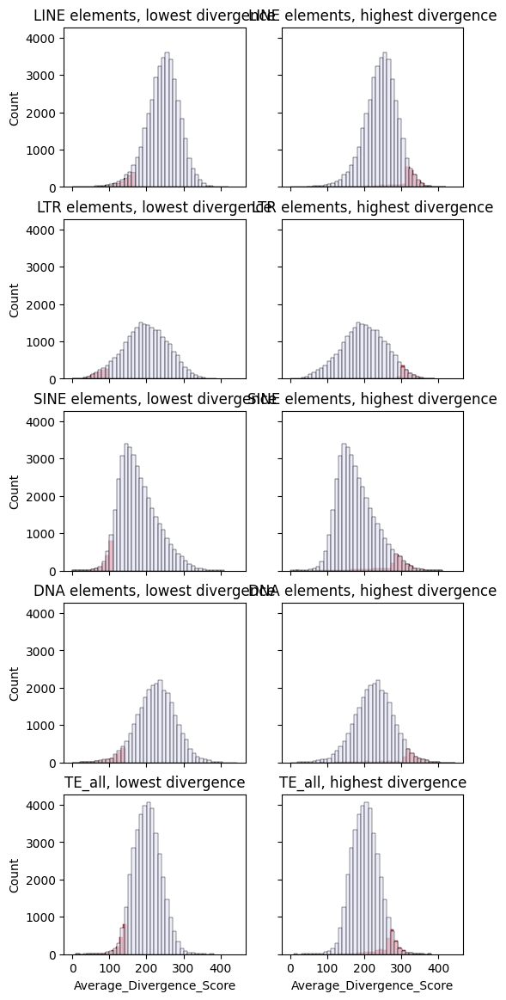

In [79]:
# gather top and bottom 5% genes by four major classes average divergence (LTR, LINE, SINE, DNA)
# and top and bottom genes by all TEs average divergence - and build their supervenn plot to understand degree of their intersections
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes["Gene_name"].unique())

significant_terms_dfs = []

figure, axs = plt.subplots(
    nrows=5,
    ncols=2,
    sharex=True,
    sharey=True,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(6, 14),
)
af = iter(axs.flatten())

for class_name in class_names[:4]:
    print(
        f"""
    {class_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes.sort_values(f"Divergence_Avg_{class_name}", ascending=False)
        .dropna(subset=f"Divergence_Avg_{class_name}")[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )

    genes_to_take_number = len(genes_by_TE_number) // 20
    genes_high_div = genes_by_TE_number[:genes_to_take_number]
    genes_low_div = genes_by_TE_number[-genes_to_take_number:]
    sets_genes.append(set(genes_high_div))
    sets_genes.append(set(genes_low_div))
    labels_genes.append(class_name + "_high_div")
    labels_genes.append(class_name + "_low_div")
    print("Group of the lowest divergence")
    print("Number of genes", genes_to_take_number)
    print("Divergence intervals in the group:")
    divergense_of_selected_genes = TEs_on_genes[
        TEs_on_genes["Gene_name"].isin(genes_low_div)
    ][f"Divergence_Avg_{class_name}"]
    ax = next(af)
    sns.histplot(divergense_of_selected_genes, binwidth=10, ax=ax, color="red")
    sns.histplot(
        TEs_on_genes[f"Divergence_Avg_{class_name}"],
        binwidth=10,
        ax=ax,
        color="lavender",
    )
    ax.set_title(f"{class_name} elements, lowest divergence")
    print(divergense_of_selected_genes.min())
    print(divergense_of_selected_genes.max())
    results_low = run_goatools_enrichment(
        genes_low_div, background_list=background_list
    )
    results_low["class_name"] = class_name
    results_low["divergence_group"] = "lowest"
    significant_terms_dfs.append(results_low)

    print("Group of the highest divergence")
    print("Number of genes", genes_to_take_number)
    print("Divergence intervals in the group:")
    divergense_of_selected_genes = TEs_on_genes[
        TEs_on_genes["Gene_name"].isin(genes_high_div)
    ][f"Divergence_Avg_{class_name}"]
    ax = next(af)
    sns.histplot(divergense_of_selected_genes, binwidth=10, ax=ax, color="red")
    sns.histplot(
        TEs_on_genes[f"Divergence_Avg_{class_name}"],
        binwidth=10,
        ax=ax,
        color="lavender",
    )
    ax.set_title(f"{class_name} elements, highest divergence")

    print(divergense_of_selected_genes.min())
    print(divergense_of_selected_genes.max())

    results_high = run_goatools_enrichment(
        genes_high_div, background_list=background_list
    )
    results_high["class_name"] = class_name
    results_high["divergence_group"] = "highest"
    significant_terms_dfs.append(results_high)


print(
    """
    TE all
    
    """
)

class_name = "TE_all"
genes_by_TE_number = list(
    TEs_on_genes.sort_values(f"Average_Divergence_Score", ascending=False)
    .dropna(subset=f"Average_Divergence_Score")[["Gene_name"]]
    .drop_duplicates()["Gene_name"]
)

genes_to_take_number = len(genes_by_TE_number) // 20
genes_high_div = genes_by_TE_number[:genes_to_take_number]
genes_low_div = genes_by_TE_number[-genes_to_take_number:]

sets_genes.append(set(genes_high_div))
sets_genes.append(set(genes_low_div))
labels_genes.append(class_name + "_high_div")
labels_genes.append(class_name + "_low_div")

print("Group of the lowest divergence")
print("Number of genes", genes_to_take_number)
print("Divergence intervals in the group:")
divergense_of_selected_genes = TEs_on_genes[
    TEs_on_genes["Gene_name"].isin(genes_low_div)
][f"Average_Divergence_Score"]
ax = next(af)
sns.histplot(divergense_of_selected_genes, binwidth=10, ax=ax, color="red")
sns.histplot(
    TEs_on_genes[f"Average_Divergence_Score"], binwidth=10, ax=ax, color="lavender"
)
ax.set_title(f"{class_name}, lowest divergence")

print(divergense_of_selected_genes.min())
print(divergense_of_selected_genes.max())
results_low = run_goatools_enrichment(genes_low_div, background_list=background_list)
results_low["class_name"] = class_name
results_low["divergence_group"] = "lowest"
significant_terms_dfs.append(results_low)

print("Group of the highest divergence")
print("Number of genes", genes_to_take_number)
print("Divergence intervals in the group:")
divergense_of_selected_genes = TEs_on_genes[
    TEs_on_genes["Gene_name"].isin(genes_high_div)
][f"Average_Divergence_Score"]
ax = next(af)
sns.histplot(divergense_of_selected_genes, binwidth=10, ax=ax, color="red")
sns.histplot(
    TEs_on_genes[f"Average_Divergence_Score"], binwidth=10, ax=ax, color="lavender"
)
ax.set_title(f"{class_name}, highest divergence")

print(divergense_of_selected_genes.min())
print(divergense_of_selected_genes.max())


results_high = run_goatools_enrichment(genes_high_div, background_list=background_list)
results_high["class_name"] = class_name
results_high["divergence_group"] = "highest"
significant_terms_dfs.append(results_high)

plt.savefig(
    "plots/divergence_distribution_by_class_top_bottom_all.svg", transparent=True
)

top_5_perc_genes_by_divergence_major_class = pd.concat(significant_terms_dfs, axis=0)
top_5_perc_genes_by_divergence_major_class

In [63]:
top_5_perc_genes_by_divergence_major_class.to_csv(
    "GO_top_5_perc_genes_by_divergence_major_class.csv"
)

In [6]:
top_5_perc_genes_by_divergence_major_class = pd.read_csv(
    "GO_top_5_perc_genes_by_divergence_major_class.csv"
)
"GO_top_5_perc_genes_by_divergence_major_class.csv"

'GO_top_5_perc_genes_by_divergence_major_class.csv'

In [55]:
genes_by_TE_number

['OR5AL1',
 'CEP85L',
 'DKFZP586I1420',
 'ELMO3',
 'DLK1',
 'MIR328',
 'SHISA4',
 'NCAPH2',
 'GFRAL',
 'TP53I13',
 'ABHD15',
 'NLGN4X',
 'LOC105373156',
 'NEURL4',
 'CRAMP1',
 'IFT140',
 'HSPB6',
 'DAPK3',
 'LRRC14',
 'MT1M',
 'RECQL4',
 'SMG6',
 'PTPRN2-AS1',
 'ZC3H12C',
 'ARHGEF25',
 'STPG3',
 'NACA',
 'NELFB',
 'MIR6892',
 'FAM131B',
 'STPG3-AS1',
 'PHOX2B',
 'WNT10A',
 'MIR4686',
 'TH',
 'MYL6',
 'NDOR1',
 'TMEM203',
 'ZFPM1-AS1',
 'OPA1-AS1',
 'LINC01865',
 'TSSK2',
 'PPP1R10',
 'FCRL2',
 'MRPS18B',
 'MIR3908',
 'LOC100507548',
 'CCR6',
 'NXPH2',
 'LINC01029',
 'LINC01221',
 'WNT7B',
 'MIR1914',
 'MIDN',
 'MIR647',
 'GABARAPL1-AS1',
 'JARID2',
 'RUFY1-AS1',
 'LINC02485',
 'SLC25A3',
 'SRRT',
 'ZNF316',
 'DUSP10',
 'FBXL16',
 'MT1JP',
 'MIR4733',
 'NF1',
 'KRTAP27-1',
 'LINC02118',
 'VIPR2',
 'KBTBD11-OT1',
 'TRPM4',
 'LINC03071',
 'UBA52',
 'PPP1R18',
 'GTPBP1',
 'GTF2IRD1',
 'POC5',
 'ARMH4',
 'C1QL3',
 'SLC3A2',
 'SNHG1',
 'MIR586',
 'LINC02538',
 'TMPRSS9',
 'ATP8B1-AS1',
 'SMI

### Analyze intersections between the selected gene sets by supervenn

In [80]:
labels_genes

['LINE_high_div',
 'LINE_low_div',
 'LTR_high_div',
 'LTR_low_div',
 'SINE_high_div',
 'SINE_low_div',
 'DNA_high_div',
 'DNA_low_div',
 'TE_all_high_div',
 'TE_all_low_div']

In [84]:
sets_colors = [
    class_names_p[label.split("_")[0]]
    for label in labels_genes
    if label.split("_")[0] in class_names_p.keys()
]
sets_colors = sets_colors + ["grey", "grey"]
sets_colors

['#cc660b',
 '#cc660b',
 '#70453c',
 '#70453c',
 '#ab1f20',
 '#ab1f20',
 '#195f90',
 '#195f90',
 'grey',
 'grey']

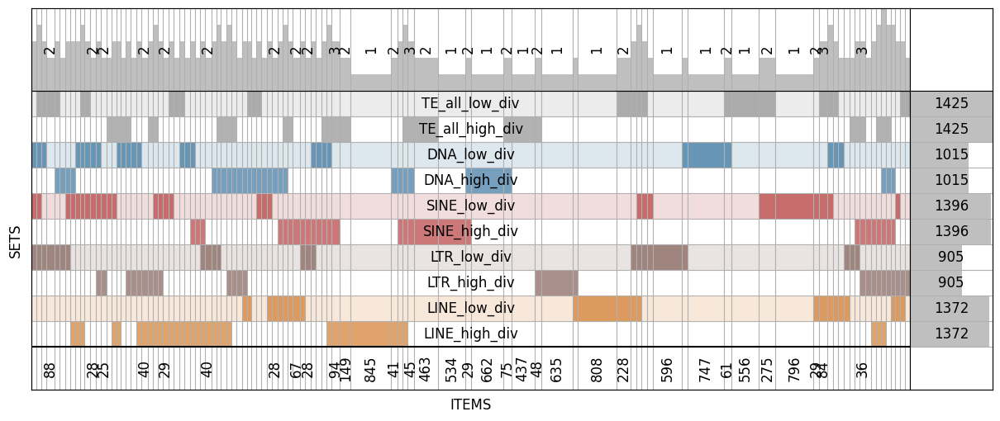

Success: SuperVenn plot with manually applied custom colors saved to plots/TE_top_bottom_5perc_genes_by_TE_divergence_supervenn.svg


In [89]:
sets_colors = [
    class_names_p[label.split("_")[0]]
    for label in labels_genes
    if label.split("_")[0] in class_names_p.keys()
]
sets_colors = sets_colors + ["grey", "grey"]
label_to_color = {
    label: class_names_p[label.split("_")[0]]
    for label in labels_genes
    if label.split("_")[0] in class_names_p.keys()
}
label_to_color.update({"TE_all_high_div": "grey", "TE_all_low_div": "grey"})

# --- 2. Plotting ---

# Figure size set to (20, 6) to give more vertical headroom
fig = plt.figure(figsize=(15, 6))

# Generate the supervenn plot
# Removed set_colors/sets_colors to avoid TypeError
sv = supervenn(
    sets_genes,
    labels_genes,
    sets_ordering=None,
    rotate_col_annotations=True,
    min_width_for_annotation=25,
    widths_minmax_ratio=0.12,
    side_plot_width=1,
    col_annotations_area_height=1,
)

# --- 3. FIX: Post-hoc Manual Coloring ---
# We access the main axis patches and update colors manually to bypass the library bug
# The main axis is typically the first one created or found via sv.axes['main']
try:
    # If the return object 'sv' has axes dictionary (version 0.4+)
    main_ax = sv.axes["main"]
except (AttributeError, TypeError):
    # Fallback for older versions: main axis is usually the first one
    main_ax = plt.gcf().axes[0]

# Update the colors of the grid rectangles
for patch in main_ax.patches:
    if isinstance(patch, plt.Rectangle):
        # The y-coordinate corresponds to the set index (0 to N-1)
        y_pos = int(round(patch.get_y()))
        if 0 <= y_pos < len(sets_colors):
            patch.set_facecolor(sets_colors[y_pos])
            patch.set_edgecolor("white")  # Subtle separator
            patch.set_linewidth(0.5)

# Also update side plot bars if they exist
try:
    side_ax = sv.axes["side"]
    for i, patch in enumerate(side_ax.patches):
        if i < len(sets_colors):
            patch.set_facecolor(sets_colors[i])
except:
    pass

# Add a title
plt.title(
    "SuperVenn Diagram of TE Gene Set Overlaps (Manual Class-Coded Colors)",
    fontsize=14,
    pad=20,
)

# --- 4. Saving ---

# Ensure the plots subdirectory exists
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_top_bottom_5perc_genes_by_TE_divergence_supervenn.svg"

# Save with transparent background
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: SuperVenn plot with manually applied custom colors saved to {save_path}"
)

In [88]:
1

1

## Visualize the network


In [5]:
top_5_perc_genes_by_divergence_major_class = pd.read_csv(
    "GO_top_5_perc_genes_by_divergence_major_class.csv"
)
top_5_perc_genes_by_divergence_major_class["class_name"] = (
    top_5_perc_genes_by_divergence_major_class["class_name"]
    + "_"
    + top_5_perc_genes_by_divergence_major_class["divergence_group"]
)
top_5_perc_genes_by_divergence_major_class

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,divergence_group
0,16,GO:0005515,protein binding,MF,2.373917e-22,4.450145e-18,0.729263,468.0,13442.0,"['ACTR2', 'ADCK2', 'AGTR2', 'AKAP6', 'AKR1C1',...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",LINE_lowest,lowest
1,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.610603e-19,4.755612e-15,3.473468,66.0,398.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE_lowest,lowest
2,7,GO:0004984,olfactory receptor activity,MF,5.805870e-19,4.755612e-15,3.491011,66.0,396.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE_lowest,lowest
3,1,GO:0007608,sensory perception of smell,BP,8.058897e-18,3.776802e-14,3.286619,67.0,427.0,"['B2M', 'OR10A6', 'OR10A7', 'OR10H2', 'OR10K2'...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE_lowest,lowest
4,12,GO:0005737,cytoplasm,CC,4.253224e-15,1.594619e-11,0.633945,196.0,6476.0,"['ACSBG1', 'ACTR2', 'ADCY1', 'AGBL5', 'AKAP6',...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A...",LINE_lowest,lowest
...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,260,GO:0006457,protein folding,BP,1.219201e-03,8.559980e-02,0.104492,1.0,193.0,['RIC8A'],"['AHSA1', 'AHSA2P', 'AHSP', 'ALG12', 'ANP32E',...",TE_all_highest,highest
512,206,GO:0016020,membrane,CC,1.304551e-03,9.125042e-02,1.173994,320.0,5497.0,"['ABCC3', 'ACSL6', 'ADCY2', 'ADCY8', 'ADCYAP1R...","['A3GALT2', 'A4GALT', 'A4GNT', 'AAAS', 'AADAC'...",TE_all_highest,highest
513,164,GO:0007193,adenylate cyclase-inhibiting G protein-coupled...,BP,1.411913e-03,9.839305e-02,2.881003,11.0,77.0,"['ADRA2A', 'ADRA2B', 'CHRM2', 'GNAZ', 'GRM7', ...","['ADCY10', 'ADCY6', 'ADGRG3', 'ADGRG6', 'ADORA...",TE_all_highest,highest
514,165,GO:0007157,heterophilic cell-cell adhesion,BP,1.428550e-03,9.918371e-02,3.300057,9.0,55.0,"['ALCAM', 'CADM3', 'CBLN1', 'CDH4', 'CRB2', 'N...","['ALCAM', 'AMIGO1', 'AMIGO2', 'AMIGO3', 'CADM1...",TE_all_highest,highest


In [10]:
list(top_5_perc_genes_by_divergence_major_class[
    top_5_perc_genes_by_divergence_major_class["Term Name"]
    == "T cell activation involved in immune response"
]['Overlapping Genes'])

["['IFNA10', 'IFNA16', 'IFNA17', 'IFNA21', 'IFNA4', 'IFNA6', 'IFNA7', 'IFNW1']"]

In [1]:
1

1

In [19]:
TEs_on_genes[TEs_on_genes['Gene_name'].isin(['IFNA10', 'IFNA16', 'IFNA17', 'IFNA21', 'IFNA4', 'IFNA6', 'IFNA7', 'IFNW1'])]



,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
35629,chr9,21150692,21160692,IFNW1,0.00467504209,"214,171,146,347,39,180,108,75,221,25,174,268,217","L1MC3,L1MA6,MER87B,L2,L1PA4,AluJb,AluSx,L1MA2,...","L1,L1,ERV1,L2,L1,Alu,Alu,L1,Alu,L1,L1,ERV1,Alu","LINE,LINE,LTR,LINE,LINE,SINE,SINE,LINE,SINE,LI...","-0.1295437455,-0.07120168647,0.0409444,-0.0648...",...,0,0,0,13,149.285714,207.0,181.5,NaN,NaN,NaN
35630,chr9,21175510,21185510,IFNA21,-0.30684216,"238,73,71,246,78,180,336,91,159,192,163,71,162","L1MEf,L1PB,L1PB,L2d,L1P5,AluSx,L2,L1PA6,L1M3,M...","L1,L1,L1,L2,L1,Alu,L2,L1,L1,hAT-Charlie,L1,Alu,L1","LINE,LINE,LINE,LINE,LINE,SINE,LINE,LINE,LINE,D...","-0.3735924617,-0.4198325266,-0.4516610347,-0.3...",...,1,0,0,13,161.700000,NaN,125.5,192.0,NaN,NaN
35631,chr9,21196441,21206441,IFNA4,0.1055126776,"219,174,98,108,178,190,180","L1MD3,L1PREC2,L1PA6,L1PA8,L1M4,MER106B,L1PREC2","L1,L1,L1,L1,L1,hAT-Charlie,L1","LINE,LINE,LINE,LINE,LINE,DNA,LINE","0.01916835222,0.4850273712,-0.3693308452,-0.34...",...,1,0,0,7,159.500000,NaN,NaN,190.0,NaN,NaN
35632,chr9,21211062,21221062,IFNA7,-0.0342675105,"180,91,94,100,111,82,268,98,192,68,101,188","L1PREC2,L1PA8,AluSz6,AluSc8,Alu,AluSz6,MIR,L1P...","L1,L1,Alu,Alu,Alu,Alu,MIR,L1,hAT-Charlie,L1,L1,L1","LINE,LINE,SINE,SINE,SINE,SINE,SINE,LINE,DNA,LI...","0.4793066155,-0.1074624089,0.3490893429,0.3102...",...,1,0,0,12,121.000000,NaN,131.0,192.0,NaN,NaN
35633,chr9,21216000,21226000,IFNA10,0.0293205668,"91,98,192,68,101,188,204,176","L1PA8,L1P3,MER106B,L1PA6,L1P3,L1M3,MER106B,L1P...","L1,L1,hAT-Charlie,L1,L1,L1,hAT-Charlie,L1","LINE,LINE,DNA,LINE,LINE,LINE,DNA,LINE","-0.1074624089,-0.09275772403,-0.1717997086,-0....",...,2,0,0,8,120.333333,NaN,NaN,198.0,NaN,NaN
35634,chr9,21226176,21236176,IFNA16,0.182426882,"176,109,33,196,91,19,176","L1PREC2,L1PA8,L1PA3,MER106B,L1PA6,L1PA3,L1M3","L1,L1,L1,hAT-Charlie,L1,L1,L1","LINE,LINE,LINE,DNA,LINE,LINE,LINE","0.5335474484,-0.1672526518,-0.07866434604,-0.3...",...,1,0,0,7,100.666667,NaN,NaN,196.0,NaN,NaN
35635,chr9,21237075,21247075,IFNA17,-0.201016046,"33,91,19,176,70,80,91,39,199,199,176","L1PA3,L1PA6,L1PA3,L1M3,AluY,L1PA6,L1PA8,L1PA3,...","L1,L1,L1,L1,Alu,L1,L1,L1,L1,hAT-Charlie,L1","LINE,LINE,LINE,LINE,SINE,LINE,LINE,LINE,LINE,D...","-0.07866434604,-0.2939961782,-0.3235147831,-0....",...,1,0,0,11,100.444444,NaN,70.0,199.0,NaN,NaN
35640,chr9,21360055,21370055,IFNA6,-0.3007895607,"98,101,93,0,121,183,216,142,125","L1PA10,L1P3,L1PA7,L1P3,LTR43,L1M3,MER106B,AluS...","L1,L1,L1,L1,ERV1,L1,hAT-Charlie,Alu,ERVL-MaLR","LINE,LINE,LINE,LINE,LTR,LINE,DNA,SINE,LTR","-0.2209150767,-0.2505435556,-0.2508912089,-0.1...",...,1,0,0,9,95.000000,123.0,142.0,216.0,NaN,NaN


In [ ]:
TEs_on_genes[TEs_on_genes['Gene_name'].isin(['IFNA10', 'IFNA16', 'IFNA17', 'IFNA21', 'IFNA4', 'IFNA6', 'IFNA7', 'IFNW1'])]


In [11]:
list(top_5_perc_genes_by_divergence_major_class[
    top_5_perc_genes_by_divergence_major_class["Term Name"]
    == "T cell activation involved in immune response"
]['Full Term Gene List'])

["['CD1C', 'CD74', 'EIF2AK4', 'F2RL1', 'IFNA1', 'IFNA10', 'IFNA14', 'IFNA16', 'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNB1', 'IFNE', 'IFNK', 'IFNW1', 'LCP1', 'MDK', 'PSEN1']"]

In [13]:
list(top_5_perc_genes_by_divergence_major_class[
    top_5_perc_genes_by_divergence_major_class["Term Name"]
    == "B cell activation involved in immune response"
]['Full Term Gene List'])

["['GPR183', 'IFNA1', 'IFNA10', 'IFNA14', 'IFNA16', 'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNB1', 'IFNE', 'IFNK', 'IFNW1']"]

In [15]:
list(top_5_perc_genes_by_divergence_major_class[
    top_5_perc_genes_by_divergence_major_class["Term Name"]
    == "natural killer cell activation involved in immune response"
]['Full Term Gene List'])

["['CD244', 'IFNA1', 'IFNA10', 'IFNA14', 'IFNA16', 'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNB1', 'IFNE', 'IFNK', 'IFNW1', 'IL12B']"]

In [10]:
top_5_perc_genes_by_divergence_major_class["class_name"]

0        LINE
1        LINE
2        LINE
3        LINE
4        LINE
        ...  
511    TE_all
512    TE_all
513    TE_all
514    TE_all
515    TE_all
Name: class_name, Length: 516, dtype: object

In [11]:
top_5_perc_genes_by_divergence_major_class[
    ["class_name", "divergence_group"]
].value_counts()

class_name  divergence_group
TE_all      highest             271
SINE        highest             182
TE_all      lowest               18
LINE        lowest               17
            highest              13
LTR         highest              10
SINE        lowest                3
LTR         lowest                2
Name: count, dtype: int64

In [ ]:
{
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
    "TE_all": "grey",
}

In [19]:
class_names_p_modified = {
    "LINE": "#cc660b",
    "LINE_lowest": "#db9454",
    "LINE_highest": "#8f4708",
    "LTR": "#70453c",
    "LTR_lowest": "#9b7d77",
    "LTR_highest": "#4e302a",
    "SINE": "#ab1f20",
    "SINE_lowest": "#c46263",
    "SINE_highest": "#771516",
    "DNA": "#195f90",
    "DNA_lowest": "#5e8fb1",
    "DNA_highest": "#114264",
    "Retroposon": "#765297",
    "Retroposon_lowest": "#9f86b6",
    "Retroposon_highest": "#523969",
    "RC": "#238023",
    "RC_lowest": "#65a665",
    "RC_highest": "#185918",
    "TE_all": "grey",
    "TE_all_lowest": "#a6a6a6",
    "TE_all_highest": "#595959",
}

In [22]:
save_go_network_svg(
    top_5_perc_genes_by_divergence_major_class[
        (top_5_perc_genes_by_divergence_major_class["Total Term Genes (Human)"] < 1000)
    ],
    jaccard_threshold=0.0,
    top_n=30,
    palette=class_names_p_modified,
    output_file="plots/GO_network_by_classes_top_bottom_divergence.svg",
)

Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, ca

SVG saved to plots/GO_network_by_classes_top_bottom_divergence.svg (All text font size: 10)


## Visualize classification results from Gemini

In [29]:
top_5_perc_genes_by_divergence_major_class = pd.read_csv(
    "GO_top_5_perc_genes_by_divergence_major_class.csv"
)
# top_5_perc_genes_by_divergence_major_class[['Term Name', 'Term ID', 'class_name', 'divergence_group']].to_csv('GO_top_5_perc_genes_by_divergence_for_Gemini.csv')
classification = pd.read_csv("GO_terms_divergence_classification_Gemini.csv")

top_5_perc_genes_by_divergence_major_class = (
    top_5_perc_genes_by_divergence_major_class.merge(
        classification, how="left", left_on="Term Name", right_on="GO Term Name"
    )
)
top_5_perc_genes_by_divergence_major_class["class_name"] = (
    top_5_perc_genes_by_divergence_major_class["class_name"]
    + "_"
    + top_5_perc_genes_by_divergence_major_class["divergence_group"]
)

top_5_perc_genes_by_divergence_major_class.to_csv('top_5_perc_genes_by_divergence_major_class_gemini.csv', sep=';')
top_5_perc_genes_by_divergence_major_class

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,divergence_group,GO Term Name,Functional Group
0,16,GO:0005515,protein binding,MF,2.373917e-22,4.450145e-18,0.729263,468.0,13442.0,"['ACTR2', 'ADCK2', 'AGTR2', 'AKAP6', 'AKR1C1',...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",LINE_lowest,lowest,protein binding,Too general
1,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.610603e-19,4.755612e-15,3.473468,66.0,398.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE_lowest,lowest,detection of chemical stimulus involved in sen...,Sensory system
2,7,GO:0004984,olfactory receptor activity,MF,5.805870e-19,4.755612e-15,3.491011,66.0,396.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE_lowest,lowest,olfactory receptor activity,Sensory system
3,1,GO:0007608,sensory perception of smell,BP,8.058897e-18,3.776802e-14,3.286619,67.0,427.0,"['B2M', 'OR10A6', 'OR10A7', 'OR10H2', 'OR10K2'...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE_lowest,lowest,sensory perception of smell,Sensory system
4,12,GO:0005737,cytoplasm,CC,4.253224e-15,1.594619e-11,0.633945,196.0,6476.0,"['ACSBG1', 'ACTR2', 'ADCY1', 'AGBL5', 'AKAP6',...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A...",LINE_lowest,lowest,cytoplasm,Too general
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,260,GO:0006457,protein folding,BP,1.219201e-03,8.559980e-02,0.104492,1.0,193.0,['RIC8A'],"['AHSA1', 'AHSA2P', 'AHSP', 'ALG12', 'ANP32E',...",TE_all_highest,highest,protein folding,Other
512,206,GO:0016020,membrane,CC,1.304551e-03,9.125042e-02,1.173994,320.0,5497.0,"['ABCC3', 'ACSL6', 'ADCY2', 'ADCY8', 'ADCYAP1R...","['A3GALT2', 'A4GALT', 'A4GNT', 'AAAS', 'AADAC'...",TE_all_highest,highest,membrane,Too general
513,164,GO:0007193,adenylate cyclase-inhibiting G protein-coupled...,BP,1.411913e-03,9.839305e-02,2.881003,11.0,77.0,"['ADRA2A', 'ADRA2B', 'CHRM2', 'GNAZ', 'GRM7', ...","['ADCY10', 'ADCY6', 'ADGRG3', 'ADGRG6', 'ADORA...",TE_all_highest,highest,adenylate cyclase-inhibiting G protein-coupled...,Signaling pathways
514,165,GO:0007157,heterophilic cell-cell adhesion,BP,1.428550e-03,9.918371e-02,3.300057,9.0,55.0,"['ALCAM', 'CADM3', 'CBLN1', 'CDH4', 'CRB2', 'N...","['ALCAM', 'AMIGO1', 'AMIGO2', 'AMIGO3', 'CADM1...",TE_all_highest,highest,heterophilic cell-cell adhesion,Cell adhesion


In [21]:
counts_by_group = (
    top_5_perc_genes_by_divergence_major_class[["class_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
counts_by_group

,class_name,Functional Group,count
0,TE_all_highest,Nervous system,100
1,SINE_highest,Nervous system,66
2,TE_all_highest,Embryogenesis,50
3,TE_all_highest,Signaling pathways,40
4,SINE_highest,Embryogenesis,32
...,...,...,...
69,TE_all_lowest,Cell adhesion,1
70,TE_all_lowest,Metals metabolism,1
71,TE_all_lowest,Lipids metabolism,1
72,TE_all_lowest,Embryogenesis,1


In [26]:
class_names_p_modified = {
    "LINE_lowest": "#db9454",
    "LINE_highest": "#cc660b",
    "LTR_lowest": "#9b7d77",
    "LTR_highest": "#70453c",
    "SINE_lowest": "#c46263",
    "SINE_highest": "#ab1f20",
    "TE_all_lowest": "#a6a6a6",
    "TE_all_highest": "grey",
}

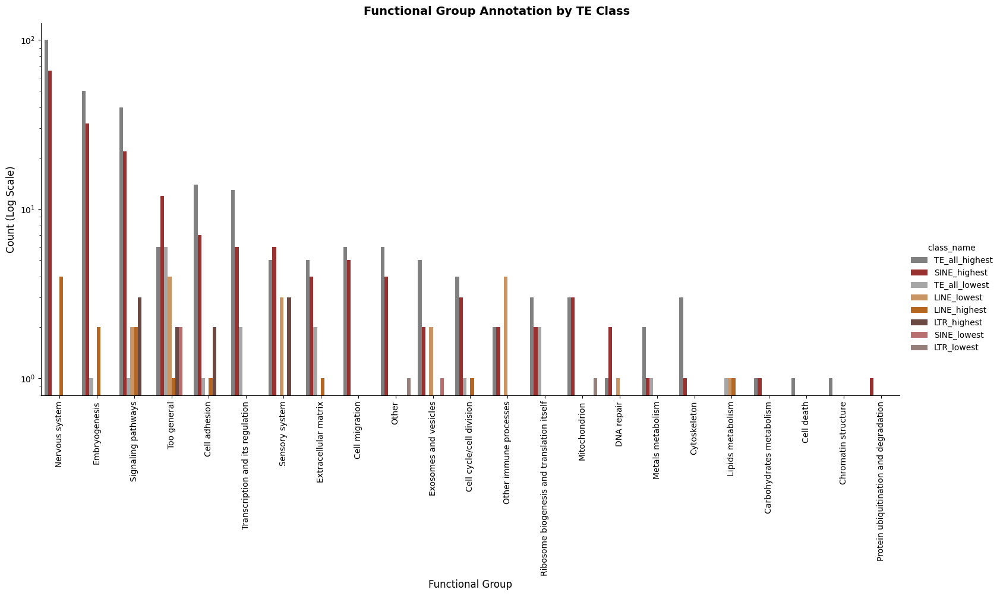

Success: Categorical plot with adjacent bars saved to plots/functional_groups_distribution_divergence.svg


In [27]:
group_order = (
    counts_by_group.groupby("Functional Group")["count"]
    .sum()
    .sort_values(ascending=False)
    .index
)

# Initialize the catplot
# height and aspect together control the final fig size
g = sns.catplot(
    data=counts_by_group,
    x="Functional Group",
    y="count",
    hue="class_name",
    kind="bar",
    palette=class_names_p_modified,
    order=group_order,
    height=7,
    aspect=2.2,
    legend_out=True,
    # gap=0 makes bars within a group touch.
    # width=0.8 ensures there is space between groups.
    gap=0,
    width=0.8,
    # MODIFIED: Removing outlines to eliminate visual gaps between bars
    edgecolor="none",
    linewidth=0,
)

# --- 3. Customizations ---

# Rotate x tick labels by 90 degrees
g.set_xticklabels(rotation=90, fontsize=10)

# Change the y-axis scale to Logarithmic
g.ax.set_yscale("log")

# Set clean titles and labels
g.set_axis_labels("Functional Group", "Count (Log Scale)", fontsize=12)
g.fig.suptitle(
    "Functional Group Annotation by TE Class", y=1.02, fontsize=14, weight="bold"
)

# --- 4. Saving ---

# Ensure the plots subdirectory exists
os.makedirs("plots", exist_ok=True)
save_path = "plots/functional_groups_distribution_divergence.svg"

# Save with transparent background
g.fig.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(f"Success: Categorical plot with adjacent bars saved to {save_path}")

/tmp/ipykernel_131/4026591757.py:48: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


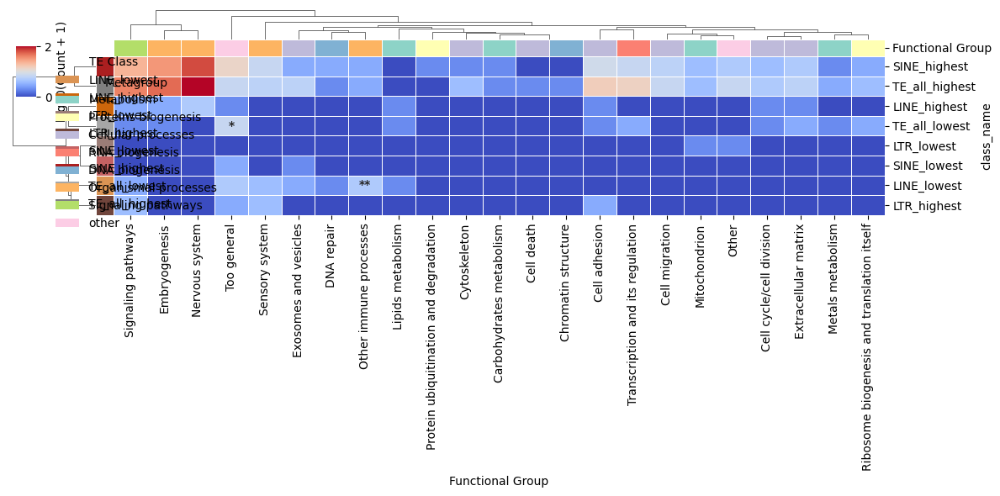

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_top5_perc_by_divergence.svg


In [32]:
# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="class_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(class_names_p_modified)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(12, 6),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.08),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p_modified.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_top5_perc_by_divergence.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

In [17]:
top_5_perc_genes_by_divergence_major_class[
    ["Functional Group", "class_name"]
].value_counts()

Functional Group                            class_name
Nervous system                              TE_all        100
                                            SINE           66
Embryogenesis                               TE_all         51
Signaling pathways                          TE_all         41
Embryogenesis                               SINE           32
Signaling pathways                          SINE           22
Cell adhesion                               TE_all         15
Transcription and its regulation            TE_all         15
Too general                                 SINE           14
                                            TE_all         12
Extracellular matrix                        TE_all          7
Cell adhesion                               SINE            7
Other                                       TE_all          6
Cell migration                              TE_all          6
Transcription and its regulation            SINE            6
Sensory system 

In [15]:
classification = pd.read_csv("GO_terms_divergence_classification_Gemini.csv")
classification

,GO Term Name,Functional Group
0,protein binding,Too general
1,detection of chemical stimulus involved in sen...,Sensory system
2,olfactory receptor activity,Sensory system
3,sensory perception of smell,Sensory system
4,cytoplasm,Too general
...,...,...
351,regulation of synapse assembly,Nervous system
352,cell junction,Cell adhesion
353,adenylate cyclase-inhibiting G protein-coupled...,Signaling pathways
354,heterophilic cell-cell adhesion,Cell adhesion


In [10]:

        "Carbohydrates metabolism",
        "Metals metabolism",
        "Lipids metabolism",
        "Mitochondrion",
        "Protein ubiquitination and degradation",
        "Ribosome biogenesis and translation itself",
        "Cell cycle/cell division",
        "Cell adhesion",
        "Cell migration",
        "Cytoskeleton",
        "Cell death",
        "Exosomes and vesicles",
        "Transcription and its regulation",
        "RNA splicing and processing",
        "Chromatin structure",
        "DNA repair",
        "DNA recombination",
        "DNA replication",
        "Embryogenesis",
        "Nervous system",
        "Sensory system",
        "Other immune processes",
"Signaling pathways",
"Too general", "Other"

('Too general', 'Other')

In [8]:
top_5_perc_genes_by_divergence_major_class

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,divergence_group
0,16,GO:0005515,protein binding,MF,2.373917e-22,4.450145e-18,0.729263,468.0,13442.0,"['ACTR2', 'ADCK2', 'AGTR2', 'AKAP6', 'AKR1C1',...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",LINE,lowest
1,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,7.610603e-19,4.755612e-15,3.473468,66.0,398.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,lowest
2,7,GO:0004984,olfactory receptor activity,MF,5.805870e-19,4.755612e-15,3.491011,66.0,396.0,"['OR10A6', 'OR10A7', 'OR10H2', 'OR10K2', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,lowest
3,1,GO:0007608,sensory perception of smell,BP,8.058897e-18,3.776802e-14,3.286619,67.0,427.0,"['B2M', 'OR10A6', 'OR10A7', 'OR10H2', 'OR10K2'...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,lowest
4,12,GO:0005737,cytoplasm,CC,4.253224e-15,1.594619e-11,0.633945,196.0,6476.0,"['ACSBG1', 'ACTR2', 'ADCY1', 'AGBL5', 'AKAP6',...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A...",LINE,lowest
...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,260,GO:0006457,protein folding,BP,1.219201e-03,8.559980e-02,0.104492,1.0,193.0,['RIC8A'],"['AHSA1', 'AHSA2P', 'AHSP', 'ALG12', 'ANP32E',...",TE_all,highest
512,206,GO:0016020,membrane,CC,1.304551e-03,9.125042e-02,1.173994,320.0,5497.0,"['ABCC3', 'ACSL6', 'ADCY2', 'ADCY8', 'ADCYAP1R...","['A3GALT2', 'A4GALT', 'A4GNT', 'AAAS', 'AADAC'...",TE_all,highest
513,164,GO:0007193,adenylate cyclase-inhibiting G protein-coupled...,BP,1.411913e-03,9.839305e-02,2.881003,11.0,77.0,"['ADRA2A', 'ADRA2B', 'CHRM2', 'GNAZ', 'GRM7', ...","['ADCY10', 'ADCY6', 'ADGRG3', 'ADGRG6', 'ADORA...",TE_all,highest
514,165,GO:0007157,heterophilic cell-cell adhesion,BP,1.428550e-03,9.918371e-02,3.300057,9.0,55.0,"['ALCAM', 'CADM3', 'CBLN1', 'CDH4', 'CRB2', 'N...","['ALCAM', 'AMIGO1', 'AMIGO2', 'AMIGO3', 'CADM1...",TE_all,highest


In [12]:
for term_name in top_5_perc_genes_by_divergence_major_class["Term Name"].unique():
    print(term_name)

protein binding
detection of chemical stimulus involved in sensory perception of smell
olfactory receptor activity
sensory perception of smell
cytoplasm
G protein-coupled receptor activity
cytosol
G protein-coupled receptor signaling pathway
type I interferon receptor binding
B cell activation involved in immune response
natural killer cell activation involved in immune response
nucleoplasm
terpenoid metabolic process
T cell activation involved in immune response
extracellular exosome
protein transport
DNA damage response
potassium ion transport
voltage-gated potassium channel complex
protein kinase binding
potassium ion transmembrane transport
ventricular cardiac muscle cell differentiation
monoatomic ion channel complex
inward rectifier potassium channel activity
extracellular matrix structural constituent conferring tensile strength
cell population proliferation
very-low-density lipoprotein particle
outflow tract septum morphogenesis
cell-cell adhesion
oxidoreductase activity, actin

In [13]:
len(top_5_perc_genes_by_divergence_major_class["Term Name"].unique())

356

In [11]:
top_5_perc_genes_by_divergence_major_class["Term Name"].value_counts()

Term Name
signal transduction                                                                  4
plasma membrane                                                                      4
cytoplasm                                                                            3
sensory perception of smell                                                          3
cell-cell adhesion                                                                   3
                                                                                    ..
central nervous system vasculogenesis                                                1
epithelial cell differentiation involved in prostate gland development               1
oxidoreductase activity, acting on the CH-NH2 group of donors, oxygen as acceptor    1
neuroligin family protein binding                                                    1
mammary gland development                                                            1
Name: count, Length: 356, dtype: 

# Analysis of enriched TE families and subfamilies - genes in their vicinity

## Families

1. Build distributions of counts by family near genes
2. Extract top 5% of genes that have highest number of elements of each family, maximum number is 5% of the whole set of genes (1436)
3. Build intersection plots (supervenns) for them. Annotate using class palette?
4. Build network of intersections for them like for GO terms earlier.
5. Get GO terms
6. Interaction networks, with more stringent criteria
7. Heatmaps by processes metagroup
8. Correlations of GO terms significance/number with enrichment score near genes (based on the Fisher exact test approach)

In [37]:
len(list(set(",".join(list(TEs_on_genes["TE_subfamilies"])).split(","))))

1130

In [73]:
TEs_on_genes

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
0,chr1,8582,18582,LOC127239154,0.2922687913,"106,325,223,236,164,87,166,217,153,337,183,195...","MER4A1,MLT1I,L1M5,MLT1H2,L1MA4,AluY,MER4D1,MER...","ERV1,ERVL-MaLR,L1,ERVL-MaLR,L1,Alu,ERV1,ERV1,E...","LTR,LTR,LINE,LTR,LINE,SINE,LTR,LTR,LTR,SINE,LT...","0.2202762429,0.8299625,0.572213,.,0.5469095429...",...,0,0,0,15,193.500000,198.000000,170.166667,NaN,NaN,NaN
1,chr1,49612,59612,LOC101928626,0.4283229986,"254,194,206,281,218,126,247,133,74,89,303,395,...","L1ME4a,L2a,L2c,MIRb,LTR37B,AluSq,MLT1O,MSTA,Al...","L1,L2,L2,MIR,ERV1,Alu,ERVL-MaLR,ERVL-MaLR,Alu,...","LINE,LINE,LINE,SINE,LTR,SINE,LTR,LTR,SINE,SINE...","0.177422835,0.4724386174,0.5349553862,0.534999...",...,1,0,0,23,226.428571,201.200000,180.800000,395.0,NaN,NaN
2,chr1,107877,117877,OR4F16,-0.1430819362,"163,78,229,184,161,300,350,130,340,234","L1MA7,L1PA7,L1M4,L1MA4,L1MA4,MIR3,MIRc,L2c,MIR...","L1,L1,L1,L1,L1,MIR,MIR,L2,MIR,MIR","LINE,LINE,LINE,LINE,LINE,SINE,SINE,LINE,SINE,SINE","0.391722927,1.167674433,-0.931795,-0.111012058...",...,0,0,0,10,157.500000,NaN,306.000000,NaN,NaN,NaN
3,chr1,132287,142287,LOC127239154,-0.4371188212,"333,282,270,243,325,274,135,228,118,3,126,248,...","L1M5,L2a,L1ME3D,L2,LTR33B,MER65D,L1MA5,MLT1D,T...","L1,L2,L1,L2,ERVL,ERV1,L1,ERVL-MaLR,ERVL-MaLR,A...","LINE,LINE,LINE,LINE,LTR,LTR,LINE,LTR,LTR,SINE,...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,17,246.500000,236.250000,79.000000,NaN,NaN,NaN
4,chr1,133480,143480,LOC127239154,-0.4101818372,"333,282,270,243,135,228,118,3,126,248,347,61,2...","L1M5,L2a,L1ME3D,L2,L1MA5,MLT1D,THE1D,AluYa5,L1...","L1,L2,L1,L2,L1,ERVL-MaLR,ERVL-MaLR,Alu,L1,L2,L...","LINE,LINE,LINE,LINE,LINE,LTR,LTR,SINE,LINE,LIN...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,15,246.500000,173.000000,79.000000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,chrY,62185165,62195165,SPRY3,0.204364463,"104,94,313,226,204,196,218,269,169,234,242,225...","L1PA16,L1PA16,L2c,L2a,L2a,L2c,MIRc,L2c,MLT1A0,...","L1,L1,L2,L2,L2,L2,MIR,L2,ERVL-MaLR,MIR,MIR,MIR...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,LINE,LTR,SI...","0.17978186,0.5729008,.,.,.,.,.,0.9911925778,.,...",...,2,0,0,17,200.857143,169.000000,257.857143,295.5,NaN,NaN
38700,chrY,62301324,62311324,VAMP7,0.2318653989,"153,71,340,114,114,308,271,71,74,293,320,109,2...","L1PA17,L1PA10,L2a,L1PA17,FRAM,L2,MIRc,MER41A,M...","L1,L1,L2,L1,Alu,L2,MIR,ERV1,ERVL-MaLR,MIR,L2,A...","LINE,LINE,LINE,LINE,SINE,LINE,SINE,LTR,LTR,SIN...","-0.4256057778,0.1826155477,0.1826155477,-0.576...",...,2,0,0,23,252.090909,107.000000,169.428571,279.5,NaN,NaN
38701,chrY,62417686,62427686,IL9R,0.1765993647,"143,112,141,208,245,159,168,119,153,202,75,143...","L1MA7,L1MB3,L1M4c,L1MEb,L1ME3G,L1M4,AluJb,AluS...","L1,L1,L1,L1,L1,L1,Alu,Alu,Alu,hAT-Charlie,MIR,...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,SINE,SINE,D...","-0.1042256162,-0.06625528413,-0.3867034074,-0....",...,1,0,0,23,187.285714,NaN,159.200000,202.0,NaN,NaN
38702,chrY,62436822,62446822,WASIR1,0.8498523286,"201,228,119,149,234,150,117,103,79,120,104,116...","MLT1C2,LTR35B,AluSq2,MER66A,L1MC,AluSx,AluSx,F...","ERVL-MaLR,ERV1,Alu,ERV1,L1,Alu,Alu,Alu,Alu,Alu...","LTR,LTR,SINE,LTR,LINE,SINE,SINE,SINE,SINE,SINE...",".,.,.,.,0.8498523286,.,-0.1954545,.,.,1.807282...",...,0,0,0,16,215.000000,192.666667,124.111111,NaN,NaN,NaN


In [10]:
family_names_curated = [
    "I-Jockey",
    "TcMar-Tigger",
    "Kolobok",
    "hAT",
    "hAT-Tag1",
    "MULE-MuDR",
    "ERVL",
    "tRNA-RTE",
    "TcMar-Pogo",
    "hAT-Tip100",
    "ERVK",
    "Penelope",
    "L1-Tx1",
    "ERVL-MaLR",
    "Gypsy",
    "PiggyBac",
    "TcMar-Mariner",
    "RTE-BovB",
    "hAT-hAT19",
    "L2",
    "hAT?",
    "Crypton-A",
    "tRNA-Deu",
    "TcMar-Tc1",
    "CR1",
    "hAT-Tip100?",
    "hAT-Ac",
    "Alu",
    "hAT-Charlie",
    "5S-Deu-L2",
    "Crypton",
    "PIF-Harbinger",
    "MIR",
    "RTE-X",
    "L1",
    "ERV1",
    "Merlin",
    "Helitron",
    "SVA",
    "tRNA",
    "Dong-R4",
    "TcMar-Tc2",
    "TcMar",
    "hAT-Blackjack",
]

TEs_on_genes_with_classes = TEs_on_genes.copy()

for family_name in family_names_curated:
    TEs_on_genes_with_classes[f"{family_name}_number"] = TEs_on_genes_with_classes[
        "TE_families"
    ].apply(
        lambda str_concat: (
            len(
                [name for name in str_concat.split(",") if name == family_name]
                if str_concat and pd.notna(str_concat)
                else []
            )
        )
    )

TEs_on_genes_with_classes = TEs_on_genes_with_classes[
    ["Gene_name"] + [f"{family_name}_number" for family_name in family_names_curated]
]
TEs_on_genes_with_classes

,Gene_name,I-Jockey_number,TcMar-Tigger_number,Kolobok_number,hAT_number,hAT-Tag1_number,MULE-MuDR_number,ERVL_number,tRNA-RTE_number,TcMar-Pogo_number,...,L1_number,ERV1_number,Merlin_number,Helitron_number,SVA_number,tRNA_number,Dong-R4_number,TcMar-Tc2_number,TcMar_number,hAT-Blackjack_number
0,LOC127239154,0,0,0,0,0,0,0,0,0,...,2,5,0,0,0,0,0,0,0,0
1,LOC101928626,0,0,0,0,0,0,1,0,0,...,2,2,0,0,0,0,0,0,0,0
2,OR4F16,0,0,0,0,0,0,0,0,0,...,5,0,0,0,0,0,0,0,0,0
3,LOC127239154,0,0,0,0,0,0,1,0,0,...,6,1,0,0,0,0,0,0,0,0
4,LOC127239154,0,0,0,0,0,0,0,0,0,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,SPRY3,0,1,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
38700,VAMP7,0,1,0,0,0,0,0,0,0,...,3,1,0,0,0,0,0,0,0,0
38701,IL9R,0,0,0,0,0,0,0,0,0,...,6,0,0,0,0,0,0,0,0,0
38702,WASIR1,0,0,0,0,0,0,0,0,0,...,3,2,0,0,0,0,0,0,0,0


In [30]:
len(TEs_on_genes)//20

1935

In [28]:
TEs_on_genes_with_classes = TEs_on_genes.copy()
family_names = list(
    set(",".join(list(TEs_on_genes_with_classes["TE_families"].astype(str))).split(","))
)

for family_name in family_names:
    TEs_on_genes_with_classes[f"{family_name}_number"] = TEs_on_genes_with_classes[
        "TE_families"
    ].apply(
        lambda str_concat: (
            len(
                [name for name in str_concat.split(",") if name == family_name]
                if str_concat and pd.notna(str_concat)
                else []
            )
        )
    )

family_names_curated = [
    "I-Jockey",
    "TcMar-Tigger",
    "Kolobok",
    "hAT",
    "hAT-Tag1",
    "MULE-MuDR",
    "ERVL",
    "tRNA-RTE",
    "TcMar-Pogo",
    "hAT-Tip100",
    "ERVK",
    "Penelope",
    "L1-Tx1",
    "ERVL-MaLR",
    "Gypsy",
    "PiggyBac",
    "TcMar-Mariner",
    "RTE-BovB",
    "hAT-hAT19",
    "L2",
    "hAT?",
    "Crypton-A",
    "tRNA-Deu",
    "TcMar-Tc1",
    "CR1",
    "hAT-Tip100?",
    "hAT-Ac",
    "Alu",
    "hAT-Charlie",
    "5S-Deu-L2",
    "Crypton",
    "PIF-Harbinger",
    "MIR",
    "RTE-X",
    "L1",
    "ERV1",
    "Merlin",
    "Helitron",
    "SVA",
    "tRNA",
    "Dong-R4",
    "TcMar-Tc2",
    "TcMar",
    "hAT-Blackjack",
]

TEs_on_genes_with_classes = TEs_on_genes_with_classes[
    ["Gene_name"] + [f"{family_name}_number" for family_name in family_names_curated]
]
TEs_on_genes_with_classes

TypeError: sequence item 8824: expected str instance, float found

In [9]:
(
    TEs_on_genes_with_classes[
        [f"{family_name}_number" for family_name in family_names_curated]
    ]
    != 0
).sum()

I-Jockey_number            18
TcMar-Tigger_number      8456
Kolobok_number             33
hAT_number                269
hAT-Tag1_number           264
MULE-MuDR_number          176
ERVL_number              7440
tRNA-RTE_number           523
TcMar-Pogo_number           3
hAT-Tip100_number        6002
ERVK_number              1058
Penelope_number           119
L1-Tx1_number              13
ERVL-MaLR_number        13972
Gypsy_number             1392
PiggyBac_number           166
TcMar-Mariner_number     1396
RTE-BovB_number           787
nan_number                  0
hAT-hAT19_number            1
L2_number               30376
hAT?_number                 3
Crypton-A_number           12
tRNA-Deu_number            56
TcMar-Tc1_number          106
CR1_number               7109
hAT-Tip100?_number          4
hAT-Ac_number             494
Alu_number              34977
hAT-Charlie_number      18731
5S-Deu-L2_number          302
Crypton_number             23
PIF-Harbinger_number       16
MIR_number

### Histogram of TE count near genes by family

In [20]:
families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()
family_to_class

{'L1': 'LINE',
 'ERV1': 'LTR',
 'ERVL-MaLR': 'LTR',
 'Alu': 'SINE',
 'MIR': 'SINE',
 'hAT-Charlie': 'DNA',
 'MULE-MuDR': 'DNA',
 'TcMar-Tigger': 'DNA',
 'L2': 'LINE',
 'RTE-X': 'LINE',
 'ERVL': 'LTR',
 'CR1': 'LINE',
 'ERVK': 'LTR',
 'SVA': 'Retroposon',
 'Gypsy': 'LTR',
 'hAT-Blackjack': 'DNA',
 'hAT-Tip100': 'DNA',
 'hAT-Tag1': 'DNA',
 'tRNA-Deu': 'SINE',
 'RTE-BovB': 'LINE',
 'hAT-Ac': 'DNA',
 '5S-Deu-L2': 'SINE',
 'PiggyBac': 'DNA',
 'hAT': 'DNA',
 'tRNA-RTE': 'SINE',
 'Helitron': 'RC',
 'TcMar-Mariner': 'DNA',
 'TcMar-Tc2': 'DNA',
 'tRNA': 'SINE',
 'I-Jockey': 'LINE',
 'Penelope': 'LINE',
 'Dong-R4': 'LINE',
 'TcMar': 'DNA',
 'Kolobok': 'DNA',
 'TcMar-Tc1': 'DNA',
 'Merlin': 'DNA',
 'hAT?': 'DNA',
 'TcMar-Pogo': 'DNA',
 'L1-Tx1': 'LINE',
 'Crypton': 'DNA',
 'Crypton-A': 'DNA',
 'PIF-Harbinger': 'DNA',
 'hAT-Tip100?': 'DNA',
 'hAT-hAT19': 'DNA'}

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  self._figure.tight_layout(*args, **kwargs)


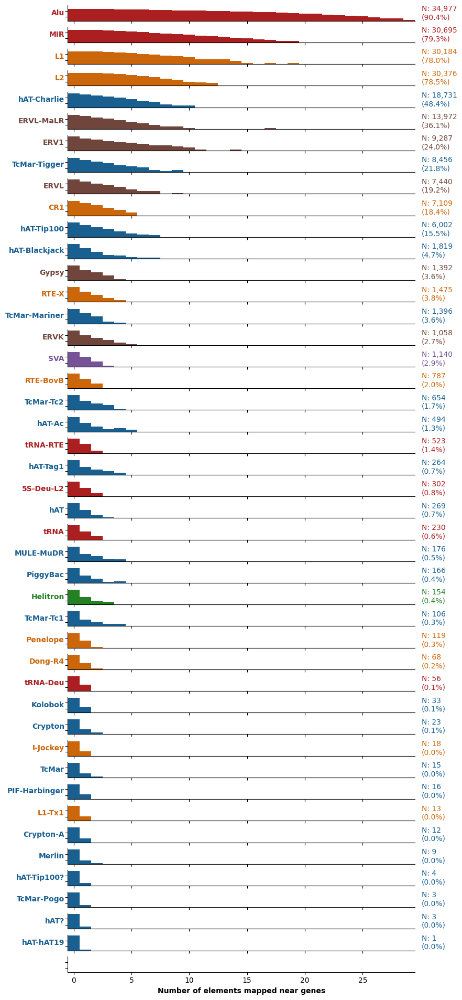

Success: Correctly colored log-y ridge plot with linear x-scale and occupancy stats saved to plots/TE_family_distributions_near_TSS_log_ridge.svg


In [72]:
GLOBAL_FONT_SIZE = 10

means = TEs_on_genes_with_classes.mean().sort_values(ascending=False)
ordered_cols = means.index.tolist()

df_long = TEs_on_genes_with_classes[ordered_cols].melt(
    var_name="family_col", value_name="count"
)
df_long["family_name"] = df_long["family_col"].str.replace("_number", "")
df_long["class_name"] = df_long["family_name"].map(family_to_class)
df_long = df_long.dropna(subset=["class_name"])

ordered_families = [c.replace("_number", "") for c in ordered_cols]

# --- 4. Visualization (Colored Log-Scaled Ridge Plot) ---

# Initialize the FacetGrid
g = sns.FacetGrid(
    df_long,
    row="family_name",
    hue="class_name",
    palette=class_names_p,
    aspect=22,
    height=0.43,
    sharex=True,
    row_order=ordered_families,
)

# Use g.map to ensure the color from the hue/palette is passed correctly
g.map(
    sns.histplot,
    "count",
    discrete=True,
    element="bars",
    fill=True,
    alpha=1.0,
    linewidth=0,
    shrink=1,
)


def finalize_facets(data, color, label, **kwargs):
    ax = plt.gca()

    # 1. Apply log scale to the Y axis (counts)
    # Backtracked: X axis is now linear as requested
    ax.set_yscale("log")

    # 2. Set limits
    # Y-limit starts at 0.5 so that count=1 is visible on log scale
    ax.set_ylim(0.5, ax.get_ylim()[1])
    # Linear X scale starting at -0.5 to show 0 bin clearly
    ax.set_xlim(-0.5, df_long["count"].max() + 0.5)

    # 3. Add a baseline at 0.5 to serve as a visual floor
    ax.axhline(y=0.5, lw=1, color="black", alpha=0.1, clip_on=False)

    # 4. Make Axis labels pretty and visible
    # Y Axis (Counts per bin)
    ax.yaxis.set_major_locator(LogLocator(base=10.0, numticks=4))
    # MODIFIED: Removed ScalarFormatter and used NullFormatter to hide Y tick labels
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_minor_formatter(NullFormatter())

    # Style the ticks with the global font size
    ax.tick_params(axis="x", labelsize=GLOBAL_FONT_SIZE)
    # Ensure Y tick labels are hidden
    ax.tick_params(axis="y", left=True, labelleft=False)

    ax.set_ylabel(
        "Count", fontsize=GLOBAL_FONT_SIZE, rotation=0, labelpad=15, va="center"
    )

    # 5. Add the FAMILY name labels on the left
    full_title = ax.get_title()
    if "=" in full_title:
        family_display_name = full_title.split("=")[-1].strip()
    else:
        family_display_name = kwargs.get("row_name", label)

    ax.text(
        -0.01,
        0.5,
        family_display_name,
        fontweight="bold",
        color=color,
        ha="right",
        va="center",
        transform=ax.transAxes,
        fontsize=GLOBAL_FONT_SIZE,
    )

    # 6. Add Statistics on the right (Number and % of non-zero rows)
    n_total = len(data)
    n_nonzero = (data > 0).sum()
    pct_nonzero = (n_nonzero / n_total) * 100 if n_total > 0 else 0

    stats_text = f"N: {n_nonzero:,}\n({pct_nonzero:.1f}%)"
    ax.text(
        1.02,
        0.5,
        stats_text,
        color=color,
        ha="left",
        va="center",
        transform=ax.transAxes,
        fontsize=GLOBAL_FONT_SIZE,
    )


# Pass "count" to map our formatting function across all facets
g.map(finalize_facets, "count")

# Clean up visual layout
g.set_titles("")
g.set_ylabels("")
# g.set_yticks([])
g.despine(bottom=False, left=False)  # Keep both for a more standard look

# Formatting X-axis with the global font size
g.set_xlabels(
    "Number of elements mapped near genes", fontsize=GLOBAL_FONT_SIZE, fontweight="bold"
)

# Adjust layout to accommodate family names on left and statistics on right
g.fig.subplots_adjust(hspace=0.4, left=0.15, right=0.85)

# --- 5. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_family_distributions_near_TSS_log_ridge.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Correctly colored log-y ridge plot with linear x-scale and occupancy stats saved to {save_path}"
)

### Extraction of top genes and their GO analysis

In [75]:
TEs_on_genes_with_classes

,Gene_name,I-Jockey_number,TcMar-Tigger_number,Kolobok_number,hAT_number,hAT-Tag1_number,MULE-MuDR_number,ERVL_number,tRNA-RTE_number,TcMar-Pogo_number,...,L1_number,ERV1_number,Merlin_number,Helitron_number,SVA_number,tRNA_number,Dong-R4_number,TcMar-Tc2_number,TcMar_number,hAT-Blackjack_number
0,LOC127239154,0,0,0,0,0,0,0,0,0,...,2,5,0,0,0,0,0,0,0,0
1,LOC101928626,0,0,0,0,0,0,1,0,0,...,2,2,0,0,0,0,0,0,0,0
2,OR4F16,0,0,0,0,0,0,0,0,0,...,5,0,0,0,0,0,0,0,0,0
3,LOC127239154,0,0,0,0,0,0,1,0,0,...,6,1,0,0,0,0,0,0,0,0
4,LOC127239154,0,0,0,0,0,0,0,0,0,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,SPRY3,0,1,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
38700,VAMP7,0,1,0,0,0,0,0,0,0,...,3,1,0,0,0,0,0,0,0,0
38701,IL9R,0,0,0,0,0,0,0,0,0,...,6,0,0,0,0,0,0,0,0,0
38702,WASIR1,0,0,0,0,0,0,0,0,0,...,3,2,0,0,0,0,0,0,0,0


In [78]:
genes_to_take_number = len(TEs_on_genes_with_classes["Gene_name"].unique()) // 20
genes_to_take_number

1436

In [82]:
family_name = "Alu"

In [84]:
TEs_on_genes_with_classes[
    TEs_on_genes_with_classes[f"{family_name}_number"] != 0
].sort_values(f"{family_name}_number", ascending=False)[
    ["Gene_name", f"{family_name}_number"]
]

,Gene_name,Alu_number
36680,DYNC2I2,29
19336,MIR521-2,28
19353,MIR516A1,28
19352,MIR527,28
19351,MIR519A1,28
...,...,...
38670,PRY2,1
31,MIR429,1
30,MIR200A,1
26,RNF223,1


In [86]:
genes_by_TE_number

['DYNC2I2',
 'MIR521-2',
 'MIR516A1',
 'MIR527',
 'MIR519A1',
 'QTRT1',
 'MIR1283-2',
 'ZNF487',
 'MIR6088',
 'C17orf98',
 'NLRP2',
 'SNRNP35',
 'MIR517B',
 'MIR520G',
 'ARIH2',
 'NDUFAF1',
 'NLRP7',
 'UHRF1',
 'CECR2',
 'ECSIT',
 'SHMT1',
 'ARHGAP39',
 'CBFA2T2',
 'ARIH2OS',
 'MIR522',
 'NWD1',
 'MIR10525',
 'ARRDC5',
 'MIR520D',
 'FAM234A',
 'ACER1',
 'RNU11',
 'MIR516B2',
 'PSMD4',
 'MIR373',
 'MIR520B',
 'MIR518F',
 'MIR519D',
 'DPRX',
 'MIR512-2',
 'MIR4518',
 'SLC25A16',
 'LINC02124',
 'MIR518B',
 'LINC00254',
 'LOC105377763',
 'NANOGNB',
 'MIR6886',
 'BCL2L13',
 'MIR518E',
 'MIR526A1',
 'NXNL1',
 'SAR1B',
 'NEMP1',
 'GANAB',
 'DAND5',
 'TEX28',
 'FAM222B',
 'MED1',
 'AARS1',
 'SLC25A20',
 'IHO1',
 'SLC44A2',
 'SUMO2',
 'SNF8',
 'DPY30',
 'SAGSIN1',
 'FBXL18',
 'ERCC2',
 'FBXO46',
 'TYK2',
 'FAM220A',
 'LOC221946',
 'PHKG1',
 'MIR512-1',
 'MIR520C',
 'EIF3C',
 'MUC16',
 'MIR371A',
 'MIR516A2',
 'SMIM40',
 'MIR371B',
 'MIR372',
 'MIR516B1',
 'L3MBTL2',
 'LINC01150',
 'UQCRHL',
 'W

In [85]:
genes_by_TE_number = list(
    TEs_on_genes_with_classes[TEs_on_genes_with_classes[f"{family_name}_number"] != 0]
    .sort_values(f"{family_name}_number", ascending=False)[["Gene_name"]]
    .drop_duplicates()["Gene_name"]
)

In [90]:
family_names_curated

['I-Jockey',
 'TcMar-Tigger',
 'Kolobok',
 'hAT',
 'hAT-Tag1',
 'MULE-MuDR',
 'ERVL',
 'tRNA-RTE',
 'TcMar-Pogo',
 'hAT-Tip100',
 'ERVK',
 'Penelope',
 'L1-Tx1',
 'ERVL-MaLR',
 'Gypsy',
 'PiggyBac',
 'TcMar-Mariner',
 'RTE-BovB',
 'nan',
 'hAT-hAT19',
 'L2',
 'hAT?',
 'Crypton-A',
 'tRNA-Deu',
 'TcMar-Tc1',
 'CR1',
 'hAT-Tip100?',
 'hAT-Ac',
 'Alu',
 'hAT-Charlie',
 '5S-Deu-L2',
 'Crypton',
 'PIF-Harbinger',
 'MIR',
 'RTE-X',
 'L1',
 'ERV1',
 'Merlin',
 'Helitron',
 'SVA',
 'tRNA',
 'Dong-R4',
 'TcMar-Tc2',
 'TcMar',
 'hAT-Blackjack']

In [92]:
# gather top  5% genes by families and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_with_classes["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_with_classes["Gene_name"].unique()) // 20

families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()

for family_name in family_names_curated:
    print(
        f"""
    {family_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes_with_classes[
            TEs_on_genes_with_classes[f"{family_name}_number"] != 0
        ]
        .sort_values(f"{family_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    else:
        genes_to_take = genes_by_TE_number

    sets_genes.append(set(genes_to_take))

    labels_genes.append(family_name)

    results_GO = run_goatools_enrichment(genes_to_take, background_list=background_list)
    results_GO["family_name"] = family_name
    results_GO["class_name"] = family_to_class[family_name]
    significant_terms_dfs.append(results_GO)


top_5_perc_genes_by_families = pd.concat(significant_terms_dfs, axis=0)
top_5_perc_genes_by_families


    I-Jockey
    
    
Loading GO DAG...
go-basic.obo: fmt(1.2) rel(2025-10-10) 42,666 Terms
Loading Human Annotations and mapping symbols...
HMS:0:00:21.473003 972,437 annotations READ: goa_human.gaf 
Initializing Enrichment Study...

Load  Ontology Enrichment Analysis ...
 66% 18,930 of 28,738 population items found in association
Running Analysis on 15 genes...

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(28738)
Calculating 18,746 uncorrected p-values using fisher_scipy_stats
  18,746 terms are associated with 18,930 of 28,738 population items
     246 terms are associated with     15 of     15 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.1=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
No signifi

,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
13,ERVL,LTR,GO:0005515,protein binding,MF,2.955902e-15,5.541134e-11,0.784601,527.0,13442.0,"[AANAT, ABRAXAS1, ACRV1, ACTL8, ACTL9, ADA, AD...","[A1CF, A2M, AAAS, AACS, AADAC, AAGAB, AAK1, AA..."
7,ERVL,LTR,GO:0005654,nucleoplasm,CC,3.788539e-11,3.550997e-07,0.577338,104.0,3605.0,"[ABRAXAS1, AK9, ALKBH3, ASXL2, AURKB, C5orf24,...","[A1CF, AAAS, ABCA6, ABCF1, ABHD14B, ABHD16B, A..."
8,ERVL,LTR,GO:0005737,cytoplasm,CC,2.372002e-10,1.482185e-06,0.707670,229.0,6476.0,"[AANAT, ACADM, ACOT6, ACRV1, ACTL8, ADA, ADGRG...","[A1CF, AAGAB, AAMDC, AAMP, AANAT, AARS1, AARS2..."
5,ERVL,LTR,GO:0045944,positive regulation of transcription by RNA po...,BP,8.111201e-10,3.801315e-06,0.331333,20.0,1208.0,"[ASXL2, EAF2, HDAC2, IL17F, KDM4C, LILRB1, MEI...","[AAMDC, ABHD14B, ABL1, ABLIM1, ABLIM3, ABRA, A..."
9,ERVL,LTR,GO:0005829,cytosol,CC,2.020804e-09,7.576400e-06,0.678189,171.0,5046.0,"[AANAT, ACOT6, ADA, AGBL4, AK9, ALDH3A2, ARFRP...","[AACS, AAGAB, AAK1, AAMP, AANAT, AARS1, AASDHP..."
...,...,...,...,...,...,...,...,...,...,...,...,...
1,SVA,Retroposon,GO:0006397,mRNA processing,BP,4.324068e-06,2.026475e-02,2.410306,33.0,409.0,"[AICDA, ARGLU1, CWC25, DHX38, EIF4A3, HNRNPF, ...","[A1CF, AAR2, ACIN1, ADAR, ADARB1, ADARB2, AFF2..."
0,SVA,Retroposon,GO:0006369,termination of RNA polymerase II transcription,BP,3.303622e-06,2.026475e-02,12.802792,6.0,14.0,"[POLR2A, SSU72L1, SSU72L2, SSU72L3, SSU72L4, S...","[MAZ, PCF11, POLR2A, SCAF8, SETX, SSU72, SSU72..."
5,SVA,Retroposon,GO:0019899,enzyme binding,MF,5.647310e-06,2.117289e-02,2.426248,32.0,394.0,"[ARMT1, ATG3, CBS, COPS5, CYP1A1, DNM2, DYNLL1...","[A2M, ABCD1, ABL1, ABL2, ACAT1, ACIN1, ACSL6, ..."
3,SVA,Retroposon,GO:0005654,nucleoplasm,CC,2.463450e-05,7.696638e-02,1.367288,165.0,3605.0,"[ABTB3, ADI1, AIP, APOBEC3B, ARGLU1, ARIH2, AT...","[A1CF, AAAS, ABCA6, ABCF1, ABHD14B, ABHD16B, A..."


In [ ]:
# gather top  5% genes by families for SUPPLEMENTARY
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_with_classes["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_with_classes["Gene_name"].unique()) // 20

families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()

for family_name in family_names_curated:
    print(
        f"""
    {family_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes_with_classes[
            TEs_on_genes_with_classes[f"{family_name}_number"] != 0
        ]
        .sort_values(f"{family_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    else:
        genes_to_take = genes_by_TE_number

    sets_genes.append(set(genes_to_take))

    labels_genes.append(family_name)

    results_GO = run_goatools_enrichment(genes_to_take, background_list=background_list)
    results_GO["family_name"] = family_name
    results_GO["class_name"] = family_to_class[family_name]
    significant_terms_dfs.append(results_GO)


top_5_perc_genes_by_families = pd.concat(significant_terms_dfs, axis=0)
top_5_perc_genes_by_families

In [97]:
labels_genes

['I-Jockey',
 'TcMar-Tigger',
 'Kolobok',
 'hAT',
 'hAT-Tag1',
 'MULE-MuDR',
 'ERVL',
 'tRNA-RTE',
 'TcMar-Pogo',
 'hAT-Tip100',
 'ERVK',
 'Penelope',
 'L1-Tx1',
 'ERVL-MaLR',
 'Gypsy',
 'PiggyBac',
 'TcMar-Mariner',
 'RTE-BovB',
 'hAT-hAT19',
 'L2',
 'hAT?',
 'Crypton-A',
 'tRNA-Deu',
 'TcMar-Tc1',
 'CR1',
 'hAT-Tip100?',
 'hAT-Ac',
 'Alu',
 'hAT-Charlie',
 '5S-Deu-L2',
 'Crypton',
 'PIF-Harbinger',
 'MIR',
 'RTE-X',
 'L1',
 'ERV1',
 'Merlin',
 'Helitron',
 'SVA',
 'tRNA',
 'Dong-R4',
 'TcMar-Tc2',
 'TcMar',
 'hAT-Blackjack']

In [96]:
sets_genes

[{'CHST8',
  'CPM',
  'EDN2',
  'FAM13C',
  'HMGN4',
  'IFT70B',
  'NR0B1',
  'PALM2AKAP2',
  'PDLIM1',
  'PICALM',
  'PROK1',
  'SYT15',
  'SYT15B',
  'UCK2',
  'USP8'},
 {'RPL21P44',
  'DIAPH3',
  'RPA3',
  'ZNF222',
  'MIR7151',
  'TCF4',
  'FABP6',
  'MIR6783',
  'MIR4494',
  'POPDC3',
  'APBA2',
  'LINC01555',
  'CARD6',
  'MIR877',
  'IFNGR1',
  'ANAPC16',
  'NALCN-AS1',
  'GRM8',
  'IPO8',
  'MTMR1',
  'PAPOLB',
  'SESN1',
  'MIR4502',
  'MRPL44',
  'ZIM3',
  'SKAP2',
  'MAIP1',
  'TNNT1',
  'SPATA5',
  'ZNF785',
  'MIR653',
  'LOC101928937',
  'NPY2R',
  'PI16',
  'SNRPN',
  'ST6GALNAC1',
  'ANKRD31',
  'LINC00477',
  'RBM47',
  'SCARNA18',
  'AKR1C6P',
  'SLF2',
  'ZBTB8A',
  'MIR4454',
  'PPBPP2',
  'NR2C1',
  'RPS6',
  'TCP11L2',
  'SNORA80D',
  'MTCL1',
  'OR2T2',
  'LINC01624',
  'SNORA24B',
  'USP6NL-AS1',
  'TFCP2',
  'SPATA4',
  'DNAJC15',
  'NEIL3',
  'CSNK1G3',
  'LINC00392',
  'GJD4',
  'RGPD1',
  'APPBP2',
  'LINC02417',
  'IFI27L1',
  'C4orf50',
  'MIR3141',
  'CAR

In [19]:
pd.DataFrame(list(sets_genes[0]), columns = ['Gene name'])

,Gene name
0,PDLIM1
1,SYT15B
2,SYT15
3,CHST8
4,UCK2
5,USP8
6,PALM2AKAP2
7,HMGN4
8,FAM13C
9,PICALM


In [21]:
with pd.ExcelWriter("Supplementary File 7.xlsx") as writer:
    for i, family in enumerate(labels_genes):
        pd.DataFrame(list(sets_genes[i]), columns = ['Gene name']).to_excel(writer, sheet_name=family.replace('?', '...'))


In [93]:
top_5_perc_genes_by_families.to_csv("top_5_perc_genes_by_families.csv")

In [95]:
top_5_perc_genes_by_families["family_name"].value_counts()

family_name
Alu            52
MIR            33
ERV1           25
L1             22
ERVL           16
ERVL-MaLR      13
CR1             9
hAT-Charlie     7
SVA             6
Gypsy           6
ERVK            3
hAT-Tip100      1
L2              1
Dong-R4         1
Name: count, dtype: int64

### Supervenn

TOO LONG

In [98]:
??supervenn

Signature:
supervenn(
    sets,
    set_annotations=None,
    figsize=None,
    side_plots=True,
    chunks_ordering='minimize gaps',
    sets_ordering=None,
    reverse_chunks_order=True,
    reverse_sets_order=True,
    max_bruteforce_size=8,
    seeds=10000,
    noise_prob=0.0075,
    side_plot_width=1,
    min_width_for_annotation=1,
    widths_minmax_ratio=None,
    side_plot_color='gray',
    dpi=None,
    ax=None,
    **kw,
)
Source:   
def supervenn(sets, set_annotations=None, figsize=None, side_plots=True,
              chunks_ordering='minimize gaps', sets_ordering=None,
              reverse_chunks_order=True, reverse_sets_order=True,
              max_bruteforce_size=DEFAULT_MAX_BRUTEFORCE_SIZE, seeds=DEFAULT_SEEDS, noise_prob=DEFAULT_NOISE_PROB,
              side_plot_width=1, min_width_for_annotation=1, widths_minmax_ratio=None, side_plot_color='gray',
              dpi=None, ax=None, **kw):
    """
    Plot a diagram visualizing relationship of multiple sets.
    :param

In [99]:
# --- 2. Plotting ---

# Figure size set to (20, 6) to give more vertical headroom
fig = plt.figure(figsize=(15, 6))

# Generate the supervenn plot
# Removed set_colors/sets_colors to avoid TypeError
sv = supervenn(
    sets_genes,
    labels_genes,
    sets_ordering="minimize",
    rotate_col_annotations=True,
    min_width_for_annotation=10,
    widths_minmax_ratio=0.12,
    side_plot_width=1,
    col_annotations_area_height=1,
)


plt.title("SuperVenn Diagram of TE FAmily Gene Set Overlaps ", fontsize=14, pad=20)

# --- 4. Saving ---

# Ensure the plots subdirectory exists
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_top_5perc_genes_by_families_supervenn.svg"

# Save with transparent background
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: SuperVenn plot with manually applied custom colors saved to {save_path}"
)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7fdfa3923370> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



### Network visualization for gene sets

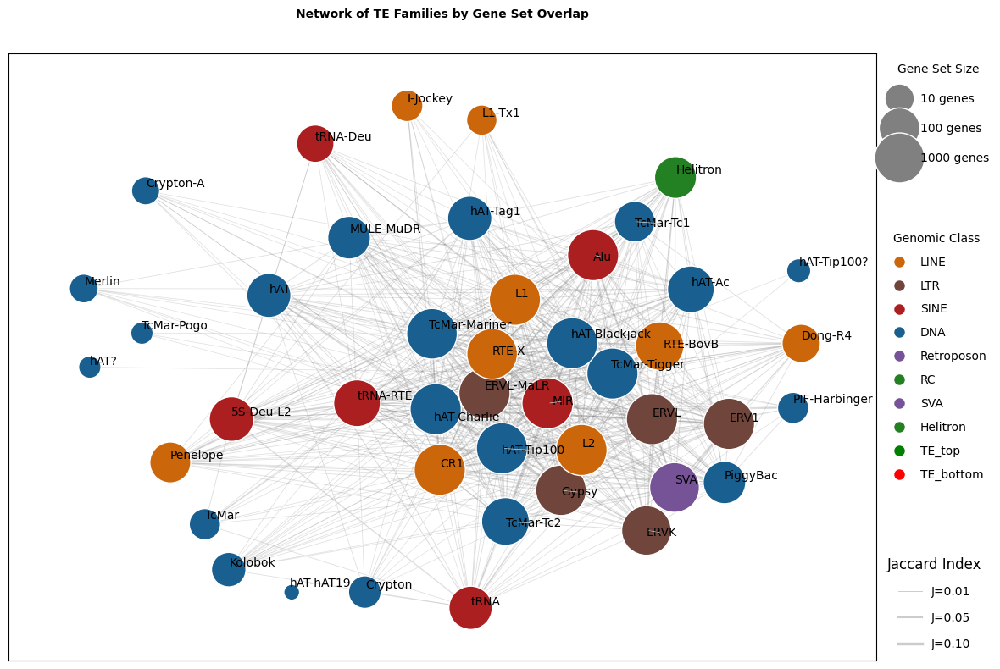

Success: TE family overlap network with adjusted edge thickness saved to plots/TE_families_genes_network.svg


In [123]:
# --- 3. Calculation Functions ---


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


# --- 4. Graph Construction ---

G = nx.Graph()


# Add nodes with attributes
for i, (label, gene_set) in enumerate(zip(labels_genes, sets_genes)):
    cls = family_to_class.get(label, "Other")
    color = class_names_p.get(cls, "grey")
    size = len(gene_set)
    # Logarithmic scaling for node size
    log_size = np.log10(size + 1) * 600
    G.add_node(label, size=log_size, color=color, class_name=cls, n_genes=size)

# Add edges based on Jaccard index
JACCARD_THRESHOLD = 0.00
BASE_WIDTH = 0.5
WIDTH_MULTIPLIER = 20

for i in range(len(labels_genes)):
    for j in range(i + 1, len(labels_genes)):
        j_idx = jaccard_index(sets_genes[i], sets_genes[j])
        if j_idx > JACCARD_THRESHOLD:
            G.add_edge(labels_genes[i], labels_genes[j], weight=j_idx)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(14, 8))
pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)

# Extract attributes for drawing
node_colors = [G.nodes[n]["color"] for n in G.nodes]
node_sizes = [G.nodes[n]["size"] for n in G.nodes]

# MODIFIED: Adjusted thickness to be slightly thinner than previous but still visible
edge_widths = [BASE_WIDTH + (G.edges[e]["weight"] * WIDTH_MULTIPLIER) for e in G.edges]

# Draw Edges
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.25, edge_color="gray", ax=ax)

# Draw Nodes
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    edgecolors="white",
    linewidths=1,
    ax=ax,
)

# Draw Labels with adjust_text (Set to black and normal weight)
texts = []
for node, (x, y) in pos.items():
    texts.append(ax.text(x, y, node, fontsize=10, fontweight="normal", color="black"))

# Repel labels to avoid overlap
adjust_text(
    texts,
    ax=ax,
    expand_points=(1.5, 1.5),
    arrowprops=dict(arrowstyle="-", color="lightgray", lw=0.5),
    force_points=0.2,
)

plt.title(
    "Network of TE Families by Gene Set Overlap", fontsize=10, pad=30, weight="bold"
)

# --- 6. Legends ---

# A) Node Size Legend (Log scale gene numbers)
legend_sizes = [10, 100, 1000]
legend_nodes = []
for size in legend_sizes:
    log_s = np.log10(size + 1) * 600
    legend_nodes.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{size} genes",
            markerfacecolor="gray",
            markersize=np.sqrt(log_s),
        )
    )

size_legend = ax.legend(
    handles=legend_nodes,
    title="Gene Set Size",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    labelspacing=1.5,
    title_fontsize=10,
)
ax.add_artist(size_legend)

# B) Edge Width Legend (Jaccard Index)
# MODIFIED: Updated legend to reflect the slightly thinner scale
legend_jaccard = [0.01, 0.05, 0.1]
legend_edges = []
for j in legend_jaccard:
    lw = BASE_WIDTH + (j * WIDTH_MULTIPLIER)
    legend_edges.append(
        Line2D([0], [0], color="gray", lw=lw, alpha=0.4, label=f"J={j:.2f}")
    )

# CRITICAL FIX: Add this legend as a separate artist to prevent it from being overwritten
jaccard_legend = ax.legend(
    handles=legend_edges,
    title="Jaccard Index",
    loc="lower left",
    bbox_to_anchor=(1, 0),
    frameon=False,
    labelspacing=1.2,
    title_fontsize=12,
)
ax.add_artist(jaccard_legend)

# C) Class Color Legend
legend_classes = [
    Line2D(
        [0], [0], marker="o", color="w", label=cls, markerfacecolor=color, markersize=10
    )
    for cls, color in class_names_p.items()
]

class_legend = ax.legend(
    handles=legend_classes,
    title="Genomic Class",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    frameon=False,
    labelspacing=1,
    title_fontsize=10,
)
# No need to add_artist for the final legend

# Final adjustment to ensure legends aren't clipped
plt.tight_layout(rect=[0, 0, 0.85, 1])

# --- 7. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_families_genes_network.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: TE family overlap network with adjusted edge thickness saved to {save_path}"
)

In [135]:
# enrichment_df_families.to_csv("enrichment_families_with_random.csv")
enrichment_df_families = pd.read_csv(
    "enrichment_families_with_random.csv"
)  # .set_index('family_name')
enrichment_df_families["Status"] = "Non-Significant"
enrichment_df_families["Status"][
    enrichment_df_families["p_adjusted_empirical_bh"] < 0.05
] = "Significant"

enrichment_df_families.index = enrichment_df_families["family_name"]
enrichment_df_families[["family_name", "OR_Observed_to_Random", "Status"]]

/tmp/ipykernel_130/4021770575.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_families["Status"][
/tmp/ipykernel_130/4021770575.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

,family_name,OR_Observed_to_Random,Status
family_name,,,
PIF-Harbinger,PIF-Harbinger,0.261539,Significant
Merlin,Merlin,0.300600,Significant
hAT-hAT19,hAT-hAT19,0.359969,Non-Significant
hAT-Tip100?,hAT-Tip100?,0.368920,Non-Significant
TcMar,TcMar,0.515854,Non-Significant
Crypton-A,Crypton-A,0.578385,Non-Significant
TcMar-Pogo,TcMar-Pogo,0.562854,Non-Significant
Kolobok,Kolobok,0.593644,Non-Significant
Crypton,Crypton,0.613858,Non-Significant


In [140]:
max_or

np.float64(1.548353896137113)

In [142]:
min_or

np.float64(0.2615394177645376)

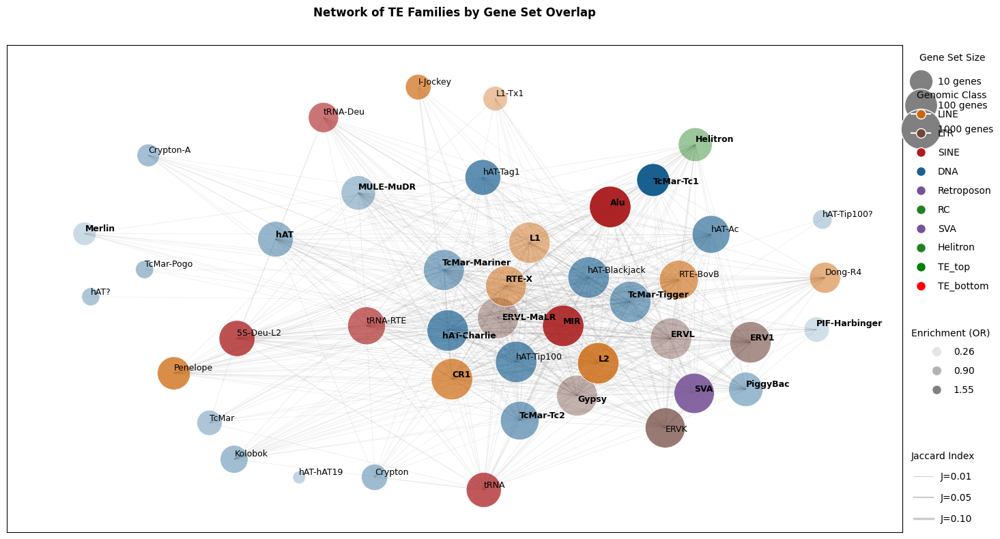

Success: TE family network updated with transparency and significance labels. Saved to plots/TE_families_genes_network_with_enrichment.svg


In [141]:
# --- 3. Calculation Functions ---


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


# --- 4. Graph Construction ---

G = nx.Graph()

# Calculate min/max for alpha normalization
min_or = enrichment_df_families["OR_Observed_to_Random"].min()
max_or = enrichment_df_families["OR_Observed_to_Random"].max()

# Add nodes with attributes
for i, (label, gene_set) in enumerate(zip(labels_genes, sets_genes)):
    cls = family_to_class.get(label, "Other")
    base_color = class_names_p.get(cls, "#808080")

    # Transparency mapping
    or_val = (
        enrichment_df_families.loc[label, "OR_Observed_to_Random"]
        if label in enrichment_df_families.index
        else min_or
    )
    status = (
        enrichment_df_families.loc[label, "Status"]
        if label in enrichment_df_families.index
        else "Non-Significant"
    )

    # Normalize alpha between 0.2 and 1.0
    alpha = 0.2 + 0.8 * (or_val - min_or) / (max_or - min_or)
    # Convert hex to RGBA
    rgb = mcolors.to_rgb(base_color)
    rgba = (*rgb, alpha)

    size = len(gene_set)
    log_size = np.log10(size + 1) * 600

    G.add_node(
        label, size=log_size, color=rgba, class_name=cls, status=status, or_val=or_val
    )

# Parameters from user edits
JACCARD_THRESHOLD = 0.00
BASE_WIDTH = 0.5
WIDTH_MULTIPLIER = 20

for i in range(len(labels_genes)):
    for j in range(i + 1, len(labels_genes)):
        j_idx = jaccard_index(sets_genes[i], sets_genes[j])
        if j_idx > JACCARD_THRESHOLD:
            G.add_edge(labels_genes[i], labels_genes[j], weight=j_idx)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(18, 8))
pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)

node_colors = [G.nodes[n]["color"] for n in G.nodes]
node_sizes = [G.nodes[n]["size"] for n in G.nodes]
edge_widths = [BASE_WIDTH + (G.edges[e]["weight"] * WIDTH_MULTIPLIER) for e in G.edges]

# Draw Edges
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.15, edge_color="gray", ax=ax)

# Draw Nodes
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    edgecolors="white",
    linewidths=0.5,
    ax=ax,
)

# Draw Labels with adjust_text
texts = []
for node, (x, y) in pos.items():
    status = G.nodes[node]["status"]
    weight = "bold" if status == "Significant" else "normal"
    texts.append(ax.text(x, y, node, fontsize=9, fontweight=weight, color="black"))

adjust_text(
    texts,
    ax=ax,
    expand_points=(1.5, 1.5),
    arrowprops=dict(arrowstyle="-", color="lightgray", lw=0.5),
    force_points=0.2,
)

plt.title(
    "Network of TE Families by Gene Set Overlap", fontsize=12, pad=30, weight="bold"
)

# --- 6. Legends ---

# A) Node Size Legend (Log scale gene numbers)
legend_sizes = [10, 100, 1000]
legend_nodes = []
for size in legend_sizes:
    log_s = np.log10(size + 1) * 600
    legend_nodes.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{size} genes",
            markerfacecolor="gray",
            markersize=np.sqrt(log_s),
        )
    )

size_legend = ax.legend(
    handles=legend_nodes,
    title="Gene Set Size",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    labelspacing=1.5,
    title_fontsize=10,
)
ax.add_artist(size_legend)

# B) Edge Width Legend (Jaccard Index)
legend_jaccard = [0.01, 0.05, 0.1]
legend_edges = []
for j in legend_jaccard:
    lw = BASE_WIDTH + (j * WIDTH_MULTIPLIER)
    legend_edges.append(
        Line2D([0], [0], color="gray", lw=lw, alpha=0.4, label=f"J={j:.2f}")
    )

jaccard_legend = ax.legend(
    handles=legend_edges,
    title="Jaccard Index",
    loc="lower left",
    bbox_to_anchor=(1, 0),
    frameon=False,
    labelspacing=1.2,
    title_fontsize=10,
)
ax.add_artist(jaccard_legend)

# C) Class Color Legend
legend_classes = [
    Line2D(
        [0], [0], marker="o", color="w", label=cls, markerfacecolor=color, markersize=10
    )
    for cls, color in class_names_p.items()
]

class_legend = ax.legend(
    handles=legend_classes,
    title="Genomic Class",
    loc="center left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    labelspacing=1,
    title_fontsize=10,
)
ax.add_artist(class_legend)

# D) Transparency Legend (OR_Observed_to_Random)
legend_or_vals = [min_or, (min_or + max_or) / 2, max_or]
legend_or = []
for val in legend_or_vals:
    alpha = 0.2 + 0.8 * (val - min_or) / (max_or - min_or)
    legend_or.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{val:.2f}",
            markerfacecolor=(0.5, 0.5, 0.5, alpha),
            markersize=10,
        )
    )

or_legend = ax.legend(
    handles=legend_or,
    title="Enrichment (OR)",
    loc="center left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    labelspacing=1,
    title_fontsize=10,
)

# Final adjustment to ensure legends aren't clipped
plt.tight_layout(rect=[0, 0, 0.82, 1])

# --- 7. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_families_genes_network_with_enrichment.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: TE family network updated with transparency and significance labels. Saved to {save_path}"
)

In [119]:
np.mean([G.edges[e]["weight"] for e in G.edges])

np.float64(0.011702807308913089)

In [120]:
np.max([G.edges[e]["weight"] for e in G.edges])

np.float64(0.08787878787878788)

### Network visualization for GO terms

In [5]:
top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()

top_5_perc_genes_by_families

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
0,13,ERVL,LTR,GO:0005515,protein binding,MF,2.955902e-15,5.541134e-11,0.784601,527.0,13442.0,"['AANAT', 'ABRAXAS1', 'ACRV1', 'ACTL8', 'ACTL9...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA..."
1,7,ERVL,LTR,GO:0005654,nucleoplasm,CC,3.788539e-11,3.550997e-07,0.577338,104.0,3605.0,"['ABRAXAS1', 'AK9', 'ALKBH3', 'ASXL2', 'AURKB'...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."
2,8,ERVL,LTR,GO:0005737,cytoplasm,CC,2.372002e-10,1.482185e-06,0.707670,229.0,6476.0,"['AANAT', 'ACADM', 'ACOT6', 'ACRV1', 'ACTL8', ...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A..."
3,5,ERVL,LTR,GO:0045944,positive regulation of transcription by RNA po...,BP,8.111201e-10,3.801315e-06,0.331333,20.0,1208.0,"['ASXL2', 'EAF2', 'HDAC2', 'IL17F', 'KDM4C', '...","['AAMDC', 'ABHD14B', 'ABL1', 'ABLIM1', 'ABLIM3..."
4,9,ERVL,LTR,GO:0005829,cytosol,CC,2.020804e-09,7.576400e-06,0.678189,171.0,5046.0,"['AANAT', 'ACOT6', 'ADA', 'AGBL4', 'AK9', 'ALD...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,1,SVA,Retroposon,GO:0006397,mRNA processing,BP,4.324068e-06,2.026475e-02,2.410306,33.0,409.0,"['AICDA', 'ARGLU1', 'CWC25', 'DHX38', 'EIF4A3'...","['A1CF', 'AAR2', 'ACIN1', 'ADAR', 'ADARB1', 'A..."
191,0,SVA,Retroposon,GO:0006369,termination of RNA polymerase II transcription,BP,3.303622e-06,2.026475e-02,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S..."
192,5,SVA,Retroposon,GO:0019899,enzyme binding,MF,5.647310e-06,2.117289e-02,2.426248,32.0,394.0,"['ARMT1', 'ATG3', 'CBS', 'COPS5', 'CYP1A1', 'D...","['A2M', 'ABCD1', 'ABL1', 'ABL2', 'ACAT1', 'ACI..."
193,3,SVA,Retroposon,GO:0005654,nucleoplasm,CC,2.463450e-05,7.696638e-02,1.367288,165.0,3605.0,"['ABTB3', 'ADI1', 'AIP', 'APOBEC3B', 'ARGLU1',...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."


In [9]:
list(top_5_perc_genes_by_families[top_5_perc_genes_by_families['Term Name'] == 'termination of RNA polymerase II transcription']['Overlapping Genes'])




["['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'SSU72L4', 'SSU72L5']"]

In [12]:
list(top_5_perc_genes_by_families[top_5_perc_genes_by_families['Term Name'] == 'termination of RNA polymerase II transcription']['Full Term Gene List'])



["['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'SSU72', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'SSU72L4', 'SSU72L5', 'SSU72L6', 'TTF2', 'XRN2']"]

In [14]:
TEs_on_genes[TEs_on_genes.Gene_name.isin(['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'SSU72L4', 'SSU72L5'])]

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
5563,chr11,4293265,4303265,SSU72L5,-0.1181851945,"269,276,214,287,261,210,162,258,172,99,296,325...","L2d2,L1MEj,MER106A,MER5B,MER5B,MER5A,MER6,L1ME...","L2,L1,hAT-Charlie,hAT-Charlie,hAT-Charlie,hAT-...","LINE,LINE,DNA,DNA,DNA,DNA,DNA,LINE,SINE,DNA,DN...","0.4712322382,0.5919948186,0.6306106,-0.9186238...",...,7,1,0,19,254.000000,248.000000,201.750000,218.428571,91.0,NaN
5564,chr11,4302764,4312764,SSU72L2,-0.210280913,"248,219,91,318,225,325,299,79,165,198,224,287,...","L1MC5a,L1MC3,SVA_B,L2,MER65D,MIR,MER20B,MER6,M...","L1,L1,SVA,L2,ERV1,MIR,hAT-Charlie,TcMar-Tigger...","LINE,LINE,Retroposon,LINE,LTR,SINE,DNA,DNA,DNA...","-0.1591773784,-0.07756066346,0.6432841833,-0.3...",...,6,1,0,16,273.666667,225.000000,261.500000,212.166667,91.0,NaN
5565,chr11,4348259,4358259,SSU72L4,-0.1152707896,"209,261,89,261,286,123,193,201,325,333,80,89,1...","L1MC3,L1MC5a,SVA_B,L1MEf,MLT1H,AluSx,AluJb,MER...","L1,L1,SVA,L1,ERVL-MaLR,Alu,Alu,ERV1,MIR,hAT-Ch...","LINE,LINE,Retroposon,LINE,LTR,SINE,SINE,LTR,SI...","-0.4381405217,-0.3911274354,-0.2763301913,-0.1...",...,5,1,0,22,182.833333,250.666667,168.714286,186.000000,89.0,NaN
5566,chr11,4389876,4399876,SSU72L3,-0.287851214,"286,277,229,287,211,160,191,109,311,209,268,30...","L2d2,L1MEj,MER106A,MER5B,MER5A,MER6,AluJb,MER6...","L2,L1,hAT-Charlie,hAT-Charlie,hAT-Charlie,TcMa...","LINE,LINE,DNA,DNA,DNA,DNA,SINE,DNA,DNA,LINE,LI...","-0.1416571597,-0.1960851772,-0.4658796,-0.3105...",...,6,1,0,15,268.400000,229.000000,258.000000,217.833333,88.0,NaN
5567,chr11,4399432,4409432,SSU72L1,-0.1567944621,"209,268,88,253,275,123,193,201,325,342,80,97,8...","L1MC3,L1MC5a,SVA_B,L1MEf,MLT1H,AluSx,AluJb,MER...","L1,L1,SVA,L1,ERVL-MaLR,Alu,Alu,ERV1,MIR,hAT-Ch...","LINE,LINE,Retroposon,LINE,LTR,SINE,SINE,LTR,SI...","-0.1721001891,-0.1812422437,-0.5092281667,-0.1...",...,6,1,0,23,184.000000,253.666667,165.857143,169.333333,88.0,NaN
14900,chr17,7383412,7393412,POLR2A,0.4336766235,"42,118,144,268,292,306,280,94,97,105,130,129,6...","AluY,AluSx,AluSp,L1M2,L1ME3Cz,L2a,L2a,AluSx,Al...","Alu,Alu,Alu,L1,L1,L2,L2,Alu,Alu,Alu,Alu,Alu,Al...","SINE,SINE,SINE,LINE,LINE,LINE,LINE,SINE,SINE,S...","1.096957571,0.3601549871,0.764376125,0.3383423...",...,1,1,0,15,286.500000,NaN,102.888889,220.000000,208.0,NaN


In [10]:
top_5_perc_genes_by_families[
    top_5_perc_genes_by_families["Total Term Genes (Human)"] > 1000
]["Term Name"].unique()

array(['protein binding', 'nucleoplasm', 'cytoplasm',
       'positive regulation of transcription by RNA polymerase II',
       'cytosol', 'chromatin', 'cell differentiation', 'nucleus',
       'RNA binding', 'membrane', 'plasma membrane',
       'extracellular exosome',
       'DNA-binding transcription factor activity, RNA polymerase II-specific',
       'regulation of transcription by RNA polymerase II',
       'signal transduction', 'mitochondrion', 'extracellular region',
       'nucleotide binding', 'DNA binding', 'extracellular space',
       'zinc ion binding', 'regulation of DNA-templated transcription',
       'metal ion binding',
       'RNA polymerase II cis-regulatory region sequence-specific DNA binding'],
      dtype=object)

In [151]:
def save_go_network_svg_families_by_classes(
    df,
    output_file="plots/GO_network_families_by_classes.svg",
    jaccard_threshold=0.1,
    top_n=5,
    font_size=10,
):
    """
    Generates a static SVG GO network plot with:
    - Labels colored by dominant class contribution.
    - Class-aware clustering for family nodes.
    - Integrated Jaccard index edge legend.
    """
    # 1. Ensure output directory exists
    os.makedirs(os.path.dirname(output_file), exist_ok=True)

    # 2. Filtering and Preprocessing
    if top_n is not None:
        df_filtered = (
            df.sort_values(["family_name", "FDR"])
            .groupby("family_name")
            .head(top_n)
            .copy()
        )
    else:
        df_filtered = df.copy()

    def parse_gene_list(x):
        if isinstance(x, str):
            try:
                return ast.literal_eval(x)
            except:
                return [g.strip() for g in x.split(",")]
        return x

    df_filtered["Overlapping Genes"] = df_filtered["Overlapping Genes"].apply(
        parse_gene_list
    )
    df_filtered["-log10FDR"] = -np.log10(df_filtered["FDR"].replace(0, 1e-15))
    df_filtered["log_pop_size"] = np.log10(
        df_filtered["Total Term Genes (Human)"].replace(0, 1)
    )

    # 3. Build Graph
    G = nx.Graph()

    # Track which class contributes most to each GO term for label coloring
    term_class_contribution = {}  # {term_id: {class: count}}

    for _, row in df_filtered.iterrows():
        fam = row["family_name"]
        term_id = row["Term ID"]
        cls = family_to_class.get(fam, "Other")
        n_overlap = len(row["Overlapping Genes"])

        # Update contribution counts
        if term_id not in term_class_contribution:
            term_class_contribution[term_id] = {}
        term_class_contribution[term_id][cls] = (
            term_class_contribution[term_id].get(cls, 0) + n_overlap
        )

        # Add nodes
        if not G.has_node(fam):
            G.add_node(
                fam,
                label=fam,
                type="class",
                color=class_names_p.get(cls, "gray"),
                class_name=cls,
            )

        size_val = row["log_pop_size"] * 150
        G.add_node(
            term_id,
            label=row["Term Name"],
            type="go",
            neg_log_fdr=row["-log10FDR"],
            size=size_val,
            raw_pop=row["Total Term Genes (Human)"],
        )

        G.add_edge(
            fam,
            term_id,
            weight=row["Fold Enrichment"],
            edge_type="fam_go",
            color=class_names_p.get(cls, "#E0E0E0"),
        )

    # 4. Inter-term Edges (Jaccard)
    unique_terms = df_filtered.drop_duplicates(subset=["Term ID"])
    term_ids = unique_terms["Term ID"].tolist()
    term_genes = unique_terms["Overlapping Genes"].tolist()

    for i in range(len(term_ids)):
        for j in range(i + 1, len(term_ids)):
            set1, set2 = set(term_genes[i]), set(term_genes[j])
            union_len = len(set1.union(set2))
            if union_len == 0:
                continue
            jaccard = len(set1.intersection(set2)) / union_len
            if jaccard >= jaccard_threshold:
                G.add_edge(
                    term_ids[i],
                    term_ids[j],
                    weight=jaccard,
                    edge_type="jaccard",
                    color="#E0E0E0",
                )

    # 5. Positioning with Class-Aware Clustering
    # We add invisible high-weight edges between families of same class to group them
    H = G.copy()
    fams = [n for n, d in G.nodes(data=True) if d["type"] == "class"]
    for i in range(len(fams)):
        for j in range(i + 1, len(fams)):
            if G.nodes[fams[i]]["class_name"] == G.nodes[fams[j]]["class_name"]:
                H.add_edge(
                    fams[i], fams[j], weight=10.0
                )  # High constraint for class grouping

    fig, ax = plt.subplots(figsize=(18, 16))
    pos = nx.spring_layout(H, k=0.6, iterations=80, seed=42, weight="weight")

    # 6. Drawing
    # Family Nodes (Diamonds)
    class_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "class"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=class_nodes,
        node_shape="d",
        node_size=1200,
        node_color=[G.nodes[n]["color"] for n in class_nodes],
        ax=ax,
    )

    # GO Nodes (Circles)
    go_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "go"]
    go_colors = [G.nodes[n]["neg_log_fdr"] for n in go_nodes]
    go_sizes = [G.nodes[n]["size"] for n in go_nodes]
    norm = mcolors.Normalize(
        vmin=min(go_colors) if go_colors else 0, vmax=max(go_colors) if go_colors else 1
    )

    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=go_nodes,
        node_shape="o",
        node_size=go_sizes,
        node_color=go_colors,
        cmap="coolwarm",
        alpha=0.8,
        ax=ax,
    )

    # Edges
    edges = G.edges(data=True)

    # Scale: fold enrichment for fam-go, and jaccard * constant for inter-term
    def get_width(d):
        if d["edge_type"] == "fam_go":
            return d["weight"] / 2
        return d["weight"] * 10

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=edges,
        width=[get_width(d) for u, v, d in edges],
        edge_color=[d.get("color", "#E0E0E0") for u, v, d in edges],
        alpha=0.3,
        ax=ax,
    )

    # 7. Labels with Dominant Class Coloring
    texts = []
    for node, (x, y) in pos.items():
        data = G.nodes[node]
        label_text = data["label"]

        if data["type"] == "class":
            # Family labels are now explicitly black and bold
            t_color = "black"
            t_weight = "bold"
        else:
            # GO Term labels use normal weight and dominant class coloring
            t_weight = "normal"
            # Determine dominant class for this GO term
            contribs = term_class_contribution.get(node, {})
            if contribs:
                dom_class = max(contribs, key=contribs.get)
                t_color = class_names_p.get(dom_class, "black")
            else:
                t_color = "black"

        texts.append(
            ax.text(
                x, y, label_text, fontsize=font_size, color=t_color, fontweight=t_weight
            )
        )

    adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle="->", color="gray", lw=0.5))

    # 8. Legends
    # A) Colorbar
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.4, pad=0.02)
    cbar.set_label("-log10(FDR)", fontsize=font_size)
    cbar.ax.tick_params(labelsize=font_size)

    # B) Node Size (Genes)
    size_legend_counts = [10, 100, 1000]
    for count in size_legend_counts:
        ax.scatter(
            [], [], c="gray", alpha=0.5, s=np.log10(count) * 150, label=f"{count} genes"
        )

    leg1 = ax.legend(
        title="Term Population Size",
        loc="lower left",
        bbox_to_anchor=(1, 0.7),
        frameon=False,
        fontsize=font_size,
        title_fontsize=font_size,
    )
    ax.add_artist(leg1)

    # C) Jaccard Index Legend (Edge Thickness)
    j_vals = [0.1, 0.2, 0.5]
    j_lines = [
        Line2D([0], [0], color="gray", lw=v * 10, alpha=0.4, label=f"J={v:.2f}")
        for v in j_vals
    ]
    ax.legend(
        handles=j_lines,
        title="Jaccard Similarity",
        loc="lower left",
        bbox_to_anchor=(1, 0.4),
        frameon=False,
        fontsize=font_size,
        title_fontsize=font_size,
    )

    ax.set_title(
        f"GO Term Network (Top {top_n} terms per Family)",
        fontsize=font_size + 4,
        pad=20,
    )
    ax.axis("off")
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.savefig(output_file, format="svg", bbox_inches="tight", transparent=True)
    plt.close()
    print(f"Success: GO Network saved to {output_file}")

In [152]:
save_go_network_svg_families_by_classes(
    top_5_perc_genes_by_families[
        top_5_perc_genes_by_families["Total Term Genes (Human)"] < 1000
    ],
    output_file="plots/GO_network_families_by_classes.svg",
    jaccard_threshold=0.0,
    top_n=30,
    font_size=10,
)

Success: GO Network saved to plots/GO_network_families_by_classes.svg


In [11]:
top_5_perc_genes_by_families[
    top_5_perc_genes_by_families["Term Name"] == "MHC class I protein complex"
]

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
102,1,hAT-Charlie,DNA,GO:0042612,MHC class I protein complex,CC,0.000003,0.025488,12.007521,6.0,10.0,"['HFE', 'HLA-A', 'HLA-E', 'HLA-F', 'HLA-G', 'H...","['B2M', 'HFE', 'HLA-A', 'HLA-B', 'HLA-C', 'HLA..."


In [153]:
top_5_perc_genes_by_families[
    top_5_perc_genes_by_families["Term Name"] == "axonal transport of mitochondrion"
]

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
194,0,Dong-R4,LINE,GO:0019896,axonal transport of mitochondrion,BP,0.000003,0.06204,100.835088,3.0,15.0,"['ARMCX1', 'ARMCX2', 'ARMCX3']","['ARMC10', 'ARMCX1', 'ARMCX2', 'ARMCX3', 'ARMC..."


In [150]:
top_5_perc_genes_by_families

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
0,13,ERVL,LTR,GO:0005515,protein binding,MF,2.955902e-15,5.541134e-11,0.784601,527.0,13442.0,"['AANAT', 'ABRAXAS1', 'ACRV1', 'ACTL8', 'ACTL9...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA..."
1,7,ERVL,LTR,GO:0005654,nucleoplasm,CC,3.788539e-11,3.550997e-07,0.577338,104.0,3605.0,"['ABRAXAS1', 'AK9', 'ALKBH3', 'ASXL2', 'AURKB'...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."
2,8,ERVL,LTR,GO:0005737,cytoplasm,CC,2.372002e-10,1.482185e-06,0.707670,229.0,6476.0,"['AANAT', 'ACADM', 'ACOT6', 'ACRV1', 'ACTL8', ...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A..."
3,5,ERVL,LTR,GO:0045944,positive regulation of transcription by RNA po...,BP,8.111201e-10,3.801315e-06,0.331333,20.0,1208.0,"['ASXL2', 'EAF2', 'HDAC2', 'IL17F', 'KDM4C', '...","['AAMDC', 'ABHD14B', 'ABL1', 'ABLIM1', 'ABLIM3..."
4,9,ERVL,LTR,GO:0005829,cytosol,CC,2.020804e-09,7.576400e-06,0.678189,171.0,5046.0,"['AANAT', 'ACOT6', 'ADA', 'AGBL4', 'AK9', 'ALD...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,1,SVA,Retroposon,GO:0006397,mRNA processing,BP,4.324068e-06,2.026475e-02,2.410306,33.0,409.0,"['AICDA', 'ARGLU1', 'CWC25', 'DHX38', 'EIF4A3'...","['A1CF', 'AAR2', 'ACIN1', 'ADAR', 'ADARB1', 'A..."
191,0,SVA,Retroposon,GO:0006369,termination of RNA polymerase II transcription,BP,3.303622e-06,2.026475e-02,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S..."
192,5,SVA,Retroposon,GO:0019899,enzyme binding,MF,5.647310e-06,2.117289e-02,2.426248,32.0,394.0,"['ARMT1', 'ATG3', 'CBS', 'COPS5', 'CYP1A1', 'D...","['A2M', 'ABCD1', 'ABL1', 'ABL2', 'ACAT1', 'ACI..."
193,3,SVA,Retroposon,GO:0005654,nucleoplasm,CC,2.463450e-05,7.696638e-02,1.367288,165.0,3605.0,"['ABTB3', 'ADI1', 'AIP', 'APOBEC3B', 'ARGLU1',...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."


### Classify GO terms with Gemini and visualize the heatmap

In [6]:
top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()

top_5_perc_genes_by_families

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List
0,13,ERVL,LTR,GO:0005515,protein binding,MF,2.955902e-15,5.541134e-11,0.784601,527.0,13442.0,"['AANAT', 'ABRAXAS1', 'ACRV1', 'ACTL8', 'ACTL9...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA..."
1,7,ERVL,LTR,GO:0005654,nucleoplasm,CC,3.788539e-11,3.550997e-07,0.577338,104.0,3605.0,"['ABRAXAS1', 'AK9', 'ALKBH3', 'ASXL2', 'AURKB'...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."
2,8,ERVL,LTR,GO:0005737,cytoplasm,CC,2.372002e-10,1.482185e-06,0.707670,229.0,6476.0,"['AANAT', 'ACADM', 'ACOT6', 'ACRV1', 'ACTL8', ...","['A1CF', 'AAGAB', 'AAMDC', 'AAMP', 'AANAT', 'A..."
3,5,ERVL,LTR,GO:0045944,positive regulation of transcription by RNA po...,BP,8.111201e-10,3.801315e-06,0.331333,20.0,1208.0,"['ASXL2', 'EAF2', 'HDAC2', 'IL17F', 'KDM4C', '...","['AAMDC', 'ABHD14B', 'ABL1', 'ABLIM1', 'ABLIM3..."
4,9,ERVL,LTR,GO:0005829,cytosol,CC,2.020804e-09,7.576400e-06,0.678189,171.0,5046.0,"['AANAT', 'ACOT6', 'ADA', 'AGBL4', 'AK9', 'ALD...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,1,SVA,Retroposon,GO:0006397,mRNA processing,BP,4.324068e-06,2.026475e-02,2.410306,33.0,409.0,"['AICDA', 'ARGLU1', 'CWC25', 'DHX38', 'EIF4A3'...","['A1CF', 'AAR2', 'ACIN1', 'ADAR', 'ADARB1', 'A..."
191,0,SVA,Retroposon,GO:0006369,termination of RNA polymerase II transcription,BP,3.303622e-06,2.026475e-02,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S..."
192,5,SVA,Retroposon,GO:0019899,enzyme binding,MF,5.647310e-06,2.117289e-02,2.426248,32.0,394.0,"['ARMT1', 'ATG3', 'CBS', 'COPS5', 'CYP1A1', 'D...","['A2M', 'ABCD1', 'ABL1', 'ABL2', 'ACAT1', 'ACI..."
193,3,SVA,Retroposon,GO:0005654,nucleoplasm,CC,2.463450e-05,7.696638e-02,1.367288,165.0,3605.0,"['ABTB3', 'ADI1', 'AIP', 'APOBEC3B', 'ARGLU1',...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ..."


In [8]:
for term_name in top_5_perc_genes_by_families["Term Name"].unique():
    print(term_name)

protein binding
nucleoplasm
cytoplasm
positive regulation of transcription by RNA polymerase II
cytosol
chromatin
cell differentiation
DNA-binding transcription activator activity, RNA polymerase II-specific
nucleus
hair cycle
bitter taste receptor activity
detection of chemical stimulus involved in sensory perception of bitter taste
intermediate filament
keratin filament
transcription regulator complex
RNA binding
cysteine-type endopeptidase inhibitor activity
lipid metabolic process
fatty acid metabolic process
membrane
plasma membrane
extracellular exosome
positive regulation of cell population proliferation
translation
DNA-binding transcription factor activity, RNA polymerase II-specific
regulation of transcription by RNA polymerase II
translation activator activity
synapse
G protein-coupled receptor signaling pathway
response to cocaine
signal transduction
regulation of postsynaptic neurotransmitter receptor internalization
ventricular septum development
serine-type endopeptidase 

In [ ]:
top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
classification = pd.read_csv("GO_terms_families_classification_Gemini - families.csv")

top_5_perc_genes_by_families = top_5_perc_genes_by_families.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)


top_5_perc_genes_by_families

In [ ]:
top_5_perc_genes_by_families.to_csv("top_5_perc_genes_by_families_with_classification.csv")

In [14]:
top_5_perc_genes_by_families["Functional Group"].value_counts()

Functional Group
Too general                                   46
Transcription and its regulation              18
Nervous system                                13
RNA splicing and processing                   12
Sensory system                                11
Lipids metabolism                             11
Signaling pathways                            10
Other immune processes                         9
Cell cycle/cell division                       7
Metals metabolism                              7
Chromatin structure                            6
DNA repair                                     6
Mitochondrion                                  5
Embryogenesis                                  5
Exosomes and vesicles                          5
Other metabolism                               5
Cytoskeleton                                   5
Other                                          4
Protein ubiquitination and degradation         4
Ribosome biogenesis and translation itself     3
Cel

In [12]:
top_5_perc_genes_by_families[
    top_5_perc_genes_by_families["Term Name"]
    == "termination of RNA polymerase II transcription"
]  # ['Overlapping Genes'])

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,GO Term Name,Functional Group
192,0,SVA,Retroposon,GO:0006369,termination of RNA polymerase II transcription,BP,0.000003,0.020265,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S...",termination of RNA polymerase II transcription,Transcription and its regulation


In [31]:
top_5_perc_genes_by_families[
    top_5_perc_genes_by_families["Term Name"] == "axonal transport of mitochondrion"
]

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,GO Term Name,Functional Group
195,0,Dong-R4,LINE,GO:0019896,axonal transport of mitochondrion,BP,0.000003,0.06204,100.835088,3.0,15.0,"['ARMCX1', 'ARMCX2', 'ARMCX3']","['ARMC10', 'ARMCX1', 'ARMCX2', 'ARMCX3', 'ARMC...",axonal transport of mitochondrion,Nervous system


In [38]:
len(
    top_5_perc_genes_by_families[top_5_perc_genes_by_families["class_name"] == "LTR"][
        "Term Name"
    ].unique()
)

44

In [35]:
top_5_perc_genes_by_families[top_5_perc_genes_by_families["family_name"] == "CR1"]

,Unnamed: 0,family_name,class_name,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,GO Term Name,Functional Group
40,5,CR1,LINE,GO:0005886,plasma membrane,CC,1.865176e-15,3.496460e-11,1.462606,372.0,5090.0,"['ABHD2', 'ABL2', 'ACE2', 'ACTN3', 'ACVRL1', '...","['A1BG', 'AAK1', 'AAMP', 'ABCA1', 'ABCA10', 'A...",plasma membrane,Too general
41,6,CR1,LINE,GO:0016020,membrane,CC,1.678309e-10,1.573079e-06,1.350673,371.0,5497.0,"['ABCB7', 'ACE2', 'ACER3', 'ACVRL1', 'ADAM19',...","['A3GALT2', 'A4GALT', 'A4GNT', 'AAAS', 'AADAC'...",membrane,Too general
42,7,CR1,LINE,GO:0045202,synapse,CC,1.101039e-07,6.880023e-04,1.922257,73.0,760.0,"['ACAN', 'APOA4', 'APP', 'BAALC', 'BRINP1', 'C...","['ABLIM3', 'ABR', 'ACAN', 'ACHE', 'ACP1', 'ACT...",synapse,Nervous system
43,0,CR1,LINE,GO:0007186,G protein-coupled receptor signaling pathway,BP,5.060884e-06,2.371783e-02,1.674436,83.0,992.0,"['ADGRB1', 'ADGRD2', 'ADGRF3', 'ADGRG1', 'ADGR...","['ABCA1', 'ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', ...",G protein-coupled receptor signaling pathway,Signaling pathways
44,1,CR1,LINE,GO:0042220,response to cocaine,BP,7.250010e-06,2.718174e-02,5.559037,10.0,36.0,"['CACNG4', 'CREB1', 'DNMT3A', 'DRD2', 'DRD3', ...","['ABAT', 'CACNG4', 'CDK5', 'CHRNB2', 'CREB1', ...",response to cocaine,Nervous system
45,2,CR1,LINE,GO:0007165,signal transduction,BP,9.875100e-06,3.085311e-02,1.426094,151.0,2119.0,"['ABL2', 'ACVRL1', 'ADGRB1', 'ADGRD2', 'ADGRF3...","['ABL2', 'ABR', 'ACKR1', 'ACKR2', 'ACKR3', 'AC...",signal transduction,Signaling pathways
46,3,CR1,LINE,GO:0099149,regulation of postsynaptic neurotransmitter re...,BP,3.605684e-05,8.553004e-02,5.929640,8.0,27.0,"['HIP1', 'IQSEC1', 'IQSEC2', 'IQSEC3', 'NCDN',...","['ARC', 'ATAD1', 'CBLB', 'DRD4', 'EFNB2', 'GSG...",regulation of postsynaptic neurotransmitter re...,Nervous system
47,4,CR1,LINE,GO:0003281,ventricular septum development,BP,4.106318e-05,8.553004e-02,5.146080,9.0,35.0,"['CITED2', 'GATA4', 'GJA5', 'HEG1', 'LUZP1', '...","['AP2B1', 'CCN1', 'CITED2', 'CNTRL', 'DAND5', ...",ventricular septum development,Embryogenesis
48,8,CR1,LINE,GO:0004867,serine-type endopeptidase inhibitor activity,MF,3.998305e-05,8.553004e-02,3.170303,16.0,101.0,"['AMBP', 'APLP2', 'APP', 'ITIH1', 'ITIH2', 'IT...","['A2M', 'A2ML1', 'AGT', 'AMBP', 'ANOS1', 'ANXA...",serine-type endopeptidase inhibitor activity,Protein ubiquitination and degradation


In [58]:
counts_by_group = (
    top_5_perc_genes_by_families[["class_name", "family_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
# counts_by_group['count'] = counts_by_group['count']*10
counts_by_group

,class_name,family_name,Functional Group,count
0,SINE,Alu,Too general,11
1,SINE,Alu,RNA splicing and processing,11
2,LTR,ERVL-MaLR,Too general,8
3,LTR,ERVL,Too general,6
4,SINE,Alu,DNA repair,6
...,...,...,...,...
73,SINE,MIR,Cell adhesion,1
74,SINE,MIR,Exosomes and vesicles,1
75,SINE,MIR,Other metabolism,1
76,SINE,MIR,Sensory system,1


/tmp/ipykernel_138/1489596182.py:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


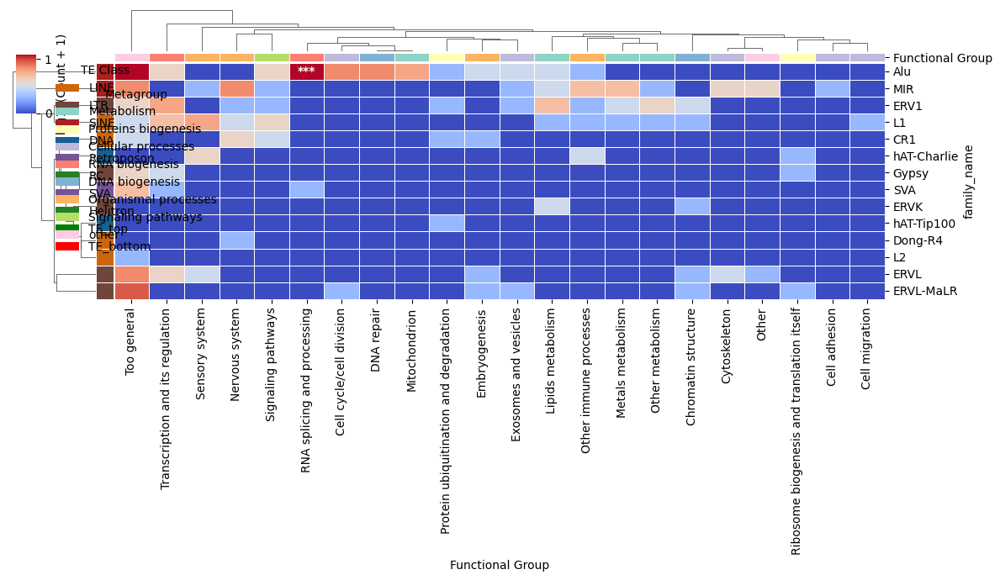

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_top5_perc_by_families.svg


In [59]:
# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="family_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(family_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(12, 7),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_top5_perc_by_families.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

### Correlation with enrichment near genes

In [5]:
top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
top_5_perc_genes_by_families.value_counts("family_name")

family_name
Alu            52
MIR            33
ERV1           25
L1             22
ERVL           16
ERVL-MaLR      13
CR1             9
hAT-Charlie     7
SVA             6
Gypsy           6
ERVK            3
Dong-R4         1
L2              1
hAT-Tip100      1
Name: count, dtype: int64

In [6]:
enrichment_df_families = pd.read_csv(
    "enrichment_families_with_random.csv"
)  # .set_index('family_name')
enrichment_df_families["Status"] = "Non-Significant"
enrichment_df_families["Status"][
    enrichment_df_families["p_adjusted_empirical_bh"] < 0.05
] = "Significant"

enrichment_df_families.index = enrichment_df_families["family_name"]
enrichment_df_families["GO_terms_count"] = top_5_perc_genes_by_families.value_counts(
    "family_name"
)
enrichment_df_families["GO_status"] = "Yes"
enrichment_df_families["GO_status"][
    enrichment_df_families["GO_terms_count"].isna()
] = "No"
enrichment_df_families

/tmp/ipykernel_179/3441763822.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_families["Status"][
/tmp/ipykernel_179/3441763822.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

,Unnamed: 0,family_name,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,Random_Odds_Ratio_Quantile_Of_Observed,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,family_label,neg_log10_adj_p,OR_Observed_to_Random,Status,GO_terms_count,GO_status
family_name,,,,,,,,,,,,,,,,,,,,,
PIF-Harbinger,0,PIF-Harbinger,DNA,16,402,0.433192,2.726041e-04,4.613300e-04,264.187500,266.902985,...,1.000,0.000,0.003992,0.008800,PIF-Harbinger (DNA),3.335988,0.261539,Significant,NaN,No
Merlin,1,Merlin,DNA,10,232,0.470755,1.408926e-02,2.214026e-02,197.700000,222.560345,...,0.998,0.004,0.004000,0.008800,Merlin (DNA),1.654817,0.300600,Significant,NaN,No
hAT-hAT19,2,hAT-hAT19,DNA,1,18,0.614750,1.000000e+00,1.000000e+00,314.000000,226.222222,...,0.574,0.852,0.852000,0.871814,hAT-hAT19 (DNA),-0.000000,0.359969,Non-Significant,NaN,No
hAT-Tip100?,3,hAT-Tip100?,DNA,4,67,0.663540,6.621501e-01,8.569001e-01,251.000000,266.283582,...,0.892,0.216,0.216000,0.288000,hAT-Tip100? (DNA),0.067070,0.368920,Non-Significant,NaN,No
TcMar,4,TcMar,DNA,16,223,0.807788,4.769847e-01,6.558539e-01,273.937500,265.394619,...,0.968,0.064,0.064000,0.104296,TcMar (DNA),0.183193,0.515854,Non-Significant,NaN,No
Crypton-A,5,Crypton-A,DNA,12,150,0.908761,8.850157e-01,9.750172e-01,245.250000,269.426667,...,0.874,0.252,0.252000,0.326118,Crypton-A (DNA),0.010988,0.578385,Non-Significant,NaN,No
TcMar-Pogo,6,TcMar-Pogo,DNA,3,37,0.922125,1.000000e+00,1.000000e+00,213.666667,250.918919,...,0.600,0.800,0.800000,0.858537,TcMar-Pogo (DNA),-0.000000,0.562854,Non-Significant,NaN,No
Kolobok,7,Kolobok,DNA,33,404,0.929582,7.912433e-01,9.670752e-01,258.818182,252.529703,...,0.980,0.040,0.040000,0.076522,Kolobok (DNA),0.014540,0.593644,Non-Significant,NaN,No
Crypton,8,Crypton,DNA,25,305,0.933103,8.391889e-01,9.750172e-01,257.600000,258.075410,...,0.948,0.104,0.104000,0.163429,Crypton (DNA),0.010988,0.613858,Non-Significant,NaN,No


In [8]:
enrichment_df_families.T[['Alu', 'MIR']]

family_name,Alu,MIR
Unnamed: 0,40,37
family_name,Alu,MIR
class_name,SINE,SINE
Observed_TEs_number,211643,89709
Total_TEs_number,1164096,534149
Observed_Odds_Ratio,2.323273,2.109821
Enrichment_p_value,0.0,0.0
Enrichment_p_value_adjusted,0.0,0.0
Average_divergence_genes,124.076653,275.477767
Average_divergence_all,128.469531,283.447165


0.35796460953864734 0.20887586747952783
Plot saved to ./plots/GO_terms_count_vs_OR_Observed_to_Random_families.svg


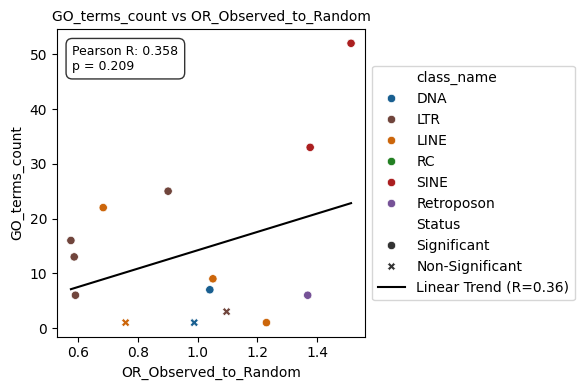

In [28]:
column1 = "OR_Observed_to_Random"
column2 = "GO_terms_count"

fig, ax = plt.subplots(figsize=(7, 4))

corr_data = enrichment_df_families.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.pearsonr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Pearson R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=enrichment_df_families,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    ax=ax,
    alpha=1,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)
# --- ADDED: Draw Linear Trend Line (using numpy.polyfit) ---
if len(corr_data) > 2:
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )


# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_families.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Significant vs. Non-Significant: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.839e-02 U_stat=3.100e+01
./plots/boxplot_of_GO_terms_count_Status_families.svg


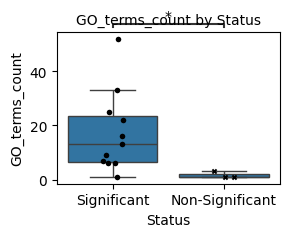

In [33]:
# Set the font type for a clean SVG
plt.rcParams["svg.fonttype"] = "none"

x_name = "Status"
y_name = "GO_terms_count"

figure, ax = plt.subplots(
    figsize=(3, 2.5),  # Increased height for stats
)

sns.boxplot(
    data=enrichment_df_families,
    x=x_name,
    y=y_name,
    ax=ax,
    # palette=class_names_p,
    boxprops={"alpha": 1},  # Make boxes slightly transparent,
    showfliers=False,
)

# --- 2. Draw Stripplot in two layers for different markers ---

# Layer A: Significant points (Circles)
sns.stripplot(
    data=enrichment_df_families[enrichment_df_families["Status"] == "Significant"],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="o",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

sns.stripplot(
    data=enrichment_df_families[enrichment_df_families["Status"] == "Non-Significant"],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="X",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

# --- 3. Generate All-vs-All Pairs ---
plot_order = [tick.get_text() for tick in ax.get_xticklabels()]

# This generates every unique pair possible from your classes
box_pairs = list(itertools.combinations(plot_order, 2))

# --- 4. Configure Annotator ---
annotator = Annotator(
    ax, box_pairs, data=enrichment_df_families, x=x_name, y=y_name, order=plot_order
)

annotator.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="outside",
    comparisons_correction="BH",
    verbose=2,
)

# Apply the test and draw the annotations
annotator.apply_and_annotate()
# --- 6. Tidy Up and Save ---

ax.set_title(f"{y_name} by {x_name}", fontsize=10)
# ax.set_xlabel(x_name, fontsize=10)
# ax.set_ylabel(y_name, fontsize=10)

# Rotate x-axis labels for better readability
plt.xticks(rotation=0, ha="center")

# Ensure the plot layout is clean
figure.tight_layout()

# Save to SVG
save_path = f"./plots/boxplot_of_{y_name}_{x_name}_families.svg"
figure.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)
print(save_path)
plt.show()

In [21]:
enrichment_df_families.columns

Index(['Unnamed: 0', 'family_name', 'class_name', 'Observed_TEs_number',
       'Total_TEs_number', 'Observed_Odds_Ratio', 'Enrichment_p_value',
       'Enrichment_p_value_adjusted', 'Average_divergence_genes',
       'Average_divergence_all', 'Observed_TEs_number_log',
       'Total_TEs_number_log', 'Random_Odds_Ratio_Mean',
       'Random_Odds_Ratio_SD', 'Random_Odds_Ratio_Quantile_Of_Observed',
       'p_raw_empirical', 'p_raw_empirical_clamped', 'p_adjusted_empirical_bh',
       'family_label', 'neg_log10_adj_p', 'OR_Observed_to_Random', 'Status',
       'GO_terms_count', 'GO_status'],
      dtype='object')

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

No vs. Yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.411e-06 U_stat=2.900e+01
./plots/boxplot_of_Total_TEs_number_log_GO_status_families.svg


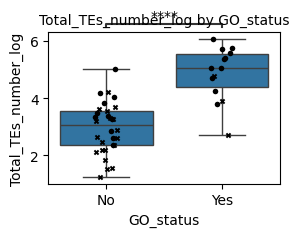

In [23]:
# Set the font type for a clean SVG
plt.rcParams["svg.fonttype"] = "none"

x_name = "GO_status"
y_name = "Total_TEs_number_log"

figure, ax = plt.subplots(
    figsize=(3, 2.5),  # Increased height for stats
)

sns.boxplot(
    data=enrichment_df_families,
    x=x_name,
    y=y_name,
    ax=ax,
    # palette=class_names_p,
    boxprops={"alpha": 1},  # Make boxes slightly transparent,
    showfliers=False,
)

# --- 2. Draw Stripplot in two layers for different markers ---

# Layer A: Significant points (Circles)
sns.stripplot(
    data=enrichment_df_families[enrichment_df_families["Status"] == "Significant"],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="o",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

sns.stripplot(
    data=enrichment_df_families[enrichment_df_families["Status"] == "Non-Significant"],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="X",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

# --- 3. Generate All-vs-All Pairs ---
plot_order = [tick.get_text() for tick in ax.get_xticklabels()]

# This generates every unique pair possible from your classes
box_pairs = list(itertools.combinations(plot_order, 2))

# --- 4. Configure Annotator ---
annotator = Annotator(
    ax, box_pairs, data=enrichment_df_families, x=x_name, y=y_name, order=plot_order
)

annotator.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="outside",
    comparisons_correction="BH",
    verbose=2,
)

# Apply the test and draw the annotations
annotator.apply_and_annotate()
# --- 6. Tidy Up and Save ---

ax.set_title(f"{y_name} by {x_name}", fontsize=10)
# ax.set_xlabel(x_name, fontsize=10)
# ax.set_ylabel(y_name, fontsize=10)

# Rotate x-axis labels for better readability
plt.xticks(rotation=0, ha="center")

# Ensure the plot layout is clean
figure.tight_layout()

# Save to SVG
save_path = f"./plots/boxplot_of_{y_name}_{x_name}_families.svg"
figure.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)
print(save_path)
plt.show()

In [36]:
enrichment_df_families.columns

Index(['Unnamed: 0', 'family_name', 'class_name', 'Observed_TEs_number',
       'Total_TEs_number', 'Observed_Odds_Ratio', 'Enrichment_p_value',
       'Enrichment_p_value_adjusted', 'Average_divergence_genes',
       'Average_divergence_all', 'Observed_TEs_number_log',
       'Total_TEs_number_log', 'Random_Odds_Ratio_Mean',
       'Random_Odds_Ratio_SD', 'Random_Odds_Ratio_Quantile_Of_Observed',
       'p_raw_empirical', 'p_raw_empirical_clamped', 'p_adjusted_empirical_bh',
       'family_label', 'neg_log10_adj_p', 'OR_Observed_to_Random', 'Status',
       'GO_terms_count'],
      dtype='object')

-0.34735100814904407 0.22366587862887202
Plot saved to ./plots/GO_terms_count_vs_Average_divergence_all_families.svg


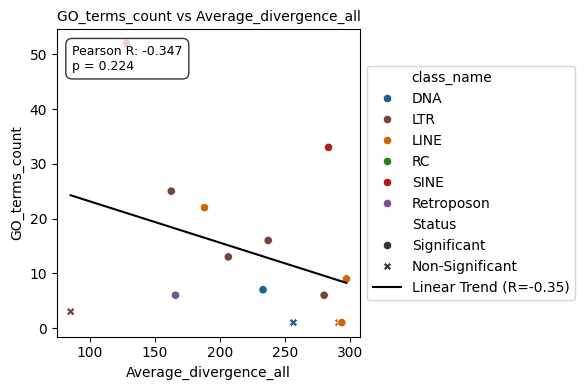

In [37]:
column1 = "Average_divergence_all"
column2 = "GO_terms_count"

fig, ax = plt.subplots(figsize=(7, 4))

corr_data = enrichment_df_families.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.pearsonr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Pearson R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=enrichment_df_families,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    ax=ax,
    alpha=1,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)
# --- ADDED: Draw Linear Trend Line (using numpy.polyfit) ---
if len(corr_data) > 2:
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )


# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_families.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

0.6327442498077355 0.015159410716030886
Plot saved to ./plots/GO_terms_count_vs_Total_TEs_number_log_families.svg


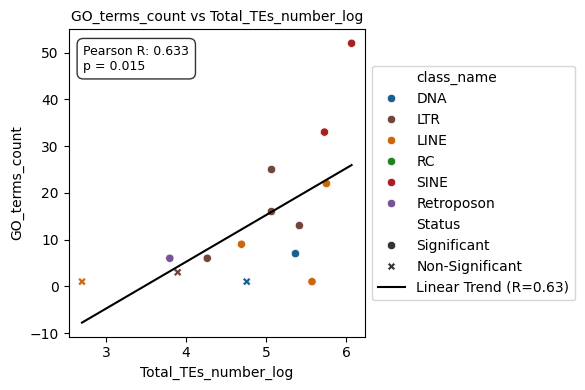

In [38]:
column1 = "Total_TEs_number_log"
column2 = "GO_terms_count"

fig, ax = plt.subplots(figsize=(7, 4))

corr_data = enrichment_df_families.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.pearsonr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Pearson R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=enrichment_df_families,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    ax=ax,
    alpha=1,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)
# --- ADDED: Draw Linear Trend Line (using numpy.polyfit) ---
if len(corr_data) > 2:
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )


# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_families.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

### Comparison of families enrichments vs class enrichments (as a background) to see the differences between them

In [34]:
top_5_perc_genes_manual = pd.read_csv(
    "GO_top_5_perc_genes_by_class_gemini_manual.csv", sep=";"
)
top_5_perc_genes_manual.columns = [
    "Column1",
    "Unnamed: 0",
    "Term ID",
    "Term Name",
    "Term Database",
    "P-value",
    "FDR",
    "Fold Enrichment",
    "Overlap Count",
    "Total Term Genes (Human)",
    "Overlapping Genes",
    "Full Term Gene List",
    "class_name",
    "Term ID Gemini",
    "Functional Group",
]
top_5_perc_genes_manual["family_name"] = top_5_perc_genes_manual["class_name"]

top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
classification = pd.read_csv("GO_terms_families_classification_Gemini - families.csv")

top_5_perc_genes_by_families = top_5_perc_genes_by_families.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)
top_5_perc_genes_by_families.loc[
    top_5_perc_genes_by_families["family_name"] == "SVA", "family_name"
] = "SVA_family"


top_5_perc_genes_all = pd.concat(
    [top_5_perc_genes_manual, top_5_perc_genes_by_families]
)
top_5_perc_genes_all

,Column1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional Group,family_name,GO Term Name
0,0.0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,"7,37366E-14","6,91133E-10","2,966682297",59.0,398.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,GO:0050911,Sensory system,LINE,NaN
1,1.0,5,GO:0004984,olfactory receptor activity,MF,"5,89329E-14","6,91133E-10","2,981665541",59.0,396.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,GO:0004984,Sensory system,LINE,NaN
2,2.0,1,GO:0007608,sensory perception of smell,BP,"4,89959E-13","3,06159E-09","2,812065783",60.0,427.0,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,GO:0007608,Sensory system,LINE,NaN
3,3.0,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,"2,11905E-07","0,000993094","12,73524943",7.0,11.0,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE,GO:0045922,Lipids metabolism,LINE,NaN
4,4.0,6,GO:0004930,G protein-coupled receptor activity,MF,"3,86339E-07","0,001448462","1,84884841",74.0,801.0,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE,GO:0004930,Signaling pathways,LINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,NaN,1,GO:0006397,mRNA processing,BP,0.000004,0.020265,2.410306,33.0,409.0,"['AICDA', 'ARGLU1', 'CWC25', 'DHX38', 'EIF4A3'...","['A1CF', 'AAR2', 'ACIN1', 'ADAR', 'ADARB1', 'A...",Retroposon,NaN,RNA splicing and processing,SVA_family,mRNA processing
192,NaN,0,GO:0006369,termination of RNA polymerase II transcription,BP,0.000003,0.020265,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S...",Retroposon,NaN,Transcription and its regulation,SVA_family,termination of RNA polymerase II transcription
193,NaN,5,GO:0019899,enzyme binding,MF,0.000006,0.021173,2.426248,32.0,394.0,"['ARMT1', 'ATG3', 'CBS', 'COPS5', 'CYP1A1', 'D...","['A2M', 'ABCD1', 'ABL1', 'ABL2', 'ACAT1', 'ACI...",Retroposon,NaN,Too general,SVA_family,enzyme binding
194,NaN,3,GO:0005654,nucleoplasm,CC,0.000025,0.076966,1.367288,165.0,3605.0,"['ABTB3', 'ADI1', 'AIP', 'APOBEC3B', 'ARGLU1',...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",Retroposon,NaN,Too general,SVA_family,nucleoplasm


In [31]:
top_5_perc_genes_by_families.family_name.unique()

array(['ERVL', 'hAT-Tip100', 'ERVK', 'ERVL-MaLR', 'Gypsy', 'L2', 'CR1',
       'Alu', 'hAT-Charlie', 'MIR', 'L1', 'ERV1', 'SVA_family', 'Dong-R4'],
      dtype=object)

In [32]:
families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
family_to_class = families_by_classes["class_name"].to_dict()
family_to_class.update(
    {
        "LINE": "LINE",
        "LTR": "LTR",
        "SINE": "SINE",
        "SVA_family": "SVA",
        "SVA": "SVA",
        "TE_top": "TE_top",
        "TE_bottom": "TE_bottom",
        "DNA": "DNA",
    }
)
family_to_class

{'L1': 'LINE',
 'ERV1': 'LTR',
 'ERVL-MaLR': 'LTR',
 'Alu': 'SINE',
 'MIR': 'SINE',
 'hAT-Charlie': 'DNA',
 'MULE-MuDR': 'DNA',
 'TcMar-Tigger': 'DNA',
 'L2': 'LINE',
 'RTE-X': 'LINE',
 'ERVL': 'LTR',
 'CR1': 'LINE',
 'ERVK': 'LTR',
 'SVA': 'SVA',
 'Gypsy': 'LTR',
 'hAT-Blackjack': 'DNA',
 'hAT-Tip100': 'DNA',
 'hAT-Tag1': 'DNA',
 'tRNA-Deu': 'SINE',
 'RTE-BovB': 'LINE',
 'hAT-Ac': 'DNA',
 '5S-Deu-L2': 'SINE',
 'PiggyBac': 'DNA',
 'hAT': 'DNA',
 'tRNA-RTE': 'SINE',
 'Helitron': 'RC',
 'TcMar-Mariner': 'DNA',
 'TcMar-Tc2': 'DNA',
 'tRNA': 'SINE',
 'I-Jockey': 'LINE',
 'Penelope': 'LINE',
 'Dong-R4': 'LINE',
 'TcMar': 'DNA',
 'Kolobok': 'DNA',
 'TcMar-Tc1': 'DNA',
 'Merlin': 'DNA',
 'hAT?': 'DNA',
 'TcMar-Pogo': 'DNA',
 'L1-Tx1': 'LINE',
 'Crypton': 'DNA',
 'Crypton-A': 'DNA',
 'PIF-Harbinger': 'DNA',
 'hAT-Tip100?': 'DNA',
 'hAT-hAT19': 'DNA',
 'LINE': 'LINE',
 'LTR': 'LTR',
 'SINE': 'SINE',
 'SVA_family': 'SVA',
 'TE_top': 'TE_top',
 'TE_bottom': 'TE_bottom',
 'DNA': 'DNA'}

In [35]:
counts_by_group = (
    top_5_perc_genes_all[["class_name", "family_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
counts_by_group

,class_name,family_name,Functional Group,count
0,TE_bottom,TE_bottom,Embryogenesis,162
1,TE_bottom,TE_bottom,Nervous system,90
2,TE_bottom,TE_bottom,Transcription and its regulation,29
3,TE_bottom,TE_bottom,Signaling pathways,26
4,TE_bottom,TE_bottom,Sensory system,21
...,...,...,...,...
133,TE_top,TE_top,Cell cycle/cell division,1
134,TE_top,TE_top,Cytoskeleton,1
135,TE_top,TE_top,Cell migration,1
136,TE_top,TE_top,Nervous system,1


In [ ]:
counts_by_group[]

In [26]:
counts_by_group[["family_name", "Functional Group"]][
    counts_by_group[["family_name", "Functional Group"]].duplicated()
]

,family_name,Functional Group


In [13]:
1

1

/tmp/ipykernel_147/2068649371.py:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


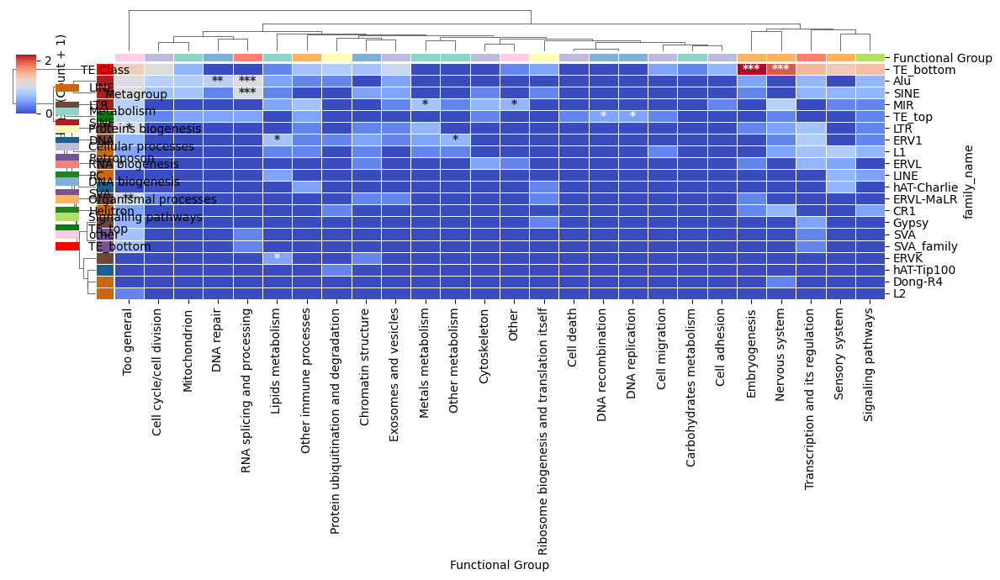

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_by_families_and_classes.svg


In [36]:
# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="family_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(family_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(12, 7),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_by_families_and_classes.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

,Column1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,class_name,Term ID Gemini,Functional Group,family_name,GO Term Name
0,0.0,0,GO:0050911,detection of chemical stimulus involved in sen...,BP,"7,37366E-14","6,91133E-10","2,966682297",59.0,398.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",LINE,GO:0050911,Sensory system,LINE,NaN
1,1.0,5,GO:0004984,olfactory receptor activity,MF,"5,89329E-14","6,91133E-10","2,981665541",59.0,396.0,"['OR10A2', 'OR10A4', 'OR10C1', 'OR10H4', 'OR10...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",LINE,GO:0004984,Sensory system,LINE,NaN
2,2.0,1,GO:0007608,sensory perception of smell,BP,"4,89959E-13","3,06159E-09","2,812065783",60.0,427.0,"['CNGA2', 'OR10A2', 'OR10A4', 'OR10C1', 'OR10H...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",LINE,GO:0007608,Sensory system,LINE,NaN
3,3.0,2,GO:0045922,negative regulation of fatty acid metabolic pr...,BP,"2,11905E-07","0,000993094","12,73524943",7.0,11.0,"['NCOR1', 'SLC22A13', 'UGT1A10', 'UGT1A6', 'UG...","['INS', 'NCOR1', 'SLC22A13', 'UGT1A1', 'UGT1A1...",LINE,GO:0045922,Lipids metabolism,LINE,NaN
4,4.0,6,GO:0004930,G protein-coupled receptor activity,MF,"3,86339E-07","0,001448462","1,84884841",74.0,801.0,"['ADGRE3', 'CCR3', 'GPR150', 'GPR176', 'GPR34'...","['ACKR1', 'ACKR2', 'ACKR3', 'ACKR4', 'ADCYAP1R...",LINE,GO:0004930,Signaling pathways,LINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,NaN,1,GO:0006397,mRNA processing,BP,0.000004,0.020265,2.410306,33.0,409.0,"['AICDA', 'ARGLU1', 'CWC25', 'DHX38', 'EIF4A3'...","['A1CF', 'AAR2', 'ACIN1', 'ADAR', 'ADARB1', 'A...",Retroposon,NaN,RNA splicing and processing,SVA,mRNA processing
192,NaN,0,GO:0006369,termination of RNA polymerase II transcription,BP,0.000003,0.020265,12.802792,6.0,14.0,"['POLR2A', 'SSU72L1', 'SSU72L2', 'SSU72L3', 'S...","['MAZ', 'PCF11', 'POLR2A', 'SCAF8', 'SETX', 'S...",Retroposon,NaN,Transcription and its regulation,SVA,termination of RNA polymerase II transcription
193,NaN,5,GO:0019899,enzyme binding,MF,0.000006,0.021173,2.426248,32.0,394.0,"['ARMT1', 'ATG3', 'CBS', 'COPS5', 'CYP1A1', 'D...","['A2M', 'ABCD1', 'ABL1', 'ABL2', 'ACAT1', 'ACI...",Retroposon,NaN,Too general,SVA,enzyme binding
194,NaN,3,GO:0005654,nucleoplasm,CC,0.000025,0.076966,1.367288,165.0,3605.0,"['ABTB3', 'ADI1', 'AIP', 'APOBEC3B', 'ARGLU1',...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",Retroposon,NaN,Too general,SVA,nucleoplasm


In [ ]:
counts_by_group = (
    top_5_perc_genes_manual[["class_name", "Functional group Gemini"]]
    .value_counts()
    .reset_index()
)

top_5_perc_genes_manual

### Sankey plot between Classes,  functional grouos and families

In [44]:
top_5_perc_genes_manual = pd.read_csv(
    "GO_top_5_perc_genes_by_class_gemini_manual.csv", sep=";"
)
top_5_perc_genes_manual.columns = [
    "Column1",
    "Unnamed: 0",
    "Term ID",
    "Term Name",
    "Term Database",
    "P-value",
    "FDR",
    "Fold Enrichment",
    "Overlap Count",
    "Total Term Genes (Human)",
    "Overlapping Genes",
    "Full Term Gene List",
    "class_name",
    "Term ID Gemini",
    "Functional Group",
]
top_5_perc_genes_manual["family_name"] = top_5_perc_genes_manual["class_name"]

top_5_perc_genes_by_families = pd.read_csv("top_5_perc_genes_by_families.csv")
classification = pd.read_csv("GO_terms_families_classification_Gemini - families.csv")

top_5_perc_genes_by_families = top_5_perc_genes_by_families.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)

families_by_classes = (
    pd.read_csv("families_by_classes_TE.csv").dropna().set_index("family_name")
)
families_by_classes = families_by_classes["class_name"].to_dict()

counts_by_group_classes = (
    top_5_perc_genes_manual[["class_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
# counts_by_group_classes = counts_by_group_classes[counts_by_group_classes['count'] > 1]
# counts_by_group_classes = counts_by_group_classes[~counts_by_group_classes['class_name'].str.contains('TE_')]

counts_by_group_families = (
    top_5_perc_genes_by_families[["class_name", "family_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
# counts_by_group_families = counts_by_group_families[counts_by_group_families['count'] > 1]

families_by_classes

{'L1': 'LINE',
 'ERV1': 'LTR',
 'ERVL-MaLR': 'LTR',
 'Alu': 'SINE',
 'MIR': 'SINE',
 'hAT-Charlie': 'DNA',
 'MULE-MuDR': 'DNA',
 'TcMar-Tigger': 'DNA',
 'L2': 'LINE',
 'RTE-X': 'LINE',
 'ERVL': 'LTR',
 'CR1': 'LINE',
 'ERVK': 'LTR',
 'SVA': 'Retroposon',
 'Gypsy': 'LTR',
 'hAT-Blackjack': 'DNA',
 'hAT-Tip100': 'DNA',
 'hAT-Tag1': 'DNA',
 'tRNA-Deu': 'SINE',
 'RTE-BovB': 'LINE',
 'hAT-Ac': 'DNA',
 '5S-Deu-L2': 'SINE',
 'PiggyBac': 'DNA',
 'hAT': 'DNA',
 'tRNA-RTE': 'SINE',
 'Helitron': 'RC',
 'TcMar-Mariner': 'DNA',
 'TcMar-Tc2': 'DNA',
 'tRNA': 'SINE',
 'I-Jockey': 'LINE',
 'Penelope': 'LINE',
 'Dong-R4': 'LINE',
 'TcMar': 'DNA',
 'Kolobok': 'DNA',
 'TcMar-Tc1': 'DNA',
 'Merlin': 'DNA',
 'hAT?': 'DNA',
 'TcMar-Pogo': 'DNA',
 'L1-Tx1': 'LINE',
 'Crypton': 'DNA',
 'Crypton-A': 'DNA',
 'PIF-Harbinger': 'DNA',
 'hAT-Tip100?': 'DNA',
 'hAT-hAT19': 'DNA'}

In [28]:
counts_by_group_classes

,class_name,Functional Group,count
6,SINE,Too general,12
8,LTR,Too general,11
9,SINE,RNA splicing and processing,10
13,SINE,Cell cycle/cell division,4
14,SINE,Mitochondrion,4
15,LTR,Transcription and its regulation,4
18,SVA,Too general,4
20,SINE,Transcription and its regulation,3
21,SINE,Signaling pathways,3
23,SINE,Sensory system,3


In [42]:
counts_by_group_families.columns

Index(['class_name', 'family_name', 'Functional Group', 'count'], dtype='object')

In [43]:
counts_by_group_families[["family_name", "Functional Group", "count"]]

,family_name,Functional Group,count
0,Alu,Too general,11
1,Alu,RNA splicing and processing,11
2,ERVL-MaLR,Too general,8
3,ERVL,Too general,6
4,Alu,DNA repair,6
...,...,...,...
73,MIR,Cell adhesion,1
74,MIR,Exosomes and vesicles,1
75,MIR,Other metabolism,1
76,MIR,Sensory system,1


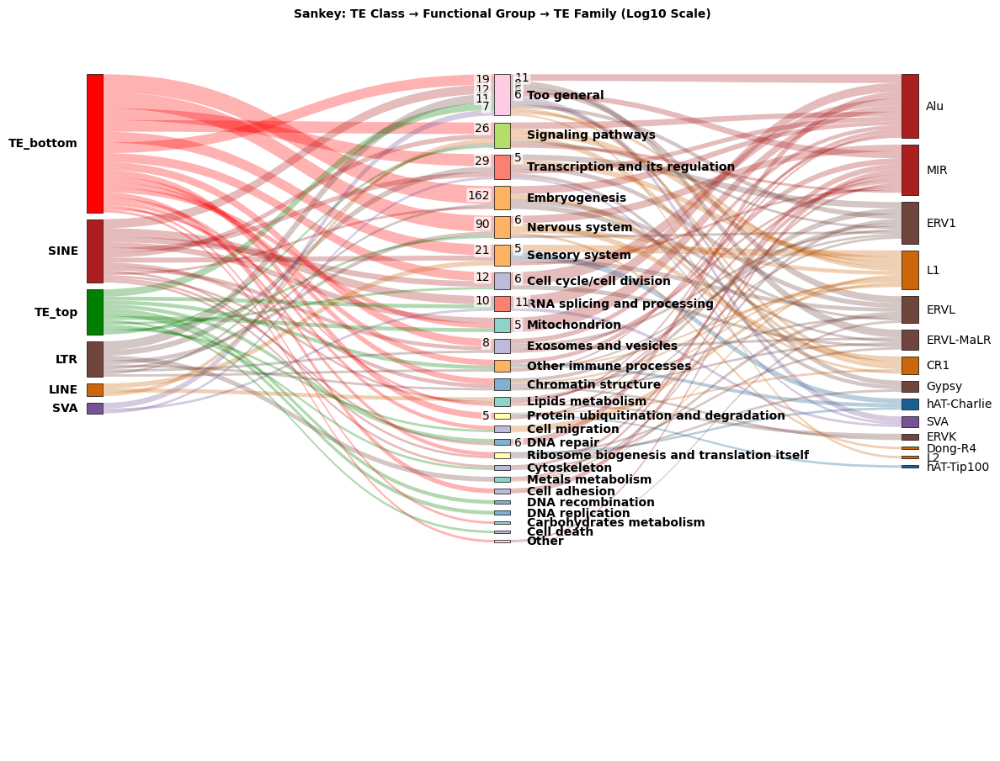

Success: Sankey plot with statistical stars and ribbon labels saved to plots/TE_GO_Sankey_Classes_and_Families.svg


In [45]:
# --- 1. Global Parameters & Palettes ---
GLOBAL_FONT_SIZE = 10
# Toggle between Linear and Logarithmic scale for bar/ribbon heights
USE_LOG_SCALE = True
# Minimum count threshold to display number labels on ribbons
RIBBON_LABEL_THRESHOLD = 5

# --- 3. Statistical Calculations ---


def perform_enrichment_testing(df_f, df_c, fam_class_map):
    """Calculates Fisher's enrichment for each Family-Group pair against its Class."""
    class_group_totals = df_c.set_index(["class_name", "Functional Group"])[
        "count"
    ].to_dict()
    class_all_totals = df_c.groupby("class_name")["count"].sum().to_dict()
    fam_all_totals = df_f.groupby("family_name")["count"].sum().to_dict()

    p_values = []

    for _, row in df_f.iterrows():
        f_name, g_name, a = row["family_name"], row["Functional Group"], row["count"]
        c_name = fam_class_map.get(f_name, "other")

        b = fam_all_totals.get(f_name, a) - a
        c_g_val = class_group_totals.get((c_name, g_name), a)
        c = max(0, c_g_val - a)
        c_total = class_all_totals.get(c_name, a + b + c)
        d = max(0, (c_total - c_g_val) - b)

        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values.append(p)

    _, p_adj, _, _ = multipletests(p_values, method="fdr_bh")

    def p_to_stars(p):
        if p < 0.001:
            return "***"
        if p < 0.01:
            return "**"
        if p < 0.05:
            return "*"
        return "ns"

    df_f["p_adj"] = p_adj
    df_f["stars"] = df_f["p_adj"].apply(p_to_stars)
    return df_f


counts_by_group_families = perform_enrichment_testing(
    counts_by_group_families, counts_by_group_classes, families_by_classes
)

# Apply scaling transformation
if USE_LOG_SCALE:
    counts_by_group_classes["plot_count"] = np.log10(
        counts_by_group_classes["count"] + 1
    )
    counts_by_group_families["plot_count"] = np.log10(
        counts_by_group_families["count"] + 1
    )
else:
    counts_by_group_classes["plot_count"] = counts_by_group_classes["count"]
    counts_by_group_families["plot_count"] = counts_by_group_families["count"]

group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}

# --- 4. Geometry & Drawing Helpers ---


def get_bezier_ribbon(x1, y1_start, y1_end, x2, y2_start, y2_end):
    """Generates a Path object for a curved Sankey ribbon."""
    verts = [
        (x1, y1_start),
        (x1 + (x2 - x1) / 2, y1_start),
        (x1 + (x2 - x1) / 2, y2_start),
        (x2, y2_start),
        (x2, y2_end),
        (x1 + (x2 - x1) / 2, y2_end),
        (x1 + (x2 - x1) / 2, y1_end),
        (x1, y1_end),
        (x1, y1_start),
    ]
    codes = [
        Path.MOVETO,
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4,
        Path.LINETO,
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4,
        Path.CLOSEPOLY,
    ]
    return Path(verts, codes)


def plot_sankey():
    fig, ax = plt.subplots(figsize=(15, 11))
    ax.set_xlim(-0.2, 2.2)
    ax.set_ylim(-1, 1.1)
    ax.axis("off")

    X_CLASS = 0
    X_GROUP = 1
    X_FAM = 2
    BAR_WIDTH = 0.04
    GAP_Y = 0.02

    # A) Pre-calculate Vertical Positions
    total_val = counts_by_group_classes["plot_count"].sum()

    # 1. Classes
    class_totals = (
        counts_by_group_classes.groupby("class_name")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    class_pos = {}
    curr_y = 1.0
    for name, val in class_totals.items():
        h = val / total_val * 0.9
        class_pos[name] = (curr_y - h, curr_y)
        rect = patches.Rectangle(
            (X_CLASS - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=class_names_p.get(name, "gray"),
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_CLASS - 0.04,
            curr_y - h / 2,
            name,
            ha="right",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
            fontweight="bold",
        )
        curr_y -= h + GAP_Y

    # 2. Functional Groups
    group_totals = (
        counts_by_group_classes.groupby("Functional Group")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    group_pos = {}
    curr_y = 1.0
    for name, val in group_totals.items():
        h = val / total_val * 0.9
        group_pos[name] = (curr_y - h, curr_y)
        meta = group_to_meta.get(name, "other")
        color = metagroup_palette.get(meta, "gray")
        rect = patches.Rectangle(
            (X_GROUP - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=color,
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_GROUP + 0.06,
            curr_y - h / 2,
            name,
            ha="left",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
            fontweight="bold",
        )
        curr_y -= h + GAP_Y

    # 3. Families
    fam_totals_df = (
        counts_by_group_families.groupby("family_name")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    total_fam_val = fam_totals_df.sum()
    family_pos = {}
    curr_y = 1.0
    for name, val in fam_totals_df.items():
        h = val / total_fam_val * 0.9
        family_pos[name] = (curr_y - h, curr_y)
        cls = families_by_classes.get(name, "other")
        rect = patches.Rectangle(
            (X_FAM - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=class_names_p.get(cls, "gray"),
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_FAM + 0.04,
            curr_y - h / 2,
            name,
            ha="left",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
        )
        curr_y -= h + GAP_Y

    # B) Draw Ribbons

    # 1. Class -> Group
    class_offsets = {n: class_pos[n][1] for n in class_totals.index}
    group_offsets_L = {n: group_pos[n][1] for n in group_totals.index}

    for _, row in counts_by_group_classes.sort_values(
        "plot_count", ascending=False
    ).iterrows():
        c_name, g_name, val_p, raw_val = (
            row["class_name"],
            row["Functional Group"],
            row["plot_count"],
            row["count"],
        )
        if g_name not in group_pos:
            continue

        h_c = val_p / total_val * 0.9
        h_g = val_p / total_val * 0.9

        path = get_bezier_ribbon(
            X_CLASS + BAR_WIDTH / 2,
            class_offsets[c_name] - h_c,
            class_offsets[c_name],
            X_GROUP - BAR_WIDTH / 2,
            group_offsets_L[g_name] - h_g,
            group_offsets_L[g_name],
        )

        ax.add_patch(
            patches.PathPatch(
                path, facecolor=class_names_p.get(c_name, "gray"), alpha=0.3, lw=0
            )
        )

        # Ribbon label at the junction with the central bar
        if raw_val >= RIBBON_LABEL_THRESHOLD:
            ax.text(
                X_GROUP - BAR_WIDTH / 2 - 0.01,
                group_offsets_L[g_name] - h_g / 2,
                str(int(raw_val)),
                ha="right",
                va="center",
                fontsize=GLOBAL_FONT_SIZE,
                bbox=dict(
                    boxstyle="round,pad=0.1",
                    facecolor="white",
                    alpha=0.7,
                    edgecolor="none",
                ),
            )

        class_offsets[c_name] -= h_c
        group_offsets_L[g_name] -= h_g

    # 2. Group -> Family
    group_totals_fam_df = counts_by_group_families.groupby("Functional Group")[
        "plot_count"
    ].sum()
    group_offsets_R = {n: group_pos[n][1] for n in group_pos}
    fam_offsets = {n: family_pos[n][1] for n in fam_totals_df.index}

    for _, row in counts_by_group_families.sort_values(
        "plot_count", ascending=False
    ).iterrows():
        f_name, g_name, val_p, raw_val = (
            row["family_name"],
            row["Functional Group"],
            row["plot_count"],
            row["count"],
        )
        if g_name not in group_pos or f_name not in family_pos:
            continue

        visual_h_middle = group_pos[g_name][1] - group_pos[g_name][0]
        h_g = (val_p / group_totals_fam_df[g_name]) * visual_h_middle
        h_f = val_p / total_fam_val * 0.9

        cls = families_by_classes.get(f_name, "other")
        path = get_bezier_ribbon(
            X_GROUP + BAR_WIDTH / 2,
            group_offsets_R[g_name] - h_g,
            group_offsets_R[g_name],
            X_FAM - BAR_WIDTH / 2,
            fam_offsets[f_name] - h_f,
            fam_offsets[f_name],
        )

        ax.add_patch(
            patches.PathPatch(
                path, facecolor=class_names_p.get(cls, "gray"), alpha=0.3, lw=0
            )
        )

        # Ribbon label at the junction with the central bar
        if raw_val >= RIBBON_LABEL_THRESHOLD:
            ax.text(
                X_GROUP + BAR_WIDTH / 2 + 0.01,
                group_offsets_R[g_name] - h_g / 2,
                str(int(raw_val)),
                ha="left",
                va="center",
                fontsize=GLOBAL_FONT_SIZE,
                bbox=dict(
                    boxstyle="round,pad=0.1",
                    facecolor="white",
                    alpha=0.7,
                    edgecolor="none",
                ),
            )

        # Significance Stars at Family bar entry
        if row["stars"] != "ns":
            y_star = fam_offsets[f_name] - h_f / 2
            ax.text(
                X_FAM - 0.05,
                y_star,
                row["stars"],
                ha="right",
                va="center",
                color="black",
                fontsize=GLOBAL_FONT_SIZE,
                fontweight="bold",
            )

        group_offsets_R[g_name] -= h_g
        fam_offsets[f_name] -= h_f

    scale_type = "Log10" if USE_LOG_SCALE else "Linear"
    plt.title(
        f"Sankey: TE Class → Functional Group → TE Family ({scale_type} Scale)",
        fontsize=GLOBAL_FONT_SIZE,
        weight="bold",
        pad=20,
    )

    # Save
    os.makedirs("plots", exist_ok=True)
    save_path = "plots/TE_GO_Sankey_Classes_and_Families.svg"
    plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")
    plt.show()
    print(
        f"Success: Sankey plot with statistical stars and ribbon labels saved to {save_path}"
    )


if __name__ == "__main__":
    plot_sankey()

In [ ]:
Now please add the following statistical annotation to the plot.



For each incoming ribbon

## Subfamilies (analysis as for families)

1. Build distributions of counts by family near genes
2. Extract top 5% of genes that have highest number of elements of each family, maximum number is 5% of the whole set of genes (1436)
3. Build intersection plots (supervenns) for them. Annotate using class palette?
4. Build network of intersections for them like for GO terms earlier.
5. Get GO terms
6. Interaction networks, with more stringent criteria
7. Heatmaps by processes metagroup
8. Correlations of GO terms significance/number with enrichment score near genes (based on the Fisher exact test approach)

In [50]:
TEs_on_genes

,Chromosome,Start,End,Gene_name,Signal,Divergence_scores,TE_subfamilies,TE_families,TE_classes,Signals,...,DNA_number,Retroposon_number,RC_number,TE_number,Divergence_Avg_LINE,Divergence_Avg_LTR,Divergence_Avg_SINE,Divergence_Avg_DNA,Divergence_Avg_Retroposon,Divergence_Avg_RC
0,chr1,8582,18582,LOC127239154,0.2922687913,"106,325,223,236,164,87,166,217,153,337,183,195...","MER4A1,MLT1I,L1M5,MLT1H2,L1MA4,AluY,MER4D1,MER...","ERV1,ERVL-MaLR,L1,ERVL-MaLR,L1,Alu,ERV1,ERV1,E...","LTR,LTR,LINE,LTR,LINE,SINE,LTR,LTR,LTR,SINE,LT...","0.2202762429,0.8299625,0.572213,.,0.5469095429...",...,0,0,0,15,193.500000,198.000000,170.166667,NaN,NaN,NaN
1,chr1,49612,59612,LOC101928626,0.4283229986,"254,194,206,281,218,126,247,133,74,89,303,395,...","L1ME4a,L2a,L2c,MIRb,LTR37B,AluSq,MLT1O,MSTA,Al...","L1,L2,L2,MIR,ERV1,Alu,ERVL-MaLR,ERVL-MaLR,Alu,...","LINE,LINE,LINE,SINE,LTR,SINE,LTR,LTR,SINE,SINE...","0.177422835,0.4724386174,0.5349553862,0.534999...",...,1,0,0,23,226.428571,201.200000,180.800000,395.0,NaN,NaN
2,chr1,107877,117877,OR4F16,-0.1430819362,"163,78,229,184,161,300,350,130,340,234","L1MA7,L1PA7,L1M4,L1MA4,L1MA4,MIR3,MIRc,L2c,MIR...","L1,L1,L1,L1,L1,MIR,MIR,L2,MIR,MIR","LINE,LINE,LINE,LINE,LINE,SINE,SINE,LINE,SINE,SINE","0.391722927,1.167674433,-0.931795,-0.111012058...",...,0,0,0,10,157.500000,NaN,306.000000,NaN,NaN,NaN
3,chr1,132287,142287,LOC127239154,-0.4371188212,"333,282,270,243,325,274,135,228,118,3,126,248,...","L1M5,L2a,L1ME3D,L2,LTR33B,MER65D,L1MA5,MLT1D,T...","L1,L2,L1,L2,ERVL,ERV1,L1,ERVL-MaLR,ERVL-MaLR,A...","LINE,LINE,LINE,LINE,LTR,LTR,LINE,LTR,LTR,SINE,...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,17,246.500000,236.250000,79.000000,NaN,NaN,NaN
4,chr1,133480,143480,LOC127239154,-0.4101818372,"333,282,270,243,135,228,118,3,126,248,347,61,2...","L1M5,L2a,L1ME3D,L2,L1MA5,MLT1D,THE1D,AluYa5,L1...","L1,L2,L1,L2,L1,ERVL-MaLR,ERVL-MaLR,Alu,L1,L2,L...","LINE,LINE,LINE,LINE,LINE,LTR,LTR,SINE,LINE,LIN...","-0.5015097471,0.1912893158,-0.456923923,-0.441...",...,0,0,0,15,246.500000,173.000000,79.000000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,chrY,62185165,62195165,SPRY3,0.204364463,"104,94,313,226,204,196,218,269,169,234,242,225...","L1PA16,L1PA16,L2c,L2a,L2a,L2c,MIRc,L2c,MLT1A0,...","L1,L1,L2,L2,L2,L2,MIR,L2,ERVL-MaLR,MIR,MIR,MIR...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,LINE,LTR,SI...","0.17978186,0.5729008,.,.,.,.,.,0.9911925778,.,...",...,2,0,0,17,200.857143,169.000000,257.857143,295.5,NaN,NaN
38700,chrY,62301324,62311324,VAMP7,0.2318653989,"153,71,340,114,114,308,271,71,74,293,320,109,2...","L1PA17,L1PA10,L2a,L1PA17,FRAM,L2,MIRc,MER41A,M...","L1,L1,L2,L1,Alu,L2,MIR,ERV1,ERVL-MaLR,MIR,L2,A...","LINE,LINE,LINE,LINE,SINE,LINE,SINE,LTR,LTR,SIN...","-0.4256057778,0.1826155477,0.1826155477,-0.576...",...,2,0,0,23,252.090909,107.000000,169.428571,279.5,NaN,NaN
38701,chrY,62417686,62427686,IL9R,0.1765993647,"143,112,141,208,245,159,168,119,153,202,75,143...","L1MA7,L1MB3,L1M4c,L1MEb,L1ME3G,L1M4,AluJb,AluS...","L1,L1,L1,L1,L1,L1,Alu,Alu,Alu,hAT-Charlie,MIR,...","LINE,LINE,LINE,LINE,LINE,LINE,SINE,SINE,SINE,D...","-0.1042256162,-0.06625528413,-0.3867034074,-0....",...,1,0,0,23,187.285714,NaN,159.200000,202.0,NaN,NaN
38702,chrY,62436822,62446822,WASIR1,0.8498523286,"201,228,119,149,234,150,117,103,79,120,104,116...","MLT1C2,LTR35B,AluSq2,MER66A,L1MC,AluSx,AluSx,F...","ERVL-MaLR,ERV1,Alu,ERV1,L1,Alu,Alu,Alu,Alu,Alu...","LTR,LTR,SINE,LTR,LINE,SINE,SINE,SINE,SINE,SINE...",".,.,.,.,0.8498523286,.,-0.1954545,.,.,1.807282...",...,0,0,0,16,215.000000,192.666667,124.111111,NaN,NaN,NaN


In [8]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamilies_by_classes_dict = subfamilies_by_classes["class_name"].to_dict()
subfamilies_by_classes_dict

{'L1MC3': 'LINE',
 'LTR60B': 'LTR',
 'MER34C_v': 'LTR',
 'MSTA1': 'LTR',
 'MER4A1': 'LTR',
 'MLT1I': 'LTR',
 'L1M5': 'LINE',
 'MLT1H2': 'LTR',
 'L1MA4': 'LINE',
 'AluY': 'SINE',
 'MER4D1': 'LTR',
 'MER4A': 'LTR',
 'MIRb': 'SINE',
 'MER31B': 'LTR',
 'AluJb': 'SINE',
 'AluSx3': 'SINE',
 'AluSx': 'SINE',
 'MER112': 'DNA',
 'Ricksha_0': 'DNA',
 'MIR3': 'SINE',
 'MER46C': 'DNA',
 'Charlie20a': 'DNA',
 'AluSg': 'SINE',
 'L1MD3': 'LINE',
 'L1ME1': 'LINE',
 'L1MD': 'LINE',
 'AluYf1': 'SINE',
 'MER39B': 'LTR',
 'AluSq2': 'SINE',
 'AluSx1': 'SINE',
 'MLT1K': 'LTR',
 'LTR9B': 'LTR',
 'MER5A': 'DNA',
 'MER4E1': 'LTR',
 'AluSx4': 'SINE',
 'L2c': 'LINE',
 'L1ME4a': 'LINE',
 'MIRc': 'SINE',
 'MLT1E3': 'LTR',
 'Charlie4z': 'DNA',
 'L2a': 'LINE',
 'FRAM': 'SINE',
 'MER5B': 'DNA',
 'LTR37B': 'LTR',
 'AluSq': 'SINE',
 'MLT1O': 'LTR',
 'MSTA': 'LTR',
 'Alu': 'SINE',
 'MER103C': 'DNA',
 'LTR39': 'LTR',
 'AluSz6': 'SINE',
 'L1PA4': 'LINE',
 'L5': 'LINE',
 'L2': 'LINE',
 'LTR33': 'LTR',
 'MIR': 'SINE',
 'Alu

In [55]:
subfamilies_by_classes

,class_name,subfamily_name
subfamily_name,,
L1MC3,LINE,L1MC3
LTR60B,LTR,LTR60B
MER34C_v,LTR,MER34C_v
MSTA1,LTR,MSTA1
MER4A1,LTR,MER4A1
...,...,...
HERV1_I,LTR,HERV1_I
HERV1_LTRe,LTR,HERV1_LTRe
HERV1_LTRb,LTR,HERV1_LTRb


In [9]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    TEs_on_genes_subfamilies = TEs_on_genes.copy()

    for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):
        TEs_on_genes_subfamilies[f"{subfamily_name}_number"] = TEs_on_genes_subfamilies[
            "TE_subfamilies"
        ].apply(
            lambda str_concat: (
                len(
                    [name for name in str_concat.split(",") if name == subfamily_name]
                    if str_concat and pd.notna(str_concat)
                    else []
                )
            )
        )

    TEs_on_genes_subfamilies = TEs_on_genes_subfamilies[
        ["Gene_name"]
        + [
            f"{subfamily_name}_number"
            for subfamily_name in subfamilies_by_classes["subfamily_name"]
        ]
    ]
    TEs_on_genes_subfamilies

100%|██████████| 1143/1143 [01:02<00:00, 18.35it/s]


### Histogram or other visualization of TE count near genes by family

In [6]:
TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")
TEs_on_genes_subfamilies

,Unnamed: 0.1,Unnamed: 0,Gene_name,L1MC3_number,LTR60B_number,MER34C_v_number,MSTA1_number,MER4A1_number,MLT1I_number,L1M5_number,...,LTR46-int_number,Chompy-6_Croc_number,HERV30-int_number,Alu-VAR_rnd-5_family-1084_number,HERV-Fc1_LTR1_number,HERV1_I_number,HERV1_LTRe_number,HERV1_LTRb_number,HERV-Fc1-int_number,HERV-Fc1_LTR2_number
0,0,0,LOC127239154,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,1,1,LOC101928626,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,2,OR4F16,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,3,LOC127239154,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,4,4,LOC127239154,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,38699,38699,SPRY3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38700,38700,38700,VAMP7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38701,38701,38701,IL9R,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38702,38702,38702,WASIR1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [15]:
TEs_on_genes_subfamilies["L1MC3_number"].value_counts()

L1MC3_number
0    37737
1      908
2       50
3        9
Name: count, dtype: int64

In [62]:
"HERV1_LTRe_number"[:-7]

'HERV1_LTRe'

In [9]:
count_cols = [c for c in TEs_on_genes_subfamilies.columns if c.endswith("_number")]
value_counts_dfs = []
for column in tqdm(count_cols):
    value_counts_dfs.append(TEs_on_genes_subfamilies[column].value_counts())
value_counts_df = pd.concat(value_counts_dfs, axis=1)
value_counts_df.columns = [column[:-7] for column in count_cols]
value_counts_df = value_counts_df.fillna(0)
value_counts_df = value_counts_df.T.sort_values(0)
classes = subfamilies_by_classes["class_name"].reindex(value_counts_df.index)
value_counts_df

100%|██████████| 1143/1143 [00:00<00:00, 3866.84it/s]


,0,1,2,3,4,5,6,7,8,9,10,12,13,11,15,16
AluSx,13975.0,9725.0,6118.0,3861.0,2318.0,1353.0,689.0,372.0,171.0,67.0,27.0,8.0,5.0,15.0,0.0,0.0
AluJb,16171.0,10462.0,6116.0,3205.0,1578.0,713.0,300.0,96.0,39.0,16.0,6.0,1.0,1.0,0.0,0.0,0.0
MIRb,18920.0,11470.0,5142.0,2001.0,721.0,293.0,95.0,44.0,15.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR,22097.0,11178.0,3784.0,1184.0,359.0,71.0,17.0,11.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
L2a,23612.0,10958.0,3252.0,706.0,143.0,26.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Eulor7,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X1_LR,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X21_LINE,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eulor5B,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
classes

AluSx          SINE
AluJb          SINE
MIRb           SINE
MIR            SINE
L2a            LINE
               ... 
Eulor7          DNA
X1_LR           LTR
X21_LINE       LINE
Eulor5B         DNA
LTR108c_Mam     LTR
Name: class_name, Length: 1143, dtype: str

In [26]:
value_counts_df.loc[classes != 'a', value_counts_df.columns[1:]].replace(0, np.nan).dropna(axis=1, how='all').sum(axis=1)

AluSx          24729.0
AluJb          22533.0
MIRb           19784.0
MIR            16607.0
L2a            15092.0
                ...   
Eulor7             0.0
X1_LR              0.0
X21_LINE           0.0
Eulor5B            0.0
LTR108c_Mam        0.0
Length: 1143, dtype: float64

In [25]:
value_counts_df.loc[classes == 'LTR', value_counts_df.columns[1:]].replace(0, np.nan).dropna(axis=1, how='all')#.sum(axis=1)

,1,2,3,4,5,6,8
MLT1D,1189.0,61.0,2.0,NaN,NaN,NaN,NaN
MLT1K,1133.0,78.0,4.0,1.0,2.0,NaN,NaN
MLT1A0,1148.0,55.0,3.0,NaN,NaN,NaN,NaN
MLT1C2,1110.0,68.0,6.0,NaN,NaN,NaN,NaN
MLT1J,1052.0,56.0,8.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
HERV-Fc1_LTR2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HERV-Fc1_LTR3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HERV1_LTRe,NaN,NaN,NaN,NaN,NaN,NaN,NaN
X1_LR,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
value_counts_df[value_counts_df.index.str.startswith('L2')]

,0,1,2,3,4,5,6,7,8,9,10,12,13,11,15,16
L2a,23612.0,10958.0,3252.0,706.0,143.0,26.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
L2c,25425.0,9834.0,2706.0,599.0,115.0,22.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2b,26440.0,9362.0,2246.0,524.0,107.0,22.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
L2,31398.0,6238.0,968.0,91.0,8.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2d2,32287.0,5668.0,689.0,56.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2d,34748.0,3635.0,286.0,34.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2-1_AMi,38553.0,146.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2-2_Mam,38666.0,37.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L2-1_Crp,38670.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
value_counts_df[value_counts_df.index.str.startswith('L1')]

,0,1,2,3,4,5,6,7,8,9,10,12,13,11,15,16
L1M5,33725.0,4328.0,543.0,98.0,8.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1ME4a,35089.0,3283.0,305.0,24.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1ME4b,35395.0,3035.0,255.0,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1ME3G,35961.0,2571.0,165.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1MC4,36003.0,2407.0,253.0,33.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L1P4d,38696.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1P4e,38697.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1P3b,38699.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L1P4b,38699.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
classes.dropna()

NameError: name 'classes' is not defined

visualize via barplot with log scale and classes color annotation

<Axes: >

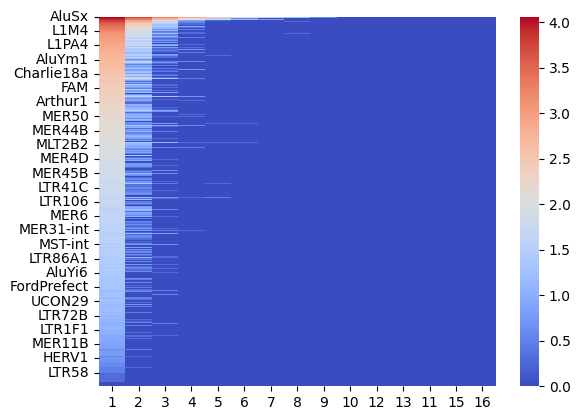

In [20]:
sns.heatmap(
    (value_counts_df + 1).apply(np.log10)[value_counts_df.columns[1:]], cmap="coolwarm"
)

In [24]:
subfamilies_by_classes_dict

{'L1MC3': 'LINE',
 'LTR60B': 'LTR',
 'MER34C_v': 'LTR',
 'MSTA1': 'LTR',
 'MER4A1': 'LTR',
 'MLT1I': 'LTR',
 'L1M5': 'LINE',
 'MLT1H2': 'LTR',
 'L1MA4': 'LINE',
 'AluY': 'SINE',
 'MER4D1': 'LTR',
 'MER4A': 'LTR',
 'MIRb': 'SINE',
 'MER31B': 'LTR',
 'AluJb': 'SINE',
 'AluSx3': 'SINE',
 'AluSx': 'SINE',
 'MER112': 'DNA',
 'Ricksha_0': 'DNA',
 'MIR3': 'SINE',
 'MER46C': 'DNA',
 'Charlie20a': 'DNA',
 'AluSg': 'SINE',
 'L1MD3': 'LINE',
 'L1ME1': 'LINE',
 'L1MD': 'LINE',
 'AluYf1': 'SINE',
 'MER39B': 'LTR',
 'AluSq2': 'SINE',
 'AluSx1': 'SINE',
 'MLT1K': 'LTR',
 'LTR9B': 'LTR',
 'MER5A': 'DNA',
 'MER4E1': 'LTR',
 'AluSx4': 'SINE',
 'L2c': 'LINE',
 'L1ME4a': 'LINE',
 'MIRc': 'SINE',
 'MLT1E3': 'LTR',
 'Charlie4z': 'DNA',
 'L2a': 'LINE',
 'FRAM': 'SINE',
 'MER5B': 'DNA',
 'LTR37B': 'LTR',
 'AluSq': 'SINE',
 'MLT1O': 'LTR',
 'MSTA': 'LTR',
 'Alu': 'SINE',
 'MER103C': 'DNA',
 'LTR39': 'LTR',
 'AluSz6': 'SINE',
 'L1PA4': 'LINE',
 'L5': 'LINE',
 'L2': 'LINE',
 'LTR33': 'LTR',
 'MIR': 'SINE',
 'Alu

In [52]:
value_counts_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16
AluSx,13975.0,9725.0,6118.0,3861.0,2318.0,1353.0,689.0,372.0,171.0,67.0,27.0,15.0,8.0,5.0,0.0,0.0
AluJb,16171.0,10462.0,6116.0,3205.0,1578.0,713.0,300.0,96.0,39.0,16.0,6.0,0.0,1.0,1.0,0.0,0.0
MIRb,18920.0,11470.0,5142.0,2001.0,721.0,293.0,95.0,44.0,15.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR,22097.0,11178.0,3784.0,1184.0,359.0,71.0,17.0,11.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
L2a,23612.0,10958.0,3252.0,706.0,143.0,26.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Eulor7,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X1,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X21,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eulor5B,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
print(classes.to_string())

AluSx                              SINE
AluJb                              SINE
MIRb                               SINE
MIR                                SINE
L2a                                LINE
L2c                                LINE
AluY                               SINE
L2b                                LINE
MIR3                               SINE
MIRc                               SINE
AluSx1                             SINE
L2                                 LINE
AluSz                              SINE
AluSp                              SINE
L2d2                               LINE
FLAM_C                             SINE
AluSg                              SINE
L1M5                               LINE
L3                                 LINE
AluSq2                             SINE
AluSz6                             SINE
L2d                                LINE
MER5A                               DNA
L1ME4a                             LINE
AluSc                              SINE


In [20]:
value_counts_df[:570]

,0,1,2,3,4,5,6,7,8,9,10,12,13,11,15,16
AluSx,13975.0,9725.0,6118.0,3861.0,2318.0,1353.0,689.0,372.0,171.0,67.0,27.0,8.0,5.0,15.0,0.0,0.0
AluJb,16171.0,10462.0,6116.0,3205.0,1578.0,713.0,300.0,96.0,39.0,16.0,6.0,1.0,1.0,0.0,0.0,0.0
MIRb,18920.0,11470.0,5142.0,2001.0,721.0,293.0,95.0,44.0,15.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR,22097.0,11178.0,3784.0,1184.0,359.0,71.0,17.0,11.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
L2a,23612.0,10958.0,3252.0,706.0,143.0,26.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LTR5A,38647.0,43.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Kanga11a,38647.0,47.0,6.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LTR81B,38647.0,53.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AmnSINE2,38648.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
value_counts_df[570:]

,0,1,2,3,4,5,6,7,8,9,10,12,13,11,15,16
LTR64,38648.0,53.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LTR24,38648.0,54.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LTR106_Mam,38649.0,55.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MER101-int,38649.0,53.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LTR33B,38650.0,52.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Eulor7,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X1_LR,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
X21_LINE,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eulor5B,38704.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/tmp/ipykernel_127/1349538485.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


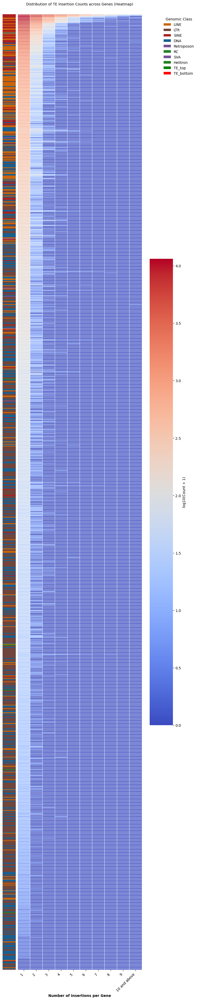

Success: Heatmap with consolidated 10+ insertions and missing classes as white saved to plots/TE_subfamily_insertion_heatmap.svg


In [22]:
# --- 2. Processing ---

# Identify columns 10 and above for consolidation
# Use str(c).isdigit() to handle column names that are already integers
numeric_cols = [c for c in value_counts_df.columns if str(c).isdigit()]
high_count_cols = [c for c in numeric_cols if int(c) >= 10]

if high_count_cols:
    value_counts_df["10 and above"] = value_counts_df[high_count_cols].sum(axis=1)
    value_counts_df.drop(columns=high_count_cols, inplace=True)


# Sort columns numerically (0, 1, 2... 10 and above)
def sort_key(col):
    if col == "10 and above":
        return 10
    return int(col)


sorted_cols = sorted(value_counts_df.columns, key=sort_key)
value_counts_df = value_counts_df[sorted_cols]

value_counts_df
# Apply the requested log scaling transformation: log10(count + 1)
# Subsetting to exclude the '0' column as requested [columns[1:]]
# This prevents artificially wide patches of high-count zero cells from dominating the scale
log_data = (value_counts_df + 1).apply(np.log10)[value_counts_df.columns[1:]]

# Map classes to the rows for annotation
class_mapping = value_counts_df.index.map(subfamilies_by_classes_dict)

# --- 3. Plotting ---

# Calculate height based on number of subfamilies
fig_height = max(8, len(log_data) * 0.042)
fig = plt.figure(figsize=(8.5, fig_height))

# Create grid for row colors and heatmap
from matplotlib.gridspec import GridSpec

gs = GridSpec(1, 2, width_ratios=[0.085, 1], wspace=0.02)

# Subplot for Row Colors (Class Annotations)
ax_colors = fig.add_subplot(gs[0])

# MODIFIED: Handle missing class mappings by assigning them to a "Missing" category colored white
unique_classes = list(class_names_p.keys()) + ["Missing"]
class_to_idx = {cls: i for i, cls in enumerate(unique_classes)}
# If the mapped class is NaN/None, default to the 'Missing' index
row_anno_data = np.array(
    [class_to_idx.get(cls, class_to_idx["Missing"]) for cls in class_mapping]
).reshape(-1, 1)

# Create a colormap including white for the 'Missing' category
anno_colors = [class_names_p[cls] for cls in class_names_p.keys()] + ["#FFFFFF"]
anno_cmap = mcolors.ListedColormap(anno_colors)

sns.heatmap(
    row_anno_data,
    ax=ax_colors,
    cmap=anno_cmap,
    cbar=False,
    yticklabels=False,  # log_data.index,
    xticklabels=False,
    vmin=0,
    vmax=len(unique_classes) - 1,
)
# ax_colors.set_ylabel("TE Subfamilies", fontsize=10, fontweight='bold')
ax_colors.set_yticks

# Main Heatmap Subplot
ax_heat = fig.add_subplot(gs[1])

# Central visualization line: using coolwarm and log-scaled data
sns.heatmap(
    log_data,
    ax=ax_heat,
    cmap="coolwarm",
    cbar_kws={"label": "log10(Count + 1)", "shrink": 0.8},
    linewidths=0.5,
    linecolor="white",
    yticklabels=False,  # Y-labels are provided by the row color axis
)

# Tidy up Axis
ax_heat.set_xlabel("Number of Insertions per Gene", fontsize=10, fontweight="bold")
ax_heat.set_title(
    "Distribution of TE Insertion Counts across Genes (Heatmap)", fontsize=10, pad=25
)
plt.setp(ax_heat.get_xticklabels(), rotation=45, ha="right")

# --- 4. Legends ---

# Genomic Class Legend
class_handles = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]

ax_heat.legend(
    handles=class_handles,
    title="Genomic Class",
    loc="upper left",
    bbox_to_anchor=(1.15, 1.0),
    frameon=False,
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

# --- 5. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_subfamily_insertion_heatmap.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Heatmap with consolidated 10+ insertions and missing classes as white saved to {save_path}"
)

Take individual classes and compare them?

/tmp/ipykernel_127/119220810.py:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


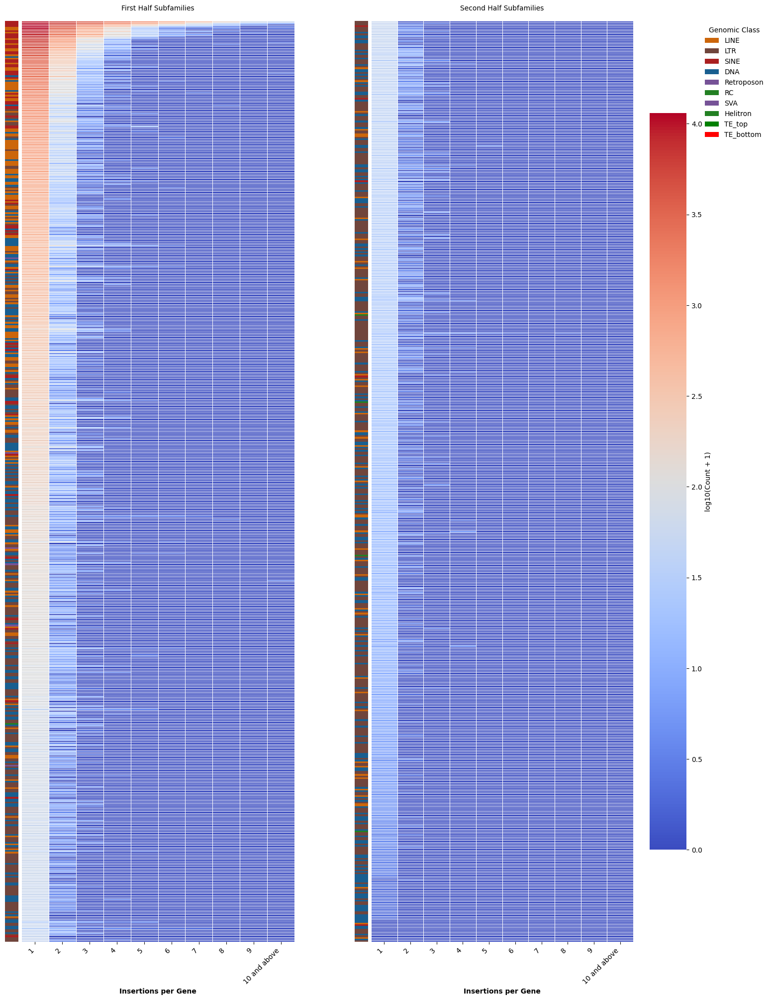

Success: Dual-column heatmap with identical scales (subfamily names hidden) saved to plots/TE_subfamily_insertion_heatmap.svg


In [26]:
# --- 2. Processing ---

# Identify columns 10 and above for consolidation
numeric_cols = [c for c in value_counts_df.columns if str(c).isdigit()]
high_count_cols = [c for c in numeric_cols if int(c) >= 10]

if high_count_cols:
    value_counts_df["10 and above"] = value_counts_df[high_count_cols].sum(axis=1)
    value_counts_df.drop(columns=high_count_cols, inplace=True)


# Sort columns numerically (0, 1, 2... 10 and above)
def sort_key(col):
    if col == "10 and above":
        return 10
    return int(col)


sorted_cols = sorted(value_counts_df.columns, key=sort_key)
value_counts_df = value_counts_df[sorted_cols]

# Apply log scaling: log10(count + 1)
# Exclude the '0' column for the heatmap display
log_data = (value_counts_df + 1).apply(np.log10)[value_counts_df.columns[1:]]

# Determine global scale for consistent coloring across both halves
vmin_global = log_data.min().min()
vmax_global = log_data.max().max()

# Split the data into two halves
n_subfamilies = len(log_data)
mid_point = (n_subfamilies + 1) // 2
part1_data = log_data.iloc[:mid_point]
part2_data = log_data.iloc[mid_point:]

# Map classes to the rows
class_mapping = value_counts_df.index.map(subfamilies_by_classes_dict)
class_mapping1 = class_mapping[:mid_point]
class_mapping2 = class_mapping[mid_point:]

# --- 3. Plotting ---

# Calculate height based on the longest column
fig_height = max(8, mid_point * 0.042)
fig = plt.figure(figsize=(18, fig_height))

# Create grid for two columns of [Row Color | Heatmap]
# gs logic: [Color1, Heat1, Spacer, Color2, Heat2]
from matplotlib.gridspec import GridSpec

gs = GridSpec(1, 5, width_ratios=[0.05, 1, 0.2, 0.05, 1.2], wspace=0.02)

unique_classes = list(class_names_p.keys()) + ["Missing"]
class_to_idx = {cls: i for i, cls in enumerate(unique_classes)}
anno_colors = [class_names_p[cls] for cls in class_names_p.keys()] + ["#FFFFFF"]
anno_cmap = mcolors.ListedColormap(anno_colors)


# Function to plot one half
def plot_half(data_subset, class_subset, gs_idx_color, gs_idx_heat, show_cbar=False):
    ax_colors = fig.add_subplot(gs[gs_idx_color])
    row_anno = np.array(
        [class_to_idx.get(cls, class_to_idx["Missing"]) for cls in class_subset]
    ).reshape(-1, 1)

    # MODIFIED: Removed subfamily name labels (yticklabels=False)
    sns.heatmap(
        row_anno,
        ax=ax_colors,
        cmap=anno_cmap,
        cbar=False,
        yticklabels=False,
        xticklabels=False,
        vmin=0,
        vmax=len(unique_classes) - 1,
    )

    ax_heat = fig.add_subplot(gs[gs_idx_heat])
    sns.heatmap(
        data_subset,
        ax=ax_heat,
        cmap="coolwarm",
        vmin=vmin_global,
        vmax=vmax_global,
        cbar=show_cbar,
        cbar_kws={"label": "log10(Count + 1)", "shrink": 0.8} if show_cbar else {},
        linewidths=0.5,
        linecolor="white",
        yticklabels=False,
    )
    ax_heat.set_xlabel("Insertions per Gene", fontsize=10, fontweight="bold")
    plt.setp(ax_heat.get_xticklabels(), rotation=45, ha="right", fontsize=10)
    return ax_heat


# Plot First Half
ax_heat1 = plot_half(part1_data, class_mapping1, 0, 1, show_cbar=False)
ax_heat1.set_title("First Half Subfamilies", fontsize=10, pad=15)

# Plot Second Half (with Cbar)
ax_heat2 = plot_half(part2_data, class_mapping2, 3, 4, show_cbar=True)
ax_heat2.set_title("Second Half Subfamilies", fontsize=10, pad=15)

# plt.suptitle("Distribution of TE Insertion Counts across Genes (Dual-Column Heatmap)", fontsize=16, y=0.98, fontweight='bold')

# --- 4. Legends ---

class_handles = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
# Place legend relative to the whole figure or the second heatmap
ax_heat2.legend(
    handles=class_handles,
    title="Genomic Class",
    loc="upper left",
    bbox_to_anchor=(1.25, 1.0),
    frameon=False,
)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])

# --- 5. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_subfamily_insertion_heatmap.svg"
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Dual-column heatmap with identical scales (subfamily names hidden) saved to {save_path}"
)

### Extraction of top genes and their GO analysis

In [7]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamilies_by_classes

,class_name,subfamily_name
subfamily_name,,
L1MC3,LINE,L1MC3
LTR60B,LTR,LTR60B
MER34C_v,LTR,MER34C_v
MSTA1,LTR,MSTA1
MER4A1,LTR,MER4A1
...,...,...
HERV1_I,LTR,HERV1_I
HERV1_LTRe,LTR,HERV1_LTRe
HERV1_LTRb,LTR,HERV1_LTRb


In [8]:
TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")
TEs_on_genes_subfamilies

,Unnamed: 0.1,Unnamed: 0,Gene_name,L1MC3_number,LTR60B_number,MER34C_v_number,MSTA1_number,MER4A1_number,MLT1I_number,L1M5_number,...,LTR46-int_number,Chompy-6_Croc_number,HERV30-int_number,Alu-VAR_rnd-5_family-1084_number,HERV-Fc1_LTR1_number,HERV1_I_number,HERV1_LTRe_number,HERV1_LTRb_number,HERV-Fc1-int_number,HERV-Fc1_LTR2_number
0,0,0,LOC127239154,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,1,1,LOC101928626,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,2,OR4F16,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,3,LOC127239154,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,4,4,LOC127239154,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38699,38699,38699,SPRY3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38700,38700,38700,VAMP7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38701,38701,38701,IL9R,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38702,38702,38702,WASIR1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
# gather top  5% genes by subfamilies and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_subfamilies["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_subfamilies["Gene_name"].unique()) // 20

subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):

    genes_by_TE_number = list(
        TEs_on_genes_subfamilies[
            TEs_on_genes_subfamilies[f"{subfamily_name}_number"] != 0
        ]
        .sort_values(f"{subfamily_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    elif len(genes_by_TE_number) > 0:
        genes_to_take = genes_by_TE_number
    else:
        continue

    sets_genes.append(set(genes_to_take))

    labels_genes.append(subfamily_name)

    # results_GO = run_goatools_enrichment(genes_to_take, background_list=background_list)
    # results_GO["subfamily_name"] = subfamily_name
    # results_GO["class_name"] = subfamily_to_class[subfamily_name]
    # significant_terms_dfs.append(results_GO)


# top_5_perc_genes_by_subfamilies = pd.concat(significant_terms_dfs, axis=0)
# top_5_perc_genes_by_subfamilies

100%|██████████| 1143/1143 [00:04<00:00, 247.32it/s]


In [ ]:
top_5_perc_genes_by_subfamilies.to_casv("top_5_perc_genes_by_subfamilies.csv")

In [19]:
1

1

#### python script

In [6]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]

In [43]:
len(existing_files)

230

In [42]:
existing_files = !ls ./GO_tables/
existing_files

['GO_terms_by_subfamilies_AluJb.csv',
 'GO_terms_by_subfamilies_AluJo.csv',
 'GO_terms_by_subfamilies_AluJr.csv',
 'GO_terms_by_subfamilies_AluJr4.csv',
 'GO_terms_by_subfamilies_AluSc.csv',
 'GO_terms_by_subfamilies_AluSc8.csv',
 'GO_terms_by_subfamilies_AluSg.csv',
 'GO_terms_by_subfamilies_AluSg4.csv',
 'GO_terms_by_subfamilies_AluSg7.csv',
 'GO_terms_by_subfamilies_AluSp.csv',
 'GO_terms_by_subfamilies_AluSq.csv',
 'GO_terms_by_subfamilies_AluSq2.csv',
 'GO_terms_by_subfamilies_AluSx.csv',
 'GO_terms_by_subfamilies_AluSx1.csv',
 'GO_terms_by_subfamilies_AluSx3.csv',
 'GO_terms_by_subfamilies_AluSx4.csv',
 'GO_terms_by_subfamilies_AluSz.csv',
 'GO_terms_by_subfamilies_AluSz6.csv',
 'GO_terms_by_subfamilies_AluY.csv',
 'GO_terms_by_subfamilies_AluYa8.csv',
 'GO_terms_by_subfamilies_AluYe5.csv',
 'GO_terms_by_subfamilies_AluYf1.csv',
 'GO_terms_by_subfamilies_AluYk2.csv',
 'GO_terms_by_subfamilies_Arthur1C.csv',
 'GO_terms_by_subfamilies_Charlie10.csv',
 'GO_terms_by_subfamilies_Charl

In [25]:
for subfamily in subfamilies_by_classes["subfamily_name"]:
    if f"GO_terms_by_subfamilies_{subfamily}.csv" in existing_files:

        print(subfamily, "yes")
    else:
        print(subfamily)

L1MC3
LTR60B
MER34C_v
MSTA1
MER4A1
MLT1I
L1M5
MLT1H2 yes
L1MA4 yes
AluY yes
MER4D1
MER4A
MIRb yes
MER31B yes
AluJb yes
AluSx3 yes
AluSx yes
MER112
Ricksha_0
MIR3 yes
MER46C
Charlie20a
AluSg yes
L1MD3
L1ME1
L1MD
AluYf1 yes
MER39B yes
AluSq2 yes
AluSx1 yes
MLT1K yes
LTR9B
MER5A
MER4E1
AluSx4 yes
L2c yes
L1ME4a
MIRc yes
MLT1E3 yes
Charlie4z yes
L2a yes
FRAM yes
MER5B
LTR37B
AluSq yes
MLT1O
MSTA yes
Alu
MER103C
LTR39
AluSz6 yes
L1PA4 yes
L5
L2 yes
LTR33
MIR yes
AluSc yes
MLT1H yes
L3 yes
MamRep605
AluSz yes
Tigger5
MSTB1 yes
L1MC5a
L1ME3B yes
L1M4 yes
HAL1M8
L1MA2
L1PA6 yes
L1PA5 yes
L1P4 yes
L1ME3D
L1PA8A
L1PA10 yes
L1MA8 yes
L1PA8 yes
LTR22C2
L1PA15-16 yes
L1PA11
L1MEd
L1M3 yes
L1MA7 yes
ERVL-E-int yes
L1PA7 yes
L1M7 yes
L1PA14
FLAM_C yes
L2b yes
MLT1H1
THE1B yes
LTR64
MLT1F2
LTR33B
MER65D yes
L1MA5
MLT1D yes
THE1D
AluYa5
AluYk2 yes
L1M2c yes
AluJo yes
L1ME4c
MER1A
LTR41
SVA_E
MER8
MER21C yes
AluJr yes
L1MB8 yes
AluSp yes
Tigger12
FLAM_A yes
AluSq10
LTR37A
L1ME4b yes
AluJr4 yes
MER11C
Ch

In [12]:
for subfamily in subfamilies_by_classes["subfamily_name"]:
    if f"GO_terms_by_subfamilies_{subfamily}.csv" in existing_files:

        print(subfamily, "yes")
    else:
        print(subfamily)

L1MC3
LTR60B
MER34C_v
MSTA1
MER4A1
MLT1I
L1M5
MLT1H2 yes
L1MA4 yes
AluY yes
MER4D1
MER4A
MIRb yes
MER31B yes
AluJb yes
AluSx3 yes
AluSx yes
MER112
Ricksha_0
MIR3 yes
MER46C
Charlie20a
AluSg yes
L1MD3
L1ME1
L1MD
AluYf1 yes
MER39B yes
AluSq2 yes
AluSx1 yes
MLT1K yes
LTR9B
MER5A
MER4E1
AluSx4 yes
L2c yes
L1ME4a
MIRc yes
MLT1E3 yes
Charlie4z yes
L2a yes
FRAM yes
MER5B
LTR37B
AluSq yes
MLT1O
MSTA yes
Alu
MER103C
LTR39
AluSz6 yes
L1PA4 yes
L5
L2 yes
LTR33
MIR yes
AluSc yes
MLT1H yes
L3 yes
MamRep605
AluSz yes
Tigger5
MSTB1 yes
L1MC5a
L1ME3B yes
L1M4 yes
HAL1M8
L1MA2
L1PA6 yes
L1PA5 yes
L1P4 yes
L1ME3D
L1PA8A
L1PA10 yes
L1MA8 yes
L1PA8 yes
LTR22C2
L1PA15-16 yes
L1PA11
L1MEd
L1M3 yes
L1MA7 yes
ERVL-E-int yes
L1PA7 yes
L1M7 yes
L1PA14
FLAM_C yes
L2b yes
MLT1H1
THE1B yes
LTR64
MLT1F2
LTR33B
MER65D yes
L1MA5
MLT1D yes
THE1D
AluYa5
AluYk2 yes
L1M2c yes
AluJo yes
L1ME4c
MER1A
LTR41
SVA_E
MER8
MER21C yes
AluJr yes
L1MB8 yes
AluSp yes
Tigger12
FLAM_A yes
AluSq10
LTR37A
L1ME4b yes
AluJr4 yes
MER11C
Ch

In [ ]:
import io
import itertools
import json
import os
import re
import time  # Added for performance comparison
import urllib.parse
import warnings
from collections import defaultdict

import matplotlib
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import requests
import seaborn as sns
from adjustText import adjust_text
from goatools.anno.gaf_reader import GafReader
from goatools.anno.genetogo_reader import Gene2GoReader
from goatools.go_enrichment import GOEnrichmentStudy
from goatools.obo_parser import GODag
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.path import Path
from matplotlib.ticker import LogLocator, NullFormatter, ScalarFormatter
from pyvis.network import Network
from scipy import stats
from scipy.stats import fisher_exact, kstest
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests
from supervenn import supervenn
from tqdm import tqdm

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams.update({"font.size": 10})


def run_goatools_enrichment(
    gene_list,
    background_list,
    obo_path="go-basic.obo",
    gaf_path="goa_human.gaf",
    fdr_threshold=0.1,
):
    # 1. Load the Ontology DAG
    print("Loading GO DAG...")
    godag = GODag(obo_path)

    # 2. Load Human Annotations and Map Symbols manually
    print("Loading Human Annotations and mapping symbols...")
    ogaf = GafReader(gaf_path)

    # Extract associations: Symbol -> Set of GO IDs
    full_assoc = {}
    for ntf in ogaf.associations:
        symbol = ntf.DB_Symbol
        if symbol not in full_assoc:
            full_assoc[symbol] = set()
        full_assoc[symbol].add(ntf.GO_ID)

    # 3. Initialize Enrichment Study
    print("Initializing Enrichment Study...")
    goeaobj = GOEnrichmentStudy(
        background_list,
        full_assoc,
        godag,
        propagate_counts=False,
        alpha=fdr_threshold,
        methods=["fdr_bh"],
    )

    # 4. Run Study
    print(f"Running Analysis on {len(gene_list)} genes...")
    results_all = goeaobj.run_study(gene_list)

    # Filter for significant results (FDR )
    results_sig = [r for r in results_all if r.p_fdr_bh < fdr_threshold]

    # Use the precomputed population total from the study object keys you provided
    pop_total = goeaobj.pop_n

    parsed_results = []
    for res in results_sig:
        # Use the precomputed counts from the record keys you provided
        pop_count = res.pop_count
        study_count = res.study_count

        fold_enrichment = (study_count / res.study_n) / (pop_count / res.pop_n)

        parsed_results.append(
            {
                "Term ID": res.GO,
                "Term Name": res.name,
                "Term Database": res.NS,
                "P-value": res.p_uncorrected,
                "FDR": res.p_fdr_bh,  # FDR correctly distinct from P-value
                "Fold Enrichment": fold_enrichment,
                "Overlap Count": study_count,
                "Total Term Genes (Human)": pop_count,
                # Use precomputed lists from the record keys you provided
                "Overlapping Genes": sorted(res.study_items),
                "Full Term Gene List": sorted(res.pop_items),
            }
        )

    df = pd.DataFrame(parsed_results)
    if not df.empty:
        # Sort by adjusted p-value as requested
        return df.sort_values("FDR")
    else:
        print("No significant terms passed the filters.")
        return pd.DataFrame()


TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")

# gather top  5% genes by subfamilies and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_subfamilies["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_subfamilies["Gene_name"].unique()) // 20

subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):
    print(
        f"""
    {subfamily_name}
    
    """
    )
    genes_by_TE_number = list(
        TEs_on_genes_subfamilies[
            TEs_on_genes_subfamilies[f"{subfamily_name}_number"] != 0
        ]
        .sort_values(f"{subfamily_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    elif len(genes_by_TE_number) > 0:
        genes_to_take = genes_by_TE_number
    else:
        continue

    sets_genes.append(set(genes_to_take))

    labels_genes.append(subfamily_name)

    results_GO = run_goatools_enrichment(genes_to_take, background_list=background_list)
    results_GO["subfamily_name"] = subfamily_name
    results_GO["class_name"] = subfamily_to_class[subfamily_name]
    if len(results_GO) > 0:
        results_GO.to_csv(f"GO_tables/GO_terms_by_subfamilies_{subfamily_name}.csv")
    significant_terms_dfs.append(results_GO)


top_5_perc_genes_by_subfamilies = pd.concat(significant_terms_dfs, axis=0)

top_5_perc_genes_by_subfamilies.to_csv("top_5_perc_genes_by_subfamilies.csv")

### Network visualization for gene sets

In [10]:
enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]
enrichment_df_subfamilies[["subfamily_name", "OR_Observed_to_Random", "Status"]]

/tmp/ipykernel_176/2286794938.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_subfamilies["Status"][
/tmp/ipykernel_176/2286794938.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

,subfamily_name,OR_Observed_to_Random,Status
subfamily_name,,,
L1MC3,L1MC3,0.664199,Significant
LTR60B,LTR60B,0.656729,Non-Significant
MER34C_v,MER34C_v,0.411405,Significant
MSTA1,MSTA1,0.273644,Significant
MER4A1,MER4A1,0.778783,Non-Significant
...,...,...,...
HERV1_I,HERV1_I,NaN,Non-Significant
HERV1_LTRe,HERV1_LTRe,0.000000,Non-Significant
HERV1_LTRb,HERV1_LTRb,NaN,Significant


50it [00:00, 23611.26it/s]


0.664198737440278 Significant
0.6567287553478796 Non-Significant
0.41140534218174424 Significant
0.2736444933795886 Significant
0.778783135198688 Non-Significant
0.5510313598004618 Significant
0.8587734168609743 Significant
0.5720175253217216 Significant
0.5525705520248291 Significant
1.2485951182098844 Significant
1.0667670080853602 Non-Significant
1.4172377167031955 Significant
1.3053651505620547 Significant
1.0211582704597575 Non-Significant
1.4860478171951117 Significant
1.5411969464702104 Significant
1.6543402132183385 Significant
1.5243741932005554 Significant
0.5618295640772235 Non-Significant
1.6329922523911204 Significant
1.2407136087224158 Significant
0.6165503427324487 Significant
1.6297882656471612 Significant
0.8421572505604273 Significant
0.6950640638066229 Significant
0.6672517280457373 Significant
1.5008022568965813 Significant
0.7635747714716502 Significant
1.4206496961912216 Significant
1.5811464397335513 Significant
0.700787580562135 Significant
0.8151175919235415 No

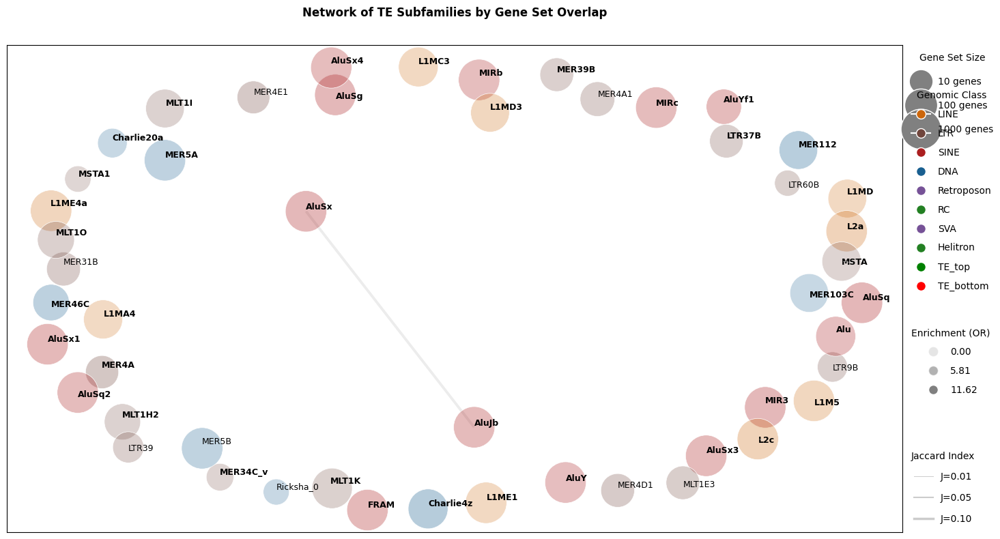

Success: TE subfamily network updated with transparency and significance labels. Saved to plots/TE_subfamilies_genes_network_with_enrichment.svg


In [24]:
# --- 3. Calculation Functions ---


number_to_show = len()


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


# --- 4. Graph Construction ---

G = nx.Graph()

# Calculate min/max for alpha normalization
min_or = enrichment_df_subfamilies["OR_Observed_to_Random"].min()
max_or = enrichment_df_subfamilies["OR_Observed_to_Random"].max()

# Add nodes with attributes
for i, (label, gene_set) in tqdm(enumerate(zip(labels_genes[:50], sets_genes[:50]))):
    cls = subfamily_to_class.get(label, "Other")
    base_color = class_names_p.get(cls, "#808080")

    # Transparency mapping
    or_val = (
        enrichment_df_subfamilies.loc[label, "OR_Observed_to_Random"]
        if label in enrichment_df_subfamilies.index
        else min_or
    )
    status = (
        enrichment_df_subfamilies.loc[label, "Status"]
        if label in enrichment_df_subfamilies.index
        else "Non-Significant"
    )
    print(or_val, status)
    # Normalize alpha between 0.2 and 1.0
    alpha = 0.2 + 0.8 * (or_val - min_or) / (max_or - min_or)
    # Convert hex to RGBA
    rgb = mcolors.to_rgb(base_color)
    rgba = (*rgb, alpha)

    size = len(gene_set)
    log_size = np.log10(size + 1) * 600

    G.add_node(
        label, size=log_size, color=rgba, class_name=cls, status=status, or_val=or_val
    )

# Parameters from user edits
JACCARD_THRESHOLD = 0.1
BASE_WIDTH = 0.5
WIDTH_MULTIPLIER = 20

for i in range(len(labels_genes[:50])):
    for j in range(i + 1, len(labels_genes[:50])):
        j_idx = jaccard_index(sets_genes[i], sets_genes[j])
        if j_idx > JACCARD_THRESHOLD:
            G.add_edge(labels_genes[i], labels_genes[j], weight=j_idx)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(18, 8))
pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)

node_colors = [G.nodes[n]["color"] for n in G.nodes]
node_sizes = [G.nodes[n]["size"] for n in G.nodes]
edge_widths = [BASE_WIDTH + (G.edges[e]["weight"] * WIDTH_MULTIPLIER) for e in G.edges]

# Draw Edges
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.15, edge_color="gray", ax=ax)

# Draw Nodes
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    edgecolors="white",
    linewidths=0.5,
    ax=ax,
)

# Draw Labels with adjust_text
texts = []
for node, (x, y) in pos.items():
    status = G.nodes[node]["status"]
    weight = "bold" if status == "Significant" else "normal"
    texts.append(ax.text(x, y, node, fontsize=9, fontweight=weight, color="black"))

adjust_text(
    texts,
    ax=ax,
    expand_points=(1.5, 1.5),
    arrowprops=dict(arrowstyle="-", color="lightgray", lw=0.5),
    force_points=0.2,
)

plt.title(
    "Network of TE Subfamilies by Gene Set Overlap", fontsize=12, pad=30, weight="bold"
)

# --- 6. Legends ---

# A) Node Size Legend (Log scale gene numbers)
legend_sizes = [10, 100, 1000]
legend_nodes = []
for size in legend_sizes:
    log_s = np.log10(size + 1) * 600
    legend_nodes.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{size} genes",
            markerfacecolor="gray",
            markersize=np.sqrt(log_s),
        )
    )

size_legend = ax.legend(
    handles=legend_nodes,
    title="Gene Set Size",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    labelspacing=1.5,
    title_fontsize=10,
)
ax.add_artist(size_legend)

# B) Edge Width Legend (Jaccard Index)
legend_jaccard = [0.01, 0.05, 0.1]
legend_edges = []
for j in legend_jaccard:
    lw = BASE_WIDTH + (j * WIDTH_MULTIPLIER)
    legend_edges.append(
        Line2D([0], [0], color="gray", lw=lw, alpha=0.4, label=f"J={j:.2f}")
    )

jaccard_legend = ax.legend(
    handles=legend_edges,
    title="Jaccard Index",
    loc="lower left",
    bbox_to_anchor=(1, 0),
    frameon=False,
    labelspacing=1.2,
    title_fontsize=10,
)
ax.add_artist(jaccard_legend)

# C) Class Color Legend
legend_classes = [
    Line2D(
        [0], [0], marker="o", color="w", label=cls, markerfacecolor=color, markersize=10
    )
    for cls, color in class_names_p.items()
]

class_legend = ax.legend(
    handles=legend_classes,
    title="Genomic Class",
    loc="center left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    labelspacing=1,
    title_fontsize=10,
)
ax.add_artist(class_legend)

# D) Transparency Legend (OR_Observed_to_Random)
legend_or_vals = [min_or, (min_or + max_or) / 2, max_or]
legend_or = []
for val in legend_or_vals:
    alpha = 0.2 + 0.8 * (val - min_or) / (max_or - min_or)
    legend_or.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{val:.2f}",
            markerfacecolor=(0.5, 0.5, 0.5, alpha),
            markersize=10,
        )
    )

or_legend = ax.legend(
    handles=legend_or,
    title="Enrichment (OR)",
    loc="center left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    labelspacing=1,
    title_fontsize=10,
)

# Final adjustment to ensure legends aren't clipped
plt.tight_layout(rect=[0, 0, 0.82, 1])

# --- 7. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_subfamilies_genes_network_with_enrichment.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: TE subfamily network updated with transparency and significance labels. Saved to {save_path}"
)

In [4]:
enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]
enrichment_df_subfamilies

/tmp/ipykernel_226/2667627079.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_subfamilies["Status"][
/tmp/ipykernel_226/2667627079.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,Total_TEs_number_log,Random_Odds_Ratio_Mean,Random_Odds_Ratio_SD,Random_Odds_Ratio_Quantile_Of_Observed,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,Enrichment_p_value_adjusted_log
subfamily_name,,,,,,,,,,,,,,,,,,,,,
L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,192.773111,...,3.806451,3.033173,0.143434,1.000,0.000,0.003992,0.010707,Significant,0.664199,-78.936052
LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,188.019900,...,2.303196,1.661283,0.519001,0.870,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.110316
MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,166.088095,...,2.623249,1.676311,0.344615,1.000,0.000,0.003992,0.010707,Significant,0.411405,-0.951805
MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,171.511952,...,2.700704,1.584688,0.306889,1.000,0.000,0.003992,0.010707,Significant,0.273644,-3.874878
MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,106.416760,...,3.249932,1.719991,0.175782,0.988,0.024,0.024000,0.052351,Non-Significant,0.778783,-3.399757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,168.166667,...,1.079181,NaN,NaN,0.292,0.584,0.584000,0.688157,Non-Significant,NaN,-0.891037
HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,143.500000,...,1.255273,1.747385,2.443703,0.826,0.348,0.348000,0.465766,Non-Significant,0.000000,-0.312007
HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,89.750000,...,0.903090,NaN,NaN,0.008,0.016,0.016000,0.037095,Significant,NaN,-4.507497


#### python script

Refactored Parameters Summary:
REPULSION_K_FACTOR: Controls how strongly nodes push away within a cluster.

JITTER_STRENGTH: Adds random noise to the coordinates to break up geometric patterns (like the "paved" pairs).

COMPONENT_SPACING: Defines the "white space" between distinct clusters.

ISOLATE_RADIUS_SCALE: Controls how far zero-connected nodes are moved into the periphery.

COLLISION_MIN_DIST: Acts as an overlapping penalty; increasing this forces nodes apart even further during the final physics relaxation.

LAYOUT_ITERATIONS: Controls the depth of the initial force simulation.

NODE_RADIUS_DIVISOR: Tunable constant to map area-based sizes into coordinate space units for collision detection.

GLOBAL_FONT_SIZE: Synchronized across every text element in the plot.

In [5]:
import os

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
from adjustText import adjust_text
from matplotlib.lines import Line2D
from tqdm import tqdm

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams.update({"font.size": 10})
GLOBAL_FONT_SIZE = 10


class_names_p = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
}

COLUMN_NAME = "Average_divergence_all"
TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")

# gather top  5% genes by subfamilies and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_subfamilies["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_subfamilies["Gene_name"].unique()) // 20

subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):

    genes_by_TE_number = list(
        TEs_on_genes_subfamilies[
            TEs_on_genes_subfamilies[f"{subfamily_name}_number"] != 0
        ]
        .sort_values(f"{subfamily_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    elif len(genes_by_TE_number) > 0:
        genes_to_take = genes_by_TE_number
    else:
        continue

    sets_genes.append(set(genes_to_take))

    labels_genes.append(subfamily_name)


enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]

# --- 1. Global Configurations (Tune these to build optimal structure) ---

# Text and Data limits
GLOBAL_FONT_SIZE = 10
SUBFAMILY_LIMIT = len(sets_genes)  # Process all subfamilies
JACCARD_THRESHOLD = 0.05

# Edge visual parameters
BASE_WIDTH = 0.3
WIDTH_MULTIPLIER = 15

# Layout Dynamics (Force-directed parameters)
REPULSION_K_FACTOR = 10.0  # Higher = stronger push between nodes in clusters
LAYOUT_ITERATIONS = 250  # More iterations = more stable cluster separation
COMPONENT_SPACING = 5.0  # Physical distance between unrelated clusters
ISOLATE_RADIUS_SCALE = 1.3  # Factor to push zero-connected nodes into the outer ring
JITTER_STRENGTH = 0.08  # Intensity of random randomness added to positions

# Collision & Overlap Management
COLLISION_MIN_DIST = 2.4  # Overlap penalty (multiplier for node radii sum)
COLLISION_ITERATIONS = 100  # Intensity of the physics relaxation step
NODE_RADIUS_DIVISOR = 350  # Controls the coordinate-space "size" of nodes

# --- 2. Calculation Functions ---


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


def prevent_collisions(pos, node_sizes, iterations, min_dist_factor, jitter):
    """
    Manually relaxes node positions to prevent 3+ nodes from overlapping
    and to ensure white space borders between clusters.
    """
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())

    # Map node size (area) to approximate radius in coordinate space
    radii = {
        n: np.sqrt(node_sizes[i]) / NODE_RADIUS_DIVISOR for i, n in enumerate(nodes)
    }

    for _ in range(iterations):
        # Apply slight jitter at the start of each relaxation step
        if jitter > 0:
            for n in nodes:
                new_pos[n] += np.random.normal(0, jitter * 0.1, 2)

        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)

                target_dist = (radii[n1] + radii[n2]) * min_dist_factor

                if dist < target_dist and dist > 0:
                    # Push nodes apart with force proportional to overlap
                    push = (target_dist - dist) / dist * 0.5 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
                elif dist == 0:
                    # Resolve identical positions with random nudge
                    new_pos[n1] += np.random.normal(0, 0.05, 2)
    return new_pos


# --- 3. Graph Construction ---

G = nx.Graph()

# Enrichment bounds calculation with epsilon for log-safety
eps = 1e-3
log_or_series = np.log10(enrichment_df_subfamilies["OR_Observed_to_Random"] + eps)
min_log_or = log_or_series.min()
max_log_or = log_or_series.max()

# Keep raw bounds for legend labels
min_or = enrichment_df_subfamilies["OR_Observed_to_Random"].min()
max_or = enrichment_df_subfamilies["OR_Observed_to_Random"].max()

subset_labels = labels_genes[:SUBFAMILY_LIMIT]
subset_sets = sets_genes[:SUBFAMILY_LIMIT]

print(f"Building graph for {len(subset_labels)} subfamilies...")

# Add nodes with attributes
for i, (label, gene_set) in enumerate(zip(subset_labels, subset_sets)):
    cls = subfamily_to_class.get(label, "Other")
    base_color = class_names_p.get(cls, "#808080")

    # Robust lookup for enrichment data
    if label in enrichment_df_subfamilies.index:
        target_row = enrichment_df_subfamilies.loc[label]
    elif (
        "subfamily_name" in enrichment_df_subfamilies.columns
        and (enrichment_df_subfamilies["subfamily_name"] == label).any()
    ):
        target_row = enrichment_df_subfamilies[
            enrichment_df_subfamilies["subfamily_name"] == label
        ].iloc[0]
    else:
        target_row = None

    if target_row is not None:
        or_val = target_row[COLUMN_NAME]
        status = target_row["Status"]
    else:
        or_val = min_or
        status = "Non-Significant"

    # Log-scaled alpha mapping
    current_log_or = np.log10(or_val + eps)
    if max_log_or != min_log_or:
        alpha = 0.15 + 0.85 * (current_log_or - min_log_or) / (max_log_or - min_log_or)
    else:
        alpha = 1.0
    alpha = np.clip(alpha, 0.15, 1.0)

    rgb = mcolors.to_rgb(base_color)
    rgba = (*rgb, alpha)

    size = len(gene_set)
    log_size = np.log10(size + 1) * 450

    G.add_node(
        label, size=log_size, color=rgba, class_name=cls, status=status, or_val=or_val
    )

# Edge calculation
for i in range(len(subset_labels)):
    for j in range(i + 1, len(subset_labels)):
        j_idx = jaccard_index(subset_sets[i], subset_sets[j])
        if j_idx > JACCARD_THRESHOLD:
            G.add_edge(subset_labels[i], subset_labels[j], weight=j_idx)

# --- 4. Refactored Connectivity-based Layout ---

print("Calculating Cluster and Connectivity-aware Layout...")

# Find connected components to isolate clusters
components = list(nx.connected_components(G))
components.sort(key=len, reverse=True)

pos = {}
num_cols = int(np.ceil(np.sqrt(len(components))))

# Separate isolates from connected clusters
isolates = [list(c)[0] for c in components if len(c) == 1]
connected_clusters = [c for c in components if len(c) > 1]

# Layout connected clusters
for i, component in enumerate(connected_clusters):
    # Cluster center based on spacing parameter
    center_x = (i % num_cols) * COMPONENT_SPACING
    center_y = (i // num_cols) * COMPONENT_SPACING

    S = G.subgraph(component)
    # k parameter is multiplied by the REPULSION_K_FACTOR to push nodes apart
    local_pos = nx.spring_layout(
        S,
        k=REPULSION_K_FACTOR / np.sqrt(len(component)),
        iterations=LAYOUT_ITERATIONS,
        weight="weight",
        seed=42,
    )

    # Translate and apply jitter
    for node, p in local_pos.items():
        rand_nudge = np.random.normal(0, JITTER_STRENGTH, 2)
        pos[node] = p + np.array([center_x, center_y]) + rand_nudge

# Layout isolates on a large periphery ring
if isolates:
    grid_extent = COMPONENT_SPACING * num_cols
    periphery_radius = grid_extent * ISOLATE_RADIUS_SCALE
    center_offset = (grid_extent / 2, grid_extent / 2)

    # Randomly shuffle angles to prevent "ordered" look
    iso_angles = np.linspace(0, 2 * np.pi, len(isolates), endpoint=False)
    np.random.shuffle(iso_angles)

    for node, angle in zip(isolates, iso_angles):
        # Vary the radius slightly for each isolate to introduce depth/jitter
        var_radius = periphery_radius * (1 + np.random.normal(0, JITTER_STRENGTH))
        pos[node] = center_offset + np.array(
            [var_radius * np.cos(angle), var_radius * np.sin(angle)]
        )

# Safely extract attributes for plotting
node_colors = [G.nodes[n]["color"] for n in G.nodes]
node_sizes = [G.nodes[n]["size"] for n in G.nodes]

print("Applying physics relaxation to enforce white space and resolve overlaps...")
pos = prevent_collisions(
    pos,
    node_sizes,
    iterations=COLLISION_ITERATIONS,
    min_dist_factor=COLLISION_MIN_DIST,
    jitter=JITTER_STRENGTH,
)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(28, 28))

# Draw Edges
edges = G.edges(data=True)
edge_widths = [BASE_WIDTH + (d["weight"] * WIDTH_MULTIPLIER) for u, v, d in edges]
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.15, edge_color="gray", ax=ax)

# Draw Nodes
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    edgecolors="white",
    linewidths=0.4,
    ax=ax,
)

# Draw Labels (Significant only)
texts = []
for node, (x, y) in pos.items():
    status = G.nodes[node]["status"]
    if status == "Significant":
        texts.append(
            ax.text(
                x, y, node, fontsize=GLOBAL_FONT_SIZE, fontweight="bold", color="black"
            )
        )

print("Adjusting label positions...")
adjust_text(
    texts,
    ax=ax,
    expand_points=(2.0, 2.0),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.4, alpha=0.6),
    force_points=0.1,
)

plt.title(
    f"Tunable Cluster Map of TE Subfamilies\n(Connectivity hubs central, Jaccard > {JACCARD_THRESHOLD}, N={len(G.nodes)})",
    fontsize=GLOBAL_FONT_SIZE + 4,
    pad=40,
    weight="bold",
)

# --- 6. Legends ---

# A) Node Size Legend
legend_sizes = [10, 100, 1000]
legend_nodes = []
for size in legend_sizes:
    log_s = np.log10(size + 1) * 450
    legend_nodes.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{size} genes",
            markerfacecolor="gray",
            markersize=np.sqrt(log_s),
        )
    )

size_legend = ax.legend(
    handles=legend_nodes,
    title="Gene Set Size",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    labelspacing=1.5,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(size_legend)

# B) Edge Width Legend
legend_jaccard_vals = [0.05, 0.1, 0.2]
legend_edges = []
for j in legend_jaccard_vals:
    lw = BASE_WIDTH + (j * WIDTH_MULTIPLIER)
    legend_edges.append(
        Line2D([0], [0], color="gray", lw=lw, alpha=0.4, label=f"J={j:.2f}")
    )

jaccard_legend = ax.legend(
    handles=legend_edges,
    title="Jaccard Index",
    loc="lower left",
    bbox_to_anchor=(1, 0),
    frameon=False,
    labelspacing=1.5,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(jaccard_legend)

# C) Class Color Legend
legend_classes = [
    Line2D(
        [0], [0], marker="o", color="w", label=cls, markerfacecolor=color, markersize=12
    )
    for cls, color in class_names_p.items()
]

class_legend = ax.legend(
    handles=legend_classes,
    title="Genomic Class",
    loc="center left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    labelspacing=1.2,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(class_legend)

# D) Transparency Legend (Log-scaled)
legend_or_vals = [min_or, (min_or + max_or) / 4, (min_or + max_or) / 2, max_or]
legend_or = []
for val in legend_or_vals:
    current_log = np.log10(val + eps)
    if max_log_or != min_log_or:
        l_alpha = 0.15 + 0.85 * (current_log - min_log_or) / (max_log_or - min_log_or)
    else:
        l_alpha = 1.0
    l_alpha = np.clip(l_alpha, 0.15, 1.0)
    legend_or.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{val:.2f}",
            markerfacecolor=(0.5, 0.5, 0.5, l_alpha),
            markersize=12,
        )
    )

or_legend = ax.legend(
    handles=legend_or,
    title="Enrichment (OR)",
    loc="center left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    labelspacing=1.2,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)

plt.tight_layout(rect=[0, 0, 0.85, 1])
ax.axis("off")

# --- 7. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_subfamilies_clustered_connectivity_network.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Refactored network with global tuning parameters saved to {save_path}."
)

  5%|▌         | 60/1143 [00:01<00:27, 39.13it/s]

KeyboardInterrupt



In [11]:
]

1

In [ ]:
top_5_perc_genes_by_subfamilies.to_casv("top_5_perc_genes_by_subfamilies.csv")

### Build graph for genes overlapping and test it for clustering, for presence of clusters

#### python script

In [ ]:
import os

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
from adjustText import adjust_text
from matplotlib.lines import Line2D
from scipy.sparse import issparse
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# Set font type for clean SVG export
plt.rcParams["svg.fonttype"] = "none"

# --- 1. Global Configurations (Tune these to build optimal structure) ---

# Text and Data limits
GLOBAL_FONT_SIZE = 10
SUBFAMILY_LIMIT = 1143  # Limited for performance during clustering & layout
JACCARD_THRESHOLD = 0.0001

# MCL Clustering Parameters
# Inflation controls cluster granularity. Higher = more/smaller clusters.
MCL_INFLATION = 1.12
MCL_MAX_ITER = 100
MCL_BENCHMARK_RANGE = np.linspace(1, 1.5, 25)  # For the performance plot

# Layout Dynamics (Force-directed parameters)
REPULSION_K_FACTOR = 10.0  # 300  # Higher = stronger push between nodes in clusters
LAYOUT_ITERATIONS = 500  # More iterations = more stable cluster separation
CLUSTER_SPACING = 20.0  # Physical distance between unrelated clusters
ISOLATE_RADIUS_SCALE = 1.5  # Factor to push zero-connected nodes into the outer ring
JITTER_STRENGTH = 0.15  # Intensity of random randomness added to positions

# Collision & Overlap Management
COLLISION_MIN_DIST = 110  # Overlap penalty (multiplier for node radii sum)
COLLISION_ITERATIONS = 300  # Intensity of the physics relaxation step
NODE_RADIUS_DIVISOR = 450  # Controls the coordinate-space "size" of nodes

BASE_WIDTH = 0.3
WIDTH_MULTIPLIER = 15


class_names_p = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
}

COLUMN_NAME = "Average_divergence_all"
TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")

# gather top  5% genes by subfamilies and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_subfamilies["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_subfamilies["Gene_name"].unique()) // 20

subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):

    genes_by_TE_number = list(
        TEs_on_genes_subfamilies[
            TEs_on_genes_subfamilies[f"{subfamily_name}_number"] != 0
        ]
        .sort_values(f"{subfamily_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    elif len(genes_by_TE_number) > 0:
        genes_to_take = genes_by_TE_number
    else:
        continue

    sets_genes.append(set(genes_to_take))

    labels_genes.append(subfamily_name)


enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]

# --- 2. Clustering & Calculation Functions ---


def run_mcl(matrix, inflation=2.0, max_iter=100):
    """NumPy-based Markov Clustering (MCL) implementation."""
    A = matrix + np.eye(matrix.shape[0])
    M = A / A.sum(axis=0)

    for i in range(max_iter):
        M_prev = M.copy()
        M = np.linalg.matrix_power(M, 2)
        M = np.power(M, inflation)
        M = M / M.sum(axis=0)
        if np.allclose(M, M_prev, atol=1e-5):
            break

    clusters = {}
    cluster_id = 0
    visited = set()
    for col in range(M.shape[1]):
        if col in visited:
            continue
        attractor = np.argmax(M[:, col])
        indices = np.where(np.isclose(M[attractor, :], M[attractor, col], atol=1e-3))[0]
        for idx in indices:
            clusters[idx] = cluster_id
            visited.add(idx)
        cluster_id += 1
    return clusters


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


def prevent_collisions(pos, node_sizes, iterations, min_dist_factor, jitter):
    """Relaxes node positions to prevent overlaps in coordinate space."""
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())
    radii = {
        n: np.sqrt(node_sizes[i]) / NODE_RADIUS_DIVISOR for i, n in enumerate(nodes)
    }

    for _ in range(iterations):
        if jitter > 0:
            for n in nodes:
                new_pos[n] += np.random.normal(0, jitter * 0.04, 2)
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)
                target_dist = (radii[n1] + radii[n2]) * min_dist_factor
                if dist < target_dist and dist > 0:
                    push = (target_dist - dist) / dist * 0.5 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
    return new_pos


# --- 3. Graph Construction ---

G = nx.Graph()
subset_labels = labels_genes[:SUBFAMILY_LIMIT]
subset_sets = sets_genes[:SUBFAMILY_LIMIT]

adj_matrix = np.zeros((len(subset_labels), len(subset_labels)))
for i in range(len(subset_labels)):
    for j in range(i + 1, len(subset_labels)):
        j_idx = jaccard_index(subset_sets[i], subset_sets[j])
        if j_idx > JACCARD_THRESHOLD:
            G.add_edge(subset_labels[i], subset_labels[j], weight=j_idx)
            adj_matrix[i, j] = j_idx
            adj_matrix[j, i] = j_idx

for i, (label, gene_set) in enumerate(zip(subset_labels, subset_sets)):
    size = len(gene_set)
    log_size = np.log10(size + 1) * 450
    if label not in G:
        G.add_node(label)
    G.nodes[label]["size"] = log_size

# --- 4. MCL Performance Benchmarking ---

print("Benchmarking MCL cluster performance...")
perf_stats = []
distance_matrix = 1.0 - adj_matrix

for infl in tqdm(MCL_BENCHMARK_RANGE, desc="Testing Inflation Values"):
    labels_dict = run_mcl(adj_matrix, inflation=infl, max_iter=MCL_MAX_ITER)
    labels_list = [labels_dict[i] for i in range(len(subset_labels))]
    unique_ids = set(labels_list)
    n_clusters = len(unique_ids)

    # Calculate unsupervised metrics
    try:
        sil = (
            silhouette_score(distance_matrix, labels_list, metric="precomputed")
            if n_clusters > 1
            else 0
        )
    except:
        sil = 0

    comms = [
        set([subset_labels[idx] for idx, cid in labels_dict.items() if cid == target])
        for target in unique_ids
    ]
    mod = nx.community.modularity(G, comms) if n_clusters > 1 else 0

    # Added Coverage: Fraction of edges that are internal to clusters
    coverage, _ = nx.community.partition_quality(G, comms)

    perf_stats.append(
        {
            "inflation": infl,
            "clusters": n_clusters,
            "silhouette": sil,
            "modularity": mod,
            "coverage": coverage,
        }
    )

perf_df = pd.DataFrame(perf_stats)

# --- 5. Final MCL & Cluster-Aware Layout ---

print(f"Applying final MCL with inflation {MCL_INFLATION}...")
final_labels_dict = run_mcl(adj_matrix, inflation=MCL_INFLATION)
for idx, c_id in final_labels_dict.items():
    G.nodes[subset_labels[idx]]["cluster"] = c_id

# Group by Cluster ID
cluster_groups = {}
for idx, c_id in final_labels_dict.items():
    if c_id not in cluster_groups:
        cluster_groups[c_id] = []
    cluster_groups[c_id].append(subset_labels[idx])

# Cluster Color Setup
cmap = plt.get_cmap("tab20")
cluster_colors = {c: cmap(i % 20) for i, c in enumerate(cluster_groups.keys())}

# Calculate Layout: Cluster-by-Cluster
print("Calculating Cluster-Aware Layout...")
pos = {}
num_clusters = len(cluster_groups)
grid_cols = int(np.ceil(np.sqrt(num_clusters)))

# Sort clusters by size (largest first)
sorted_clusters = sorted(cluster_groups.items(), key=lambda x: len(x[1]), reverse=True)

for i, (c_id, node_list) in enumerate(sorted_clusters):
    # Cluster center on a global grid
    center_x = (i % grid_cols) * CLUSTER_SPACING
    center_y = (i // grid_cols) * CLUSTER_SPACING

    # Isolate clusters that are single nodes (isolates)
    if len(node_list) == 1:
        continue  # Handled later in periphery ring

    S = G.subgraph(node_list)
    # Strong local layout for the cluster
    local_pos = nx.spring_layout(
        S,
        k=REPULSION_K_FACTOR / np.sqrt(len(node_list)),
        iterations=LAYOUT_ITERATIONS,
        weight="weight",
        seed=42,
    )

    for node, p in local_pos.items():
        pos[node] = (
            p + np.array([center_x, center_y]) + np.random.normal(0, JITTER_STRENGTH, 2)
        )

# Periphery layout for single-node clusters
isolates = [nodes[0] for c_id, nodes in cluster_groups.items() if len(nodes) == 1]
if isolates:
    extent = CLUSTER_SPACING * grid_cols
    radius = extent * ISOLATE_RADIUS_SCALE
    center = (extent / 2, extent / 2)
    angles = np.linspace(0, 2 * np.pi, len(isolates), endpoint=False)
    for node, angle in zip(isolates, angles):
        pos[node] = (
            center
            + np.array([radius * np.cos(angle), radius * np.sin(angle)])
            + np.random.normal(0, JITTER_STRENGTH, 2)
        )

node_sizes = [G.nodes[n]["size"] for n in subset_labels]
pos = prevent_collisions(
    pos, node_sizes, COLLISION_ITERATIONS, COLLISION_MIN_DIST, JITTER_STRENGTH
)

# --- 6. Visualization ---

# Panel 1: Multi-Metric Performance Plot
fig_p, ax_p = plt.subplots(figsize=(10, 6))
ax_p.plot(
    perf_df["inflation"],
    perf_df["silhouette"],
    label="Silhouette (Separation)",
    marker="o",
    lw=2,
)
ax_p.plot(
    perf_df["inflation"],
    perf_df["modularity"],
    label="Modularity (Topology)",
    marker="s",
    lw=2,
)
ax_p.plot(
    perf_df["inflation"],
    perf_df["coverage"],
    label="Coverage (Edge Density)",
    marker="^",
    lw=2,
)

# Fix non-overlapping cluster bars
ax_p2 = ax_p.twinx()
bar_width = (MCL_BENCHMARK_RANGE[1] - MCL_BENCHMARK_RANGE[0]) * 0.4
ax_p2.bar(
    perf_df["inflation"],
    perf_df["clusters"],
    alpha=0.15,
    color="gray",
    width=bar_width,
    label="Cluster Count",
)

ax_p.set_xlabel("MCL Inflation Parameter", fontsize=GLOBAL_FONT_SIZE)
ax_p.set_ylabel("Performance Score", fontsize=GLOBAL_FONT_SIZE)
ax_p2.set_ylabel("Number of Clusters", fontsize=GLOBAL_FONT_SIZE)
ax_p.set_title(
    "Hierarchical MCL Performance Benchmarking",
    fontsize=GLOBAL_FONT_SIZE + 2,
    fontweight="bold",
)
ax_p.legend(loc="upper left", frameon=False)
ax_p2.legend(loc="upper right", frameon=False)
plt.tight_layout()
plt.savefig("plots/MCL_Hierarchical_Metrics.svg", format="svg")

# Panel 2: The Network Map
fig, ax = plt.subplots(figsize=(26, 26))
edges = G.edges(data=True)
edge_widths = [BASE_WIDTH + (d["weight"] * WIDTH_MULTIPLIER) for u, v, d in edges]
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.1, edge_color="gray", ax=ax)

# Node Colors
node_colors = [cluster_colors[G.nodes[n]["cluster"]] for n in subset_labels]
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    edgecolors="white",
    linewidths=0.5,
    ax=ax,
)

# Labels (Significant or High Degree)
texts = []
for node, (x, y) in pos.items():
    if G.degree(node) >= 2:
        texts.append(
            ax.text(
                x, y, node, fontsize=GLOBAL_FONT_SIZE, fontweight="bold", color="black"
            )
        )

print("Polishing label layout...")
adjust_text(
    texts,
    ax=ax,
    expand_points=(1.8, 1.8),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.4, alpha=0.5),
    force_points=0.1,
)

plt.title(
    f"Markov Clustered TE Subfamily Map (Inflation={MCL_INFLATION}, N={num_clusters} Clusters)",
    fontsize=GLOBAL_FONT_SIZE + 8,
    pad=45,
    weight="bold",
)

# Legend: TOP 20 CLUSTERS
top_20 = sorted(
    cluster_groups.keys(), key=lambda x: len(cluster_groups[x]), reverse=True
)[:20]
legend_els = [
    Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f"Cluster {c} (n={len(cluster_groups[c])})",
        markerfacecolor=cluster_colors[c],
        markersize=12,
    )
    for c in top_20
]
ax.legend(
    handles=legend_els,
    title="Top 20 MCL Clusters",
    loc="upper left",
    bbox_to_anchor=(1.02, 1),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE + 2,
    fontsize=GLOBAL_FONT_SIZE,
)

ax.axis("off")
plt.tight_layout(rect=[0, 0, 0.85, 1])

# --- 7. Saving ---
os.makedirs("plots", exist_ok=True)
save_path_net = "plots/TE_subfamilies_MCL_clustered_map.svg"
plt.savefig(save_path_net, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(f"Success: Cluster-aware network saved to {save_path_net}")
print(f"Success: Benchmark plot saved to plots/MCL_Hierarchical_Metrics.svg")

### Connection of genes overlapping with other gene sets versus other subfamily properties

could be high correlation with divergence - older subfamilies have higher connections by genes

In [5]:
TEs_on_genes_subfamilies = pd.read_csv("TEs_on_genes_counts_subfamilies.csv")

# gather top  5% genes by subfamilies and analyze them on GO
sets_genes = []
labels_genes = []

background_list = list(TEs_on_genes_subfamilies["Gene_name"].unique())

significant_terms_dfs = []

genes_to_take_number = len(TEs_on_genes_subfamilies["Gene_name"].unique()) // 20

subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

for subfamily_name in tqdm(subfamilies_by_classes["subfamily_name"]):

    genes_by_TE_number = list(
        TEs_on_genes_subfamilies[
            TEs_on_genes_subfamilies[f"{subfamily_name}_number"] != 0
        ]
        .sort_values(f"{subfamily_name}_number", ascending=False)[["Gene_name"]]
        .drop_duplicates()["Gene_name"]
    )
    if len(genes_by_TE_number) >= genes_to_take_number:
        genes_to_take = genes_by_TE_number[:genes_to_take_number]
    elif len(genes_by_TE_number) > 0:
        genes_to_take = genes_by_TE_number
    else:
        continue

    sets_genes.append(set(genes_to_take))

    labels_genes.append(subfamily_name)


enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]


def jaccard_index(set1, set2):
    """Calculates the Jaccard similarity index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union > 0 else 0


# --- 3. Graph Construction ---

G = nx.Graph()


# Add nodes with attributes
for i, (label, gene_set) in enumerate(zip(labels_genes, sets_genes)):

    G.add_node(label)

# Edge calculation
for i in range(len(labels_genes)):
    for j in range(i + 1, len(labels_genes)):
        j_idx = jaccard_index(sets_genes[i], sets_genes[j])
        if j_idx > 0:
            G.add_edge(labels_genes[i], labels_genes[j], weight=j_idx)


# Calculate the sum of weights for each node (Strength)
node_strengths = dict(G.degree(weight="weight"))

# Calculate the average weight per edge for each node
node_avg_weights = {
    n: (node_strengths[n] / G.degree(n)) if G.degree(n) > 0 else 0 for n in G.nodes()
}
node_total_weights = {n: node_strengths[n] if G.degree(n) > 0 else 0 for n in G.nodes()}
node_degrees = {n: G.degree(n) for n in G.nodes()}
gene_number = {
    labels_genes[i]: len(list(sets_genes[i])) for i in range(0, len(labels_genes))
}
enrichment_df_subfamilies["avg_weight"] = pd.Series(node_avg_weights)
enrichment_df_subfamilies["total_weight"] = pd.Series(node_total_weights)
enrichment_df_subfamilies["node_degree"] = pd.Series(node_degrees)
enrichment_df_subfamilies["gene_number"] = pd.Series(gene_number)
enrichment_df_subfamilies

100%|██████████| 1143/1143 [00:44<00:00, 25.94it/s]
/tmp/ipykernel_145/2668966103.py:47: ChainedAssignmentError: A value is being set on a copy of a DataFrame or Series through chained assignment.
Such chained assignment never works to update the original DataFrame or Series, because the intermediate object on which we are setting values always behaves as a copy (due to Copy-on-Write).

Try using '.loc[row_indexer, col_indexer] = value' instead, to perform the assignment in a single step.

See the documentation for a more detailed explanation: https://pandas.pydata.org/pandas-docs/stable/user_guide/copy_on_write.html#chained-assignment
  enrichment_df_subfamilies["Status"][
/home/jovyan/venvs/Retroelements_3_11/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,Enrichment_p_value_adjusted_log,avg_weight,total_weight,node_degree,gene_number
subfamily_name,,,,,,,,,,,,,,,,,,,,,
L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,192.773111,...,0.000,0.003992,0.010707,Non-Significant,0.664199,-78.936052,0.006744,5.179259,768.0,817.0
LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,188.019900,...,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.110316,0.008842,1.008042,114.0,17.0
MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,166.088095,...,0.000,0.003992,0.010707,Non-Significant,0.411405,-0.951805,0.007379,1.320882,179.0,24.0
MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,171.511952,...,0.000,0.003992,0.010707,Non-Significant,0.273644,-3.874878,0.004529,0.362287,80.0,18.0
MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,106.416760,...,0.024,0.024000,0.052351,Non-Significant,0.778783,-3.399757,0.006375,2.951797,463.0,167.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,168.166667,...,0.584,0.584000,0.688157,Non-Significant,NaN,-0.891037,0.002804,0.028037,10.0,1.0
HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,143.500000,...,0.348,0.348000,0.465766,Non-Significant,0.000000,-0.312007,NaN,NaN,NaN,NaN
HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,89.750000,...,0.016,0.016000,0.037095,Non-Significant,NaN,-4.507497,0.005921,0.106572,18.0,5.0


In [6]:
# enrichment_df_subfamilies.to_csv('enrichment_subfamilies_with_random_and_gene_sets_stats.csv')

In [6]:
enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random_and_gene_sets_stats.csv"
)
enrichment_df_subfamilies

,subfamily_name,subfamily_name.2,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,Enrichment_p_value_adjusted_log,avg_weight,total_weight,node_degree,gene_number
0,L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,...,0.000,0.003992,0.010707,Significant,0.664199,-78.936052,0.006744,5.179259,768.0,817.0
1,LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,...,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.110316,0.008842,1.008042,114.0,17.0
2,MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,...,0.000,0.003992,0.010707,Significant,0.411405,-0.951805,0.007379,1.320882,179.0,24.0
3,MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,...,0.000,0.003992,0.010707,Significant,0.273644,-3.874878,0.004529,0.362287,80.0,18.0
4,MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,...,0.024,0.024000,0.052351,Non-Significant,0.778783,-3.399757,0.006375,2.951797,463.0,167.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,...,0.584,0.584000,0.688157,Non-Significant,NaN,-0.891037,0.002804,0.028037,10.0,1.0
1139,HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,...,0.348,0.348000,0.465766,Non-Significant,0.000000,-0.312007,NaN,NaN,NaN,NaN
1140,HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,...,0.016,0.016000,0.037095,Significant,NaN,-4.507497,0.005921,0.106572,18.0,5.0
1141,HERV-Fc1-int,HERV-Fc1-int,HERV-Fc1-int,LTR,2,3,20.901503,2.154778e-02,3.991753e-02,30.500000,...,0.052,0.052000,0.101949,Non-Significant,NaN,-1.398836,0.005609,0.067309,12.0,2.0


In [38]:
enrichment_df_subfamilies[enrichment_df_subfamilies['node_degree'] == 871].T

subfamily_name,L1M5
subfamily_name,L1M5
subfamily_name.1,L1M5
class_name,LINE
Observed_TEs_number,5750
Total_TEs_number,32019
Observed_Odds_Ratio,2.287584
Enrichment_p_value,0.0
Enrichment_p_value_adjusted,0.0
Average_divergence_genes,246.741217
Average_divergence_all,251.208126


In [8]:
enrichment_df_subfamilies[['avg_weight', 'class_name']].groupby('class_name').median()

,avg_weight
class_name,
DNA,0.005799
LINE,0.006425
LTR,0.006503
RC,0.007310
Retroposon,0.005716
SINE,0.006338


In [39]:
enrichment_df_subfamilies.sort_values('Total_TEs_number')

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,Enrichment_p_value_adjusted_log,avg_weight,total_weight,node_degree,gene_number
subfamily_name,,,,,,,,,,,,,,,,,,,,,
HERV-Fc1_LTR2,HERV-Fc1_LTR2,HERV-Fc1_LTR2,LTR,0,2,0.000000,1.000000,1.000000,NaN,125.500000,...,0.408,0.408000,0.529936,Non-Significant,NaN,0.000000,NaN,NaN,NaN,NaN
Chompy-6_Croc,Chompy-6_Croc,Chompy-6_Croc,DNA,0,2,0.000000,1.000000,1.000000,NaN,279.000000,...,0.328,0.328000,0.443673,Non-Significant,NaN,0.000000,NaN,NaN,NaN,NaN
HERV-Fc1-int,HERV-Fc1-int,HERV-Fc1-int,LTR,2,3,20.901503,0.021548,0.039918,30.500000,25.333333,...,0.052,0.052000,0.101949,Non-Significant,NaN,-1.398836,0.005609,0.067309,12.0,2.0
HERV-Fc2_LTR,HERV-Fc2_LTR,HERV-Fc2_LTR,LTR,1,3,5.225376,0.239778,0.319052,217.000000,177.666667,...,0.236,0.236000,0.343191,Non-Significant,NaN,-0.496138,0.002457,0.002457,1.0,1.0
HERV-Fc1_LTR3,HERV-Fc1_LTR3,HERV-Fc1_LTR3,LTR,0,4,0.000000,1.000000,1.000000,NaN,49.750000,...,0.676,0.676000,0.764261,Non-Significant,NaN,0.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AluY,AluY,AluY,SINE,17358,111981,1.917184,0.000000,0.000000,71.249510,81.135103,...,0.000,0.003992,0.010707,Non-Significant,1.248595,-inf,0.006922,5.759255,832.0,1436.0
MIR,MIR,MIR,SINE,24296,153574,1.964159,0.000000,0.000000,266.509960,273.539115,...,0.000,0.003992,0.010707,Non-Significant,1.280071,-inf,0.007155,5.630873,787.0,1436.0
MIRb,MIRb,MIRb,SINE,33131,206087,2.002041,0.000000,0.000000,282.243820,289.915744,...,0.000,0.003992,0.010707,Non-Significant,1.305365,-inf,0.007196,5.548294,771.0,1436.0


In [41]:
enrichment_df_subfamilies[(enrichment_df_subfamilies.Total_TEs_number < 1000) & (enrichment_df_subfamilies.Total_TEs_number > 500)].avg_weight.mean()



np.float64(0.0058853229794209065)

In [42]:
enrichment_df_subfamilies[(enrichment_df_subfamilies.Total_TEs_number > 100000) & (enrichment_df_subfamilies.Total_TEs_number > 500)].avg_weight.mean()


np.float64(0.007074735374647285)

In [35]:
enrichment_df_subfamilies[enrichment_df_subfamilies.gene_number != 1436]['Total_TEs_number'].max()

np.int64(18847)

In [34]:
enrichment_df_subfamilies[enrichment_df_subfamilies.gene_number == 1436]['Total_TEs_number'].min()

np.int64(8807)

In [8]:
enrichment_df_subfamilies.columns

Index(['subfamily_name', 'subfamily_name.2', 'subfamily_name.1', 'class_name',
       'Observed_TEs_number', 'Total_TEs_number', 'Observed_Odds_Ratio',
       'Enrichment_p_value', 'Enrichment_p_value_adjusted',
       'Average_divergence_genes', 'Average_divergence_all',
       'Observed_TEs_number_log', 'Total_TEs_number_log',
       'Random_Odds_Ratio_Mean', 'Random_Odds_Ratio_SD',
       'Random_Odds_Ratio_Quantile_Of_Observed', 'p_raw_empirical',
       'p_raw_empirical_clamped', 'p_adjusted_empirical_bh', 'Status',
       'OR_Observed_to_Random', 'Enrichment_p_value_adjusted_log',
       'avg_weight', 'total_weight', 'node_degree', 'gene_number'],
      dtype='object')

0.0011789446668744093 0.9684504487476632
Plot saved to ./plots/total_weight_vs_Average_divergence_all_subfamilies.svg


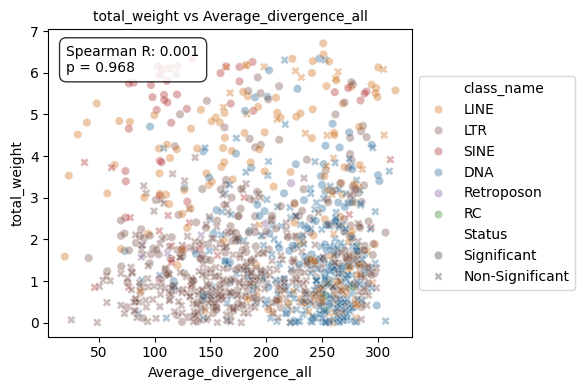

In [25]:
column1 = "Average_divergence_all"
column2 = "total_weight"

fig, ax = plt.subplots(figsize=(7, 4))

data_to_plot = enrichment_df_subfamilies[enrichment_df_subfamilies[column2] > 0]

corr_data = data_to_plot.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.spearmanr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Spearman R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Spearman R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    ax=ax,
    alpha=0.35,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=10,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)
# --- ADDED: Draw Linear Trend Line (using numpy.polyfit) ---
if len(corr_data) < 2:
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )

# ax.set(xscale="log")

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_subfamilies.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

In [30]:
enrichment_df_subfamilies.columns

Index(['subfamily_name', 'subfamily_name.2', 'subfamily_name.1', 'class_name',
       'Observed_TEs_number', 'Total_TEs_number', 'Observed_Odds_Ratio',
       'Enrichment_p_value', 'Enrichment_p_value_adjusted',
       'Average_divergence_genes', 'Average_divergence_all',
       'Observed_TEs_number_log', 'Total_TEs_number_log',
       'Random_Odds_Ratio_Mean', 'Random_Odds_Ratio_SD',
       'Random_Odds_Ratio_Quantile_Of_Observed', 'p_raw_empirical',
       'p_raw_empirical_clamped', 'p_adjusted_empirical_bh', 'Status',
       'OR_Observed_to_Random', 'Enrichment_p_value_adjusted_log',
       'avg_weight', 'total_weight', 'node_degree', 'gene_number'],
      dtype='object')

/tmp/ipykernel_152/2411284566.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_152/2411284566.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


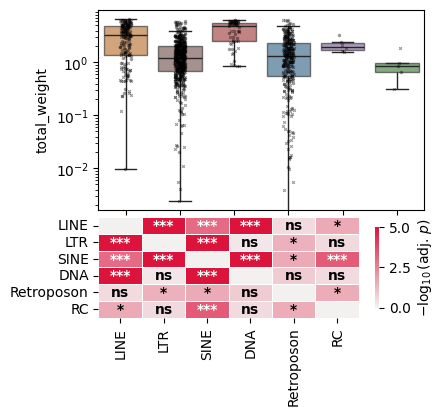

Success: Adjusted significance plot saved to ./plots/boxplot_with_matrix_total_weight_class_name_subfamilies.svg


In [34]:
x_name = "class_name"
y_name = "total_weight"
# Use categorical order to ensure alignment

data_to_plot = enrichment_df_subfamilies[
    (enrichment_df_subfamilies["Observed_Odds_Ratio"] > 0)
    # & (enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05)
]
data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
data_to_plot = data_to_plot.dropna(subset=[x_name, y_name])

plot_order = class_names

# --- 2. Calculate All-vs-All Statistics with BH Correction ---
# Generate every unique pair
box_pairs = list(itertools.combinations(plot_order, 2))
pair_results = []

for g1, g2 in box_pairs:
    d1 = data_to_plot[data_to_plot[x_name] == g1][y_name]
    d2 = data_to_plot[data_to_plot[x_name] == g2][y_name]
    _, p = stats.mannwhitneyu(d1, d2)
    pair_results.append({"g1": g1, "g2": g2, "p_raw": p})

# Perform Benjamini-Hochberg adjustment
raw_p_values = [res["p_raw"] for res in pair_results]
_, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")

# Construct the adjusted p-value matrix
p_matrix_adj = pd.DataFrame(index=plot_order, columns=plot_order, dtype=float)
np.fill_diagonal(p_matrix_adj.values, 1.0)

for i, res in enumerate(pair_results):
    g1, g2 = res["g1"], res["g2"]
    p_adj = adj_p_values[i]
    p_matrix_adj.loc[g1, g2] = p_adj
    p_matrix_adj.loc[g2, g1] = p_adj

# Apply -log10 transformation for the heatmap colors
neg_log_p = -np.log10(p_matrix_adj.astype(float) + 1e-300)

# --- 3. Visualization ---
# GridSpec: aligned horizontally by using the same column in the grid
fig = plt.figure(figsize=(4.2, 4))
gs = GridSpec(2, 1, height_ratios=[2, 1], hspace=0.05)

ax_box = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# --- A) The Boxplot ---
sns.boxplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    palette=class_names_p,
    boxprops={"alpha": 0.6},
    showfliers=False,
)

# Layer A: Significant points (Circles)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] == "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="o",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# Layer B: Non-Significant points (Xs)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] != "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="X",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

ax_box.set_yscale("log")
# ax_box.set_title(f"{y_name} by {x_name}", fontsize=14, pad=10)
ax_box.set_xlabel("")
# Hide x-labels on the boxplot to let the heatmap labels serve both
ax_box.tick_params(labelbottom=False)

# --- B) The Significance Heatmap (Matrix) ---
cmap = sns.light_palette("crimson", as_cmap=True)
# square=False ensures it spans the same horizontal width as the boxplot
sns.heatmap(
    neg_log_p,
    ax=ax_heat,
    cmap=cmap,
    cbar=True,
    annot=False,
    square=False,
    linewidths=0.5,
    linecolor="white",
    vmin=0,
    vmax=5,
    cbar_kws={"label": r"$-\log_{10}(\text{adj. } p)$", "shrink": 0.8},
)

# Add Stars/ns as annotations inside the heatmap cells (using adjusted p)
for i in range(len(plot_order)):
    for j in range(len(plot_order)):
        p_adj = p_matrix_adj.iloc[i, j]
        if i == j:
            text = ""
        elif p_adj < 0.001:
            text = "***"
        elif p_adj < 0.01:
            text = "**"
        elif p_adj < 0.05:
            text = "*"
        else:
            text = "ns"
        ax_heat.text(
            j + 0.5,
            i + 0.5,
            text,
            ha="center",
            va="center",
            fontsize=10,
            weight="bold",
            color="white" if p_adj < 0.01 else "black",
        )

# ax_heat.set_title("Pairwise Significance Matrix (Mann-Whitney U + BH FDR)", fontsize=12)

# --- 4. Tidy Up and Save ---
save_path = f"./plots/boxplot_with_matrix_{y_name}_{x_name}_subfamilies.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print(f"Success: Adjusted significance plot saved to {save_path}")

In [33]:
pd.Series(node_avg_weights)["MER34C_v"]

np.float64(0.007379227495619757)

In [17]:
enrichment_df_subfamilies["avg_weight"] = pd.Series(node_avg_weights)
enrichment_df_subfamilies

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,Random_Odds_Ratio_Mean,Random_Odds_Ratio_SD,Random_Odds_Ratio_Quantile_Of_Observed,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,Enrichment_p_value_adjusted_log,avg_weight
subfamily_name,,,,,,,,,,,,,,,,,,,,,
L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,192.773111,...,3.033173,0.143434,1.000,0.000,0.003992,0.010707,Significant,0.664199,-78.936052,0.004592
LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,188.019900,...,1.661283,0.519001,0.870,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.110316,0.000894
MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,166.088095,...,1.676311,0.344615,1.000,0.000,0.003992,0.010707,Significant,0.411405,-0.951805,0.001171
MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,171.511952,...,1.584688,0.306889,1.000,0.000,0.003992,0.010707,Significant,0.273644,-3.874878,0.000321
MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,106.416760,...,1.719991,0.175782,0.988,0.024,0.024000,0.052351,Non-Significant,0.778783,-3.399757,0.002617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,168.166667,...,NaN,NaN,0.292,0.584,0.584000,0.688157,Non-Significant,NaN,-0.891037,0.000025
HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,143.500000,...,1.747385,2.443703,0.826,0.348,0.348000,0.465766,Non-Significant,0.000000,-0.312007,NaN
HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,89.750000,...,NaN,NaN,0.008,0.016,0.016000,0.037095,Significant,NaN,-4.507497,0.000094


### GO terms network

In [42]:
files

['GO_terms_by_subfamilies_AluJb.csv',
 'GO_terms_by_subfamilies_AluJo.csv',
 'GO_terms_by_subfamilies_AluJr.csv',
 'GO_terms_by_subfamilies_AluJr4.csv',
 'GO_terms_by_subfamilies_AluSc.csv',
 'GO_terms_by_subfamilies_AluSc8.csv',
 'GO_terms_by_subfamilies_AluSg.csv',
 'GO_terms_by_subfamilies_AluSg4.csv',
 'GO_terms_by_subfamilies_AluSg7.csv',
 'GO_terms_by_subfamilies_AluSp.csv',
 'GO_terms_by_subfamilies_AluSq.csv',
 'GO_terms_by_subfamilies_AluSq2.csv',
 'GO_terms_by_subfamilies_AluSx.csv',
 'GO_terms_by_subfamilies_AluSx1.csv',
 'GO_terms_by_subfamilies_AluSx3.csv',
 'GO_terms_by_subfamilies_AluSx4.csv',
 'GO_terms_by_subfamilies_AluSz.csv',
 'GO_terms_by_subfamilies_AluSz6.csv',
 'GO_terms_by_subfamilies_AluY.csv',
 'GO_terms_by_subfamilies_AluYa8.csv',
 'GO_terms_by_subfamilies_AluYe5.csv',
 'GO_terms_by_subfamilies_AluYf1.csv',
 'GO_terms_by_subfamilies_AluYk2.csv',
 'GO_terms_by_subfamilies_Arthur1C.csv',
 'GO_terms_by_subfamilies_Charlie10.csv',
 'GO_terms_by_subfamilies_Charl

In [45]:
files = !ls GO_tables
subfamilies = [file[24:-4] for file in files]
subfamily_dfs = []
for file in files:
    local_subfamily_df = pd.read_csv('./GO_tables/'+ file)
    subfamily_dfs.append(local_subfamily_df)
top_5_perc_genes_by_subfamilies = pd.concat(subfamily_dfs, axis=0)
top_5_perc_genes_by_subfamilies

,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name
0,10,GO:0005515,protein binding,MF,2.747450e-12,5.150370e-08,1.192534,801,13442,"['ABCC4', 'ABCF1', 'ABI1', 'ACACB', 'ACAP1', '...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",AluJb,SINE
1,4,GO:0005634,nucleus,CC,1.064992e-10,9.982175e-07,1.320228,423,6412,"['AARS1', 'ABI1', 'ACACB', 'ACTB', 'ACTL6B', '...","['A1CF', 'AAAS', 'AARS1', 'AARSD1', 'AASS', 'A...",AluJb,SINE
2,5,GO:0005654,nucleoplasm,CC,5.669238e-09,3.542518e-05,1.415588,255,3605,"['ABCF1', 'ACTB', 'ADD1', 'AHCTF1', 'ALKBH2', ...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",AluJb,SINE
3,6,GO:0005829,cytosol,CC,2.641547e-08,1.237961e-04,1.320685,333,5046,"['AARS1', 'ABCF1', 'ABI1', 'ACACB', 'ACOT12', ...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA...",AluJb,SINE
4,11,GO:0003723,RNA binding,MF,1.738969e-07,6.519742e-04,1.610957,123,1528,"['AARS1', 'ABCF1', 'ADD1', 'AICDA', 'ALDH6A1',...","['A1CF', 'AARS1', 'AARS2', 'AATF', 'ABCF1', 'A...",AluJb,SINE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,GO:0005131,growth hormone receptor binding,MF,3.626961e-06,6.799102e-02,94.740659,3,10,"['CSH1', 'CSH2', 'CSHL1']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X6a_DNA,DNA
0,1,GO:0005131,growth hormone receptor binding,MF,1.846278e-07,3.461033e-03,72.296855,4,10,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X7A_LINE,LINE
1,0,GO:0060396,growth hormone receptor signaling pathway,BP,1.174440e-06,1.100803e-02,48.197904,4,15,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['A1BG', 'CSF2RA', 'CSH1', 'CSH2', 'CSHL1', 'G...",X7A_LINE,LINE
0,0,GO:0160063,multi-pass transmembrane protein insertion int...,BP,5.225858e-07,4.898196e-03,177.395062,3,9,"['NOMO1', 'NOMO2', 'NOMO3']","['CCDC47', 'NCLN', 'NOMO1', 'NOMO2', 'NOMO3', ...",X9_LINE,LINE


In [46]:
# top_5_perc_genes_by_subfamilies.to_csv('top_5_perc_genes_by_subfamilies.csv')

In [5]:
top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")

In [48]:
top_5_perc_genes_by_subfamilies[["subfamily_name", "class_name", "Term Name"]]

,subfamily_name,class_name,Term Name
0,AluJb,SINE,protein binding
1,AluJb,SINE,nucleus
2,AluJb,SINE,nucleoplasm
3,AluJb,SINE,cytosol
4,AluJb,SINE,RNA binding
...,...,...,...
0,X6a_DNA,DNA,growth hormone receptor binding
0,X7A_LINE,LINE,growth hormone receptor binding
1,X7A_LINE,LINE,growth hormone receptor signaling pathway
0,X9_LINE,LINE,multi-pass transmembrane protein insertion int...


In [6]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()

In [7]:
# --- Helper Functions for Aesthetic Variation & Physics ---


def get_jittered_color(hex_color, seed_name, amount=0.15):
    """
    Slightly perturbs the RGB values of a hex color based on a string seed
    to create visual differentiation between nodes of the same class.
    """
    try:
        rgb = np.array(mcolors.to_rgb(hex_color))
        # Use node name as seed for deterministic jitter
        rng = np.random.default_rng(sum(ord(c) for c in seed_name))
        jitter = rng.uniform(-amount, amount, 3)
        # Apply jitter and clip to valid [0, 1] range
        new_rgb = np.clip(rgb + jitter, 0, 1)
        return mcolors.to_hex(new_rgb)
    except:
        return hex_color


def prevent_collisions(pos, node_radii, iterations=150, min_dist_factor=2.5):
    """
    Aggressively relaxes node positions to prevent overlapping.
    Uses a combination of repulsive pushing and small random jitters
    to break up dense 'messes' of nodes.
    """
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())

    # Use a local RNG for deterministic stability
    rng = np.random.default_rng(42)

    for _ in range(iterations):
        # 1. Apply a very tiny global jitter to break deadlocks
        for n in nodes:
            new_pos[n] += rng.normal(0, 0.005, 2)

        # 2. Pairwise repulsion
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)

                # Minimum allowed distance (Sum of radii + robust buffer)
                target_dist = (node_radii[n1] + node_radii[n2]) * min_dist_factor

                if dist < target_dist and dist > 0:
                    # Push nodes apart. Force is higher the more they overlap.
                    push = (target_dist - dist) / dist * 0.6 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
                elif dist == 0:
                    # Perfectly overlapping nodes get a significant random push
                    new_pos[n1] += rng.normal(0, 0.1, 2)

    return new_pos


def save_go_network_svg_subfamilies_by_classes(
    df,
    output_file="plots/GO_network_subfamilies_by_classes.svg",
    jaccard_threshold=0.01,
    top_n=5,
    font_size=10,
):
    """
    Generates a static SVG GO network plot with:
    - High-Penalty Collision-aware Hub-and-Satellite layout.
    - Labels and nodes colored by jittered class contribution for differentiation.
    - Calibrated edge widths to ensure they don't exceed node diameters.
    """
    # 1. Ensure output directory exists
    os.makedirs(os.path.dirname(output_file), exist_ok=True)

    # 2. Filtering and Preprocessing
    if top_n is not None:
        df_filtered = (
            df.sort_values(["subfamily_name", "FDR"])
            .groupby("subfamily_name")
            .head(top_n)
            .copy()
        )
    else:
        df_filtered = df.copy()

    def parse_gene_list(x):
        if isinstance(x, str):
            try:
                return ast.literal_eval(x)
            except:
                return [g.strip() for g in x.split(",")]
        return x

    df_filtered["Overlapping Genes"] = df_filtered["Overlapping Genes"].apply(
        parse_gene_list
    )
    df_filtered["-log10FDR"] = -np.log10(df_filtered["FDR"].replace(0, 1e-15))
    df_filtered["log_pop_size"] = np.log10(
        df_filtered["Total Term Genes (Human)"].replace(0, 1)
    )

    # 3. Build Graph
    G = nx.Graph()

    # Store jittered colors and track subfamily contribution to GO terms
    subfam_jitter_colors = {}
    term_subfam_contribution = {}  # {term_id: {subfam: count}}
    node_radii = {}  # Store for physical collision avoidance

    # INCREASED: Larger base size for subfamily hubs
    SUBFAM_SIZE = 1000  # Area
    # Approx coordinate radius conversion: sqrt(area)/divisor
    # Adjusted divisor to match the increased scale
    RADIUS_CONV = 300

    for _, row in df_filtered.iterrows():
        subfam = row["subfamily_name"]
        term_id = row["Term ID"]
        cls = subfamily_to_class.get(subfam, "Other")
        n_overlap = len(row["Overlapping Genes"])

        # Colors
        if subfam not in subfam_jitter_colors:
            base_color = class_names_p.get(cls, "#808080")
            subfam_jitter_colors[subfam] = get_jittered_color(base_color, subfam)

        # Contribution
        if term_id not in term_subfam_contribution:
            term_subfam_contribution[term_id] = {}
        term_subfam_contribution[term_id][subfam] = (
            term_subfam_contribution[term_id].get(subfam, 0) + n_overlap
        )

        # Nodes
        if not G.has_node(subfam):
            G.add_node(
                subfam,
                label=subfam,
                type="subfamily",
                color=subfam_jitter_colors[subfam],
                class_name=cls,
                size=SUBFAM_SIZE,
            )
            node_radii[subfam] = np.sqrt(SUBFAM_SIZE) / RADIUS_CONV

        size_val = row["log_pop_size"] * 300  # Increased baseline for readability
        if not G.has_node(term_id):
            G.add_node(
                term_id,
                label=row["Term Name"],
                type="go",
                neg_log_fdr=row["-log10FDR"],
                size=size_val,
                raw_pop=row["Total Term Genes (Human)"],
            )
            node_radii[term_id] = np.sqrt(size_val) / RADIUS_CONV

        # Edge between Subfamily and GO term
        # Increased initial weight to keep constellations together,
        # but relying on prevent_collisions to keep them distinct.
        G.add_edge(
            subfam,
            term_id,
            weight=row["Fold Enrichment"] * 5,
            edge_type="fam_go",
            color="#D0D0D0",
        )

    # 4. Inter-term Edges (Jaccard Similarity)
    unique_terms = df_filtered.drop_duplicates(subset=["Term ID"])
    term_ids = unique_terms["Term ID"].tolist()
    term_genes = unique_terms["Overlapping Genes"].tolist()

    for i in range(len(term_ids)):
        for j in range(i + 1, len(term_ids)):
            set1, set2 = set(term_genes[i]), set(term_genes[j])
            union_len = len(set1.union(set2))
            if union_len == 0:
                continue
            jaccard = len(set1.intersection(set2)) / union_len
            if jaccard >= jaccard_threshold:
                G.add_edge(
                    term_ids[i],
                    term_ids[j],
                    weight=jaccard,
                    edge_type="jaccard",
                    color="#E0E0E0",
                )

    # --- 5. Positioning: Ultra-Spaced Clustered Layout ---

    # Larger figure size to accommodate stronger separation
    fig, ax = plt.subplots(figsize=(5, 5))

    # Step A: Initial Force Simulation
    # k: Global repulsion. Increased from 4.5 to 6.5 to repel hubs further.
    pos = nx.spring_layout(
        G,
        k=70 / np.sqrt(len(G.nodes())),
        iterations=300,
        seed=42,
        weight="weight",
        scale=15.0,  # Expanded visual field
    )

    # Step B: Physics Relaxation (High-Penalty Collision Avoidance)
    # min_dist_factor increased to 2.5 to ensure robust white space around every node.
    pos = prevent_collisions(pos, node_radii, iterations=300, min_dist_factor=4.7)

    # 6. Drawing (Order: Edges -> GO -> Subfamily for layering)

    # A) Edges
    edges = G.edges(data=True)

    def get_calibrated_width(u, v, d):
        if d["edge_type"] == "fam_go":
            go_node = v if G.nodes[v]["type"] == "go" else u
            diam = 2 * np.sqrt(G.nodes[go_node]["size"] / np.pi)
            raw_weight = d["weight"] / 5
            # Constrain line width to never exceed 40% of node diameter
            return min(raw_weight / 3, diam * 0.4)
        else:
            diam_u = 2 * np.sqrt(G.nodes[u]["size"] / np.pi)
            diam_v = 2 * np.sqrt(G.nodes[v]["size"] / np.pi)
            min_diam = min(diam_u, diam_v)
            return min(d["weight"] * 8, min_diam * 0.3)

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=edges,
        width=[get_calibrated_width(u, v, d) for u, v, d in edges],
        edge_color=[d.get("color", "#E0E0E0") for u, v, d in edges],
        alpha=0.3,
        ax=ax,  # Reduced alpha for cleaner constellations
    )

    # B) GO Nodes (Circles)
    go_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "go"]
    go_colors = [G.nodes[n]["neg_log_fdr"] for n in go_nodes]
    go_sizes = [G.nodes[n]["size"] for n in go_nodes]
    norm = mcolors.Normalize(
        vmin=min(go_colors) if go_colors else 0, vmax=max(go_colors) if go_colors else 1
    )

    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=go_nodes,
        node_shape="o",
        node_size=go_sizes,
        node_color=go_colors,
        cmap="coolwarm",
        alpha=0.9,
        ax=ax,
        edgecolors="white",
        linewidths=0.7,
    )

    # C) Subfamily Nodes (Diamonds)
    subfam_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "subfamily"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=subfam_nodes,
        node_shape="d",
        node_size=[G.nodes[n]["size"] for n in subfam_nodes],
        node_color=[G.nodes[n]["color"] for n in subfam_nodes],
        ax=ax,
        edgecolors="white",
        linewidths=1.5,
    )

    # 7. Labels with Jittered Subfamily Coloring
    texts = []
    for node, (x, y) in pos.items():
        data = G.nodes[node]
        label_text = data["label"]

        if data["type"] == "subfamily":
            t_color = "black"
            t_weight = "bold"
        else:
            t_weight = "normal"
            subfam_contribs = term_subfam_contribution.get(node, {})
            if subfam_contribs:
                dom_subfam = max(subfam_contribs, key=subfam_contribs.get)
                t_color = subfam_jitter_colors.get(dom_subfam, "black")
            else:
                t_color = "black"

        texts.append(
            ax.text(
                x, y, label_text, fontsize=font_size, color=t_color, fontweight=t_weight
            )
        )

    # Higher expand_points to account for wider constellation layout
    adjust_text(
        texts,
        ax=ax,
        arrowprops=dict(arrowstyle="->", color="gray", lw=0.6, alpha=0.4),
        expand_points=(2.5, 2.5),
        force_points=0.15,
    )

    # 8. Legends
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.4, pad=0.02)
    cbar.set_label("-log10(FDR)", fontsize=font_size)
    cbar.ax.tick_params(labelsize=font_size)

    size_legend_counts = [10, 100, 1000]
    for count in size_legend_counts:
        s_val = np.log10(count) * 300
        ax.scatter([], [], c="gray", alpha=0.5, s=s_val, label=f"{count} genes")

    leg1 = ax.legend(
        title="Term Population Size",
        loc="lower left",
        bbox_to_anchor=(1, 0.7),
        frameon=False,
        fontsize=font_size,
        title_fontsize=font_size,
    )
    ax.add_artist(leg1)

    j_vals = [0.01, 0.1, 0.2, 0.5]
    j_lines = [
        Line2D([0], [0], color="gray", lw=v * 8, alpha=0.4, label=f"J={v:.2f}")
        for v in j_vals
    ]
    ax.legend(
        handles=j_lines,
        title="Jaccard Similarity",
        loc="lower left",
        bbox_to_anchor=(1, 0.4),
        frameon=False,
        fontsize=font_size,
        title_fontsize=font_size,
    )

    ax.set_title(
        f"GO Term Network (Top {top_n} terms per Subfamily)\nRobust Spaced Clustered Layout (Hub-and-Satellite)",
        fontsize=font_size + 8,
        pad=40,
        fontweight="bold",
    )
    ax.axis("off")
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.savefig(output_file, format="svg", bbox_inches="tight", transparent=True)
    plt.close()
    print(f"Success: High-separation GO Network saved to {output_file}")

In [56]:
class_names

['LINE', 'LTR', 'SINE', 'DNA', 'Retroposon', 'RC']

In [9]:
class_name = "LTR"
print(
    top_5_perc_genes_by_subfamilies[
        (top_5_perc_genes_by_subfamilies["Total Term Genes (Human)"] < 1000)
        & (top_5_perc_genes_by_subfamilies["class_name"] == class_name)
    ]["subfamily_name"]
    .value_counts()
    .to_string()
)

subfamily_name
MER68             21
MLT1E3            17
MST-int           14
MER65D            12
MLT1F1            11
ERVL-E-int        10
LTR42              9
ERV3-16A3_I        9
LTR1               8
MER65A             8
LTR26              7
MER34              7
MER49              7
LTR44              7
MER11A             6
MER65C             5
MLT2B2             5
MER65B             5
LTR2B              5
LTR16D2            5
MER84-int          4
MLT-int            4
MER70B             4
MLT1N2             4
MER92B             4
LTR85a             3
LTR12B             3
LTR14              3
LTR101_Mam         3
MER11D             3
MER57E3            3
MER66C             3
LTR84b             3
LTR33A_v           3
MER39B             3
MER34-int          3
LTR47B2            3
MSTB1              2
PABL_A-int         2
LTR12C             2
HERV3-int          2
HERVL40-int        2
MLT1D              2
MLT1H2             2
PrimLTR79          2
MER76-int          2
MER57A-int         

In [11]:
class_name = "Retroposon"
save_go_network_svg_subfamilies_by_classes(
    top_5_perc_genes_by_subfamilies[
        (top_5_perc_genes_by_subfamilies["Total Term Genes (Human)"] < 1000)
        & (top_5_perc_genes_by_subfamilies["class_name"] == class_name)
    ],
    output_file=f"plots/GO_network_subfamilies_{class_name}_5_terms.svg",
    jaccard_threshold=0.0,
    top_n=5,
    font_size=10,
)

Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, can't fit inside the X axis
Some labels are too long, ca

Success: High-separation GO Network saved to plots/GO_network_subfamilies_Retroposon_5_terms.svg


In [10]:
class_name = "LTR"
save_go_network_svg_subfamilies_by_classes(
    top_5_perc_genes_by_subfamilies[
        (top_5_perc_genes_by_subfamilies["Total Term Genes (Human)"] < 1000)
        & (top_5_perc_genes_by_subfamilies["class_name"] == class_name)
    ],
    output_file=f"plots/GO_network_subfamilies_{class_name}_2_terms.svg",
    jaccard_threshold=0.0,
    top_n=2,
    font_size=10,
)

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


Success: High-separation GO Network saved to plots/GO_network_subfamilies_LTR_2_terms.svg


In [16]:
for class_name in class_names:

    save_go_network_svg_subfamilies_by_classes(
        top_5_perc_genes_by_subfamilies[
            (top_5_perc_genes_by_subfamilies["Total Term Genes (Human)"] < 1000)
            & (top_5_perc_genes_by_subfamilies["class_name"] == class_name)
        ],
        output_file=f"plots/GO_network_subfamilies_{class_name}.svg",
        jaccard_threshold=0.0,
        top_n=30,
        font_size=10,
    )

Success: High-separation GO Network saved to plots/GO_network_subfamilies_LINE.svg
Success: High-separation GO Network saved to plots/GO_network_subfamilies_LTR.svg
Success: High-separation GO Network saved to plots/GO_network_subfamilies_SINE.svg
Success: High-separation GO Network saved to plots/GO_network_subfamilies_DNA.svg
Success: High-separation GO Network saved to plots/GO_network_subfamilies_Retroposon.svg
Success: High-separation GO Network saved to plots/GO_network_subfamilies_RC.svg


/tmp/ipykernel_164/1144097649.py:191: RuntimeWarning: divide by zero encountered in scalar divide
  k=75 / np.sqrt(len(G.nodes())),


### Gemini classification of functional categories

In [5]:
top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
top_5_perc_genes_by_subfamilies

,Unnamed: 0.1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name
0,0,10,GO:0005515,protein binding,MF,2.747450e-12,5.150370e-08,1.192534,801,13442,"['ABCC4', 'ABCF1', 'ABI1', 'ACACB', 'ACAP1', '...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",AluJb,SINE
1,1,4,GO:0005634,nucleus,CC,1.064992e-10,9.982175e-07,1.320228,423,6412,"['AARS1', 'ABI1', 'ACACB', 'ACTB', 'ACTL6B', '...","['A1CF', 'AAAS', 'AARS1', 'AARSD1', 'AASS', 'A...",AluJb,SINE
2,2,5,GO:0005654,nucleoplasm,CC,5.669238e-09,3.542518e-05,1.415588,255,3605,"['ABCF1', 'ACTB', 'ADD1', 'AHCTF1', 'ALKBH2', ...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",AluJb,SINE
3,3,6,GO:0005829,cytosol,CC,2.641547e-08,1.237961e-04,1.320685,333,5046,"['AARS1', 'ABCF1', 'ABI1', 'ACACB', 'ACOT12', ...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA...",AluJb,SINE
4,4,11,GO:0003723,RNA binding,MF,1.738969e-07,6.519742e-04,1.610957,123,1528,"['AARS1', 'ABCF1', 'ADD1', 'AICDA', 'ALDH6A1',...","['A1CF', 'AARS1', 'AARS2', 'AATF', 'ABCF1', 'A...",AluJb,SINE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1226,0,0,GO:0005131,growth hormone receptor binding,MF,3.626961e-06,6.799102e-02,94.740659,3,10,"['CSH1', 'CSH2', 'CSHL1']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X6a_DNA,DNA
1227,0,1,GO:0005131,growth hormone receptor binding,MF,1.846278e-07,3.461033e-03,72.296855,4,10,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X7A_LINE,LINE
1228,1,0,GO:0060396,growth hormone receptor signaling pathway,BP,1.174440e-06,1.100803e-02,48.197904,4,15,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['A1BG', 'CSF2RA', 'CSH1', 'CSH2', 'CSHL1', 'G...",X7A_LINE,LINE
1229,0,0,GO:0160063,multi-pass transmembrane protein insertion int...,BP,5.225858e-07,4.898196e-03,177.395062,3,9,"['NOMO1', 'NOMO2', 'NOMO3']","['CCDC47', 'NCLN', 'NOMO1', 'NOMO2', 'NOMO3', ...",X9_LINE,LINE


In [54]:
for term_name in top_5_perc_genes_by_subfamilies["Term Name"].unique():
    print(term_name)

protein binding
nucleus
nucleoplasm
cytosol
RNA binding
protein transport
cytoplasm
DNA damage response
plasma membrane
DNA repair
protein kinase binding
G protein-coupled receptor signaling pathway
G protein-coupled receptor activity
mitochondrion
GBAF complex
coenzyme A biosynthetic process
glutathione catabolic process
sensory perception of smell
cholesterol binding
detection of chemical stimulus involved in sensory perception of smell
olfactory receptor activity
glutathione hydrolase activity
late endosome
precatalytic spliceosome
U2-type prespliceosome
extracellular exosome
DNA metabolic process
mRNA binding
nucleotide binding
intracellularly calcium-gated chloride channel activity
cell division
nucleolus
ATP binding
kinetochore
mitochondrial matrix
DNA-directed RNA polymerase activity
spindle
DNA damage checkpoint signaling
Sin3-type complex
DNA-directed RNA polymerase complex
histone binding
chromosome
positive regulation of double-strand break repair
mitotic sister chromatid co

In [7]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()


top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
classification = pd.read_csv("Subfamilies_classified - Classification.csv")

top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)

counts_by_group = (
    top_5_perc_genes_by_subfamilies[
        ["class_name", "subfamily_name", "Functional Group"]
    ]
    .value_counts()
    .reset_index()
)
# counts_by_group['count'] = counts_by_group['count']*10
counts_by_group

top_5_perc_genes_by_subfamilies

,Unnamed: 0.1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name,GO Term Name,Functional Group,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,0,10,GO:0005515,protein binding,MF,2.747450e-12,5.150370e-08,1.192534,801,13442,"['ABCC4', 'ABCF1', 'ABI1', 'ACACB', 'ACAP1', '...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",AluJb,SINE,protein binding,Too general,NaN,protein binding,Match
1,1,4,GO:0005634,nucleus,CC,1.064992e-10,9.982175e-07,1.320228,423,6412,"['AARS1', 'ABI1', 'ACACB', 'ACTB', 'ACTL6B', '...","['A1CF', 'AAAS', 'AARS1', 'AARSD1', 'AASS', 'A...",AluJb,SINE,nucleus,Too general,NaN,nucleus,Match
2,2,5,GO:0005654,nucleoplasm,CC,5.669238e-09,3.542518e-05,1.415588,255,3605,"['ABCF1', 'ACTB', 'ADD1', 'AHCTF1', 'ALKBH2', ...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",AluJb,SINE,nucleoplasm,Too general,NaN,nucleoplasm,Match
3,3,6,GO:0005829,cytosol,CC,2.641547e-08,1.237961e-04,1.320685,333,5046,"['AARS1', 'ABCF1', 'ABI1', 'ACACB', 'ACOT12', ...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA...",AluJb,SINE,cytosol,Too general,NaN,cytosol,Match
4,4,11,GO:0003723,RNA binding,MF,1.738969e-07,6.519742e-04,1.610957,123,1528,"['AARS1', 'ABCF1', 'ADD1', 'AICDA', 'ALDH6A1',...","['A1CF', 'AARS1', 'AARS2', 'AATF', 'ABCF1', 'A...",AluJb,SINE,RNA binding,Too general,NaN,RNA binding,Match
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1226,0,0,GO:0005131,growth hormone receptor binding,MF,3.626961e-06,6.799102e-02,94.740659,3,10,"['CSH1', 'CSH2', 'CSHL1']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X6a_DNA,DNA,growth hormone receptor binding,Signaling pathways,NaN,growth hormone receptor binding,Match
1227,0,1,GO:0005131,growth hormone receptor binding,MF,1.846278e-07,3.461033e-03,72.296855,4,10,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X7A_LINE,LINE,growth hormone receptor binding,Signaling pathways,NaN,growth hormone receptor binding,Match
1228,1,0,GO:0060396,growth hormone receptor signaling pathway,BP,1.174440e-06,1.100803e-02,48.197904,4,15,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['A1BG', 'CSF2RA', 'CSH1', 'CSH2', 'CSHL1', 'G...",X7A_LINE,LINE,growth hormone receptor signaling pathway,Signaling pathways,NaN,growth hormone receptor signaling pathway,Match
1229,0,0,GO:0160063,multi-pass transmembrane protein insertion int...,BP,5.225858e-07,4.898196e-03,177.395062,3,9,"['NOMO1', 'NOMO2', 'NOMO3']","['CCDC47', 'NCLN', 'NOMO1', 'NOMO2', 'NOMO3', ...",X9_LINE,LINE,multi-pass transmembrane protein insertion int...,Exosomes and vesicles,NaN,multi-pass transmembrane protein insertion int...,Match


In [8]:
counts_by_group = (
    top_5_perc_genes_by_subfamilies[
        ["class_name", "subfamily_name", "Functional Group"]
    ]
    .value_counts()
    .reset_index()
)
# counts_by_group['count'] = counts_by_group['count']*10
counts_by_group

,class_name,subfamily_name,Functional Group,count
0,SINE,AluSx,Too general,15
1,DNA,MER106B,Other immune processes,13
2,LINE,L1M3,Other immune processes,11
3,SINE,AluY,Too general,11
4,SINE,AluSx4,Too general,10
...,...,...,...,...
555,DNA,Charlie9,Cell cycle/cell division,1
556,DNA,Charlie9,Exosomes and vesicles,1
557,SINE,FLAM_C,Chromatin structure,1
558,SINE,FLAM_C,Nervous system,1


In [18]:
len(counts_by_group["subfamily_name"].unique())

230

/tmp/ipykernel_177/4005640444.py:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


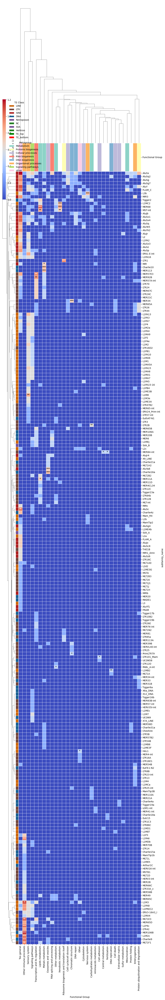

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_top5_perc_by_subfamilies.svg


In [21]:
# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(subfamily_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(10, 60),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_top5_perc_by_subfamilies.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

In [ ]:
# showing only the subfamilies that have at least one significant difference

Filtering: 31 subfamilies found with at least one significant process.


/tmp/ipykernel_177/1232476693.py:53: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


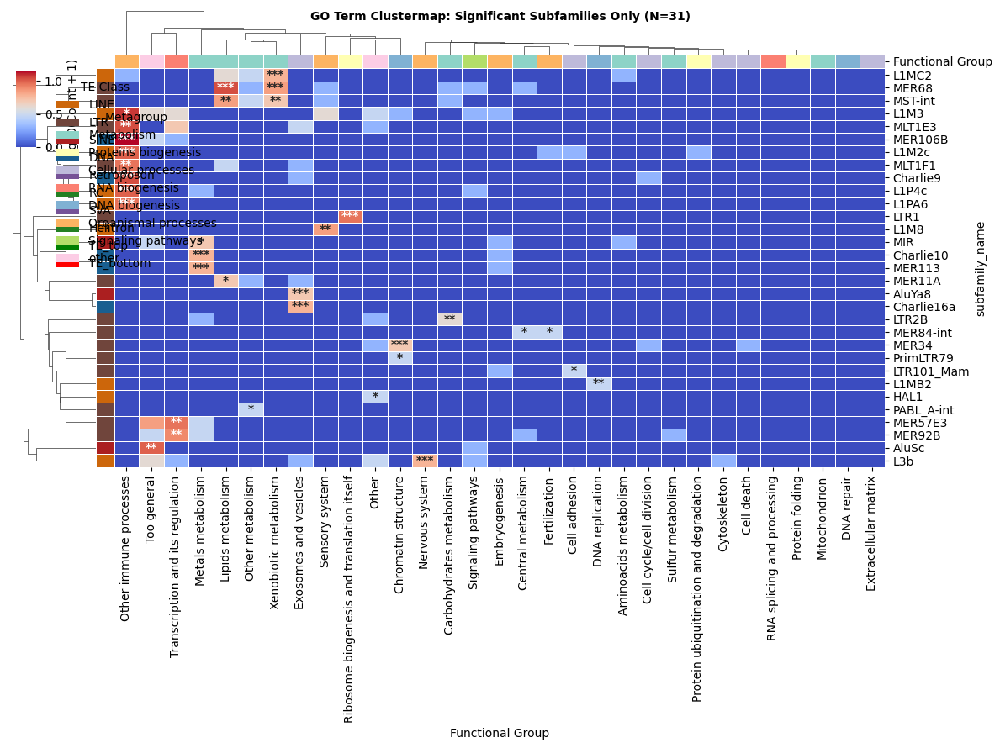

Success: Filtered clustermap saved to plots/GO_functional_groups_subfamilies_clustermap_significant_only.svg


In [31]:
# --- 2. Data Preparation and Filtering ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)

# --- REFACTOR: Identify and Filter Significant Rows Only ---
# We keep rows that have at least one cell where adj. p-value < 0.05
sig_mask = (p_adj_matrix < 0.05).any(axis=1)
n_sig = sig_mask.sum()

print(f"Filtering: {n_sig} subfamilies found with at least one significant process.")

# Apply filtering across all relevant dataframes
pivot_counts = pivot_counts.loc[sig_mask]
p_adj_matrix = p_adj_matrix.loc[sig_mask]


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(subfamily_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}
unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

# Dynamic height based on the number of significant rows (0.25 inches per row + margins)
fig_height = max(9, n_sig * 0.2)

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(12, fig_height),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Add legends
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

plt.suptitle(
    f"GO Term Clustermap: Significant Subfamilies Only (N={n_sig})",
    fontsize=10,
    y=0.98,
    weight="bold",
)

# --- 4. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_subfamilies_clustermap_significant_only.svg"
g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(f"Success: Filtered clustermap saved to {save_path}")

In [ ]:
# labeling only the subfamilies that have at least one significant difference

Total Subfamilies: 230. Significant for labeling: 31.


/tmp/ipykernel_177/1000976933.py:54: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


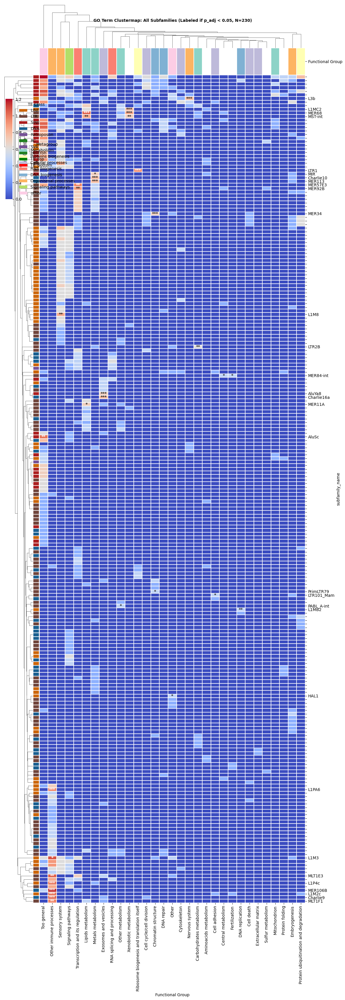

Success: Full clustermap with selective labeling saved to plots/GO_functional_groups_clustermap_subfamilies_labeled_sig.svg


In [25]:
# --- 2. Data Preparation and Filtering ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)

# --- REFACTOR: Determine Significance for Labeling ---
# Identify which rows have at least one cell where adj. p-value < 0.05
sig_mask = (p_adj_matrix < 0.05).any(axis=1)
n_sig = sig_mask.sum()
n_total = len(pivot_counts)

print(f"Total Subfamilies: {n_total}. Significant for labeling: {n_sig}.")

# Create a custom Series for y-axis labels
# We show the name if it is significant, otherwise an empty string
row_labels = [name if sig_mask[name] else "" for name in pivot_counts.index]


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(subfamily_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}
unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

# Dynamic height based on the total number of rows to avoid squashing
# Since we are showing all rows, we use n_total instead of n_sig
fig_height = max(12, n_total * 0.15)

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.1,  # Thinner lines for higher density
    figsize=(12, fig_height),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.05),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
    # Use our custom labels: Significant names shown, others empty
    yticklabels=row_labels,
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Add legends
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

plt.suptitle(
    f"GO Term Clustermap: All Subfamilies (Labeled if p_adj < 0.05, N={n_total})",
    fontsize=10,
    y=0.98,
    weight="bold",
)

# --- 4. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_subfamilies_labeled_sig.svg"
g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(f"Success: Full clustermap with selective labeling saved to {save_path}")

In [5]:
(10 / 13.33) * 16

12.003000750187546

Calculating hierarchical network layout...
Optimizing label placement...


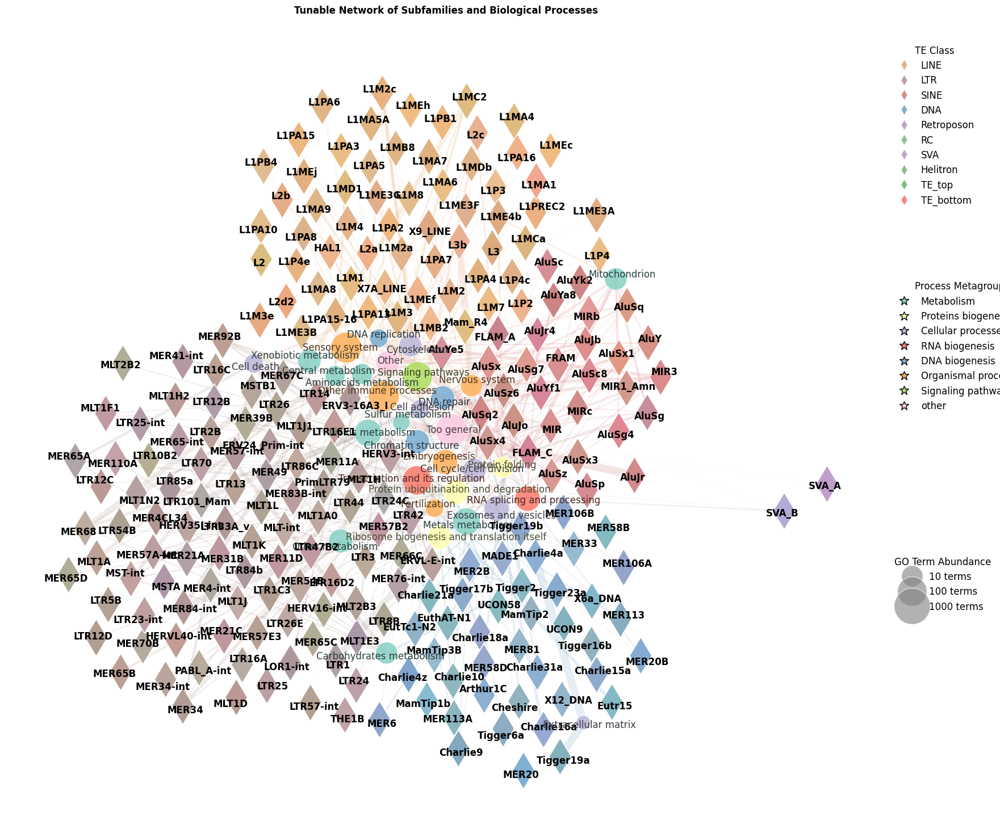

Success: Refactored network with high-contrast functional labels and size legend saved to plots/TE_GO_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg


In [21]:
GLOBAL_FONT_SIZE = 12

# Hierarchy Toggle
SHOW_METAGROUP_STARS = (
    False  # True: Show stars and connections; False: Only show functional circles
)


# Layout Dynamics
LAYOUT_K_FACTOR = 0.2  # Higher = stronger repulsion between all nodes
LAYOUT_ITERATIONS = 250  # More iterations for a more stable physics state
LAYOUT_SEED = 42
JITTER_STRENGTH = 0.08  # Randomness added to node positions to break geometric patterns

# Clustering Strength
# Lower this value if subfamilies of the same class are too tightly packed
CLASS_GROUPING_WEIGHT = 112.5

# Color Customization (REFACTORED: Now Parametrizable)
USE_COLOR_JITTER = True  # Toggle unique shades for subfamilies of the same class
COLOR_JITTER_AMOUNT = 0.1  # Intensity of the color shift (0.0 to 1.0)
# NEW: Controls how much lighter subfamily rhomboids are (0.0 = original, 1.0 = white)
SUBFAMILY_LIGHTNESS_FACTOR = 0.5

# Node Sizes (Area-based)
METAGROUP_STAR_SIZE = 2000
FUNCTIONAL_CIRCLE_SCALE = 700  # Multiplier for log-proportional sizing
SUBFAMILY_RHOMBOID_SIZE = 1100

# Edge Visuals
META_GROUP_EDGE_WIDTH = 2.0
META_GROUP_ALPHA = 0.15
SUBFAM_GROUP_WIDTH_SCALE = 20.0  # Multiplier for fraction-based widths
SUBFAM_GROUP_ALPHA = 0.22

# Collision & Overlap Management (Physics refinement)
COLLISION_MIN_DIST = 0.3  # Overlap penalty (multiplier for node radii sum)
COLLISION_ITERATIONS = 120  # Intensity of the post-layout relaxation step
NODE_RADIUS_DIVISOR = 250  # Maps area-based sizes into coordinate units

# --- 2. Helper Functions ---


def lighten_color(color, amount=0.3):
    """
    Lightens a color by blending it with white for better contrast with black labels.
    """
    try:
        rgb = np.array(mcolors.to_rgb(color))
        # Move RGB values towards white (1, 1, 1)
        light_rgb = rgb + (np.array([1, 1, 1]) - rgb) * amount
        return mcolors.to_hex(np.clip(light_rgb, 0, 1))
    except:
        return color


def darken_color(color, amount=0.3):
    """Slightly darkens a color (hex or RGB) for better label contrast."""
    try:
        rgb = np.array(mcolors.to_rgb(color))
        dark_rgb = np.clip(rgb * (1 - amount), 0, 1)
        return mcolors.to_hex(dark_rgb)
    except:
        return color


def get_jittered_color(hex_color, seed_name, amount=0.18):
    """Perturbs RGB values based on seed for intra-class subfamily differentiation."""
    try:
        rgb = np.array(mcolors.to_rgb(hex_color))
        rng = np.random.default_rng(sum(ord(c) for c in seed_name))
        jitter = rng.uniform(-amount, amount, 3)
        return mcolors.to_hex(np.clip(rgb + jitter, 0, 1))
    except:
        return hex_color


def prevent_collisions(pos, node_sizes, iterations, min_dist_factor, jitter):
    """Manually relaxes node positions to prevent 3+ nodes from overlapping."""
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())
    radii = {n: np.sqrt(node_sizes[n]) / NODE_RADIUS_DIVISOR for n in nodes}

    for _ in range(iterations):
        if jitter > 0:
            for n in nodes:
                new_pos[n] += np.random.normal(0, jitter * 0.05, 2)
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)
                target_dist = (radii[n1] + radii[n2]) * min_dist_factor
                if dist < target_dist and dist > 0:
                    push = (target_dist - dist) / dist * 0.5 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
                elif dist == 0:
                    new_pos[n1] += np.random.normal(0, 0.05, 2)
    return new_pos


# --- 3. Data Processing & Graph Building ---

group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}
G = nx.Graph()

# Group totals for normalization
group_totals = counts_by_group.groupby("Functional Group")["count"].sum().to_dict()

# Add Metagroup Nodes (Stars) - Optional based on flag
if SHOW_METAGROUP_STARS:
    for meta, color in metagroup_palette.items():
        G.add_node(meta, type="meta", color=color, label=meta, size=METAGROUP_STAR_SIZE)

# Process Rows
subfam_colors = {}
for _, row in counts_by_group.iterrows():
    subfam = row["subfamily_name"]
    group = row["Functional Group"]
    cls = row["class_name"]
    val = row["count"]
    if val == 0:
        continue

    if subfam not in G:
        base_color = class_names_p.get(cls, "#808080")
        if USE_COLOR_JITTER:
            final_color = get_jittered_color(
                base_color, subfam, amount=COLOR_JITTER_AMOUNT
            )
        else:
            final_color = base_color

        # NEW: Apply lightness adjustment for text contrast
        subfam_colors[subfam] = lighten_color(
            final_color, amount=SUBFAMILY_LIGHTNESS_FACTOR
        )

        G.add_node(
            subfam,
            type="subfam",
            color=subfam_colors[subfam],
            class_name=cls,
            label=subfam,
            size=SUBFAMILY_RHOMBOID_SIZE,
        )

    if group not in G:
        meta = group_to_meta.get(group, "other")
        meta_color = metagroup_palette.get(meta, "gray")
        g_size = np.log10(group_totals.get(group, 1) + 1) * FUNCTIONAL_CIRCLE_SCALE
        G.add_node(group, type="group", color=meta_color, size=g_size, label=group)

        if SHOW_METAGROUP_STARS:
            G.add_edge(meta, group, weight=10, type="meta_group")

    fraction = val / group_totals[group]
    G.add_edge(subfam, group, weight=fraction, type="subfam_group", raw_count=val)

# --- 4. Layout Generation ---

H = G.copy()
subfam_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
for i in range(len(subfam_nodes)):
    for j in range(i + 1, len(subfam_nodes)):
        n1, n2 = subfam_nodes[i], subfam_nodes[j]
        if G.nodes[n1]["class_name"] == G.nodes[n2]["class_name"]:
            H.add_edge(n1, n2, weight=CLASS_GROUPING_WEIGHT)

print("Calculating hierarchical network layout...")
pos = nx.spring_layout(
    H,
    k=LAYOUT_K_FACTOR / np.sqrt(len(G)),
    iterations=LAYOUT_ITERATIONS,
    seed=LAYOUT_SEED,
    weight="weight",
)

node_sizes_dict = {n: G.nodes[n]["size"] for n in G.nodes}
pos = prevent_collisions(
    pos,
    node_sizes_dict,
    iterations=COLLISION_ITERATIONS,
    min_dist_factor=COLLISION_MIN_DIST,
    jitter=JITTER_STRENGTH,
)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(20, 18))
ax.axis("off")

# A) Draw Edges
edges = G.edges(data=True)
for u, v, d in edges:
    if d["type"] == "meta_group":
        if not SHOW_METAGROUP_STARS:
            continue
        width, alpha, color = META_GROUP_EDGE_WIDTH, META_GROUP_ALPHA, "gray"
    else:
        width = d["weight"] * SUBFAM_GROUP_WIDTH_SCALE
        alpha = SUBFAM_GROUP_ALPHA
        color = (
            G.nodes[u]["color"]
            if G.nodes[u]["type"] == "subfam"
            else G.nodes[v]["color"]
        )
    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)], width=width, edge_color=color, alpha=alpha, ax=ax
    )

# B) Nodes
if SHOW_METAGROUP_STARS:
    meta_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "meta"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=meta_nodes,
        node_shape="*",
        node_size=METAGROUP_STAR_SIZE,
        node_color=[G.nodes[n]["color"] for n in meta_nodes],
        edgecolors="black",
        linewidths=0.6,
        ax=ax,
    )

group_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "group"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=group_nodes,
    node_shape="o",
    node_size=[G.nodes[n]["size"] for n in group_nodes],
    node_color=[G.nodes[n]["color"] for n in group_nodes],
    edgecolors="white",
    linewidths=0.8,
    alpha=0.9,
    ax=ax,
)

subf_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=subf_nodes,
    node_shape="d",
    node_size=SUBFAMILY_RHOMBOID_SIZE,
    node_color=[G.nodes[n]["color"] for n in subf_nodes],
    edgecolors="white",
    linewidths=1.0,
    ax=ax,
)

# C) Labels
texts = []
for node, (x, y) in pos.items():
    d = G.nodes[node]
    weight = "bold" if d["type"] != "group" else "normal"

    if d["type"] == "group":
        label_color = darken_color(d["color"], amount=0.7)
    elif d["type"] == "subfam":
        label_color = "black"
    else:  # Meta
        if not SHOW_METAGROUP_STARS:
            continue
        label_color = "black"

    texts.append(
        ax.text(
            x,
            y,
            d["label"],
            fontsize=GLOBAL_FONT_SIZE,
            fontweight=weight,
            color=label_color,
            ha="center",
            va="center",
        )
    )

print("Optimizing label placement...")
adjust_text(
    texts,
    ax=ax,
    expand_points=(1.8, 1.8),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.4, alpha=0.5),
)

# --- 6. Legends ---
# Use lightened colors in the legend for visual consistency
row_legend = [
    Line2D(
        [0],
        [0],
        marker="d",
        color="w",
        label=l,
        markerfacecolor=lighten_color(c, SUBFAMILY_LIGHTNESS_FACTOR),
        markersize=10,
    )
    for l, c in class_names_p.items()
]

meta_legend = [
    Line2D(
        [0],
        [0],
        marker="*",
        color="w",
        label=l,
        markerfacecolor=c,
        markersize=12,
        markeredgecolor="k",
    )
    for l, c in metagroup_palette.items()
]

size_counts = [10, 100, 1000]
size_legend = []
for count in size_counts:
    area = np.log10(count + 1) * FUNCTIONAL_CIRCLE_SCALE
    m_size = np.sqrt(area)
    size_legend.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{count} terms",
            markerfacecolor="gray",
            markersize=m_size,
            alpha=0.6,
        )
    )

leg1 = ax.legend(
    handles=row_legend,
    title="TE Class",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg1)
leg2 = plt.legend(
    handles=meta_legend,
    title="Process Metagroup",
    loc="upper left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg2)
plt.legend(
    handles=size_legend,
    title="GO Term Abundance",
    loc="upper left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)

plt.title(
    f"Tunable Network of Subfamilies and Biological Processes",
    fontsize=GLOBAL_FONT_SIZE,
    weight="bold",
    pad=30,
)

# --- 7. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_GO_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg"
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")
plt.show()

print(
    f"Success: Refactored network with high-contrast functional labels and size legend saved to {save_path}"
)

In [ ]:
1

### Classification of immune processes

In [22]:
top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
classification = pd.read_csv("Subfamilies_classified - Immune_classification.csv")

top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
).dropna()
top_5_perc_genes_by_subfamilies

,Unnamed: 0.1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name,GO Term Name,Functional Group
99,14,10,GO:0016018,cyclosporin A binding,MF,7.995710e-05,0.099925,7.504701,6,16,"['PPIAL4D', 'PPIAL4E', 'PPIAL4F', 'PPIAL4G', '...","['NKTR', 'PPIA', 'PPIAL4A', 'PPIAL4C', 'PPIAL4...",AluSp,SINE,cyclosporin A binding,T-cell mediated immunity
162,23,7,GO:0039536,negative regulation of RIG-I signaling pathway,BP,1.526307e-05,0.011121,12.507834,5,8,"['GPATCH3', 'NLRX1', 'NPLOC4', 'RNF125', 'SEC1...","['C1QBP', 'DHX58', 'GPATCH3', 'NLRX1', 'NPLOC4...",AluSx,SINE,negative regulation of RIG-I signaling pathway,Innate immunity
208,18,4,GO:0016447,somatic recombination of immunoglobulin gene s...,BP,8.587149e-05,0.080487,13.341690,4,6,"['MSH2', 'MSH3', 'MSH6', 'PMS2']","['MLH1', 'MSH2', 'MSH3', 'MSH6', 'PMS2', 'UNG']",AluSx1,SINE,somatic recombination of immunoglobulin gene s...,B-cell mediated immunity
229,10,14,GO:0016018,cyclosporin A binding,MF,3.595945e-06,0.006128,9.432014,7,16,"['PPIAL4A', 'PPIAL4C', 'PPIAL4D', 'PPIAL4E', '...","['NKTR', 'PPIA', 'PPIAL4A', 'PPIAL4C', 'PPIAL4...",AluSx4,SINE,cyclosporin A binding,T-cell mediated immunity
301,0,0,GO:0038196,type III interferon-mediated signaling pathway,BP,7.574276e-07,0.014199,157.038251,3,9,"['IFNGR2', 'IFNL2', 'IFNL3']","['IFNG', 'IFNGR1', 'IFNGR2', 'IFNL1', 'IFNL2',...",Arthur1C,DNA,type III interferon-mediated signaling pathway,Innate immunity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1153,0,0,GO:0004982,N-formyl peptide receptor activity,MF,2.963857e-07,0.005556,42.764881,4,4,"['FPR1', 'FPR2', 'FPR3', 'GPR32']","['FPR1', 'FPR2', 'FPR3', 'GPR32']",MLT1L,LTR,N-formyl peptide receptor activity,Innate immunity
1154,0,1,GO:0016018,cyclosporin A binding,MF,1.453641e-09,0.000027,29.723109,7,16,"['PPIAL4A', 'PPIAL4C', 'PPIAL4D', 'PPIAL4E', '...","['NKTR', 'PPIA', 'PPIAL4A', 'PPIAL4C', 'PPIAL4...",MLT1N2,LTR,cyclosporin A binding,T-cell mediated immunity
1179,0,1,GO:0140375,immune receptor activity,MF,4.754830e-08,0.000891,46.652597,5,14,"['KIR2DL1', 'KIR2DL3', 'KIR2DS4', 'KIR3DL1', '...","['FCAR', 'FCGR3A', 'GP6', 'KIR2DL1', 'KIR2DL3'...",MSTB1,LTR,immune receptor activity,Other and general immune processes
1180,1,0,GO:0002767,immune response-inhibiting cell surface recept...,BP,9.483984e-07,0.008889,27.214015,5,24,"['KIR2DL1', 'KIR2DL3', 'KIR2DS4', 'KIR3DL1', '...","['FCAR', 'GP6', 'HLA-G', 'KIR2DL1', 'KIR2DL3',...",MSTB1,LTR,immune response-inhibiting cell surface recept...,Other and general immune processes


In [23]:
counts_by_group = (
    top_5_perc_genes_by_subfamilies[
        ["class_name", "subfamily_name", "Functional Group"]
    ]
    .value_counts()
    .reset_index()
)
# counts_by_group['count'] = counts_by_group['count']*10
counts_by_group

,class_name,subfamily_name,Functional Group,count
0,DNA,Charlie9,T-cell mediated immunity,9
1,LTR,MLT1E3,T-cell mediated immunity,9
2,LTR,MLT1F1,T-cell mediated immunity,7
3,DNA,MER106B,Innate immunity,6
4,LINE,L1M2c,Innate immunity,5
...,...,...,...,...
70,SINE,AluSp,T-cell mediated immunity,1
71,SINE,AluSx,Innate immunity,1
72,SINE,AluSx1,B-cell mediated immunity,1
73,SINE,AluSx4,T-cell mediated immunity,1


/tmp/ipykernel_177/582872674.py:56: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


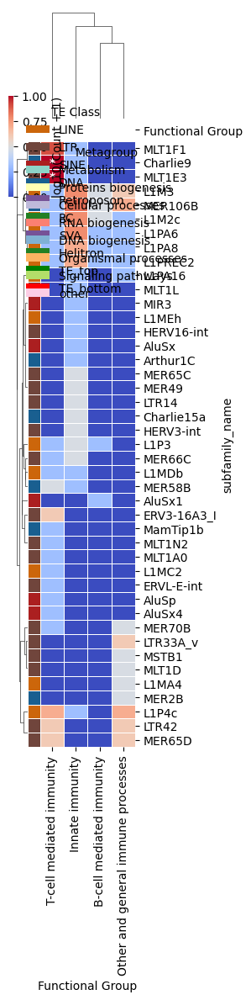

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_immune_top5_perc_by_subfamilies.svg


In [39]:
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)


# --- 2. Data Preparation ---

# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(subfamily_to_class).map(class_names_p)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(3, 12),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.1, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in class_names_p.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="TE Class",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_immune_top5_perc_by_subfamilies.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

Calculating hierarchical network layout...
Optimizing label placement...


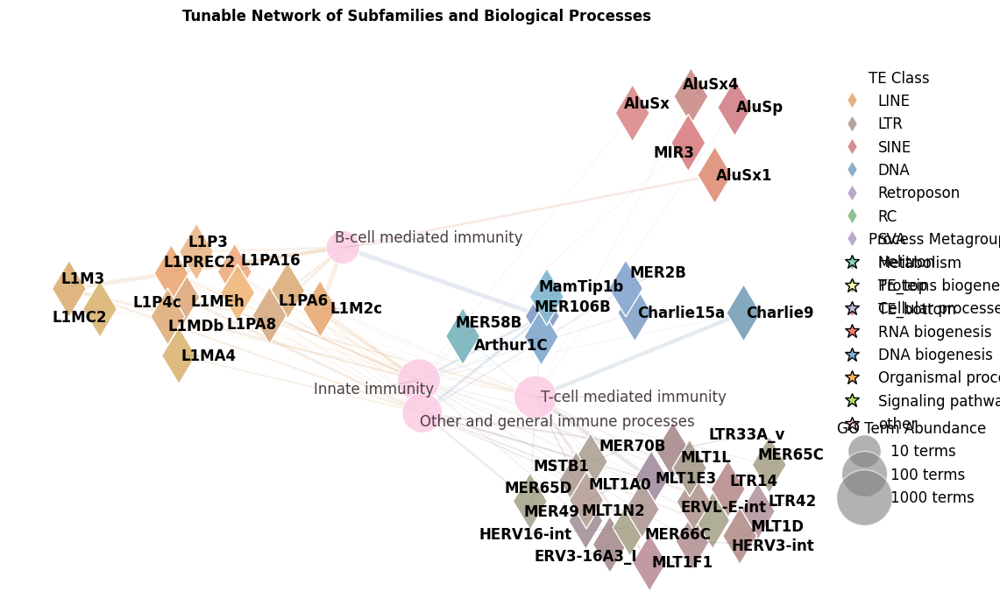

Success: Refactored network with high-contrast functional labels and size legend saved to plots/TE_GO_Immune_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg


In [25]:
GLOBAL_FONT_SIZE = 12

# Hierarchy Toggle
SHOW_METAGROUP_STARS = (
    False  # True: Show stars and connections; False: Only show functional circles
)


# Layout Dynamics
LAYOUT_K_FACTOR = 0.2  # Higher = stronger repulsion between all nodes
LAYOUT_ITERATIONS = 250  # More iterations for a more stable physics state
LAYOUT_SEED = 42
JITTER_STRENGTH = 0.08  # Randomness added to node positions to break geometric patterns

# Clustering Strength
# Lower this value if subfamilies of the same class are too tightly packed
CLASS_GROUPING_WEIGHT = 112.5

# Color Customization (REFACTORED: Now Parametrizable)
USE_COLOR_JITTER = True  # Toggle unique shades for subfamilies of the same class
COLOR_JITTER_AMOUNT = 0.1  # Intensity of the color shift (0.0 to 1.0)
# NEW: Controls how much lighter subfamily rhomboids are (0.0 = original, 1.0 = white)
SUBFAMILY_LIGHTNESS_FACTOR = 0.5

# Node Sizes (Area-based)
METAGROUP_STAR_SIZE = 2000
FUNCTIONAL_CIRCLE_SCALE = 700  # Multiplier for log-proportional sizing
SUBFAMILY_RHOMBOID_SIZE = 1100

# Edge Visuals
META_GROUP_EDGE_WIDTH = 2.0
META_GROUP_ALPHA = 0.15
SUBFAM_GROUP_WIDTH_SCALE = 20.0  # Multiplier for fraction-based widths
SUBFAM_GROUP_ALPHA = 0.22

# Collision & Overlap Management (Physics refinement)
COLLISION_MIN_DIST = 0.3  # Overlap penalty (multiplier for node radii sum)
COLLISION_ITERATIONS = 120  # Intensity of the post-layout relaxation step
NODE_RADIUS_DIVISOR = 250  # Maps area-based sizes into coordinate units

# --- 2. Helper Functions ---


def lighten_color(color, amount=0.3):
    """
    Lightens a color by blending it with white for better contrast with black labels.
    """
    try:
        rgb = np.array(mcolors.to_rgb(color))
        # Move RGB values towards white (1, 1, 1)
        light_rgb = rgb + (np.array([1, 1, 1]) - rgb) * amount
        return mcolors.to_hex(np.clip(light_rgb, 0, 1))
    except:
        return color


def darken_color(color, amount=0.3):
    """Slightly darkens a color (hex or RGB) for better label contrast."""
    try:
        rgb = np.array(mcolors.to_rgb(color))
        dark_rgb = np.clip(rgb * (1 - amount), 0, 1)
        return mcolors.to_hex(dark_rgb)
    except:
        return color


def get_jittered_color(hex_color, seed_name, amount=0.18):
    """Perturbs RGB values based on seed for intra-class subfamily differentiation."""
    try:
        rgb = np.array(mcolors.to_rgb(hex_color))
        rng = np.random.default_rng(sum(ord(c) for c in seed_name))
        jitter = rng.uniform(-amount, amount, 3)
        return mcolors.to_hex(np.clip(rgb + jitter, 0, 1))
    except:
        return hex_color


def prevent_collisions(pos, node_sizes, iterations, min_dist_factor, jitter):
    """Manually relaxes node positions to prevent 3+ nodes from overlapping."""
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())
    radii = {n: np.sqrt(node_sizes[n]) / NODE_RADIUS_DIVISOR for n in nodes}

    for _ in range(iterations):
        if jitter > 0:
            for n in nodes:
                new_pos[n] += np.random.normal(0, jitter * 0.05, 2)
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)
                target_dist = (radii[n1] + radii[n2]) * min_dist_factor
                if dist < target_dist and dist > 0:
                    push = (target_dist - dist) / dist * 0.5 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
                elif dist == 0:
                    new_pos[n1] += np.random.normal(0, 0.05, 2)
    return new_pos


# --- 3. Data Processing & Graph Building ---

group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}
G = nx.Graph()

# Group totals for normalization
group_totals = counts_by_group.groupby("Functional Group")["count"].sum().to_dict()

# Add Metagroup Nodes (Stars) - Optional based on flag
if SHOW_METAGROUP_STARS:
    for meta, color in metagroup_palette.items():
        G.add_node(meta, type="meta", color=color, label=meta, size=METAGROUP_STAR_SIZE)

# Process Rows
subfam_colors = {}
for _, row in counts_by_group.iterrows():
    subfam = row["subfamily_name"]
    group = row["Functional Group"]
    cls = row["class_name"]
    val = row["count"]
    if val == 0:
        continue

    if subfam not in G:
        base_color = class_names_p.get(cls, "#808080")
        if USE_COLOR_JITTER:
            final_color = get_jittered_color(
                base_color, subfam, amount=COLOR_JITTER_AMOUNT
            )
        else:
            final_color = base_color

        # NEW: Apply lightness adjustment for text contrast
        subfam_colors[subfam] = lighten_color(
            final_color, amount=SUBFAMILY_LIGHTNESS_FACTOR
        )

        G.add_node(
            subfam,
            type="subfam",
            color=subfam_colors[subfam],
            class_name=cls,
            label=subfam,
            size=SUBFAMILY_RHOMBOID_SIZE,
        )

    if group not in G:
        meta = group_to_meta.get(group, "other")
        meta_color = metagroup_palette.get(meta, "gray")
        g_size = np.log10(group_totals.get(group, 1) + 1) * FUNCTIONAL_CIRCLE_SCALE
        G.add_node(group, type="group", color=meta_color, size=g_size, label=group)

        if SHOW_METAGROUP_STARS:
            G.add_edge(meta, group, weight=10, type="meta_group")

    fraction = val / group_totals[group]
    G.add_edge(subfam, group, weight=fraction, type="subfam_group", raw_count=val)

# --- 4. Layout Generation ---

H = G.copy()
subfam_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
for i in range(len(subfam_nodes)):
    for j in range(i + 1, len(subfam_nodes)):
        n1, n2 = subfam_nodes[i], subfam_nodes[j]
        if G.nodes[n1]["class_name"] == G.nodes[n2]["class_name"]:
            H.add_edge(n1, n2, weight=CLASS_GROUPING_WEIGHT)

print("Calculating hierarchical network layout...")
pos = nx.spring_layout(
    H,
    k=LAYOUT_K_FACTOR / np.sqrt(len(G)),
    iterations=LAYOUT_ITERATIONS,
    seed=LAYOUT_SEED,
    weight="weight",
)

node_sizes_dict = {n: G.nodes[n]["size"] for n in G.nodes}
pos = prevent_collisions(
    pos,
    node_sizes_dict,
    iterations=COLLISION_ITERATIONS,
    min_dist_factor=COLLISION_MIN_DIST,
    jitter=JITTER_STRENGTH,
)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(12, 8))
ax.axis("off")

# A) Draw Edges
edges = G.edges(data=True)
for u, v, d in edges:
    if d["type"] == "meta_group":
        if not SHOW_METAGROUP_STARS:
            continue
        width, alpha, color = META_GROUP_EDGE_WIDTH, META_GROUP_ALPHA, "gray"
    else:
        width = d["weight"] * SUBFAM_GROUP_WIDTH_SCALE
        alpha = SUBFAM_GROUP_ALPHA
        color = (
            G.nodes[u]["color"]
            if G.nodes[u]["type"] == "subfam"
            else G.nodes[v]["color"]
        )
    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)], width=width, edge_color=color, alpha=alpha, ax=ax
    )

# B) Nodes
if SHOW_METAGROUP_STARS:
    meta_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "meta"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=meta_nodes,
        node_shape="*",
        node_size=METAGROUP_STAR_SIZE,
        node_color=[G.nodes[n]["color"] for n in meta_nodes],
        edgecolors="black",
        linewidths=0.6,
        ax=ax,
    )

group_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "group"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=group_nodes,
    node_shape="o",
    node_size=[G.nodes[n]["size"] for n in group_nodes],
    node_color=[G.nodes[n]["color"] for n in group_nodes],
    edgecolors="white",
    linewidths=0.8,
    alpha=0.9,
    ax=ax,
)

subf_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=subf_nodes,
    node_shape="d",
    node_size=SUBFAMILY_RHOMBOID_SIZE,
    node_color=[G.nodes[n]["color"] for n in subf_nodes],
    edgecolors="white",
    linewidths=1.0,
    ax=ax,
)

# C) Labels
texts = []
for node, (x, y) in pos.items():
    d = G.nodes[node]
    weight = "bold" if d["type"] != "group" else "normal"

    if d["type"] == "group":
        label_color = darken_color(d["color"], amount=0.7)
    elif d["type"] == "subfam":
        label_color = "black"
    else:  # Meta
        if not SHOW_METAGROUP_STARS:
            continue
        label_color = "black"

    texts.append(
        ax.text(
            x,
            y,
            d["label"],
            fontsize=GLOBAL_FONT_SIZE,
            fontweight=weight,
            color=label_color,
            ha="center",
            va="center",
        )
    )

print("Optimizing label placement...")
adjust_text(
    texts,
    ax=ax,
    expand_points=(1.8, 1.8),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.4, alpha=0.5),
)

# --- 6. Legends ---
# Use lightened colors in the legend for visual consistency
row_legend = [
    Line2D(
        [0],
        [0],
        marker="d",
        color="w",
        label=l,
        markerfacecolor=lighten_color(c, SUBFAMILY_LIGHTNESS_FACTOR),
        markersize=10,
    )
    for l, c in class_names_p.items()
]

meta_legend = [
    Line2D(
        [0],
        [0],
        marker="*",
        color="w",
        label=l,
        markerfacecolor=c,
        markersize=12,
        markeredgecolor="k",
    )
    for l, c in metagroup_palette.items()
]

size_counts = [10, 100, 1000]
size_legend = []
for count in size_counts:
    area = np.log10(count + 1) * FUNCTIONAL_CIRCLE_SCALE
    m_size = np.sqrt(area)
    size_legend.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{count} terms",
            markerfacecolor="gray",
            markersize=m_size,
            alpha=0.6,
        )
    )

leg1 = ax.legend(
    handles=row_legend,
    title="TE Class",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg1)
leg2 = plt.legend(
    handles=meta_legend,
    title="Process Metagroup",
    loc="upper left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg2)
plt.legend(
    handles=size_legend,
    title="GO Term Abundance",
    loc="upper left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)

plt.title(
    f"Tunable Network of Subfamilies and Biological Processes",
    fontsize=GLOBAL_FONT_SIZE,
    weight="bold",
    pad=30,
)

# --- 7. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = (
    "plots/TE_GO_Immune_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg"
)
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")
plt.show()

print(
    f"Success: Refactored network with high-contrast functional labels and size legend saved to {save_path}"
)

### Correlation of GO terms number with other subfamily-level covariates

In [26]:
top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
classification = pd.read_csv("Subfamilies_classified - Classification.csv")

top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)
top_5_perc_genes_by_subfamilies

,Unnamed: 0.1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name,GO Term Name,Functional Group,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,0,10,GO:0005515,protein binding,MF,2.747450e-12,5.150370e-08,1.192534,801,13442,"['ABCC4', 'ABCF1', 'ABI1', 'ACACB', 'ACAP1', '...","['A1CF', 'A2M', 'AAAS', 'AACS', 'AADAC', 'AAGA...",AluJb,SINE,protein binding,Too general,NaN,protein binding,Match
1,1,4,GO:0005634,nucleus,CC,1.064992e-10,9.982175e-07,1.320228,423,6412,"['AARS1', 'ABI1', 'ACACB', 'ACTB', 'ACTL6B', '...","['A1CF', 'AAAS', 'AARS1', 'AARSD1', 'AASS', 'A...",AluJb,SINE,nucleus,Too general,NaN,nucleus,Match
2,2,5,GO:0005654,nucleoplasm,CC,5.669238e-09,3.542518e-05,1.415588,255,3605,"['ABCF1', 'ACTB', 'ADD1', 'AHCTF1', 'ALKBH2', ...","['A1CF', 'AAAS', 'ABCA6', 'ABCF1', 'ABHD14B', ...",AluJb,SINE,nucleoplasm,Too general,NaN,nucleoplasm,Match
3,3,6,GO:0005829,cytosol,CC,2.641547e-08,1.237961e-04,1.320685,333,5046,"['AARS1', 'ABCF1', 'ABI1', 'ACACB', 'ACOT12', ...","['AACS', 'AAGAB', 'AAK1', 'AAMP', 'AANAT', 'AA...",AluJb,SINE,cytosol,Too general,NaN,cytosol,Match
4,4,11,GO:0003723,RNA binding,MF,1.738969e-07,6.519742e-04,1.610957,123,1528,"['AARS1', 'ABCF1', 'ADD1', 'AICDA', 'ALDH6A1',...","['A1CF', 'AARS1', 'AARS2', 'AATF', 'ABCF1', 'A...",AluJb,SINE,RNA binding,Too general,NaN,RNA binding,Match
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1226,0,0,GO:0005131,growth hormone receptor binding,MF,3.626961e-06,6.799102e-02,94.740659,3,10,"['CSH1', 'CSH2', 'CSHL1']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X6a_DNA,DNA,growth hormone receptor binding,Signaling pathways,NaN,growth hormone receptor binding,Match
1227,0,1,GO:0005131,growth hormone receptor binding,MF,1.846278e-07,3.461033e-03,72.296855,4,10,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['CSH1', 'CSH2', 'CSHL1', 'GH1', 'GH2', 'JAK1'...",X7A_LINE,LINE,growth hormone receptor binding,Signaling pathways,NaN,growth hormone receptor binding,Match
1228,1,0,GO:0060396,growth hormone receptor signaling pathway,BP,1.174440e-06,1.100803e-02,48.197904,4,15,"['CSH2', 'CSHL1', 'GH1', 'GH2']","['A1BG', 'CSF2RA', 'CSH1', 'CSH2', 'CSHL1', 'G...",X7A_LINE,LINE,growth hormone receptor signaling pathway,Signaling pathways,NaN,growth hormone receptor signaling pathway,Match
1229,0,0,GO:0160063,multi-pass transmembrane protein insertion int...,BP,5.225858e-07,4.898196e-03,177.395062,3,9,"['NOMO1', 'NOMO2', 'NOMO3']","['CCDC47', 'NCLN', 'NOMO1', 'NOMO2', 'NOMO3', ...",X9_LINE,LINE,multi-pass transmembrane protein insertion int...,Exosomes and vesicles,NaN,multi-pass transmembrane protein insertion int...,Match


In [62]:
repeat_masker = pd.read_csv("../T2T_article/T2T_repeat_masker_processed.csv")
repeat_masker.columns = [
    "Unnamed: 0",
    '#"chrom"',
    "chromStart",
    "chromEnd",
    "score",
    "subfamily_name",
    "family_name",
    "class_name",
]
repeat_masker["length"] = repeat_masker["chromEnd"] - repeat_masker["chromStart"]


enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["OR_Observed_to_Random_Log"] = np.log10(
    enrichment_df_subfamilies.OR_Observed_to_Random
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

average_length = (
    repeat_masker[["subfamily_name", "length", "score"]]
    .groupby("subfamily_name")
    .mean()
)
enrichment_df_subfamilies["Average_length"] = list(
    average_length["length"].reindex(enrichment_df_subfamilies["subfamily_name"])
)

enrichment_df_subfamilies = enrichment_df_subfamilies.merge(
    repeat_masker[["subfamily_name", "family_name"]].drop_duplicates(),
    how="left",
    left_on="subfamily_name",
    right_on="subfamily_name",
)
enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]

enrichment_df_subfamilies["GO_terms_count"] = (
    top_5_perc_genes_by_subfamilies.value_counts("subfamily_name")
)
enrichment_df_subfamilies.dropna()

/tmp/ipykernel_129/3509841126.py:20: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_subfamilies["Status"][
/tmp/ipykernel_129/3509841126.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,OR_Observed_to_Random_Log,Enrichment_p_value_adjusted_log,Average_length,family_name,GO_terms_count
subfamily_name,,,,,,,,,,,,,,,,,,,,,
MLT1H2,MLT1H2,MLT1H2,LTR,310,3839,0.918031,1.529286e-01,2.226719e-01,247.151613,253.349831,...,0.000,0.003992,0.010707,Significant,0.572018,-0.242591,-0.652335,684.305548,ERVL-MaLR,2.0
L1MA4,L1MA4,L1MA4,LINE,827,6651,1.483994,5.030848e-24,3.911741e-23,151.654172,154.966622,...,0.000,0.003992,0.010707,Significant,0.552571,-0.257612,-22.407630,6441.394527,L1,7.0
AluY,AluY,AluY,SINE,17358,111981,1.917184,0.000000e+00,0.000000e+00,71.249510,81.135103,...,0.000,0.003992,0.010707,Significant,1.248595,0.096422,-inf,317.880131,Alu,25.0
MIRb,MIRb,MIRb,SINE,33131,206087,2.002041,0.000000e+00,0.000000e+00,282.243820,289.915744,...,0.000,0.003992,0.010707,Significant,1.305365,0.115732,-inf,310.400108,MIR,1.0
MER31B,MER31B,MER31B,LTR,157,1153,1.647358,3.744929e-08,1.417369e-07,187.089172,193.520382,...,0.812,0.812000,0.864973,Non-Significant,1.021158,0.009093,-6.848517,705.641804,ERV1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MER83B-int,MER83B-int,MER83B-int,LTR,11,66,2.090150,4.468002e-02,7.543466e-02,166.000000,167.318182,...,0.852,0.852000,0.893428,Non-Significant,0.781587,-0.107023,-1.122429,5463.954545,ERV1,1.0
MER76-int,MER76-int,MER76-int,LTR,9,45,2.612688,1.450369e-02,2.795567e-02,247.000000,234.844444,...,0.912,0.912000,0.937424,Non-Significant,0.909464,-0.041214,-1.553530,6742.133333,ERVL,2.0
MER57E3,MER57E3,MER57E3,LTR,101,154,19.915590,7.263886e-68,1.078262e-66,183.544554,185.577922,...,0.000,0.003992,0.010707,Significant,11.618462,1.065149,-65.967276,977.396104,ERV1,16.0


In [30]:
enrichment_df_subfamilies.columns

Index(['subfamily_name', 'subfamily_name.1', 'class_name',
       'Observed_TEs_number', 'Total_TEs_number', 'Observed_Odds_Ratio',
       'Enrichment_p_value', 'Enrichment_p_value_adjusted',
       'Average_divergence_genes', 'Average_divergence_all',
       'Observed_TEs_number_log', 'Total_TEs_number_log',
       'Random_Odds_Ratio_Mean', 'Random_Odds_Ratio_SD',
       'Random_Odds_Ratio_Quantile_Of_Observed', 'p_raw_empirical',
       'p_raw_empirical_clamped', 'p_adjusted_empirical_bh', 'Status',
       'OR_Observed_to_Random', 'Enrichment_p_value_adjusted_log',
       'GO_terms_count'],
      dtype='object')

-0.008464496945424796 0.8981856818913626
Plot saved to ./plots/GO_terms_count_vs_Average_length_subfamilies.svg


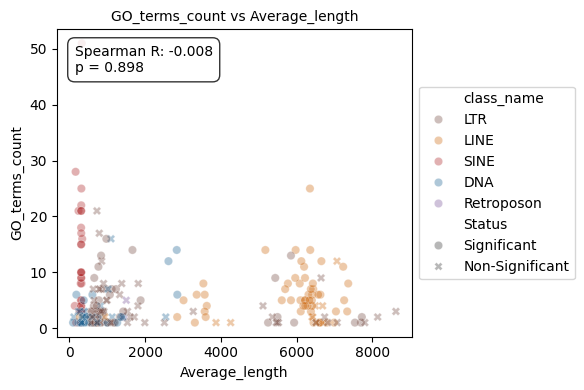

In [63]:
column1 = "Average_length"
column2 = "GO_terms_count"

fig, ax = plt.subplots(figsize=(7, 4))

data_to_plot = enrichment_df_subfamilies[enrichment_df_subfamilies[column2] > 0]

corr_data = data_to_plot.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.spearmanr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Spearman R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Spearman R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    ax=ax,
    alpha=0.35,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=10,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)
# --- ADDED: Draw Linear Trend Line (using numpy.polyfit) ---
if len(corr_data) < 2:
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )

# ax.set(xscale="log")

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_subfamilies.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

Correlation with GO terms count of a specific functional group?

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Significant vs. Non-Significant: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.040e-04 U_stat=7.685e+03
./plots/boxplot_of_GO_terms_count_Status_subfamilies.svg


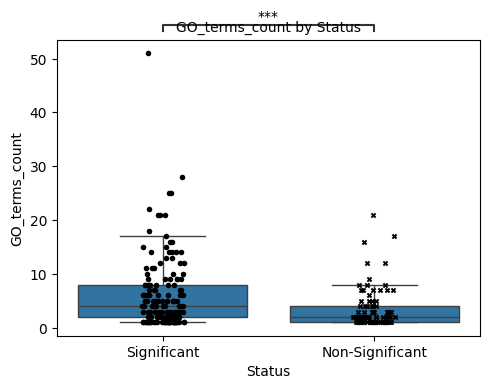

In [37]:
# Set the font type for a clean SVG
plt.rcParams["svg.fonttype"] = "none"

x_name = "Status"
y_name = "GO_terms_count"

figure, ax = plt.subplots(
    figsize=(5, 4),  # Increased height for stats
)

sns.boxplot(
    data=enrichment_df_subfamilies,
    x=x_name,
    y=y_name,
    ax=ax,
    # palette=class_names_p,
    boxprops={"alpha": 1},  # Make boxes slightly transparent,
    showfliers=False,
)

# --- 2. Draw Stripplot in two layers for different markers ---

# Layer A: Significant points (Circles)
sns.stripplot(
    data=enrichment_df_subfamilies[
        enrichment_df_subfamilies["Status"] == "Significant"
    ],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="o",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

sns.stripplot(
    data=enrichment_df_subfamilies[
        enrichment_df_subfamilies["Status"] == "Non-Significant"
    ],
    x=x_name,
    y=y_name,
    ax=ax,
    color="black",
    marker="X",  # Circle
    # palette = class_names_p,
    size=4,
    alpha=1,
    jitter=True,
    label="Significant",
    legend=False,
    zorder=3,
)

# --- 3. Generate All-vs-All Pairs ---
plot_order = [tick.get_text() for tick in ax.get_xticklabels()]

# This generates every unique pair possible from your classes
box_pairs = list(itertools.combinations(plot_order, 2))

# --- 4. Configure Annotator ---
annotator = Annotator(
    ax, box_pairs, data=enrichment_df_subfamilies, x=x_name, y=y_name, order=plot_order
)

annotator.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="outside",
    comparisons_correction="BH",
    verbose=2,
)

# Apply the test and draw the annotations
annotator.apply_and_annotate()
# --- 6. Tidy Up and Save ---

ax.set_title(f"{y_name} by {x_name}", fontsize=10)
# ax.set_xlabel(x_name, fontsize=10)
# ax.set_ylabel(y_name, fontsize=10)

# Rotate x-axis labels for better readability
plt.xticks(rotation=0, ha="center")

# Ensure the plot layout is clean
figure.tight_layout()

# Save to SVG
save_path = f"./plots/boxplot_of_{y_name}_{x_name}_subfamilies.svg"
figure.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)
print(save_path)
plt.show()

/tmp/ipykernel_129/3848288152.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_129/3848288152.py:22: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  _, p = stats.mannwhitneyu(d1, d2)
/tmp/ipykernel_129/3848288152.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


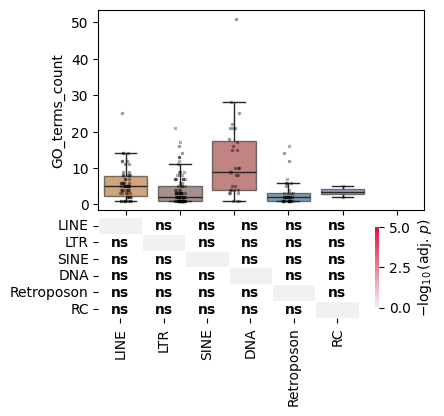

Success: Adjusted significance plot saved to ./plots/boxplot_with_matrix_GO_terms_count_class_name_subfamilies.svg


In [41]:
x_name = "class_name"
y_name = "GO_terms_count"
# Use categorical order to ensure alignment

data_to_plot = enrichment_df_subfamilies[
    (enrichment_df_subfamilies["Observed_Odds_Ratio"] > 0)
    # & (enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05)
]
data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
data_to_plot = data_to_plot.dropna(subset=[x_name, y_name])

plot_order = class_names

# --- 2. Calculate All-vs-All Statistics with BH Correction ---
# Generate every unique pair
box_pairs = list(itertools.combinations(plot_order, 2))
pair_results = []

for g1, g2 in box_pairs:
    d1 = data_to_plot[data_to_plot[x_name] == g1][y_name]
    d2 = data_to_plot[data_to_plot[x_name] == g2][y_name]
    _, p = stats.mannwhitneyu(d1, d2)
    pair_results.append({"g1": g1, "g2": g2, "p_raw": p})

# Perform Benjamini-Hochberg adjustment
raw_p_values = [res["p_raw"] for res in pair_results]
_, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")

# Construct the adjusted p-value matrix
p_matrix_adj = pd.DataFrame(index=plot_order, columns=plot_order, dtype=float)
np.fill_diagonal(p_matrix_adj.values, 1.0)

for i, res in enumerate(pair_results):
    g1, g2 = res["g1"], res["g2"]
    p_adj = adj_p_values[i]
    p_matrix_adj.loc[g1, g2] = p_adj
    p_matrix_adj.loc[g2, g1] = p_adj

# Apply -log10 transformation for the heatmap colors
neg_log_p = -np.log10(p_matrix_adj.astype(float) + 1e-300)

# --- 3. Visualization ---
# GridSpec: aligned horizontally by using the same column in the grid
fig = plt.figure(figsize=(4.2, 4))
gs = GridSpec(2, 1, height_ratios=[2, 1], hspace=0.05)

ax_box = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# --- A) The Boxplot ---
sns.boxplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    palette=class_names_p,
    boxprops={"alpha": 0.6},
    showfliers=False,
)

# Layer A: Significant points (Circles)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] == "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="o",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# Layer B: Non-Significant points (Xs)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] != "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="X",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# ax_box.set_yscale("log")
# ax_box.set_title(f"{y_name} by {x_name}", fontsize=14, pad=10)
ax_box.set_xlabel("")
# Hide x-labels on the boxplot to let the heatmap labels serve both
ax_box.tick_params(labelbottom=False)

# --- B) The Significance Heatmap (Matrix) ---
cmap = sns.light_palette("crimson", as_cmap=True)
# square=False ensures it spans the same horizontal width as the boxplot
sns.heatmap(
    neg_log_p,
    ax=ax_heat,
    cmap=cmap,
    cbar=True,
    annot=False,
    square=False,
    linewidths=0.5,
    linecolor="white",
    vmin=0,
    vmax=5,
    cbar_kws={"label": r"$-\log_{10}(\text{adj. } p)$", "shrink": 0.8},
)

# Add Stars/ns as annotations inside the heatmap cells (using adjusted p)
for i in range(len(plot_order)):
    for j in range(len(plot_order)):
        p_adj = p_matrix_adj.iloc[i, j]
        if i == j:
            text = ""
        elif p_adj < 0.001:
            text = "***"
        elif p_adj < 0.01:
            text = "**"
        elif p_adj < 0.05:
            text = "*"
        else:
            text = "ns"
        ax_heat.text(
            j + 0.5,
            i + 0.5,
            text,
            ha="center",
            va="center",
            fontsize=10,
            weight="bold",
            color="white" if p_adj < 0.01 else "black",
        )

# ax_heat.set_title("Pairwise Significance Matrix (Mann-Whitney U + BH FDR)", fontsize=12)

# --- 4. Tidy Up and Save ---
save_path = f"./plots/boxplot_with_matrix_{y_name}_{x_name}_subfamilies.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print(f"Success: Adjusted significance plot saved to {save_path}")

### Classification of signaling pathways

In [ ]:
like immunity

In [47]:
subfamilies_by_classes_TE

,class_name,subfamily_name,count
0,SINE,AluSx,51
1,SINE,FLAM_C,28
2,LINE,L1M3,25
3,SINE,AluY,25
4,SINE,AluSq2,22
...,...,...,...
225,LTR,MLT1H,1
226,LTR,MLT1J1,1
227,SINE,AluYf1,1
228,SINE,FRAM,1


In [45]:
pd.read_csv("families_by_classes_TE.csv")

,Unnamed: 0,class_name,family_name
0,0,LINE,L1
1,1,LTR,ERV1
2,4,LTR,ERVL-MaLR
3,10,SINE,Alu
4,14,SINE,MIR
5,20,DNA,hAT-Charlie
6,21,DNA,MULE-MuDR
7,25,DNA,TcMar-Tigger
8,47,LINE,L2
9,71,LINE,RTE-X


### Comparison of subfamilies with their respective classes by Sabkey plots

In [55]:
top_5_perc_genes_manual = pd.read_csv(
    "GO_top_5_perc_genes_by_class_gemini_manual.csv", sep=";"
)
top_5_perc_genes_manual.columns = [
    "Column1",
    "Unnamed: 0",
    "Term ID",
    "Term Name",
    "Term Database",
    "P-value",
    "FDR",
    "Fold Enrichment",
    "Overlap Count",
    "Total Term Genes (Human)",
    "Overlapping Genes",
    "Full Term Gene List",
    "class_name",
    "Term ID Gemini",
    "Functional Group",
]
top_5_perc_genes_manual["family_name"] = top_5_perc_genes_manual["class_name"]

top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
classification = pd.read_csv("Subfamilies_classified - Classification.csv")

top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)

subfamilies_by_classes = (
    top_5_perc_genes_by_subfamilies[["class_name", "subfamily_name"]]
    .value_counts()
    .reset_index()
    .set_index("subfamily_name")
)
subfamilies_by_classes = subfamilies_by_classes["class_name"].to_dict()

counts_by_group_classes = (
    top_5_perc_genes_manual[["class_name", "Functional Group"]]
    .value_counts()
    .reset_index()
)
# counts_by_group_classes = counts_by_group_classes[counts_by_group_classes['count'] > 1]
# counts_by_group_classes = counts_by_group_classes[~counts_by_group_classes['class_name'].str.contains('TE_')]

counts_by_group_subfamilies = (
    top_5_perc_genes_by_subfamilies[
        ["class_name", "subfamily_name", "Functional Group"]
    ]
    .value_counts()
    .reset_index()
)
counts_by_group_subfamilies = counts_by_group_subfamilies[
    counts_by_group_subfamilies["count"] > 5
]

counts_by_group_subfamilies

,class_name,subfamily_name,Functional Group,count
0,SINE,AluSx,Too general,15
1,DNA,MER106B,Other immune processes,13
2,LINE,L1M3,Other immune processes,11
3,SINE,AluY,Too general,11
4,SINE,AluSx4,Too general,10
5,LTR,MLT1E3,Other immune processes,10
6,SINE,AluSx1,Too general,10
7,LTR,MER68,Lipids metabolism,10
8,DNA,Charlie9,Other immune processes,10
9,SINE,FLAM_C,Too general,9


In [ ]:
counts_by_group_families, counts_by_group_classes, families_by_classes

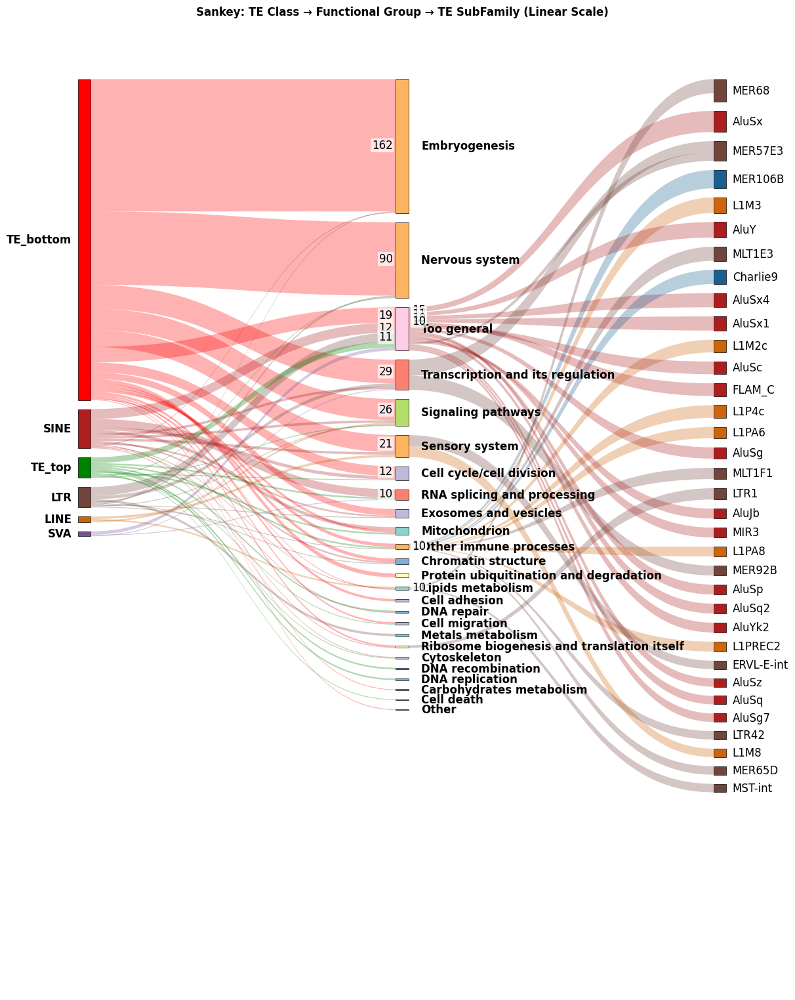

Success: Sankey plot with statistical stars and ribbon labels saved to plots/TE_GO_Sankey_Classes_and_SubFamilies_5.svg


In [60]:
# --- 1. Global Parameters & Palettes ---
GLOBAL_FONT_SIZE = 12
# Toggle between Linear and Logarithmic scale for bar/ribbon heights
USE_LOG_SCALE = False
# Minimum count threshold to display number labels on ribbons
RIBBON_LABEL_THRESHOLD = 10

# --- 3. Statistical Calculations ---


def perform_enrichment_testing(df_f, df_c, fam_class_map):
    """Calculates Fisher's enrichment for each SubFamily-Group pair against its Class."""
    class_group_totals = df_c.set_index(["class_name", "Functional Group"])[
        "count"
    ].to_dict()
    class_all_totals = df_c.groupby("class_name")["count"].sum().to_dict()
    fam_all_totals = df_f.groupby("subfamily_name")["count"].sum().to_dict()

    p_values = []

    for _, row in df_f.iterrows():
        f_name, g_name, a = row["subfamily_name"], row["Functional Group"], row["count"]
        c_name = fam_class_map.get(f_name, "other")

        b = fam_all_totals.get(f_name, a) - a
        c_g_val = class_group_totals.get((c_name, g_name), a)
        c = max(0, c_g_val - a)
        c_total = class_all_totals.get(c_name, a + b + c)
        d = max(0, (c_total - c_g_val) - b)

        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values.append(p)

    _, p_adj, _, _ = multipletests(p_values, method="fdr_bh")

    def p_to_stars(p):
        if p < 0.001:
            return "***"
        if p < 0.01:
            return "**"
        if p < 0.05:
            return "*"
        return "ns"

    df_f["p_adj"] = p_adj
    df_f["stars"] = df_f["p_adj"].apply(p_to_stars)
    return df_f


counts_by_group_subfamilies = perform_enrichment_testing(
    counts_by_group_subfamilies, counts_by_group_classes, subfamilies_by_classes
)

# Apply scaling transformation
if USE_LOG_SCALE:
    counts_by_group_classes["plot_count"] = np.log10(
        counts_by_group_classes["count"] + 1
    )
    counts_by_group_subfamilies["plot_count"] = np.log10(
        counts_by_group_subfamilies["count"] + 1
    )
else:
    counts_by_group_classes["plot_count"] = counts_by_group_classes["count"]
    counts_by_group_subfamilies["plot_count"] = counts_by_group_subfamilies["count"]

group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}

# --- 4. Geometry & Drawing Helpers ---


def get_bezier_ribbon(x1, y1_start, y1_end, x2, y2_start, y2_end):
    """Generates a Path object for a curved Sankey ribbon."""
    verts = [
        (x1, y1_start),
        (x1 + (x2 - x1) / 2, y1_start),
        (x1 + (x2 - x1) / 2, y2_start),
        (x2, y2_start),
        (x2, y2_end),
        (x1 + (x2 - x1) / 2, y2_end),
        (x1 + (x2 - x1) / 2, y1_end),
        (x1, y1_end),
        (x1, y1_start),
    ]
    codes = [
        Path.MOVETO,
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4,
        Path.LINETO,
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4,
        Path.CLOSEPOLY,
    ]
    return Path(verts, codes)


def plot_sankey():
    fig, ax = plt.subplots(figsize=(15, 19))
    ax.set_xlim(-0.2, 2.2)
    ax.set_ylim(-1, 1.1)
    ax.axis("off")

    X_CLASS = 0
    X_GROUP = 1
    X_FAM = 2
    BAR_WIDTH = 0.04
    GAP_Y = 0.02

    # A) Pre-calculate Vertical Positions
    total_val = counts_by_group_classes["plot_count"].sum()

    # 1. Classes
    class_totals = (
        counts_by_group_classes.groupby("class_name")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    class_pos = {}
    curr_y = 1.0
    for name, val in class_totals.items():
        h = val / total_val * 0.9
        class_pos[name] = (curr_y - h, curr_y)
        rect = patches.Rectangle(
            (X_CLASS - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=class_names_p.get(name, "gray"),
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_CLASS - 0.04,
            curr_y - h / 2,
            name,
            ha="right",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
            fontweight="bold",
        )
        curr_y -= h + GAP_Y

    # 2. Functional Groups
    group_totals = (
        counts_by_group_classes.groupby("Functional Group")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    group_pos = {}
    curr_y = 1.0
    for name, val in group_totals.items():
        h = val / total_val * 0.9
        group_pos[name] = (curr_y - h, curr_y)
        meta = group_to_meta.get(name, "other")
        color = metagroup_palette.get(meta, "gray")
        rect = patches.Rectangle(
            (X_GROUP - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=color,
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_GROUP + 0.06,
            curr_y - h / 2,
            name,
            ha="left",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
            fontweight="bold",
        )
        curr_y -= h + GAP_Y

    # 3. Families
    fam_totals_df = (
        counts_by_group_subfamilies.groupby("subfamily_name")["plot_count"]
        .sum()
        .sort_values(ascending=False)
    )
    total_fam_val = fam_totals_df.sum()
    family_pos = {}
    curr_y = 1.0
    for name, val in fam_totals_df.items():
        h = val / total_fam_val * 0.9
        family_pos[name] = (curr_y - h, curr_y)
        cls = subfamilies_by_classes.get(name, "other")
        rect = patches.Rectangle(
            (X_FAM - BAR_WIDTH / 2, curr_y - h),
            BAR_WIDTH,
            h,
            facecolor=class_names_p.get(cls, "gray"),
            ec="black",
            lw=0.5,
        )
        ax.add_patch(rect)
        ax.text(
            X_FAM + 0.04,
            curr_y - h / 2,
            name,
            ha="left",
            va="center",
            fontsize=GLOBAL_FONT_SIZE,
        )
        curr_y -= h + GAP_Y

    # B) Draw Ribbons

    # 1. Class -> Group
    class_offsets = {n: class_pos[n][1] for n in class_totals.index}
    group_offsets_L = {n: group_pos[n][1] for n in group_totals.index}

    for _, row in counts_by_group_classes.sort_values(
        "plot_count", ascending=False
    ).iterrows():
        c_name, g_name, val_p, raw_val = (
            row["class_name"],
            row["Functional Group"],
            row["plot_count"],
            row["count"],
        )
        if g_name not in group_pos:
            continue

        h_c = val_p / total_val * 0.9
        h_g = val_p / total_val * 0.9

        path = get_bezier_ribbon(
            X_CLASS + BAR_WIDTH / 2,
            class_offsets[c_name] - h_c,
            class_offsets[c_name],
            X_GROUP - BAR_WIDTH / 2,
            group_offsets_L[g_name] - h_g,
            group_offsets_L[g_name],
        )

        ax.add_patch(
            patches.PathPatch(
                path, facecolor=class_names_p.get(c_name, "gray"), alpha=0.3, lw=0
            )
        )

        # Ribbon label at the junction with the central bar
        if raw_val >= RIBBON_LABEL_THRESHOLD:
            ax.text(
                X_GROUP - BAR_WIDTH / 2 - 0.01,
                group_offsets_L[g_name] - h_g / 2,
                str(int(raw_val)),
                ha="right",
                va="center",
                fontsize=GLOBAL_FONT_SIZE,
                bbox=dict(
                    boxstyle="round,pad=0.1",
                    facecolor="white",
                    alpha=0.7,
                    edgecolor="none",
                ),
            )

        class_offsets[c_name] -= h_c
        group_offsets_L[g_name] -= h_g

    # 2. Group -> Family
    group_totals_fam_df = counts_by_group_subfamilies.groupby("Functional Group")[
        "plot_count"
    ].sum()
    group_offsets_R = {n: group_pos[n][1] for n in group_pos}
    fam_offsets = {n: family_pos[n][1] for n in fam_totals_df.index}

    for _, row in counts_by_group_subfamilies.sort_values(
        "plot_count", ascending=False
    ).iterrows():
        f_name, g_name, val_p, raw_val = (
            row["subfamily_name"],
            row["Functional Group"],
            row["plot_count"],
            row["count"],
        )
        if g_name not in group_pos or f_name not in family_pos:
            continue

        visual_h_middle = group_pos[g_name][1] - group_pos[g_name][0]
        h_g = (val_p / group_totals_fam_df[g_name]) * visual_h_middle
        h_f = val_p / total_fam_val * 0.9

        cls = subfamilies_by_classes.get(f_name, "other")
        path = get_bezier_ribbon(
            X_GROUP + BAR_WIDTH / 2,
            group_offsets_R[g_name] - h_g,
            group_offsets_R[g_name],
            X_FAM - BAR_WIDTH / 2,
            fam_offsets[f_name] - h_f,
            fam_offsets[f_name],
        )

        ax.add_patch(
            patches.PathPatch(
                path, facecolor=class_names_p.get(cls, "gray"), alpha=0.3, lw=0
            )
        )

        # Ribbon label at the junction with the central bar
        if raw_val >= RIBBON_LABEL_THRESHOLD:
            ax.text(
                X_GROUP + BAR_WIDTH / 2 + 0.01,
                group_offsets_R[g_name] - h_g / 2,
                str(int(raw_val)),
                ha="left",
                va="center",
                fontsize=GLOBAL_FONT_SIZE,
                bbox=dict(
                    boxstyle="round,pad=0.1",
                    facecolor="white",
                    alpha=0.7,
                    edgecolor="none",
                ),
            )

        # Significance Stars at Family bar entry
        # if row['stars'] != 'ns':
        #     y_star = fam_offsets[f_name] - h_f/2
        #    ax.text(X_FAM - 0.05, y_star, row['stars'], ha='right', va='center',
        #             color='black', fontsize=GLOBAL_FONT_SIZE, fontweight='bold')

        group_offsets_R[g_name] -= h_g
        fam_offsets[f_name] -= h_f

    scale_type = "Log10" if USE_LOG_SCALE else "Linear"
    plt.title(
        f"Sankey: TE Class → Functional Group → TE SubFamily ({scale_type} Scale)",
        fontsize=GLOBAL_FONT_SIZE,
        weight="bold",
        pad=20,
    )

    # Save
    os.makedirs("plots", exist_ok=True)
    save_path = "plots/TE_GO_Sankey_Classes_and_SubFamilies_5.svg"
    plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")
    plt.show()
    print(
        f"Success: Sankey plot with statistical stars and ribbon labels saved to {save_path}"
    )


if __name__ == "__main__":
    plot_sankey()

### Analysis of L1 subfamilies and processes impacted by them

In [5]:
repeat_masker = pd.read_csv("../T2T_article/T2T_repeat_masker_processed.csv")
repeat_masker.columns = [
    "Unnamed: 0",
    '#"chrom"',
    "chromStart",
    "chromEnd",
    "score",
    "subfamily_name",
    "family_name",
    "class_name",
]
repeat_masker["length"] = repeat_masker["chromEnd"] - repeat_masker["chromStart"]


enrichment_df_subfamilies = pd.read_csv(
    "enrichment_subfamilies_with_random.csv", index_col=0
).reset_index()
enrichment_df_subfamilies["Status"] = "Non-Significant"
enrichment_df_subfamilies["Status"][
    enrichment_df_subfamilies["p_adjusted_empirical_bh"] < 0.05
] = "Significant"
enrichment_df_subfamilies["OR_Observed_to_Random"] = (
    enrichment_df_subfamilies["Observed_Odds_Ratio"]
    / enrichment_df_subfamilies["Random_Odds_Ratio_Mean"]
)
enrichment_df_subfamilies["OR_Observed_to_Random_Log"] = np.log10(
    enrichment_df_subfamilies.OR_Observed_to_Random
)
enrichment_df_subfamilies["Enrichment_p_value_adjusted_log"] = np.log10(
    enrichment_df_subfamilies.Enrichment_p_value_adjusted
)

average_length = (
    repeat_masker[["subfamily_name", "length", "score"]]
    .groupby("subfamily_name")
    .mean()
)
enrichment_df_subfamilies["Average_length"] = list(
    average_length["length"].reindex(enrichment_df_subfamilies["subfamily_name"])
)

enrichment_df_subfamilies = enrichment_df_subfamilies.merge(
    repeat_masker[["subfamily_name", "family_name"]].drop_duplicates(),
    how="left",
    left_on="subfamily_name",
    right_on="subfamily_name",
)
enrichment_df_subfamilies.index = enrichment_df_subfamilies["subfamily_name"]

top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")

enrichment_df_subfamilies["GO_terms_count"] = (
    top_5_perc_genes_by_subfamilies.value_counts("subfamily_name")
)
enrichment_df_subfamilies

/tmp/ipykernel_217/3794624263.py:19: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  enrichment_df_subfamilies["Status"][
/tmp/ipykernel_217/3794624263.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,OR_Observed_to_Random_Log,Enrichment_p_value_adjusted_log,Average_length,family_name,GO_terms_count
subfamily_name,,,,,,,,,,,,,,,,,,,,,
L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,192.773111,...,0.000,0.003992,0.010707,Significant,0.664199,-0.177702,-78.936052,8114.222829,L1,NaN
LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,188.019900,...,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.182614,-0.110316,895.686567,ERV1,NaN
MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,166.088095,...,0.000,0.003992,0.010707,Significant,0.411405,-0.385730,-0.951805,892.454762,ERV1,NaN
MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,171.511952,...,0.000,0.003992,0.010707,Significant,0.273644,-0.562813,-3.874878,587.398406,ERVL-MaLR,NaN
MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,106.416760,...,0.024,0.024000,0.052351,Non-Significant,0.778783,-0.108583,-3.399757,1364.835208,ERV1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,168.166667,...,0.584,0.584000,0.688157,Non-Significant,NaN,NaN,-0.891037,8820.416667,ERV1,NaN
HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,143.500000,...,0.348,0.348000,0.465766,Non-Significant,0.000000,-inf,-0.312007,1056.388889,ERV1,NaN
HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,89.750000,...,0.016,0.016000,0.037095,Significant,NaN,NaN,-4.507497,3000.500000,ERV1,NaN


In [67]:
len(
    enrichment_df_subfamilies[enrichment_df_subfamilies["family_name"] == "L1"][
        "subfamily_name"
    ].unique()
)

132

In [6]:
subfamilies_by_classes = (
    pd.read_csv(
        "individuals_by_classes_TE.csv"
    )  # .dropna()#.set_index("subfamily_name")
)[["class_name", "individual_name"]]
subfamilies_by_classes.columns = ["class_name", "subfamily_name"]
subfamilies_by_classes.index = subfamilies_by_classes["subfamily_name"]
subfamily_to_class = subfamilies_by_classes["class_name"].to_dict()


top_5_perc_genes_by_subfamilies = pd.read_csv("top_5_perc_genes_by_subfamilies.csv")
classification = pd.read_csv("Subfamilies_classified - Classification.csv")

top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies.merge(
    classification, how="left", left_on="Term Name", right_on="GO Term Name"
)
top_5_perc_genes_by_subfamilies = top_5_perc_genes_by_subfamilies[
    top_5_perc_genes_by_subfamilies["subfamily_name"].isin(
        enrichment_df_subfamilies[enrichment_df_subfamilies["family_name"] == "L1"][
            "subfamily_name"
        ]
    )
]

top_5_perc_genes_by_subfamilies["subgroup_name"] = "other"
top_5_perc_genes_by_subfamilies["subgroup_name"][top_5_perc_genes_by_subfamilies["subfamily_name"] == "L1HS"] = "L1HS"
top_5_perc_genes_by_subfamilies["subgroup_name"][
    top_5_perc_genes_by_subfamilies["subfamily_name"].str.startswith("L1P")
] = "L1P"
top_5_perc_genes_by_subfamilies["subgroup_name"][
    top_5_perc_genes_by_subfamilies["subfamily_name"].str.startswith("L1PA")
] = "L1PA"
top_5_perc_genes_by_subfamilies["subgroup_name"][
    top_5_perc_genes_by_subfamilies["subfamily_name"].str.startswith("L1PB")
] = "L1PB"
top_5_perc_genes_by_subfamilies["subgroup_name"][
    top_5_perc_genes_by_subfamilies["subfamily_name"].str.startswith("L1M")
] = "L1M"


counts_by_group = (
    top_5_perc_genes_by_subfamilies[
        ["subgroup_name", "subfamily_name", "Functional Group"]
    ]
    .value_counts()
    .reset_index()
)
# counts_by_group['count'] = counts_by_group['count']*10
counts_by_group

counts_by_group

/tmp/ipykernel_217/1251228505.py:26: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  top_5_perc_genes_by_subfamilies["subgroup_name"][top_5_perc_genes_by_subfamilies["subfamily_name"] == "L1HS"] = "L1HS"
/tmp/ipykernel_217/1251228505.py:26: Se

,subgroup_name,subfamily_name,Functional Group,count
0,L1M,L1M3,Other immune processes,11
1,L1M,L1M2c,Other immune processes,9
2,L1P,L1P4c,Other immune processes,9
3,L1PA,L1PA6,Other immune processes,8
4,L1P,L1PREC2,Other immune processes,7
...,...,...,...,...
117,L1PA,L1PA15-16,Lipids metabolism,1
118,L1PA,L1PA3,Too general,1
119,L1PA,L1PA15-16,Sensory system,1
120,L1PA,L1PA8,Too general,1


#### Clustermap of enrichment by groups

{'L1M3': 'L1M',
 'L1MC2': 'L1M',
 'L1PA13': 'L1PA',
 'L1PREC2': 'L1P',
 'L1M2c': 'L1M',
 'L1PA8': 'L1PA',
 'L1PA16': 'L1PA',
 'L1MDb': 'L1M',
 'L1P4': 'L1P',
 'L1MA9': 'L1M',
 'L1MEj': 'L1M',
 'L1PA7': 'L1PA',
 'L1PA3': 'L1PA',
 'L1ME4b': 'L1M',
 'L1PA15-16': 'L1PA',
 'L1MA4': 'L1M',
 'L1P4c': 'L1P',
 'L1PA4': 'L1PA',
 'L1M2a': 'L1M',
 'L1M2': 'L1M',
 'L1M1': 'L1M',
 'L1PA2': 'L1PA',
 'L1PA15': 'L1PA',
 'L1PA5': 'L1PA',
 'L1PB1': 'L1PB',
 'L1PB4': 'L1PB',
 'L1P4e': 'L1P',
 'L1P3': 'L1P',
 'L1PA10': 'L1PA',
 'L1MA5A': 'L1M',
 'L1MA1': 'L1M',
 'L1MA8': 'L1M',
 'L1MA7': 'L1M',
 'L1MA6': 'L1M',
 'L1P2': 'L1P',
 'L1ME3G': 'L1M',
 'L1ME3B': 'L1M',
 'L1MD1': 'L1M',
 'L1MCa': 'L1M',
 'L1MB8': 'L1M',
 'L1MB2': 'L1M',
 'L1M8': 'L1M',
 'L1M7': 'L1M',
 'L1M4': 'L1M',
 'L1M3e': 'L1M',
 'L1MEh': 'L1M',
 'L1ME3A': 'L1M',
 'L1MEc': 'L1M',
 'L1MEf': 'L1M',
 'L1ME3F': 'L1M',
 'L1PA6': 'L1PA',
 'HAL1': 'other',
 'X9_LINE': 'other'}

In [84]:
pivot_counts.index.map(subfamily_to_subgroup)

Index(['other', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M',
       'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M',
       'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M', 'L1M',
       'L1M', 'L1M', 'L1P', 'L1P', 'L1P', 'L1P', 'L1P', 'L1PA', 'L1PA', 'L1PA',
       'L1PA', 'L1PA', 'L1PA', 'L1PA', 'L1PA', 'L1PA', 'L1PA', 'L1PA', 'L1PA',
       'L1PB', 'L1PB', 'L1P', 'other'],
      dtype='object', name='subfamily_name')

/tmp/ipykernel_129/2530702319.py:64: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  star_matrix = p_adj_matrix.applymap(get_stars)


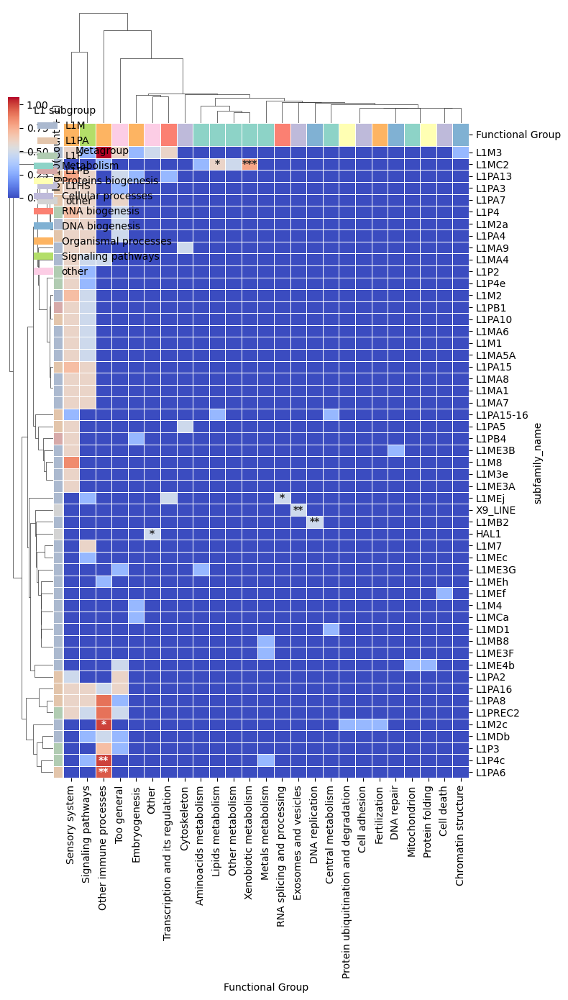

Success: Clustermap with dual-color annotations and enrichment stars saved to plots/GO_functional_groups_clustermap_top5_perc_by_L1_subfamilies.svg


In [88]:

# Palette extracted from L1 subgroup name image
l1_subgroup_palette = {
    "L1M": "#abb9cf",   # Muted Blue-Grey
    "L1PA": "#e3c5ab",  # Pale Peach
    "L1P": "#b1ccb2",   # Soft Sage Green
    "L1PB": "#d7aaa9",  # Dusty Rose
    "L1HS": "#c1bfd8",   # Light Lavender
    "other": "lightgrey"
}


# --- 2. Data Preparation ---
subfamily_to_subgroup = counts_by_group[['subgroup_name', 'subfamily_name']].value_counts().reset_index().set_index('subfamily_name')['subgroup_name'].to_dict()


# Pivot the data
pivot_counts = counts_by_group.pivot(
    index="subfamily_name", columns="Functional Group", values="count"
).fillna(0)

# 2.1 Calculate Statistical Enrichment (Fisher's Exact Test)
# Contingency table for each cell (i, j):
# [ [count(i,j),         row_sum(i) - count(i,j)],
#   [col_sum(j) - count(i,j), total - row_sum(i) - col_sum(j) + count(i,j)] ]

total_n = pivot_counts.values.sum()
row_sums = pivot_counts.sum(axis=1)
col_sums = pivot_counts.sum(axis=0)

p_values_raw = pd.DataFrame(index=pivot_counts.index, columns=pivot_counts.columns)

for r_name in pivot_counts.index:
    for c_name in pivot_counts.columns:
        a = pivot_counts.loc[r_name, c_name]
        b = row_sums[r_name] - a
        c = col_sums[c_name] - a
        d = total_n - (a + b + c)

        # Test for enrichment (alternative='greater')
        _, p = fisher_exact([[a, b], [c, d]], alternative="greater")
        p_values_raw.loc[r_name, c_name] = p

# Flatten and correct using FDR (Benjamini-Hochberg)
p_flat = p_values_raw.values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method="fdr_bh")
p_adj_matrix = pd.DataFrame(
    p_adj_flat.reshape(p_values_raw.shape),
    index=pivot_counts.index,
    columns=pivot_counts.columns,
)


# 2.2 Create significance star annotations
def get_stars(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""


star_matrix = p_adj_matrix.applymap(get_stars)

# Apply log scaling for heatmap visualization
log_data = np.log10(pivot_counts + 1)

# A) Row Colors (Classes)
row_colors = pivot_counts.index.map(subfamily_to_subgroup).map(l1_subgroup_palette)

# B) Column Colors (Metagroups)
group_to_meta = {}
for meta, groups in functional_metagroups.items():
    for g in groups:
        group_to_meta[g] = meta

unique_metagroups = list(functional_metagroups.keys())
meta_palette = dict(
    zip(unique_metagroups, sns.color_palette("Set3", len(unique_metagroups)))
)

col_colors = pd.Series(pivot_counts.columns).map(group_to_meta).map(meta_palette)
col_colors.index = pivot_counts.columns

# --- 3. Plotting the Clustermap ---

plt.rcParams["svg.fonttype"] = "none"

g = sns.clustermap(
    log_data,
    cmap="coolwarm",
    row_colors=row_colors,
    col_colors=col_colors,
    linewidths=0.5,
    figsize=(8, 14),
    row_cluster=True,
    col_cluster=True,
    cbar_kws={"label": "log10(Count + 1)"},
    dendrogram_ratio=(0.1, 0.15),
    cbar_pos=(0.02, 0.8, 0.02, 0.1),
    # Add the significance stars
    annot=star_matrix,
    fmt="",  # Use empty fmt because data is string
    annot_kws={"size": 10, "weight": "bold"},
    colors_ratio=(0.02, 0.03),
)

# Rotate labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# Add legends for row/col colors
from matplotlib.patches import Patch

row_legend = [Patch(facecolor=c, label=l) for l, c in l1_subgroup_palette.items()]
col_legend = [Patch(facecolor=c, label=l) for l, c in meta_palette.items()]

l1 = plt.legend(
    handles=row_legend,
    title="L1 subgroup",
    bbox_to_anchor=(1.45, 1),
    loc="upper left",
    frameon=False,
)
plt.gca().add_artist(l1)
plt.legend(
    handles=col_legend,
    title="Metagroup",
    bbox_to_anchor=(1.45, 0.6),
    loc="upper left",
    frameon=False,
)

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/GO_functional_groups_clustermap_top5_perc_by_L1_subfamilies.svg"

g.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Clustermap with dual-color annotations and enrichment stars saved to {save_path}"
)

#### GO terms functional groups network

In [92]:
top_5_perc_genes_by_subfamilies

,Unnamed: 0.1,Unnamed: 0,Term ID,Term Name,Term Database,P-value,FDR,Fold Enrichment,Overlap Count,Total Term Genes (Human),Overlapping Genes,Full Term Gene List,subfamily_name,class_name,GO Term Name,Functional Group,Unnamed: 2,Unnamed: 3,Unnamed: 4,subgroup_name
403,0,0,GO:0006607,NLS-bearing protein import into nucleus,BP,3.259345e-09,0.000061,14.254175,9,19,"['KPNA1', 'NUP54', 'RANBP2', 'RGPD1', 'RGPD2',...","['CBLB', 'IPO5', 'KPNA1', 'KPNA2', 'KPNA3', 'K...",HAL1,LINE,NLS-bearing protein import into nucleus,Other,NaN,NLS-bearing protein import into nucleus,Match,other
404,1,1,GO:0051168,nuclear export,BP,3.384417e-06,0.031722,10.030716,7,21,"['RANBP2', 'RGPD1', 'RGPD2', 'RGPD3', 'RGPD4',...","['ATXN1', 'CDKN1B', 'EIF4E', 'EIF4ENIF1', 'HNR...",HAL1,LINE,nuclear export,Other,NaN,nuclear export,Match,other
411,0,0,GO:0007608,sensory perception of smell,BP,1.945884e-10,0.000001,4.225244,28,427,"['B2M', 'OR10H1', 'OR10H4', 'OR13G1', 'OR13H1'...","['ADCY3', 'ANO9', 'B2M', 'BBS1', 'BBS4', 'BEST...",L1M1,LINE,sensory perception of smell,Sensory system,NaN,sensory perception of smell,Match,L1M
412,1,1,GO:0050911,detection of chemical stimulus involved in sen...,BP,1.946932e-10,0.000001,4.371217,27,398,"['OR10H1', 'OR10H4', 'OR13G1', 'OR13H1', 'OR14...","['CNGB1', 'GPR148', 'OR10A2', 'OR10A3', 'OR10A...",L1M1,LINE,detection of chemical stimulus involved in sen...,Sensory system,NaN,detection of chemical stimulus involved in sen...,Match,L1M
413,2,3,GO:0004984,olfactory receptor activity,MF,1.740263e-10,0.000001,4.393294,27,396,"['OR10H1', 'OR10H4', 'OR13G1', 'OR13H1', 'OR14...","['GPR148', 'OR10A2', 'OR10A3', 'OR10A4', 'OR10...",L1M1,LINE,olfactory receptor activity,Sensory system,NaN,olfactory receptor activity,Match,L1M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
713,11,11,GO:0005126,cytokine receptor binding,MF,1.718158e-05,0.026840,10.712475,6,32,"['IFNA10', 'IFNA14', 'IFNA16', 'IFNA17', 'IFNA...","['CISH', 'DDT', 'IFNA1', 'IFNA10', 'IFNA14', '...",L1PREC2,LINE,cytokine receptor binding,Other immune processes,NaN,cytokine receptor binding,Match,L1P
714,12,6,GO:0043330,response to exogenous dsRNA,BP,2.475493e-05,0.035697,10.082330,6,34,"['IFNA10', 'IFNA14', 'IFNA16', 'IFNA17', 'IFNA...","['CARD9', 'DDX1', 'DDX21', 'DHX36', 'IFNA1', '...",L1PREC2,LINE,response to exogenous dsRNA,Other immune processes,NaN,response to exogenous dsRNA,Match,L1P
715,13,7,GO:0098586,cellular response to virus,BP,6.679987e-05,0.089445,5.859815,8,78,"['ADAR', 'IFNA10', 'IFNA14', 'IFNA16', 'IFNA17...","['ADAR', 'ARF1', 'ATF2', 'BAX', 'CALR', 'CCL19...",L1PREC2,LINE,cellular response to virus,Other immune processes,NaN,cellular response to virus,Match,L1P
1229,0,0,GO:0160063,multi-pass transmembrane protein insertion int...,BP,5.225858e-07,0.004898,177.395062,3,9,"['NOMO1', 'NOMO2', 'NOMO3']","['CCDC47', 'NCLN', 'NOMO1', 'NOMO2', 'NOMO3', ...",X9_LINE,LINE,multi-pass transmembrane protein insertion int...,Exosomes and vesicles,NaN,multi-pass transmembrane protein insertion int...,Match,other


Calculating hierarchical network layout...
Optimizing label placement...


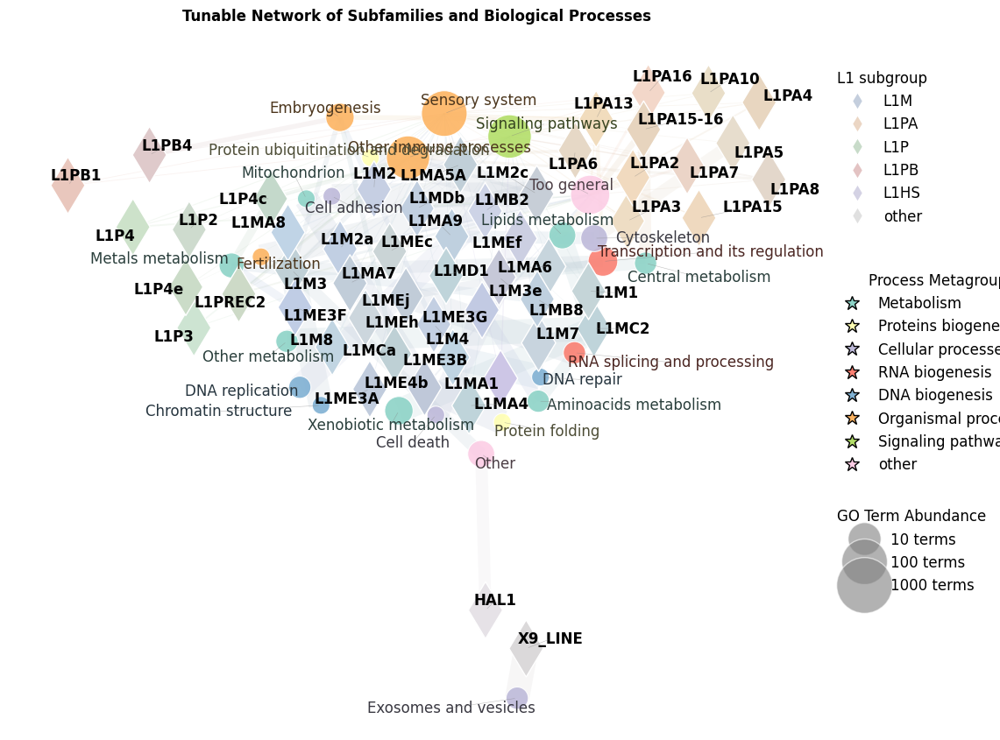

Success: Refactored network with high-contrast functional labels and size legend saved to plots/TE_GO_L1_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg


In [96]:
GLOBAL_FONT_SIZE = 12

# Hierarchy Toggle
SHOW_METAGROUP_STARS = (
    False  # True: Show stars and connections; False: Only show functional circles
)


# Layout Dynamics
LAYOUT_K_FACTOR = 0.2  # Higher = stronger repulsion between all nodes
LAYOUT_ITERATIONS = 250  # More iterations for a more stable physics state
LAYOUT_SEED = 42
JITTER_STRENGTH = 0.08  # Randomness added to node positions to break geometric patterns

# Clustering Strength
# Lower this value if subfamilies of the same class are too tightly packed
CLASS_GROUPING_WEIGHT = 112.5

# Color Customization (REFACTORED: Now Parametrizable)
USE_COLOR_JITTER = True  # Toggle unique shades for subfamilies of the same class
COLOR_JITTER_AMOUNT = 0.05  # Intensity of the color shift (0.0 to 1.0)
# NEW: Controls how much lighter subfamily rhomboids are (0.0 = original, 1.0 = white)
SUBFAMILY_LIGHTNESS_FACTOR = 0.3

# Node Sizes (Area-based)
METAGROUP_STAR_SIZE = 2000
FUNCTIONAL_CIRCLE_SCALE = 700  # Multiplier for log-proportional sizing
SUBFAMILY_RHOMBOID_SIZE = 1100

# Edge Visuals
META_GROUP_EDGE_WIDTH = 2.0
META_GROUP_ALPHA = 0.15
SUBFAM_GROUP_WIDTH_SCALE = 20.0  # Multiplier for fraction-based widths
SUBFAM_GROUP_ALPHA = 0.22

# Collision & Overlap Management (Physics refinement)
COLLISION_MIN_DIST = 0.3  # Overlap penalty (multiplier for node radii sum)
COLLISION_ITERATIONS = 120  # Intensity of the post-layout relaxation step
NODE_RADIUS_DIVISOR = 250  # Maps area-based sizes into coordinate units

# --- 2. Helper Functions ---


def lighten_color(color, amount=0.3):
    """
    Lightens a color by blending it with white for better contrast with black labels.
    """
    try:
        rgb = np.array(mcolors.to_rgb(color))
        # Move RGB values towards white (1, 1, 1)
        light_rgb = rgb + (np.array([1, 1, 1]) - rgb) * amount
        return mcolors.to_hex(np.clip(light_rgb, 0, 1))
    except:
        return color


def darken_color(color, amount=0.3):
    """Slightly darkens a color (hex or RGB) for better label contrast."""
    try:
        rgb = np.array(mcolors.to_rgb(color))
        dark_rgb = np.clip(rgb * (1 - amount), 0, 1)
        return mcolors.to_hex(dark_rgb)
    except:
        return color


def get_jittered_color(hex_color, seed_name, amount=0.18):
    """Perturbs RGB values based on seed for intra-class subfamily differentiation."""
    try:
        rgb = np.array(mcolors.to_rgb(hex_color))
        rng = np.random.default_rng(sum(ord(c) for c in seed_name))
        jitter = rng.uniform(-amount, amount, 3)
        return mcolors.to_hex(np.clip(rgb + jitter, 0, 1))
    except:
        return hex_color


def prevent_collisions(pos, node_sizes, iterations, min_dist_factor, jitter):
    """Manually relaxes node positions to prevent 3+ nodes from overlapping."""
    new_pos = {n: np.array(p) for n, p in pos.items()}
    nodes = list(new_pos.keys())
    radii = {n: np.sqrt(node_sizes[n]) / NODE_RADIUS_DIVISOR for n in nodes}

    for _ in range(iterations):
        if jitter > 0:
            for n in nodes:
                new_pos[n] += np.random.normal(0, jitter * 0.05, 2)
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                n1, n2 = nodes[i], nodes[j]
                vec = new_pos[n1] - new_pos[n2]
                dist = np.linalg.norm(vec)
                target_dist = (radii[n1] + radii[n2]) * min_dist_factor
                if dist < target_dist and dist > 0:
                    push = (target_dist - dist) / dist * 0.5 * vec
                    new_pos[n1] += push
                    new_pos[n2] -= push
                elif dist == 0:
                    new_pos[n1] += np.random.normal(0, 0.05, 2)
    return new_pos


# --- 3. Data Processing & Graph Building ---

group_to_meta = {g: m for m, groups in functional_metagroups.items() for g in groups}
G = nx.Graph()

# Group totals for normalization
group_totals = counts_by_group.groupby("Functional Group")["count"].sum().to_dict()

# Add Metagroup Nodes (Stars) - Optional based on flag
if SHOW_METAGROUP_STARS:
    for meta, color in metagroup_palette.items():
        G.add_node(meta, type="meta", color=color, label=meta, size=METAGROUP_STAR_SIZE)

# Process Rows
subfam_colors = {}
for _, row in counts_by_group.iterrows():
    subfam = row["subfamily_name"]
    group = row["Functional Group"]
    cls = row["subgroup_name"]
    val = row["count"]
    if val == 0:
        continue

    if subfam not in G:
        base_color = l1_subgroup_palette.get(cls, "#808080")
        if USE_COLOR_JITTER:
            final_color = get_jittered_color(
                base_color, subfam, amount=COLOR_JITTER_AMOUNT
            )
        else:
            final_color = base_color

        # NEW: Apply lightness adjustment for text contrast
        subfam_colors[subfam] = lighten_color(
            final_color, amount=SUBFAMILY_LIGHTNESS_FACTOR
        )

        G.add_node(
            subfam,
            type="subfam",
            color=subfam_colors[subfam],
            class_name=cls,
            label=subfam,
            size=SUBFAMILY_RHOMBOID_SIZE,
        )

    if group not in G:
        meta = group_to_meta.get(group, "other")
        meta_color = metagroup_palette.get(meta, "gray")
        g_size = np.log10(group_totals.get(group, 1) + 1) * FUNCTIONAL_CIRCLE_SCALE
        G.add_node(group, type="group", color=meta_color, size=g_size, label=group)

        if SHOW_METAGROUP_STARS:
            G.add_edge(meta, group, weight=10, type="meta_group")

    fraction = val / group_totals[group]
    G.add_edge(subfam, group, weight=fraction, type="subfam_group", raw_count=val)

# --- 4. Layout Generation ---

H = G.copy()
subfam_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
for i in range(len(subfam_nodes)):
    for j in range(i + 1, len(subfam_nodes)):
        n1, n2 = subfam_nodes[i], subfam_nodes[j]
        if G.nodes[n1]["class_name"] == G.nodes[n2]["class_name"]:
            H.add_edge(n1, n2, weight=CLASS_GROUPING_WEIGHT)

print("Calculating hierarchical network layout...")
pos = nx.spring_layout(
    H,
    k=LAYOUT_K_FACTOR / np.sqrt(len(G)),
    iterations=LAYOUT_ITERATIONS,
    seed=LAYOUT_SEED,
    weight="weight",
)

node_sizes_dict = {n: G.nodes[n]["size"] for n in G.nodes}
pos = prevent_collisions(
    pos,
    node_sizes_dict,
    iterations=COLLISION_ITERATIONS,
    min_dist_factor=COLLISION_MIN_DIST,
    jitter=JITTER_STRENGTH,
)

# --- 5. Visualization ---

fig, ax = plt.subplots(figsize=(12, 10))
ax.axis("off")

# A) Draw Edges
edges = G.edges(data=True)
for u, v, d in edges:
    if d["type"] == "meta_group":
        if not SHOW_METAGROUP_STARS:
            continue
        width, alpha, color = META_GROUP_EDGE_WIDTH, META_GROUP_ALPHA, "gray"
    else:
        width = d["weight"] * SUBFAM_GROUP_WIDTH_SCALE
        alpha = SUBFAM_GROUP_ALPHA
        color = (
            G.nodes[u]["color"]
            if G.nodes[u]["type"] == "subfam"
            else G.nodes[v]["color"]
        )
    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)], width=width, edge_color=color, alpha=alpha, ax=ax
    )

# B) Nodes
if SHOW_METAGROUP_STARS:
    meta_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "meta"]
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=meta_nodes,
        node_shape="*",
        node_size=METAGROUP_STAR_SIZE,
        node_color=[G.nodes[n]["color"] for n in meta_nodes],
        edgecolors="black",
        linewidths=0.6,
        ax=ax,
    )

group_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "group"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=group_nodes,
    node_shape="o",
    node_size=[G.nodes[n]["size"] for n in group_nodes],
    node_color=[G.nodes[n]["color"] for n in group_nodes],
    edgecolors="white",
    linewidths=0.8,
    alpha=0.9,
    ax=ax,
)

subf_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subfam"]
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=subf_nodes,
    node_shape="d",
    node_size=SUBFAMILY_RHOMBOID_SIZE,
    node_color=[G.nodes[n]["color"] for n in subf_nodes],
    edgecolors="white",
    linewidths=1.0,
    ax=ax,
)

# C) Labels
texts = []
for node, (x, y) in pos.items():
    d = G.nodes[node]
    weight = "bold" if d["type"] != "group" else "normal"

    if d["type"] == "group":
        label_color = darken_color(d["color"], amount=0.7)
    elif d["type"] == "subfam":
        label_color = "black"
    else:  # Meta
        if not SHOW_METAGROUP_STARS:
            continue
        label_color = "black"

    texts.append(
        ax.text(
            x,
            y,
            d["label"],
            fontsize=GLOBAL_FONT_SIZE,
            fontweight=weight,
            color=label_color,
            ha="center",
            va="center",
        )
    )

print("Optimizing label placement...")
adjust_text(
    texts,
    ax=ax,
    expand_points=(1.8, 1.8),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.4, alpha=0.5),
)

# --- 6. Legends ---
# Use lightened colors in the legend for visual consistency
row_legend = [
    Line2D(
        [0],
        [0],
        marker="d",
        color="w",
        label=l,
        markerfacecolor=lighten_color(c, SUBFAMILY_LIGHTNESS_FACTOR),
        markersize=10,
    )
    for l, c in l1_subgroup_palette.items()
]

meta_legend = [
    Line2D(
        [0],
        [0],
        marker="*",
        color="w",
        label=l,
        markerfacecolor=c,
        markersize=12,
        markeredgecolor="k",
    )
    for l, c in metagroup_palette.items()
]

size_counts = [10, 100, 1000]
size_legend = []
for count in size_counts:
    area = np.log10(count + 1) * FUNCTIONAL_CIRCLE_SCALE
    m_size = np.sqrt(area)
    size_legend.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            label=f"{count} terms",
            markerfacecolor="gray",
            markersize=m_size,
            alpha=0.6,
        )
    )

leg1 = ax.legend(
    handles=row_legend,
    title="L1 subgroup",
    loc="upper left",
    bbox_to_anchor=(1, 1),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg1)
leg2 = plt.legend(
    handles=meta_legend,
    title="Process Metagroup",
    loc="upper left",
    bbox_to_anchor=(1, 0.7),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)
ax.add_artist(leg2)
plt.legend(
    handles=size_legend,
    title="GO Term Abundance",
    loc="upper left",
    bbox_to_anchor=(1, 0.35),
    frameon=False,
    title_fontsize=GLOBAL_FONT_SIZE,
    fontsize=GLOBAL_FONT_SIZE,
)

plt.title(
    f"Tunable Network of Subfamilies and Biological Processes",
    fontsize=GLOBAL_FONT_SIZE,
    weight="bold",
    pad=30,
)

# --- 7. Saving ---
os.makedirs("plots", exist_ok=True)
save_path = (
    "plots/TE_GO_L1_Process_Group_Hierarchical_Network_Refined_Subfamilies.svg"
)
plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")
plt.show()

print(
    f"Success: Refactored network with high-contrast functional labels and size legend saved to {save_path}"
)

#### Correlation of GO terms number to divergence and degree of enrichment in L1 subfamilies

In [97]:
enrichment_df_subfamilies

,subfamily_name,subfamily_name.1,class_name,Observed_TEs_number,Total_TEs_number,Observed_Odds_Ratio,Enrichment_p_value,Enrichment_p_value_adjusted,Average_divergence_genes,Average_divergence_all,...,p_raw_empirical,p_raw_empirical_clamped,p_adjusted_empirical_bh,Status,OR_Observed_to_Random,OR_Observed_to_Random_Log,Enrichment_p_value_adjusted_log,Average_length,family_name,GO_terms_count
subfamily_name,,,,,,,,,,,,,,,,,,,,,
L1MC3,L1MC3,L1MC3,LINE,1035,6404,2.014630,7.501252e-81,1.158639e-79,185.888889,192.773111,...,0.000,0.003992,0.010707,Significant,0.664199,-0.177702,-78.936052,8114.222829,L1,NaN
LTR60B,LTR60B,LTR60B,LTR,19,201,1.091013,7.071403e-01,7.756827e-01,197.157895,188.019900,...,0.260,0.260000,0.369627,Non-Significant,0.656729,-0.182614,-0.110316,895.686567,ERV1,NaN
MER34C_v,MER34C_v,MER34C_v,LTR,26,420,0.689643,6.901651e-02,1.117364e-01,162.807692,166.088095,...,0.000,0.003992,0.010707,Significant,0.411405,-0.385730,-0.951805,892.454762,ERV1,NaN
MSTA1,MSTA1,MSTA1,LTR,20,502,0.433641,4.901459e-05,1.333897e-04,169.150000,171.511952,...,0.000,0.003992,0.010707,Significant,0.273644,-0.562813,-3.874878,587.398406,ERVL-MaLR,NaN
MER4A1,MER4A1,MER4A1,LTR,202,1778,1.339500,1.529894e-04,3.983300e-04,103.757426,106.416760,...,0.024,0.024000,0.052351,Non-Significant,0.778783,-0.108583,-3.399757,1364.835208,ERV1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HERV1_I,HERV1_I,HERV1_I,LTR,3,12,3.483584,8.061874e-02,1.285177e-01,128.000000,168.166667,...,0.584,0.584000,0.688157,Non-Significant,NaN,NaN,-0.891037,8820.416667,ERV1,NaN
HERV1_LTRe,HERV1_LTRe,HERV1_LTRe,LTR,0,18,0.000000,3.970970e-01,4.875208e-01,NaN,143.500000,...,0.348,0.348000,0.465766,Non-Significant,0.000000,-inf,-0.312007,1056.388889,ERV1,NaN
HERV1_LTRb,HERV1_LTRb,HERV1_LTRb,LTR,6,8,31.352255,1.063244e-05,3.108154e-05,66.000000,89.750000,...,0.016,0.016000,0.037095,Significant,NaN,NaN,-4.507497,3000.500000,ERV1,NaN


/tmp/ipykernel_129/2625865116.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_to_plot["subgroup_name"] = "other"
/tmp/ipykernel_129/2625865116.py:13: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment i

-0.28478955688765917 0.04977327506069058
Plot saved to ./plots/GO_terms_count_vs_Average_divergence_all_LINE_L1_sizes_adjusted.svg


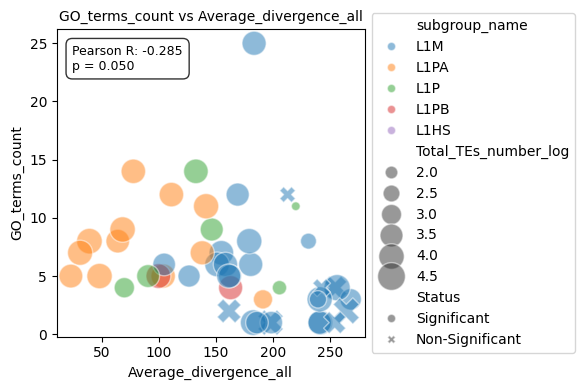

In [103]:
column1 = "Average_divergence_all"
column2 = "GO_terms_count"

class_name = "LINE"
family_name = "L1"
data_to_plot = enrichment_df_subfamilies[
    (enrichment_df_subfamilies["class_name"] == class_name)
    & (enrichment_df_subfamilies["family_name"] == family_name)
    & (enrichment_df_subfamilies["Average_length"] >= 5600)
]#.fillna(0)

data_to_plot["subgroup_name"] = "other"
data_to_plot["subgroup_name"][data_to_plot["subfamily_name"] == "L1HS"] = "L1HS"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1P")
] = "L1P"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1PA")
] = "L1PA"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1PB")
] = "L1PB"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1M")
] = "L1M"


fig, ax = plt.subplots(figsize=(7, 4))
data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
corr_data = data_to_plot.dropna(subset=[column1, column2])

# Calculate Pearson correlation
if len(corr_data) > 2:
    corr_result = stats.pearsonr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Pearson R: N/A\nInsufficient Data"

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="subgroup_name",
    x=column1,
    y=column2,
    #    palette=class_names_p,
    style="Status",
    style_order=["Significant", "Non-Significant"],
    size="Total_TEs_number_log",
    sizes=(40, 400),  # Range of point sizes
    ax=ax,
    alpha=0.5,
)
ax.text(
    0.05,
    0.95,  # Position: 5% from left, 95% from bottom
    stats_text,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
)


# --- 8. Tidy Up and Save ---
# --- NEW: Manual Legend Construction for Integer Size Values ---
handles, labels = ax.get_legend_handles_labels()

# Indices to identify segments of the legend
try:
    hue_title_idx = labels.index("OR_Observed_to_Random")
except ValueError:
    hue_title_idx = -1

try:
    size_title_idx = labels.index("Total_TEs_number_log")
except ValueError:
    size_title_idx = -1

if False:
    new_handles = []
    new_labels = []

    # 1. Preserve the Color (Hue) section
    if hue_title_idx != -1:
        # Get labels until the next title (size_title_idx)
        end_hue = size_title_idx if size_title_idx > hue_title_idx else len(labels)
        new_handles.extend(handles[hue_title_idx:end_hue])
        new_labels.extend(labels[hue_title_idx:end_hue])

    # 2. Build Custom Integer Size Section
    if size_title_idx != -1:
        # Add title for the size section
        new_handles.append(
            plt.Line2D([0], [0], color="w", label="Total_TEs_number_log")
        )
        new_labels.append("Total_TEs_number_log")

        # Determine the integer range for the copy count logs
        val_min = int(np.floor(data_to_plot["Total_TEs_number_log"].min()))
        val_max = int(np.ceil(data_to_plot["Total_TEs_number_log"].max()))
        integer_vals = np.arange(val_min, val_max + 1)

        # Map these values to marker sizes manually using the same logic as Seaborn/Matplotlib
        # Mapping uses area (points^2) linearly: sizes=(40, 400)
        data_min = data_to_plot["Total_TEs_number_log"].min()
        data_max = data_to_plot["Total_TEs_number_log"].max()
        s_min, s_max = 40, 400

        for val in integer_vals:
            # Linear area interpolation
            if data_max != data_min:
                size_area = s_min + (val - data_min) / (data_max - data_min) * (
                    s_max - s_min
                )
            else:
                size_area = s_min

            # Matplotlib markersize is sqrt of the area
            m_size = np.sqrt(size_area)

            new_handles.append(
                plt.Line2D(
                    [0],
                    [0],
                    marker="o",
                    color="w",
                    markerfacecolor="gray",
                    markersize=m_size,
                    alpha=0.6,
                    markeredgecolor="black",
                    markeredgewidth=0.5,
                )
            )
            new_labels.append(str(val))

    # Apply the manually reconstructed legend
    ax.legend(
        new_handles,
        new_labels,
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        borderaxespad=0.0,
        frameon=False,
    )
else:
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title(f"{column2} vs {column1}", fontsize=10)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = (
    f"./plots/{column2}_vs_{column1}_{class_name}_{family_name}_sizes_adjusted.svg"
)
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

0.04977327506069058


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


Success: Sized and colored scatterplot saved to ./plots/GO_terms_count_vs_Average_divergence_all_LINE_labeled_sized.svg


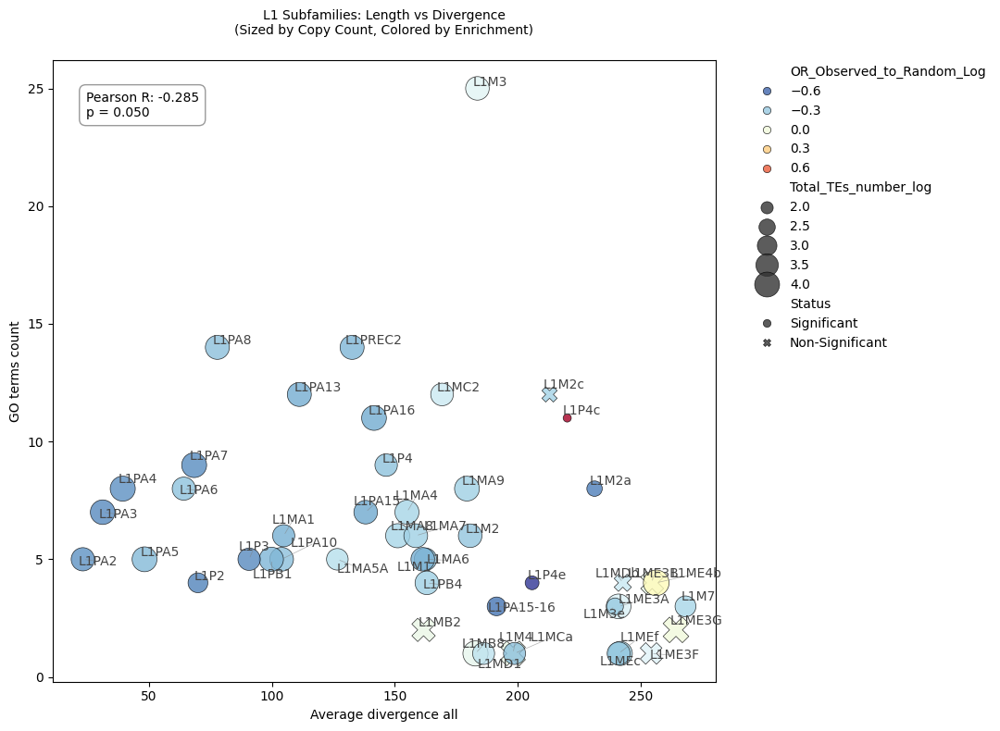

In [7]:
column1 = "Average_divergence_all"
column2 = "GO_terms_count"
class_name_filter = "LINE"

# Filtering based on requirements
data_to_plot = enrichment_df_subfamilies[
    (enrichment_df_subfamilies["class_name"] == class_name_filter)
    & (enrichment_df_subfamilies["Average_length"] >= 5600)
].copy()

data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
# Ensure we have all necessary columns for the mappings
cols_required = [
    column1,
    column2,
    "Total_TEs_number_log",
    "OR_Observed_to_Random_Log",
    "subfamily_name",
]
data_to_plot = data_to_plot.dropna(subset=cols_required)

# Calculate Pearson correlation
if len(data_to_plot) > 2:
    corr_result = stats.pearsonr(data_to_plot[column1], data_to_plot[column2])
    corr_r, corr_p = corr_result.statistic, corr_result.pvalue
    print(corr_p)
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"
    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"
else:
    stats_text = "Pearson R: N/A\nInsufficient Data"

# --- 3. Visualization ---
fig, ax = plt.subplots(figsize=(13, 8))

# Draw the scatterplot
# size: proportional to Total_TEs_number_log
# hue: mapped to OR_Observed_to_Random with a blue-to-red rainbow colormap (RdYlBu_r)
scatter = sns.scatterplot(
    data=data_to_plot,
    x=column1,
    y=column2,
    size="Total_TEs_number_log",
    sizes=(40, 400),  # Range of point sizes
    hue="OR_Observed_to_Random_Log",
    style="Status",
    style_order=["Significant", "Non-Significant"],
    palette="RdYlBu_r",  # Blue (low) to Red (high) rainbow transition
    alpha=0.8,
    edgecolor="black",
    linewidth=0.5,
    ax=ax,
)

# Add the statistics textbox
ax.text(
    0.05,
    0.95,
    stats_text,
    transform=ax.transAxes,
    fontsize=10,
    verticalalignment="top",
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8, edgecolor="gray"),
    zorder=5,
)

# --- 4. Automated Labeling with adjustText ---

# CONFIGURATION: Add the subfamilies you want to highlight here
subfamilies_to_highlight = []

texts = []
for i, row in data_to_plot.iterrows():
    name = row["subfamily_name"]

    # Check if this subfamily should be bold
    is_highlighted = name in subfamilies_to_highlight
    weight = "bold" if is_highlighted else "normal"
    size = 11 if is_highlighted else 10

    # Create text objects for each point
    texts.append(
        ax.text(
            row[column1],
            row[column2],
            name,
            fontsize=size,
            weight=weight,
            color="black" if is_highlighted else "#444444",
            zorder=10,
        )
    )

# Use adjust_text to repel labels and draw connecting lines
# --- IMPROVED: Repel labels further to avoid overlapping ---
adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.5, alpha=0.6),
    # Increase expansion factors to push labels further from points and each other
    expand_points=(1000, 1000),
    expand_text=(1000, 1000),
    # Stronger repulsion forces
    force_points=1000,
    force_text=1000,
    # Allow movement in all directions and increase iterations
    lim=100000,
)

# --- 5. Tidy Up and Save ---
# Place legends outside the plot
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0, frameon=False)

ax.set_title(
    f"L1 Subfamilies: Length vs Divergence\n(Sized by Copy Count, Colored by Enrichment)",
    fontsize=10,
    pad=20,
)
ax.set_xlabel(column1.replace("_", " "), fontsize=10)
ax.set_ylabel(column2.replace("_", " "), fontsize=10)

plt.tight_layout(rect=[0, 0, 0.85, 1])

# Save to SVG
save_dir = "./plots"
os.makedirs(save_dir, exist_ok=True)
save_path = f"{save_dir}/{column2}_vs_{column1}_{class_name_filter}_labeled_sized.svg"
fig.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

print(f"Success: Sized and colored scatterplot saved to {save_path}")
plt.show()

/tmp/ipykernel_129/2832519691.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_to_plot["subgroup_name"] = "other"
/tmp/ipykernel_129/2832519691.py:16: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment i

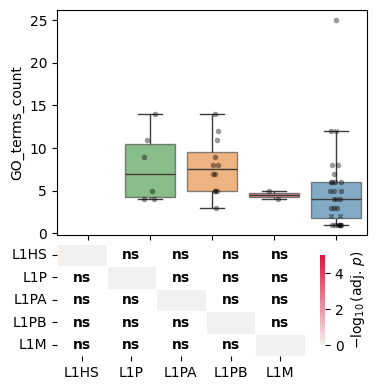

Success: Adjusted significance plot saved to ./plots/boxplot_with_matrix_GO_terms_count_subgroup_name_LINE_L1_subgroups.svg


In [108]:
# sns.set_theme(style="ticks")
plt.rcParams["svg.fonttype"] = "none"

x_name = "subgroup_name"
y_name = "GO_terms_count"

class_name = "LINE"
family_name = "L1"
data_to_plot = enrichment_df_subfamilies[
    (enrichment_df_subfamilies["class_name"] == class_name)
    & (enrichment_df_subfamilies["family_name"] == family_name)
    & (enrichment_df_subfamilies["Average_length"] >= 5600)
]

data_to_plot["subgroup_name"] = "other"
data_to_plot["subgroup_name"][data_to_plot["subfamily_name"] == "L1HS"] = "L1HS"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1P")
] = "L1P"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1PA")
] = "L1PA"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1PB")
] = "L1PB"
data_to_plot["subgroup_name"][
    data_to_plot["subfamily_name"].str.startswith("L1M")
] = "L1M"


data_to_plot.replace([np.inf, -np.inf], np.nan, inplace=True)
data_to_plot = data_to_plot.dropna(subset=[x_name, y_name])

plot_order = ["L1HS", "L1P", "L1PA", "L1PB", "L1M"]

# --- 2. Calculate All-vs-All Statistics with BH Correction ---
# Generate every unique pair
box_pairs = list(itertools.combinations(plot_order, 2))
pair_results = []

for g1, g2 in box_pairs:
    d1 = data_to_plot[data_to_plot[x_name] == g1][y_name]
    d2 = data_to_plot[data_to_plot[x_name] == g2][y_name]
    _, p = stats.mannwhitneyu(d1, d2)
    pair_results.append({"g1": g1, "g2": g2, "p_raw": p})

# Perform Benjamini-Hochberg adjustment
raw_p_values = [res["p_raw"] for res in pair_results]
_, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")

# Construct the adjusted p-value matrix
p_matrix_adj = pd.DataFrame(index=plot_order, columns=plot_order, dtype=float)
np.fill_diagonal(p_matrix_adj.values, 1.0)

for i, res in enumerate(pair_results):
    g1, g2 = res["g1"], res["g2"]
    p_adj = adj_p_values[i]
    p_matrix_adj.loc[g1, g2] = p_adj
    p_matrix_adj.loc[g2, g1] = p_adj

# Apply -log10 transformation for the heatmap colors
neg_log_p = -np.log10(p_matrix_adj.astype(float) + 1e-300)

# --- 3. Visualization ---
# GridSpec: aligned horizontally by using the same column in the grid
fig = plt.figure(figsize=(4, 4.5))
gs = GridSpec(2, 1, height_ratios=[2, 1], hspace=0.05)

ax_box = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# --- A) The Boxplot ---
sns.boxplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    hue=x_name,  # palette=class_names_p,
    boxprops={"alpha": 0.6},
    showfliers=False,
)

# Layer A: Significant points (Circles)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] == "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="o",
    size=4,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# Layer B: Non-Significant points (Xs)
sns.stripplot(
    data=data_to_plot[data_to_plot["Status"] != "Significant"],
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="X",
    size=4,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# ax_box.set_yscale("log")
# ax_box.set_title(f"{y_name} by {x_name}", fontsize=14, pad=10)
# Force more ticks on the log scale
# subs=(0.2, 0.5, 1.0, 2.0, 5.0) adds ticks at e.g. 0.2, 0.5, 1, 2, 5
# ax_box.yaxis.set_major_locator(LogLocator(base=10.0, subs=(0.2, 0.5, 1.0, 2.0, 5.0)))

# Ensure they are labeled as simple scalars (e.g., '0.5' instead of '5e-1')
# ax_box.yaxis.set_major_formatter(ScalarFormatter())
# ax_box.yaxis.set_minor_formatter(plt.NullFormatter()) # Keep it clean

ax_box.set_xlabel("")
ax_box.tick_params(labelbottom=False)

# --- B) The Significance Heatmap (Matrix) ---
cmap = sns.light_palette("crimson", as_cmap=True)
# square=False ensures it spans the same horizontal width as the boxplot
sns.heatmap(
    neg_log_p,
    ax=ax_heat,
    cmap=cmap,
    cbar=True,
    annot=False,
    square=False,
    linewidths=0.5,
    linecolor="white",
    vmin=0,
    vmax=5,
    cbar_kws={"label": r"$-\log_{10}(\text{adj. } p)$", "shrink": 0.8},
)

# Add Stars/ns as annotations inside the heatmap cells (using adjusted p)
for i in range(len(plot_order)):
    for j in range(len(plot_order)):
        p_adj = p_matrix_adj.iloc[i, j]
        if i == j:
            text = ""
        elif p_adj < 0.001:
            text = "***"
        elif p_adj < 0.01:
            text = "**"
        elif p_adj < 0.05:
            text = "*"
        else:
            text = "ns"
        ax_heat.text(
            j + 0.5,
            i + 0.5,
            text,
            ha="center",
            va="center",
            fontsize=10,
            weight="bold",
            color="white" if p_adj < 0.01 else "black",
        )

# ax_heat.set_title("Pairwise Significance Matrix (Mann-Whitney U + BH FDR)", fontsize=12)

# --- 4. Tidy Up and Save ---
save_path = f"./plots/boxplot_with_matrix_{y_name}_{x_name}_{class_name}_{family_name}_subgroups.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print(f"Success: Adjusted significance plot saved to {save_path}")

# Random control over shuffled TEs coordinates, refer to the bed files notebook